# <center> 14MBID .- Trabajo de Fin de Master <center>
## <center> Desarrollo de un modelo predictivo en base a sintomatología de salud mental que derivan en ansiedad y depresión <center>
###   <center> (Segunda Parte .- Análisis Exploratorio y Evaluación de Modelos) <center>
###   <center> (Enfermedad: Depresión) <center>
### <center> Autor: Ricardo Marrero Carrión <center>

### Indice
<ol>
<li>Librerias a Utilizar y Comprobaciones Iniciales</li>
<li>Funciones del modelo</li>
<li>Introducción</li>
<li>Carga de los Datasets</li>
<li>Análisis Exploratorio</li>
<li>Minería de Datos</li>
</ol>

### 1.- Librerías a Utilizar y comprobaciones iniciales

In [1]:
#Librerías de uso general
from datetime import datetime
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

# Funcionalidades de scikit-learn
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, recall_score, confusion_matrix
from sklearn.linear_model import LogisticRegressionCV, SGDClassifier, LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, StackingClassifier
from sklearn.svm import NuSVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

# Carga de funciones adicionales
%reload_ext autoreload
%autoreload 2
import analisis_modelos as pf
import inspect
from IPython.display import Markdown, display

# Método de balanceo de clases
from imblearn.over_sampling import SMOTE

#Deshabilitar mensajes de advertencia al usuario
import warnings
warnings.filterwarnings('ignore')

#Constantes
rmst = 123
crossval = 5

In [2]:
inicio = datetime.now()
print("Fecha y hora de inicio =", inicio)

Fecha y hora de inicio = 2022-09-03 00:58:15.497625


### 2.- Funciones del Modelo

Las funciones utilizadas en el modelo, son importadas de un fichero .py llamado analisis_modelos.py

### 3.- Introducción

Una vez finalizada las fases de Limpieza de Datos, Transformaciones y Selecciones de Variables Significativas, se procede a realizar el análisis exploratorio de los conjuntos de datos resultantes y al evaluación de los algoritmos de Machine Learning, para seleccionar el modelo óptimo que busca el Dominio de este proceso. Haciendo un estudio individual para la Ansiedad y la Depresión.

Debido a que el conjunto de datos posee las etiquetas o clases que queremos clasificar, se analizarán varios métodos de Aprendizaje Supervisado. Y como referencia a estudios previos, se tomarán de base los ya utilizados por Arkaprabha Saua e Ishita Bhakta, publicado en su artículo [Screening of anxiety and depression among seafarers using machine learning technology](https://doi.org/10.1016/j.imu.2019.100228).

Los algoritmos de clasificación a analizar en este TFM son:

* __Modelos lineales:__ Regresión Logística y Stochastic Gradient Descent - SGD.
* __Modelos de Combinación de métodos (ensembles):__ Random Forest, Extra Trees, Xgboost y Catboost.
* __Modelo de Arbol de Decisión.__
* __Modelo de Support Vector Machine (SVM).__
* __Modelo basado en el algoritmo de Naive Bayes.__

Para la evaluación de los algoritmos, y su posterior comparativa y selección final, se hará uso de las siguientes métricas:

* __Matriz de confusión:__ para medir el rendimiento del modelo en las predicciones de las clases (depresión y ansiedad).
* __Precisión (Accuracy):__ porcentaje total de valores correctamente clasificados.
* __Recall (Sensibilidad) :__ porcentaje valores positivos son correctamente clasificados.
* __Area bajo la curva (AUC):__ relación entre 0 -1 del porcentaje del ratio de prediccción de verdaderos positivos vs. falsos positivos.

Una vez seleccionados los **tres mejores modelos** que ofrecen las mejores métricas, teniendo en cuenta el dominio; se construirá un clasificador que junte los estimadores y resultados individuales, en un solo modelo.

**IMPORTANTE:** Por la extensión del código utilizado, para ilustrar de una forma más clara los pasos ejecutados, se ejecutarán dos Notebook por separado. Uno para la detección de la *Ansiedad* y otro para la detección de la *Depresión.*

### 4.- Carga de los Datasets

In [3]:
#Carga de los conjuntos de datos salida de la fase de selección de variables y análisis de correlaciones

#Depresion
conjunto_datos = pd.read_csv('depresion2020_modelo.csv',index_col= 1)
conjunto_datos = conjunto_datos.drop('Unnamed: 0',axis=1)

### 5.- Análisis Exploratorio

Para proceder a esta fase, se debe recordar el objetivo del TFM, que es buscar patrones en la detección de la Ansiedad y la Depresión.

Estamos ante un problema de *Clasificación de una Clase Conocida* que tiene *dos posibles estados*: no tiene la enfermedad, o si la tiene.

Así que se deben analizar modelos y algoritmos orientados a __Clasificación de Etiquetas Binarias.__

Otro punto a tomar en cuenta en esta fase, es la tendencia de las variables objetivos. Debido a la naturaleza de la encuesta utilizada, y las respuestas ofrecidas por los entrevistados, __tanto la Clase Ansiedad como la Clase Depresión están ampliamente desbalanceadas.__

#### 5.1- Mapeo de las variables objetivos

Los valores actuales de la clase objetivo son:
* 1.- SI tiene la enfermedad.
* 2.- NO tiene la enfermedad.

Al estar en un problema de variables binarias, se cambian dichos valores a:
* 0.- NO tiene la enfermedad.
* 1.- SI tiene la enfermedad.

In [4]:
conjunto_datos['depresion'] = np.where((conjunto_datos['depresion'] == 2),0,1)

In [5]:
# Durante la evaluación de los modelos se encontró que las variables de la enfermedad a 12 meses, introducían
# ruido al modelo, se proceden a eliminar
drop_col = ['depresion_12meses']
conjunto_datos = conjunto_datos.drop(drop_col,axis=1)

In [6]:
# Reset a los índices para evitar errores en la validación cruzada durante la fase de Minería de Datos
conjunto_datos.reset_index(drop = True, inplace = True)

#### 5.2- Balanceo de clases

Para resolver el problema del desbalanceo de la clase objetivo, se ejecutará un *Oversampling* de la clase minoritaria, en este caso "SI tiene la enfermedad". Esta técnica consiste en añadir ejemplos a dicha condición.

Usaremos el algoritmo __SMOTE__, que mediante un sobremuestreo estadístico, añade nuevas instancias a la clase minoritaria, para igualar la cantidad de SI y NO en el conjunto de entrenamiento y test.

Es importante tomar en cuenta que a partir de este momento, el conjunto de datos generados, es el que se debe usar en las siguientes fases.

In [7]:
X = conjunto_datos.drop('depresion', axis=1)
y = conjunto_datos.depresion

In [8]:
print(y.value_counts())

0    19957
1     2115
Name: depresion, dtype: int64


In [9]:
# Técnica de Over-sampling basada en SMOTE
smote = SMOTE(sampling_strategy ='auto' , random_state = rmst)
X_sampling, y_sampling = smote.fit_resample(X, y)

In [10]:
print(y_sampling.value_counts())

0    19957
1    19957
Name: depresion, dtype: int64


Clase 0: 19957
Clase 1: 19957
Proportion: 1.0 : 1


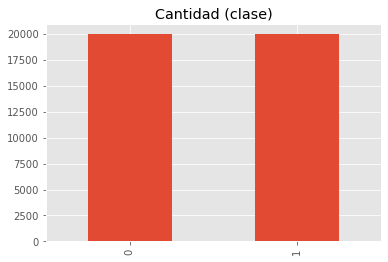

In [11]:
target_count = y_sampling.value_counts()
cero = target_count[0]
uno = target_count[1]
print('Clase 0:', cero)
print('Clase 1:', uno)
print('Proportion:', round(target_count[0] / target_count[1], 2), ': 1')

target_count.plot(kind='bar', title='Cantidad (clase)');

Así, se han creado 18.486 nuevas muestras en las instancias de la clase minoritaria (1) para balancear con la clase mayoritaria (2)

#### 5.3- Construcción de los conjuntos de entrenamiento y pruebas

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X_sampling, y_sampling,
                                                    test_size=.20, 
                                                    random_state=rmst, 
                                                    stratify= y_sampling)

In [13]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(31931, 37)
(7983, 37)
(31931,)
(7983,)


Se observa que al haber aplicado el balanceo de clases mediante SMOTE, el conjunto de datos ha aumentado de 22072 instancias a 40558 instancias.

#### 5.4- Funciones de evaluación

Para la elaboración de las gráficas a utilizar en la vizualización de las métricas de cada algoritmo, se ha utilizado una herramienta desarrollada por Vivienne DiFrancesco, y disponible en el siguiente repositorio de GitHub: [project_functions](https://github.com/HeyThatsViv/Predicting-Depression.git)

In [14]:
# Classification report
func = inspect.getsource(pf.make_classification_report)

In [15]:
#Matriz de Confusión
func = inspect.getsource(pf.plot_confusion_matrix)

In [16]:
# Gráfico ROC (Area bajo la curva)
func = inspect.getsource(pf.plot_roc_curve)

In [17]:
# Variables significativas para los modelos de árbol
func = inspect.getsource(pf.plot_top_features)

In [18]:
# Constructor funciones de evaluación
func = inspect.getsource(pf.evaluate_model)

#### 5.5- Estudio de algoritmos de clasificación

A continuación se va a proceder a estudiar varios modelos de aprendizaje supervisado que pueden ser utilizados para la clasificación de variables binarias balanceadas.

Como se comentó en la primera parte, como estrategia se utilizarán los 5 modelos propuestos por Sausa y Bhakta en su estudio, y se añaden otros modelos que podrían tener buen rendimiento en problemas de clasificación.

Para cada clasificador se estudiarán dos modelos:

* Una versión base, con los estimadores por defecto que trae cada algoritmo.
* Una versión con análisis de parámetros basada en GridSearchCV (parrilla de parámetros con validación cruzada)

##### 5.5.1- Regresión Logística

In [19]:
# Clasificador Base
logreg_clf = LogisticRegressionCV(random_state=rmst,
                                  n_jobs=-1,
                                  cv = crossval
                                  )

# Entrenamiento
logreg_base = logreg_clf.fit(X_train, y_train)

__________________________________________________________________
Reporte para el Clasificador: 
	Regresión Logística CV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.79      0.82      0.80      3992
           1       0.81      0.78      0.79      3991

    accuracy                           0.80      7983
   macro avg       0.80      0.80      0.80      7983
weighted avg       0.80      0.80      0.80      7983

__________________________________________________________________


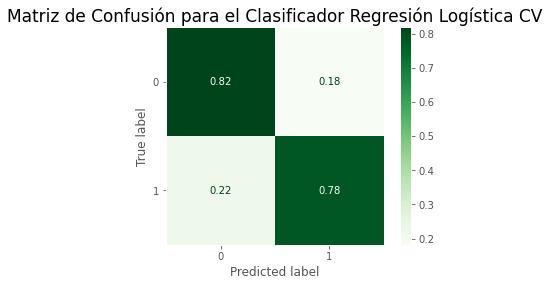

__________________________________________________________________


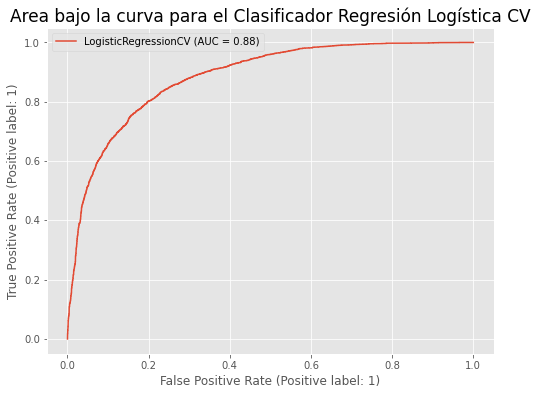

In [20]:
# Evaluación del modelo base
pf.evaluate_model(logreg_base, X_train, X_test, y_test, 
               title='Regresión Logística CV')

In [21]:
# Clasificador aplicando GridSearch CV
Cs_list = list(logreg_base.Cs_)
Cs_list

[0.0001,
 0.000774263682681127,
 0.005994842503189409,
 0.046415888336127774,
 0.3593813663804626,
 2.782559402207126,
 21.54434690031882,
 166.81005372000558,
 1291.5496650148827,
 10000.0]

In [22]:
# Estimadores a analizar
logreg_params = {'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 
                 'C': Cs_list,
                 'penalty': ['l1', 'l2', 'elasticnet', 'none']
                }

# Clasificador Base
logreg_clf2 = LogisticRegression(random_state=rmst,
                                  n_jobs=-1,
                               )

# Evaluación y selección de estimadores
gridcv_logreg = GridSearchCV(logreg_clf2,
                    logreg_params, 
                    n_jobs=-1,
                    cv = crossval)

# Entrenamiento
logreg_grid = gridcv_logreg.fit(X_train, y_train)

In [23]:
# Mejores estimadores
logreg_grid.best_params_

{'C': 0.3593813663804626, 'penalty': 'l1', 'solver': 'saga'}

In [24]:
C_drill_list = list(np.linspace(logreg_grid.best_params_['C']/5, logreg_grid.best_params_['C']*5, 10))
C_drill_list.append(logreg_grid.best_params_['C'])
C_drill_list

[0.07187627327609251,
 0.26354633534567257,
 0.4552163974152526,
 0.6468864594848326,
 0.8385565215544126,
 1.0302265836239928,
 1.2218966456935727,
 1.4135667077631529,
 1.6052367698327328,
 1.796906831902313,
 0.3593813663804626]

In [25]:
# Estimadores a analizar
logreg_params = {'C': C_drill_list}

# Clasificador con los mejores estimadores
logreg_clf2 = LogisticRegression(solver='saga', 
                                random_state=rmst,
                                penalty = 'l1',
                                n_jobs=-1
                               )

# Evaluación y selección de estimadores
gridcv_logreg = GridSearchCV(logreg_clf2,
                             logreg_params,
                             n_jobs=-1,
                             cv = crossval)

# Entrenamiento
logreg_grid2 = gridcv_logreg.fit(X_train, y_train)

In [26]:
# Mejores estimadores
logreg_grid2.best_params_

{'C': 0.4552163974152526}

In [27]:
# Modelo Regresión logística con estimadores
logreg_gridmodel = logreg_grid2.best_estimator_
logreg_gridmodel

LogisticRegression(C=0.4552163974152526, n_jobs=-1, penalty='l1',
                   random_state=123, solver='saga')

__________________________________________________________________
Reporte para el Clasificador: 
	Regresión Logística con GridSearch CV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.79      0.82      0.80      3992
           1       0.81      0.78      0.79      3991

    accuracy                           0.80      7983
   macro avg       0.80      0.80      0.80      7983
weighted avg       0.80      0.80      0.80      7983

__________________________________________________________________


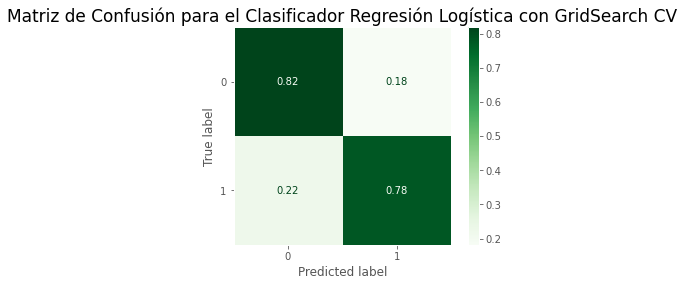

__________________________________________________________________


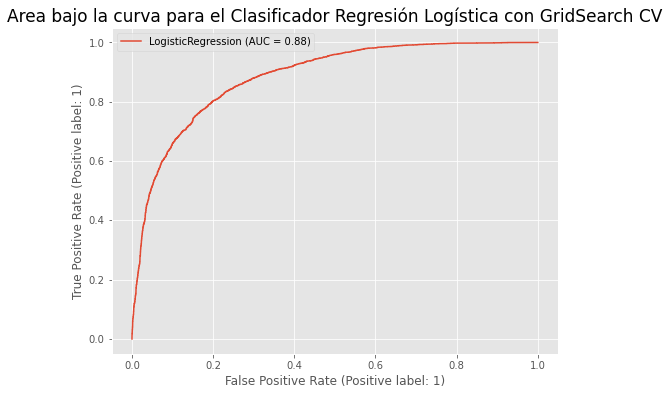

In [28]:
# Evaluación del modelo
pf.evaluate_model(logreg_gridmodel, X_train, X_test, y_test, 
               title='Regresión Logística con GridSearch CV')

##### 5.5.2- Arbol de Decisiones

In [29]:
# Clasificador Base
tree_clf = DecisionTreeClassifier(random_state=rmst)

# Entrenamiento
tree_base = tree_clf.fit(X_train, y_train)

__________________________________________________________________
Reporte para el Clasificador: 
	Arbol de Decisión
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.93      0.92      0.92      3992
           1       0.92      0.93      0.92      3991

    accuracy                           0.92      7983
   macro avg       0.92      0.92      0.92      7983
weighted avg       0.92      0.92      0.92      7983

__________________________________________________________________


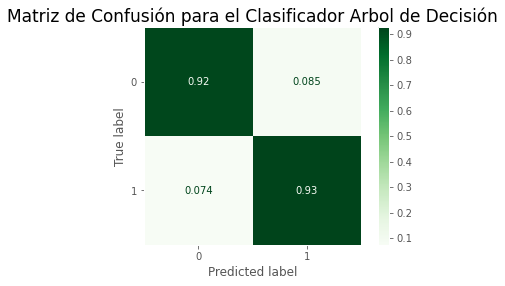

__________________________________________________________________


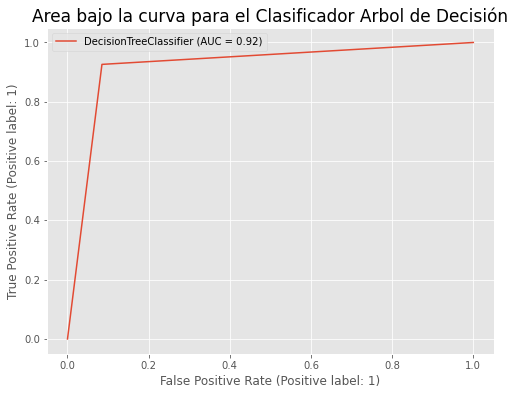

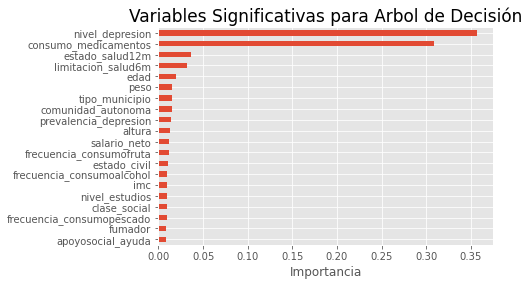

In [30]:
# Evaluación del modelo base
pf.evaluate_model(tree_base, X_train, X_test, y_test, 
               tree=True, title='Arbol de Decisión')

In [31]:
# Clasificador aplicando GridSearch CV
# Estimadores a analizar
tree_params = {'max_features': ['auto', 'sqrt', 'log2'],
               'ccp_alpha': [0.1, .01, .001],
               'max_depth' : [5, 6, 7, 8, 9],
               'criterion' :['gini', 'entropy', 'log_loss']
              }

# Clasificador Base
tree_clf2 = DecisionTreeClassifier(random_state = rmst)

# Evaluación y selección de estimadores
gridcv_tree = GridSearchCV(tree_clf2,
                    tree_params,
                    n_jobs=-1,
                    cv = crossval)

# Entrenamiento
tree_grid = gridcv_tree.fit(X_train, y_train)

In [32]:
# Mejores estimadores
tree_grid.best_params_

{'ccp_alpha': 0.001,
 'criterion': 'entropy',
 'max_depth': 9,
 'max_features': 'auto'}

In [33]:
# Estimadores a analizar
tree_params = {'ccp_alpha': [0.1, .01, .001],
               'max_depth' : [1, 2, 3, 4, 5, 6, 7, 8, 9],
              }

# Clasificador con los mejores estimadores
tree_clf2 = DecisionTreeClassifier(random_state = rmst,
                                   criterion='gini',
                                   max_features= 'auto')

# Evaluación y selección de estimadores
gridcv_tree = GridSearchCV(tree_clf2,
                           tree_params,
                           n_jobs=-1,
                           cv = crossval)

# Entrenamiento
tree_grid2 = gridcv_tree.fit(X_train, y_train)

In [34]:
# Mejores estimadores
tree_grid2.best_params_

{'ccp_alpha': 0.001, 'max_depth': 9}

In [35]:
# Modelo Arbol de Desición con estimadores
tree_gridmodel = tree_grid2.best_estimator_
tree_gridmodel

DecisionTreeClassifier(ccp_alpha=0.001, max_depth=9, max_features='auto',
                       random_state=123)

__________________________________________________________________
Reporte para el Clasificador: 
	Arbol de Decisión con GridSearchCV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.86      0.82      0.84      3992
           1       0.83      0.87      0.85      3991

    accuracy                           0.84      7983
   macro avg       0.84      0.84      0.84      7983
weighted avg       0.84      0.84      0.84      7983

__________________________________________________________________


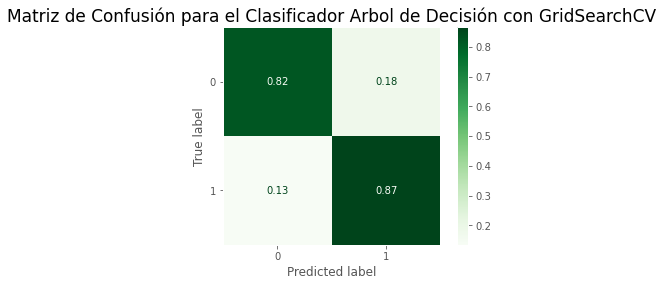

__________________________________________________________________


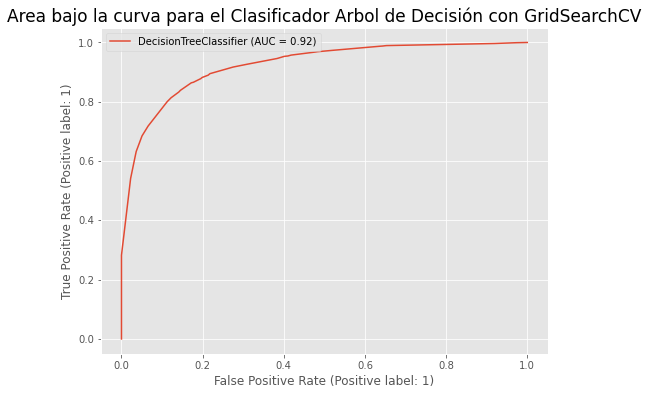

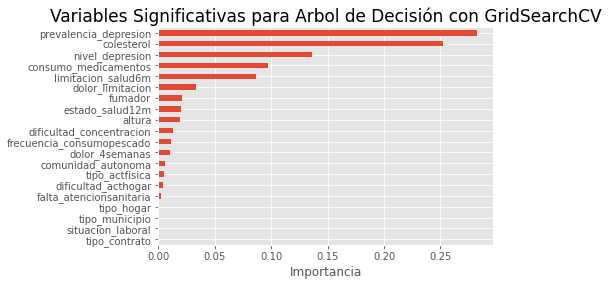

In [36]:
# Evaluación del modelo
pf.evaluate_model(tree_gridmodel, X_train, X_test, y_test, 
               tree=True, title='Arbol de Decisión con GridSearchCV')

##### 5.5.3- Support Vector Machine (SVM)

In [37]:
# Clasificador Base
svm_clf = NuSVC(random_state = rmst)

# Entrenamiento
svm_base = svm_clf.fit(X_train, y_train)

__________________________________________________________________
Reporte para el Clasificador: 
	Support Vector Machine
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.80      0.85      0.83      3992
           1       0.84      0.79      0.82      3991

    accuracy                           0.82      7983
   macro avg       0.82      0.82      0.82      7983
weighted avg       0.82      0.82      0.82      7983

__________________________________________________________________


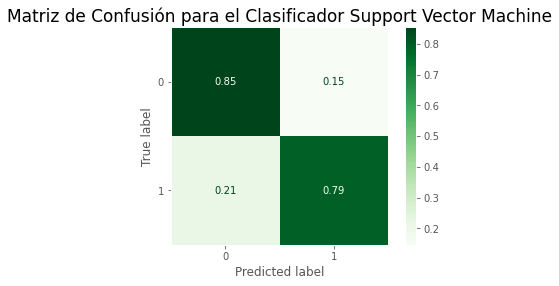

__________________________________________________________________


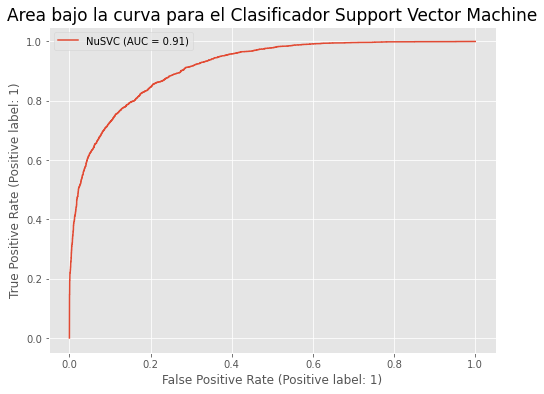

In [38]:
# Evaluación del modelo base
pf.evaluate_model(svm_base, X_train, X_test, y_test, 
               title='Support Vector Machine')

In [39]:
# Clasificador aplicando GridSearch CV
# Estimadores a analizar
svm_params = {'nu': [0,.25,.5,.75,1], 
              'kernel': ['linear','rbf','sigmoid']
             }

# Clasificador Base
svm_clf2 = NuSVC(random_state = rmst)

# Evaluación y selección de estimadores
grid_svm = GridSearchCV(svm_clf2,
                    svm_params,
                    n_jobs=-1,
                    cv = crossval)

# Entrenamiento
svm_grid = grid_svm.fit(X_train, y_train)

In [40]:
# Mejores estimadores
svm_grid.best_params_

{'kernel': 'rbf', 'nu': 0.25}

In [41]:
# Estimadores a analizar
svm_params = {'nu': [0,.125,.25]}

# Clasificador con los mejores estimadores
svm_clf2 = NuSVC(random_state = rmst,
                 kernel= 'rbf')

# Evaluación y selección de estimadores
grid_svm = GridSearchCV(svm_clf2,
                    svm_params,
                    n_jobs=-1,
                    cv = crossval)

# Entrenamiento
svm_grid2 = grid_svm.fit(X_train, y_train)

In [42]:
# Mejores estimadores
svm_grid2.best_params_

{'nu': 0.125}

In [43]:
# Modelo SVM con estimadores
svm_gridmodel = svm_grid2.best_estimator_
svm_gridmodel

NuSVC(nu=0.125, random_state=123)

__________________________________________________________________
Reporte para el Clasificador: 
	Support Vector Machine con GridSearchCV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.99      0.94      0.96      3992
           1       0.94      0.99      0.97      3991

    accuracy                           0.96      7983
   macro avg       0.97      0.96      0.96      7983
weighted avg       0.97      0.96      0.96      7983

__________________________________________________________________


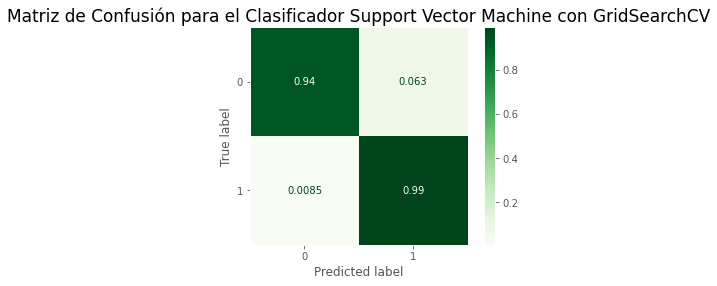

__________________________________________________________________


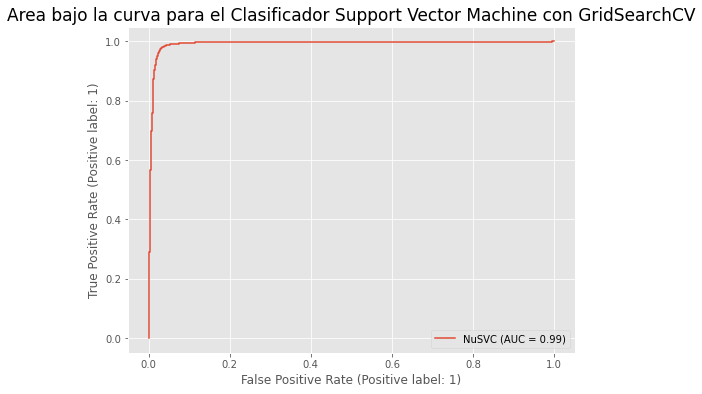

In [44]:
# Evaluación del modelo
pf.evaluate_model(svm_gridmodel, X_train, X_test, y_test, 
                  title='Support Vector Machine con GridSearchCV')

##### 5.5.4- Naive Bayes

In [45]:
# Clasificador Base
gnb_clf = GaussianNB()

# Entrenamiento
nb_base = gnb_clf.fit(X_train, y_train)

__________________________________________________________________
Reporte para el Clasificador: 
	Naive Bayes
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.76      0.79      0.77      3992
           1       0.78      0.74      0.76      3991

    accuracy                           0.77      7983
   macro avg       0.77      0.77      0.77      7983
weighted avg       0.77      0.77      0.77      7983

__________________________________________________________________


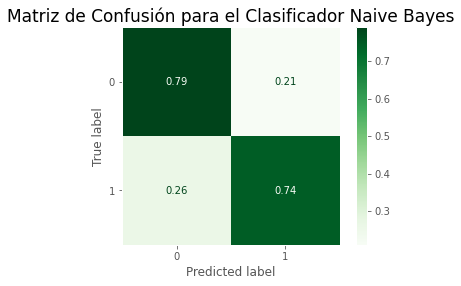

__________________________________________________________________


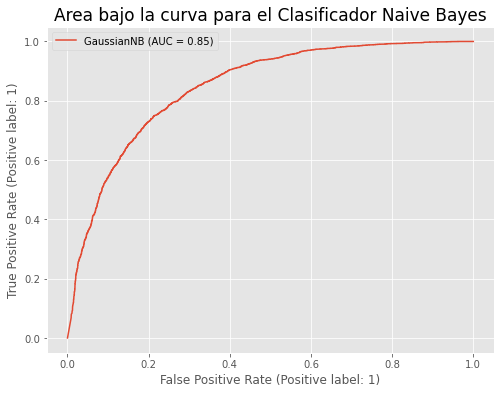

In [46]:
# Evaluación del modelo base
pf.evaluate_model(nb_base, X_train, X_test, y_test, 
               title='Naive Bayes')

In [47]:
# Clasificador aplicando GridSearch CV
# Estimadores a analizar
nb_params = {}

# Clasificador Base
gnb_clf2 = GaussianNB()

# Evaluación y selección de estimadores
grid_nb = GridSearchCV(gnb_clf,
                     nb_params,
                     cv = crossval,
                     scoring='f1_micro',
                     verbose=1,
                     n_jobs=-1)

# Entrenamiento
nb_grid2 = grid_nb.fit(X_train, y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [48]:
# Mejores estimadores
nb_grid2.best_params_

{}

In [49]:
# Modelo NB con estimadores
nb_gridmodel = nb_grid2.best_estimator_
nb_gridmodel

GaussianNB()

__________________________________________________________________
Reporte para el Clasificador: 
	Naive Bayes con GridSearch CV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.76      0.79      0.77      3992
           1       0.78      0.74      0.76      3991

    accuracy                           0.77      7983
   macro avg       0.77      0.77      0.77      7983
weighted avg       0.77      0.77      0.77      7983

__________________________________________________________________


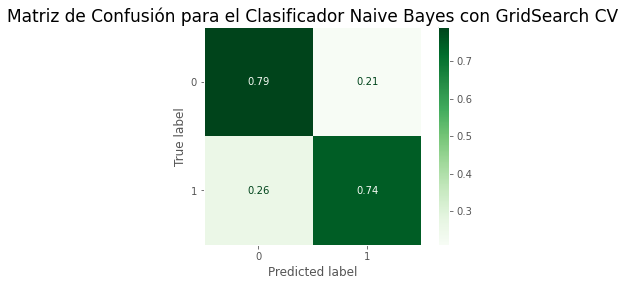

__________________________________________________________________


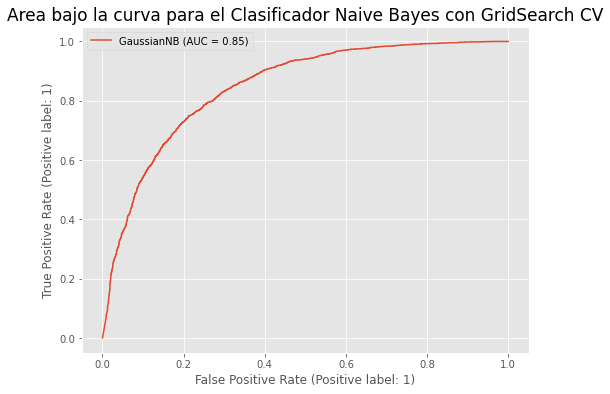

In [50]:
# Evaluación del modelo
pf.evaluate_model(nb_gridmodel, X_train, X_test, y_test, 
                  title='Naive Bayes con GridSearch CV')

##### 5.5.5- Stochastic Gradient Descent Linear Classifier (SGD)

In [51]:
# Clasificador Base
sgd_clf = SGDClassifier(random_state= rmst, n_jobs=-1)

# Entrenamiento
sgd_base = sgd_clf.fit(X_train, y_train)

__________________________________________________________________
Reporte para el Clasificador: 
	SGD
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.83      0.74      0.78      3992
           1       0.77      0.85      0.81      3991

    accuracy                           0.80      7983
   macro avg       0.80      0.80      0.80      7983
weighted avg       0.80      0.80      0.80      7983

__________________________________________________________________


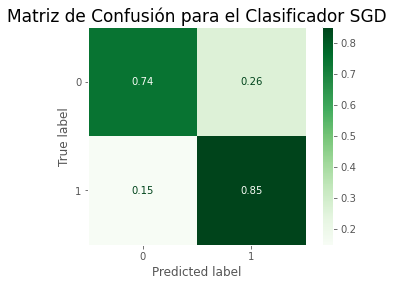

__________________________________________________________________


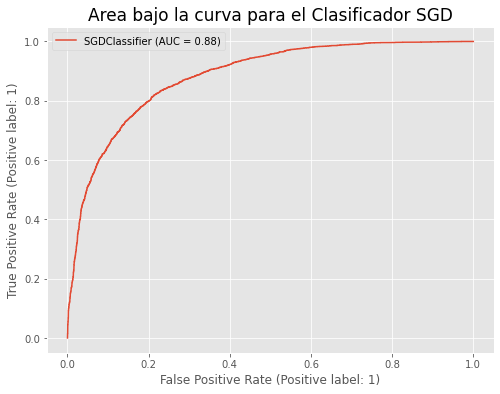

In [52]:
# Evaluación del modelo base
pf.evaluate_model(sgd_base, X_train, X_test, y_test, 
               title='SGD')

In [53]:
# Clasificador aplicando GridSearch CV
# Estimadores a analizar
sgd_params = {'loss': ['hinge', 'log_loss', 'log', 'modified_huber', 'squared_hinge', 'perceptron',
                       'squared_error', 'huber', 'epsilon_insensitive', 'squared_epsilon_insensitive'], 
              'penalty': ['l2', 'l1', 'elasticnet'],
              'fit_intercept': [True, False], 
              'alpha': [.01, .001, .0001, .00001]}

# Clasificador Base
sgd_clf2 = SGDClassifier(random_state=rmst, n_jobs=-1)

# Evaluación y selección de estimadores
grid_sgd = GridSearchCV(sgd_clf2,
                        sgd_params,
                        n_jobs=-1,
                        cv = crossval)

# Entrenamiento
sgd_grid = grid_sgd.fit(X_train, y_train)

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/en

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWar

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/en

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_mode

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWar

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_mode

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_mode

In [54]:
# Mejores estimadores
sgd_grid.best_params_

{'alpha': 0.001, 'fit_intercept': True, 'loss': 'log_loss', 'penalty': 'l1'}

In [55]:
# Estimadores a analizar
sgd_params = {'alpha': [1, .5, .1, .05, .01, .005, .001]}

# Clasificador con los mejores estimadores
sgd_clf2 = SGDClassifier(random_state=rmst,
                        n_jobs=-1,
                        fit_intercept=True, 
                        loss='log_loss',
                        penalty='l2',
                        l1_ratio=.4)

# Evaluación y selección de estimadores
grid_sgd = GridSearchCV(sgd_clf2,
                        sgd_params,
                        n_jobs=-1,
                        cv= crossval)

# Entrenamiento
sgd_grid2 = grid_sgd.fit(X_train, y_train)

In [56]:
# Mejores estimadores
sgd_grid2.best_params_

{'alpha': 0.001}

In [57]:
# Modelo SGD con estimadores
sgd_grid_finalmodel = sgd_grid2.best_estimator_
sgd_grid_finalmodel

SGDClassifier(alpha=0.001, l1_ratio=0.4, loss='log_loss', n_jobs=-1,
              random_state=123)

__________________________________________________________________
Reporte para el Clasificador: 
	SGD con GridSearch CV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.81      0.78      0.80      3992
           1       0.79      0.82      0.81      3991

    accuracy                           0.80      7983
   macro avg       0.80      0.80      0.80      7983
weighted avg       0.80      0.80      0.80      7983

__________________________________________________________________


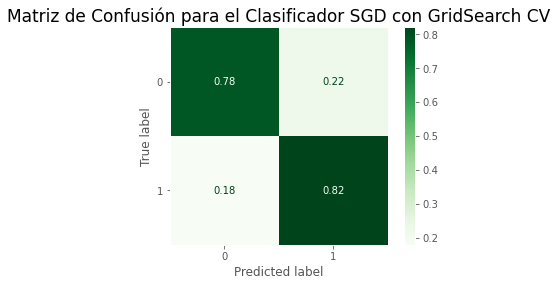

__________________________________________________________________


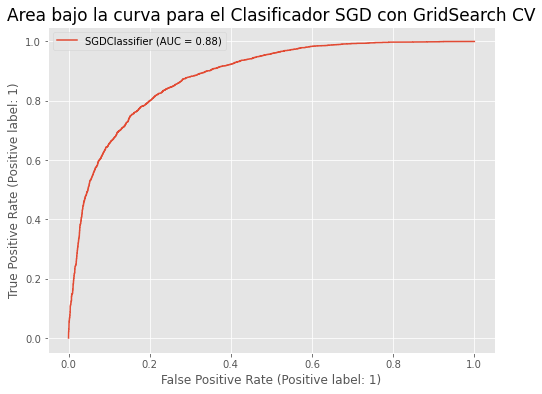

In [58]:
# Evaluación del modelo
pf.evaluate_model(sgd_grid_finalmodel, X_train, X_test, y_test, 
               title='SGD con GridSearch CV')

##### 5.5.6- Random Forest

In [59]:
# Clasificador Base
forest_clf = RandomForestClassifier(n_jobs=-1, 
                                    random_state=rmst)

# Entrenamiento
forest_base = forest_clf.fit(X_train, y_train)

__________________________________________________________________
Reporte para el Clasificador: 
	Random Forest
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3992
           1       0.97      0.95      0.96      3991

    accuracy                           0.96      7983
   macro avg       0.96      0.96      0.96      7983
weighted avg       0.96      0.96      0.96      7983

__________________________________________________________________


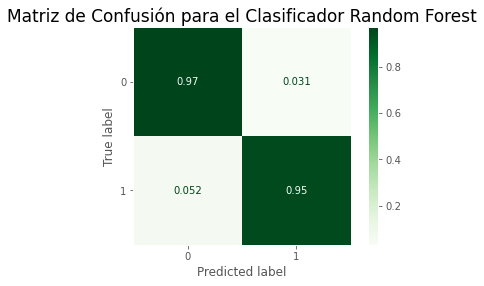

__________________________________________________________________


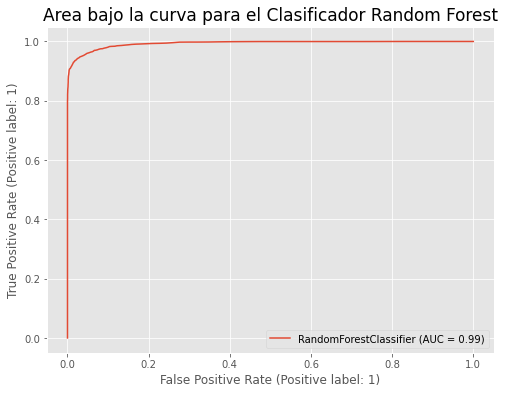

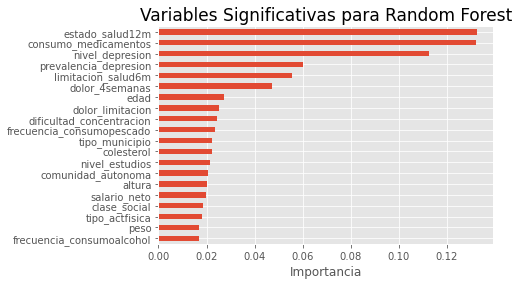

In [60]:
# Evaluación del modelo base
pf.evaluate_model(forest_base, X_train, X_test, y_test, 
               tree=True, title='Random Forest')

In [61]:
# Clasificador aplicando GridSearch CV
# Estimadores a analizar
forest_params = {'criterion': ['gini', 'entropy','log_loss'], 
                 'max_depth': [None, 5, 10, 20, 50], 
                 'min_samples_leaf': [1, 10, 20], 
                 'max_features': ['sqrt', 'log2', None],
                 'max_samples': [None, .5, .7, .9]
                }

# Clasificador Base
forest_clf2 = RandomForestClassifier(random_state=rmst)

# Evaluación y selección de estimadores
grid_forest = GridSearchCV(forest_clf2,
                           forest_params
                           ,n_jobs=-1,
                           cv= crossval)

# Entrenamiento
forest_grid = grid_forest.fit(X_train, y_train)

In [62]:
# Mejores estimadores
forest_grid.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'max_features': 'log2',
 'max_samples': None,
 'min_samples_leaf': 1}

In [63]:
# Estimadores a analizar
forest_params = {}

# Clasificador con los mejores estimadores
forest_clf2 = RandomForestClassifier(random_state=rmst, 
                                    criterion='gini', 
                                    max_depth= None,
                                    max_features='sqrt',
                                    min_samples_leaf = 1,
                                    max_samples = None
                                   )

# Evaluación y selección de estimadores
grid_forest = GridSearchCV(forest_clf2,
                           forest_params,
                           n_jobs=-1,
                           cv= crossval)

# Entrenamiento
forest_grid2 = grid_forest.fit(X_train, y_train)

In [64]:
# Mejores estimadores
forest_grid2.best_params_

{}

In [65]:
# Modelo Random Forest con estimadores
forest_gridmodel = forest_grid2.best_estimator_
forest_gridmodel

RandomForestClassifier(random_state=123)

__________________________________________________________________
Reporte para el Clasificador: 
	Random Forest con GridSearch CV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3992
           1       0.97      0.95      0.96      3991

    accuracy                           0.96      7983
   macro avg       0.96      0.96      0.96      7983
weighted avg       0.96      0.96      0.96      7983

__________________________________________________________________


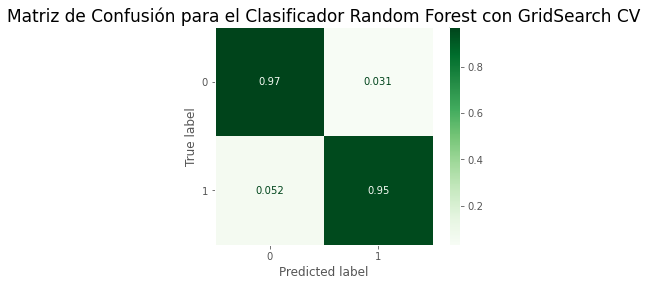

__________________________________________________________________


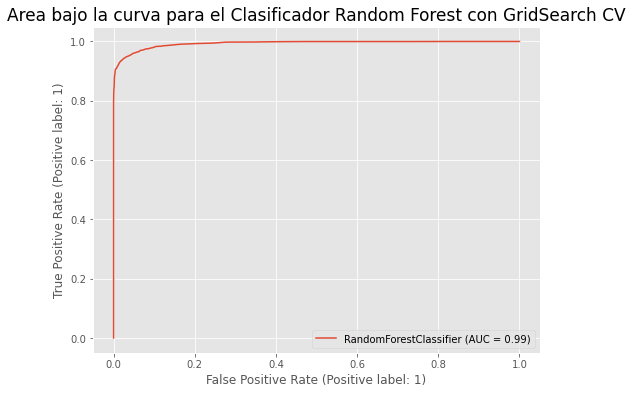

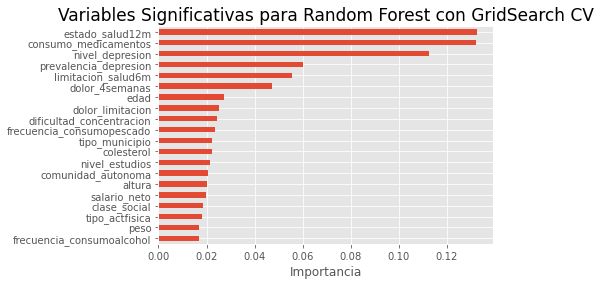

In [66]:
# Evaluación del modelo
pf.evaluate_model(forest_gridmodel, X_train, X_test, y_test, 
               tree=True, title='Random Forest con GridSearch CV')

##### 5.5.7- Extra Trees

In [67]:
# Clasificador Base
extratrees_clf = ExtraTreesClassifier(n_jobs=-1,
                                       random_state=rmst)


# Entrenamiento
extratrees_base = extratrees_clf.fit(X_train, y_train)

__________________________________________________________________
Reporte para el Clasificador: 
	Extra Trees
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.99      0.96      0.97      3992
           1       0.96      0.99      0.97      3991

    accuracy                           0.97      7983
   macro avg       0.98      0.97      0.97      7983
weighted avg       0.98      0.97      0.97      7983

__________________________________________________________________


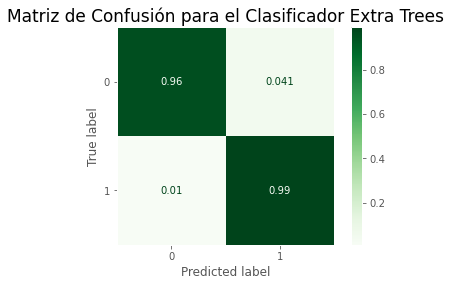

__________________________________________________________________


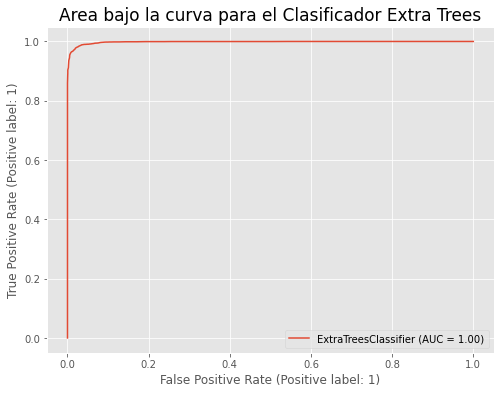

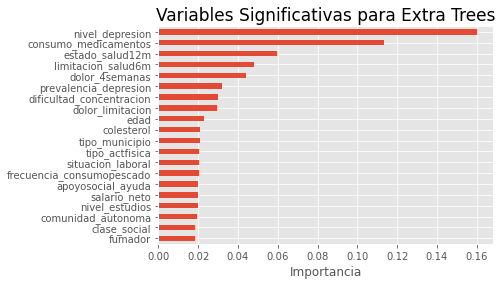

In [68]:
# Evaluación del modelo base
pf.evaluate_model(extratrees_base, X_train, X_test, y_test, 
               tree=True, title='Extra Trees')

In [69]:
# Clasificador aplicando GridSearch CV
# Estimadores a analizar
trees_params = {'criterion': ['gini', 'entropy','log_loss'], 
                'max_depth': [None, 10, 50], 
                'min_samples_leaf': [1, 5], 
                'max_features': ['sqrt','log2', None], 
                'bootstrap': [True, False], 
                'max_samples': [.5, .7, .9]
               }

# Clasificador Base
extratrees_clf2 = ExtraTreesClassifier(random_state=rmst)

# Evaluación y selección de estimadores
grid_extratree = GridSearchCV(extratrees_clf2,
                              trees_params,
                              n_jobs=-1,
                              cv= crossval)

# Entrenamiento
extratrees_grid = grid_extratree.fit(X_train, y_train)

In [70]:
# Mejores estimadores
extratrees_grid.best_params_

{'bootstrap': True,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'log2',
 'max_samples': 0.9,
 'min_samples_leaf': 1}

In [71]:
# Estimadores a analizar
trees_params ={'max_depth': [5, 10, 20, 30, 40,50], 
               'max_samples': [.3, .4, .5, .6, .9]}

# Clasificador con los mejores estimadores
extratrees_clf2 = ExtraTreesClassifier(random_state=rmst, 
                                      criterion='entropy', 
                                      bootstrap=True, 
                                      max_features='sqrt',
                                      min_samples_leaf = 1
                                     )

# Evaluación y selección de estimadores
grid_extratree = GridSearchCV(extratrees_clf2,
                             trees_params,
                             n_jobs=-1,
                             cv= crossval)

# Entrenamiento
extratrees_grid2 = grid_extratree.fit(X_train, y_train)

In [72]:
# Mejores estimadores
extratrees_grid2.best_params_

{'max_depth': 40, 'max_samples': 0.9}

In [73]:
# Modelo Extra Trees con estimadores
extratrees_gridmodel = extratrees_grid2.best_estimator_
extratrees_gridmodel

ExtraTreesClassifier(bootstrap=True, criterion='entropy', max_depth=40,
                     max_samples=0.9, random_state=123)

__________________________________________________________________
Reporte para el Clasificador: 
	Extra Trees con GridSearch CV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.99      0.94      0.96      3992
           1       0.94      0.99      0.96      3991

    accuracy                           0.96      7983
   macro avg       0.96      0.96      0.96      7983
weighted avg       0.96      0.96      0.96      7983

__________________________________________________________________


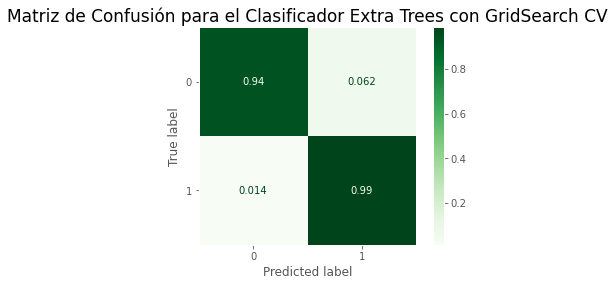

__________________________________________________________________


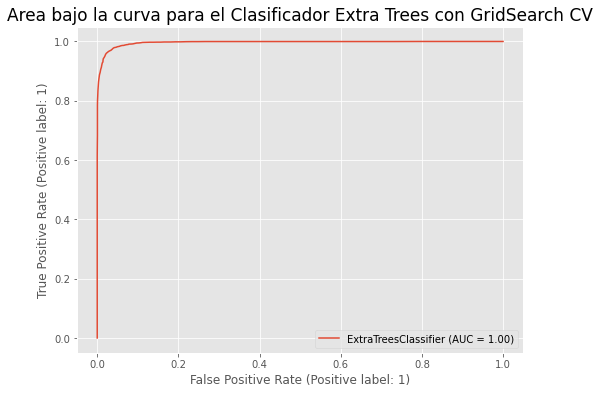

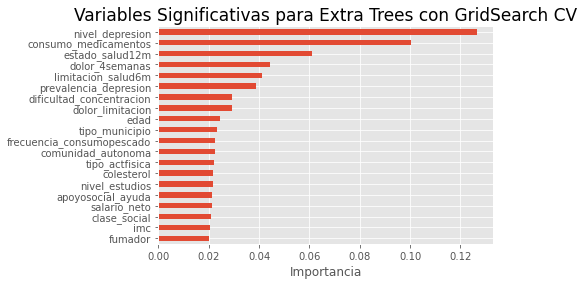

In [74]:
# Evaluación del modelo
pf.evaluate_model(extratrees_gridmodel, X_train, X_test, y_test, 
               tree=True, title='Extra Trees con GridSearch CV')

##### 5.5.8- XgBoost

In [75]:
# Clasificador Base
xgb_clf = XGBClassifier(seed = rmst)

# Entrenamiento
xgb_base = xgb_clf.fit(X_train, y_train)

__________________________________________________________________
Reporte para el Clasificador: 
	Xgboost
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.93      0.96      0.95      3992
           1       0.96      0.93      0.95      3991

    accuracy                           0.95      7983
   macro avg       0.95      0.95      0.95      7983
weighted avg       0.95      0.95      0.95      7983

__________________________________________________________________


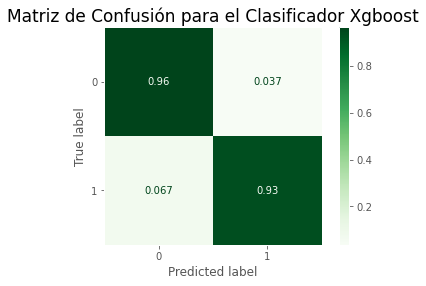

__________________________________________________________________


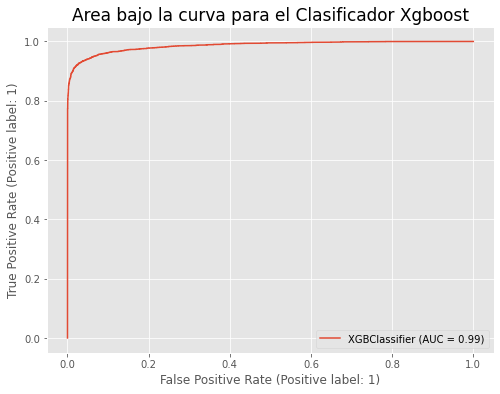

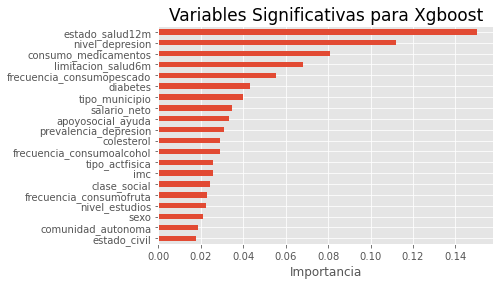

In [76]:
# Evaluación del modelo base
pf.evaluate_model(xgb_base, X_train, X_test, y_test, 
               title='Xgboost', tree=True)

In [77]:
# Clasificador aplicando GridSearch CV
# Estimadores a analizar
xgb_params = {'max_depth': [None, 3, 10], 
              'learning_rate': [.1, .05], 
              'min_child_weight': [1, 5, 10], 
              'subsample': [.3, .5, .7]
              }

# Clasificador Base
xgb_clf2 = XGBClassifier(n_jobs=-1, random_state=rmst)

# Evaluación y selección de estimadores
grid_xgb = GridSearchCV(xgb_clf2,
                        xgb_params,
                        n_jobs=-1,
                        cv= crossval)

# Entrenamiento
xgb_grid = grid_xgb.fit(X_train, y_train)

In [78]:
# Mejores estimadores
xgb_grid.best_params_

{'learning_rate': 0.1,
 'max_depth': 10,
 'min_child_weight': 1,
 'subsample': 0.5}

In [79]:
# Estimadores a analizar
xgb_params = {'max_depth': [5, 10], 
              'learning_rate': [.1, .01, .03], 
              'subsample': [.2, .3, .7]
             }

# Clasificador con los mejores estimadores
xgb_clf2 = XGBClassifier(n_jobs=-1,
                          random_state=rmst,
                          min_child_weight=1)

# Evaluación y selección de estimadores
grid_xgb = GridSearchCV(xgb_clf2,
                        xgb_params,
                        n_jobs=-1,
                        cv= crossval)

# Entrenamiento
xgb_grid2 = grid_xgb.fit(X_train, y_train)

In [80]:
# Mejores estimadores
xgb_grid2.best_params_

{'learning_rate': 0.1, 'max_depth': 10, 'subsample': 0.3}

In [81]:
# Modelo XGboost con estimadores
xgb_gridmodel = xgb_grid2.best_estimator_
xgb_gridmodel

XGBClassifier(max_depth=10, n_jobs=-1, random_state=123, subsample=0.3)

__________________________________________________________________
Reporte para el Clasificador: 
	XgBoost con GridSearchCV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.94      0.98      0.96      3992
           1       0.97      0.93      0.95      3991

    accuracy                           0.95      7983
   macro avg       0.96      0.95      0.95      7983
weighted avg       0.96      0.95      0.95      7983

__________________________________________________________________


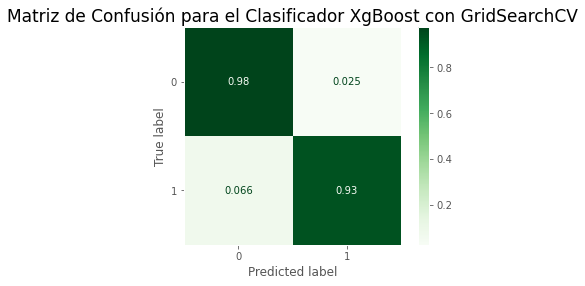

__________________________________________________________________


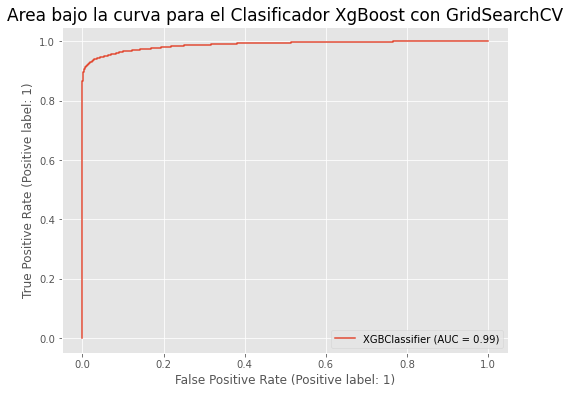

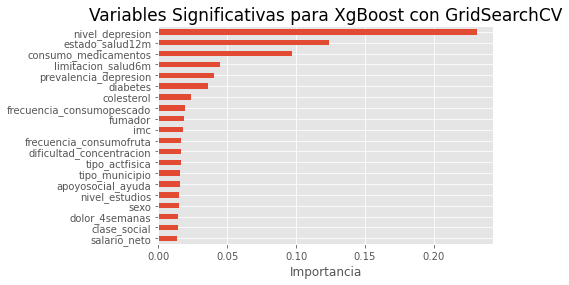

In [82]:
# Evaluación del modelo
pf.evaluate_model(xgb_gridmodel, X_train, X_test, y_test, 
               title='XgBoost con GridSearchCV', tree=True)

##### 5.5.9- CatBoost

In [83]:
# Clasificador Base
cat_clf = CatBoostClassifier(random_state = rmst,
                            verbose = None)

# Entrenamiento
cat_base = cat_clf.fit(X_train, y_train,early_stopping_rounds=3,verbose=False)

__________________________________________________________________
Reporte para el Clasificador: 
	Catboost
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.94      0.98      0.96      3992
           1       0.98      0.93      0.95      3991

    accuracy                           0.96      7983
   macro avg       0.96      0.96      0.96      7983
weighted avg       0.96      0.96      0.96      7983

__________________________________________________________________


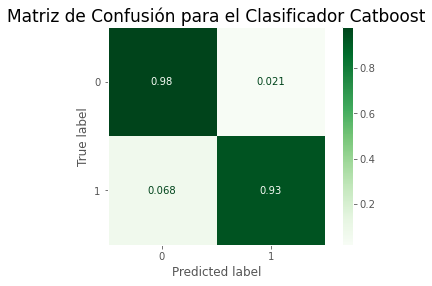

__________________________________________________________________


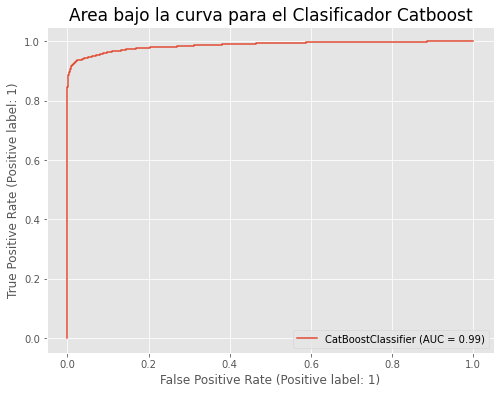

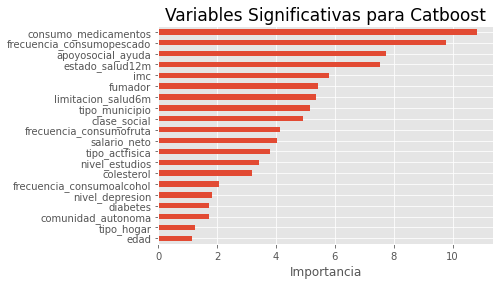

In [84]:
# Evaluación del modelo base
pf.evaluate_model(cat_base, X_train, X_test, y_test, 
               title='Catboost',tree=True)

In [85]:
# Clasificador aplicando GridSearch CV
# Estimadores a analizar
cat_params =  {'depth': [4,5,6,7,8,9,10],
               'learning_rate' : [.01,.02,.03,.04],
               'iterations'    : [10, 20,30,40,50,60,70,80,90,100]
               }

# Clasificador Base
cat_clf2 = CatBoostClassifier(random_state = rmst,
                              verbose = None)

# Evaluación y selección de estimadores
grid_cat = GridSearchCV(cat_clf2,
                        cat_params,
                        n_jobs=-1,
                        cv= crossval)

# Entrenamiento
cat_grid = grid_cat.fit(X_train, y_train)

0:	learn: 0.6847468	total: 91.3ms	remaining: 822ms
1:	learn: 0.6764042	total: 112ms	remaining: 450ms
2:	learn: 0.6682570	total: 144ms	remaining: 337ms
3:	learn: 0.6610750	total: 187ms	remaining: 281ms
4:	learn: 0.6544350	total: 218ms	remaining: 218ms
5:	learn: 0.6468789	total: 246ms	remaining: 164ms
6:	learn: 0.6387991	total: 298ms	remaining: 128ms
7:	learn: 0.6317177	total: 347ms	remaining: 86.8ms
8:	learn: 0.6253094	total: 384ms	remaining: 42.6ms
9:	learn: 0.6188819	total: 413ms	remaining: 0us
0:	learn: 0.6706738	total: 39.1ms	remaining: 352ms
1:	learn: 0.6467835	total: 116ms	remaining: 463ms
2:	learn: 0.6249192	total: 184ms	remaining: 430ms
3:	learn: 0.6085913	total: 238ms	remaining: 357ms
4:	learn: 0.5915788	total: 294ms	remaining: 294ms
5:	learn: 0.5728970	total: 318ms	remaining: 212ms
6:	learn: 0.5544350	total: 386ms	remaining: 165ms
7:	learn: 0.5400392	total: 416ms	remaining: 104ms
8:	learn: 0.5265301	total: 466ms	remaining: 51.7ms
9:	learn: 0.5134063	total: 502ms	remaining: 0us

0:	learn: 0.6765179	total: 90ms	remaining: 810ms
1:	learn: 0.6605073	total: 118ms	remaining: 471ms
2:	learn: 0.6453685	total: 145ms	remaining: 339ms
3:	learn: 0.6321050	total: 190ms	remaining: 286ms
4:	learn: 0.6201278	total: 235ms	remaining: 235ms
5:	learn: 0.6070420	total: 260ms	remaining: 173ms
6:	learn: 0.5934250	total: 297ms	remaining: 127ms
7:	learn: 0.5822859	total: 361ms	remaining: 90.2ms
8:	learn: 0.5736169	total: 393ms	remaining: 43.7ms
9:	learn: 0.5630867	total: 419ms	remaining: 0us
0:	learn: 0.6699017	total: 45.4ms	remaining: 408ms
1:	learn: 0.6449413	total: 114ms	remaining: 458ms
2:	learn: 0.6249656	total: 144ms	remaining: 336ms
3:	learn: 0.6053489	total: 192ms	remaining: 288ms
4:	learn: 0.5894479	total: 249ms	remaining: 249ms
5:	learn: 0.5717608	total: 281ms	remaining: 187ms
6:	learn: 0.5539449	total: 331ms	remaining: 142ms
7:	learn: 0.5398155	total: 373ms	remaining: 93.3ms
8:	learn: 0.5289471	total: 410ms	remaining: 45.5ms
9:	learn: 0.5163568	total: 469ms	remaining: 0us


0:	learn: 0.6780310	total: 109ms	remaining: 977ms
1:	learn: 0.6616094	total: 142ms	remaining: 567ms
2:	learn: 0.6460818	total: 191ms	remaining: 445ms
3:	learn: 0.6342428	total: 232ms	remaining: 348ms
4:	learn: 0.6212410	total: 279ms	remaining: 279ms
5:	learn: 0.6089011	total: 321ms	remaining: 214ms
6:	learn: 0.5974037	total: 401ms	remaining: 172ms
7:	learn: 0.5859510	total: 427ms	remaining: 107ms
8:	learn: 0.5753540	total: 496ms	remaining: 55.1ms
9:	learn: 0.5647831	total: 539ms	remaining: 0us
0:	learn: 0.6702349	total: 105ms	remaining: 945ms
1:	learn: 0.6464072	total: 153ms	remaining: 613ms
2:	learn: 0.6255330	total: 201ms	remaining: 469ms
3:	learn: 0.6058681	total: 256ms	remaining: 385ms
4:	learn: 0.5899687	total: 284ms	remaining: 284ms
5:	learn: 0.5721912	total: 327ms	remaining: 218ms
6:	learn: 0.5541602	total: 383ms	remaining: 164ms
7:	learn: 0.5400660	total: 433ms	remaining: 108ms
8:	learn: 0.5267451	total: 469ms	remaining: 52.2ms
9:	learn: 0.5138227	total: 549ms	remaining: 0us
0:

0:	learn: 0.6852584	total: 93.3ms	remaining: 840ms
1:	learn: 0.6763910	total: 125ms	remaining: 499ms
2:	learn: 0.6680953	total: 189ms	remaining: 442ms
3:	learn: 0.6603864	total: 230ms	remaining: 345ms
4:	learn: 0.6538579	total: 283ms	remaining: 283ms
5:	learn: 0.6462385	total: 360ms	remaining: 240ms
6:	learn: 0.6381241	total: 384ms	remaining: 165ms
7:	learn: 0.6309646	total: 426ms	remaining: 106ms
8:	learn: 0.6245710	total: 486ms	remaining: 54ms
9:	learn: 0.6181438	total: 560ms	remaining: 0us
0:	learn: 0.6624269	total: 48.1ms	remaining: 433ms
1:	learn: 0.6316444	total: 92.8ms	remaining: 371ms
2:	learn: 0.6064139	total: 136ms	remaining: 316ms
3:	learn: 0.5821815	total: 177ms	remaining: 266ms
4:	learn: 0.5630402	total: 205ms	remaining: 205ms
5:	learn: 0.5428896	total: 270ms	remaining: 180ms
6:	learn: 0.5223617	total: 323ms	remaining: 138ms
7:	learn: 0.5061198	total: 372ms	remaining: 92.9ms
8:	learn: 0.4940436	total: 452ms	remaining: 50.2ms
9:	learn: 0.4771469	total: 504ms	remaining: 0us


23:	learn: 0.3927200	total: 992ms	remaining: 1.07s
24:	learn: 0.3869033	total: 1.03s	remaining: 1.03s
25:	learn: 0.3817597	total: 1.06s	remaining: 981ms
26:	learn: 0.3764981	total: 1.09s	remaining: 931ms
27:	learn: 0.3727695	total: 1.11s	remaining: 876ms
28:	learn: 0.3680016	total: 1.16s	remaining: 838ms
29:	learn: 0.3649575	total: 1.2s	remaining: 800ms
30:	learn: 0.3607792	total: 1.25s	remaining: 764ms
31:	learn: 0.3559716	total: 1.28s	remaining: 722ms
32:	learn: 0.3524017	total: 1.32s	remaining: 678ms
33:	learn: 0.3477269	total: 1.34s	remaining: 633ms
34:	learn: 0.3436322	total: 1.39s	remaining: 598ms
35:	learn: 0.3397021	total: 1.43s	remaining: 555ms
36:	learn: 0.3375750	total: 1.47s	remaining: 516ms
37:	learn: 0.3341325	total: 1.49s	remaining: 471ms
38:	learn: 0.3303118	total: 1.53s	remaining: 432ms
39:	learn: 0.3282305	total: 1.63s	remaining: 406ms
40:	learn: 0.3265451	total: 1.68s	remaining: 369ms
41:	learn: 0.3239801	total: 1.72s	remaining: 328ms
42:	learn: 0.3205713	total: 1.75

33:	learn: 0.4008652	total: 1.48s	remaining: 698ms
34:	learn: 0.3967272	total: 1.55s	remaining: 666ms
35:	learn: 0.3940750	total: 1.58s	remaining: 614ms
36:	learn: 0.3902963	total: 1.61s	remaining: 567ms
37:	learn: 0.3866048	total: 1.67s	remaining: 527ms
38:	learn: 0.3841094	total: 1.71s	remaining: 482ms
39:	learn: 0.3805787	total: 1.75s	remaining: 437ms
40:	learn: 0.3768915	total: 1.8s	remaining: 395ms
41:	learn: 0.3733214	total: 1.84s	remaining: 350ms
42:	learn: 0.3699084	total: 1.9s	remaining: 309ms
43:	learn: 0.3672306	total: 1.93s	remaining: 264ms
44:	learn: 0.3627376	total: 1.96s	remaining: 218ms
45:	learn: 0.3609620	total: 2.01s	remaining: 175ms
46:	learn: 0.3588632	total: 2.03s	remaining: 130ms
47:	learn: 0.3554163	total: 2.08s	remaining: 86.6ms
48:	learn: 0.3525519	total: 2.11s	remaining: 43ms
49:	learn: 0.3510861	total: 2.15s	remaining: 0us
0:	learn: 0.6605923	total: 38ms	remaining: 1.86s
1:	learn: 0.6311866	total: 79.2ms	remaining: 1.9s
2:	learn: 0.6051004	total: 134ms	remai

33:	learn: 0.3479328	total: 1.31s	remaining: 619ms
34:	learn: 0.3438934	total: 1.38s	remaining: 590ms
35:	learn: 0.3399747	total: 1.41s	remaining: 548ms
36:	learn: 0.3367079	total: 1.46s	remaining: 511ms
37:	learn: 0.3326513	total: 1.52s	remaining: 479ms
38:	learn: 0.3306414	total: 1.56s	remaining: 439ms
39:	learn: 0.3241180	total: 1.59s	remaining: 398ms
40:	learn: 0.3211887	total: 1.66s	remaining: 364ms
41:	learn: 0.3194905	total: 1.72s	remaining: 328ms
42:	learn: 0.3162159	total: 1.75s	remaining: 285ms
43:	learn: 0.3104144	total: 1.79s	remaining: 244ms
44:	learn: 0.3072962	total: 1.83s	remaining: 203ms
45:	learn: 0.3045382	total: 1.87s	remaining: 162ms
46:	learn: 0.3011701	total: 1.93s	remaining: 123ms
47:	learn: 0.2993691	total: 2s	remaining: 83.5ms
48:	learn: 0.2973169	total: 2.04s	remaining: 41.7ms
49:	learn: 0.2940890	total: 2.08s	remaining: 0us
0:	learn: 0.6628797	total: 47.8ms	remaining: 2.34s
1:	learn: 0.6320923	total: 112ms	remaining: 2.68s
2:	learn: 0.6092454	total: 148ms	re

33:	learn: 0.3982865	total: 1.37s	remaining: 643ms
34:	learn: 0.3939270	total: 1.41s	remaining: 605ms
35:	learn: 0.3912838	total: 1.45s	remaining: 562ms
36:	learn: 0.3874016	total: 1.47s	remaining: 517ms
37:	learn: 0.3850337	total: 1.51s	remaining: 478ms
38:	learn: 0.3810789	total: 1.54s	remaining: 434ms
39:	learn: 0.3773940	total: 1.58s	remaining: 395ms
40:	learn: 0.3751917	total: 1.6s	remaining: 351ms
41:	learn: 0.3715506	total: 1.64s	remaining: 312ms
42:	learn: 0.3677415	total: 1.67s	remaining: 272ms
43:	learn: 0.3643879	total: 1.71s	remaining: 233ms
44:	learn: 0.3621726	total: 1.73s	remaining: 193ms
45:	learn: 0.3595358	total: 1.76s	remaining: 154ms
46:	learn: 0.3566171	total: 1.8s	remaining: 115ms
47:	learn: 0.3538494	total: 1.86s	remaining: 77.4ms
48:	learn: 0.3502825	total: 1.88s	remaining: 38.4ms
49:	learn: 0.3486622	total: 1.91s	remaining: 0us
0:	learn: 0.6634614	total: 56.4ms	remaining: 2.76s
1:	learn: 0.6325775	total: 90.5ms	remaining: 2.17s
2:	learn: 0.6052232	total: 159ms	

13:	learn: 0.4727184	total: 577ms	remaining: 1.48s
14:	learn: 0.4634067	total: 660ms	remaining: 1.54s
15:	learn: 0.4543668	total: 728ms	remaining: 1.55s
16:	learn: 0.4482079	total: 759ms	remaining: 1.47s
17:	learn: 0.4400190	total: 787ms	remaining: 1.4s
18:	learn: 0.4314306	total: 904ms	remaining: 1.47s
19:	learn: 0.4240330	total: 936ms	remaining: 1.4s
20:	learn: 0.4189568	total: 975ms	remaining: 1.35s
21:	learn: 0.4127658	total: 1.01s	remaining: 1.29s
22:	learn: 0.4078655	total: 1.04s	remaining: 1.22s
23:	learn: 0.4013622	total: 1.09s	remaining: 1.18s
24:	learn: 0.3966848	total: 1.13s	remaining: 1.13s
25:	learn: 0.3911256	total: 1.18s	remaining: 1.09s
26:	learn: 0.3864720	total: 1.24s	remaining: 1.05s
27:	learn: 0.3801235	total: 1.27s	remaining: 998ms
28:	learn: 0.3766596	total: 1.3s	remaining: 944ms
29:	learn: 0.3717087	total: 1.34s	remaining: 892ms
30:	learn: 0.3671192	total: 1.41s	remaining: 861ms
31:	learn: 0.3625342	total: 1.45s	remaining: 815ms
32:	learn: 0.3581833	total: 1.5s	r

13:	learn: 0.4706924	total: 702ms	remaining: 1.8s
14:	learn: 0.4613994	total: 754ms	remaining: 1.76s
15:	learn: 0.4548968	total: 775ms	remaining: 1.65s
16:	learn: 0.4472997	total: 828ms	remaining: 1.61s
17:	learn: 0.4370504	total: 878ms	remaining: 1.56s
18:	learn: 0.4289463	total: 941ms	remaining: 1.53s
19:	learn: 0.4207967	total: 975ms	remaining: 1.46s
20:	learn: 0.4142698	total: 1.03s	remaining: 1.42s
21:	learn: 0.4033498	total: 1.07s	remaining: 1.36s
22:	learn: 0.3986359	total: 1.09s	remaining: 1.28s
23:	learn: 0.3942319	total: 1.13s	remaining: 1.22s
24:	learn: 0.3889459	total: 1.17s	remaining: 1.17s
25:	learn: 0.3821236	total: 1.26s	remaining: 1.16s
26:	learn: 0.3764146	total: 1.31s	remaining: 1.11s
27:	learn: 0.3707316	total: 1.35s	remaining: 1.06s
28:	learn: 0.3670593	total: 1.4s	remaining: 1.01s
29:	learn: 0.3617212	total: 1.43s	remaining: 954ms
30:	learn: 0.3580360	total: 1.47s	remaining: 900ms
31:	learn: 0.3535363	total: 1.5s	remaining: 843ms
32:	learn: 0.3511156	total: 1.54s	

23:	learn: 0.3877477	total: 1.24s	remaining: 1.34s
24:	learn: 0.3821584	total: 1.29s	remaining: 1.29s
25:	learn: 0.3775225	total: 1.34s	remaining: 1.24s
26:	learn: 0.3725926	total: 1.39s	remaining: 1.18s
27:	learn: 0.3688099	total: 1.43s	remaining: 1.13s
28:	learn: 0.3640164	total: 1.49s	remaining: 1.07s
29:	learn: 0.3594633	total: 1.53s	remaining: 1.02s
30:	learn: 0.3563180	total: 1.56s	remaining: 958ms
31:	learn: 0.3519858	total: 1.66s	remaining: 935ms
32:	learn: 0.3480946	total: 1.69s	remaining: 872ms
33:	learn: 0.3454007	total: 1.74s	remaining: 819ms
34:	learn: 0.3417027	total: 1.78s	remaining: 764ms
35:	learn: 0.3396360	total: 1.82s	remaining: 707ms
36:	learn: 0.3366985	total: 1.84s	remaining: 646ms
37:	learn: 0.3326653	total: 1.88s	remaining: 592ms
38:	learn: 0.3284703	total: 1.95s	remaining: 550ms
39:	learn: 0.3264274	total: 2s	remaining: 499ms
40:	learn: 0.3210273	total: 2.04s	remaining: 448ms
41:	learn: 0.3179106	total: 2.07s	remaining: 395ms
42:	learn: 0.3140943	total: 2.11s	

55:	learn: 0.3376896	total: 2.13s	remaining: 532ms
56:	learn: 0.3354857	total: 2.19s	remaining: 499ms
57:	learn: 0.3327593	total: 2.22s	remaining: 460ms
58:	learn: 0.3306275	total: 2.25s	remaining: 420ms
59:	learn: 0.3286087	total: 2.29s	remaining: 381ms
60:	learn: 0.3270806	total: 2.32s	remaining: 342ms
61:	learn: 0.3250399	total: 2.35s	remaining: 304ms
62:	learn: 0.3227273	total: 2.39s	remaining: 265ms
63:	learn: 0.3199642	total: 2.43s	remaining: 228ms
64:	learn: 0.3164571	total: 2.47s	remaining: 190ms
65:	learn: 0.3131418	total: 2.52s	remaining: 153ms
66:	learn: 0.3092388	total: 2.56s	remaining: 115ms
67:	learn: 0.3072203	total: 2.59s	remaining: 76.3ms
68:	learn: 0.3062583	total: 2.62s	remaining: 38ms
69:	learn: 0.3041205	total: 2.67s	remaining: 0us
0:	learn: 0.6634614	total: 67.8ms	remaining: 4.68s
1:	learn: 0.6325775	total: 101ms	remaining: 3.44s
2:	learn: 0.6052232	total: 135ms	remaining: 3.02s
3:	learn: 0.5852310	total: 184ms	remaining: 3.03s
4:	learn: 0.5639473	total: 230ms	rem

65:	learn: 0.2624597	total: 2.41s	remaining: 146ms
66:	learn: 0.2590620	total: 2.45s	remaining: 110ms
67:	learn: 0.2561854	total: 2.48s	remaining: 72.9ms
68:	learn: 0.2553218	total: 2.54s	remaining: 36.8ms
69:	learn: 0.2534494	total: 2.58s	remaining: 0us
0:	learn: 0.6632614	total: 31.1ms	remaining: 2.15s
1:	learn: 0.6323293	total: 65.8ms	remaining: 2.24s
2:	learn: 0.6048247	total: 126ms	remaining: 2.82s
3:	learn: 0.5847467	total: 150ms	remaining: 2.47s
4:	learn: 0.5633730	total: 195ms	remaining: 2.53s
5:	learn: 0.5435368	total: 228ms	remaining: 2.43s
6:	learn: 0.5251591	total: 304ms	remaining: 2.74s
7:	learn: 0.5076262	total: 341ms	remaining: 2.64s
8:	learn: 0.4925429	total: 381ms	remaining: 2.58s
9:	learn: 0.4787203	total: 449ms	remaining: 2.69s
10:	learn: 0.4652792	total: 491ms	remaining: 2.63s
11:	learn: 0.4508350	total: 516ms	remaining: 2.49s
12:	learn: 0.4391394	total: 538ms	remaining: 2.36s
13:	learn: 0.4295618	total: 576ms	remaining: 2.3s
14:	learn: 0.4202993	total: 612ms	remain

65:	learn: 0.3066649	total: 2.49s	remaining: 151ms
66:	learn: 0.3052315	total: 2.52s	remaining: 113ms
67:	learn: 0.3030633	total: 2.55s	remaining: 75.1ms
68:	learn: 0.3003388	total: 2.58s	remaining: 37.4ms
69:	learn: 0.2984684	total: 2.6s	remaining: 0us
0:	learn: 0.6605923	total: 39.5ms	remaining: 2.72s
1:	learn: 0.6311866	total: 78.1ms	remaining: 2.65s
2:	learn: 0.6051004	total: 101ms	remaining: 2.27s
3:	learn: 0.5822098	total: 136ms	remaining: 2.24s
4:	learn: 0.5627369	total: 188ms	remaining: 2.45s
5:	learn: 0.5423707	total: 217ms	remaining: 2.31s
6:	learn: 0.5223124	total: 262ms	remaining: 2.35s
7:	learn: 0.5060296	total: 314ms	remaining: 2.44s
8:	learn: 0.4911675	total: 343ms	remaining: 2.32s
9:	learn: 0.4771515	total: 378ms	remaining: 2.27s
10:	learn: 0.4640937	total: 414ms	remaining: 2.22s
11:	learn: 0.4527322	total: 438ms	remaining: 2.12s
12:	learn: 0.4406036	total: 509ms	remaining: 2.23s
13:	learn: 0.4282209	total: 560ms	remaining: 2.24s
14:	learn: 0.4191599	total: 597ms	remain

25:	learn: 0.3377291	total: 1.12s	remaining: 1.9s
26:	learn: 0.3323700	total: 1.15s	remaining: 1.83s
27:	learn: 0.3284212	total: 1.19s	remaining: 1.78s
28:	learn: 0.3241602	total: 1.23s	remaining: 1.74s
29:	learn: 0.3202100	total: 1.26s	remaining: 1.69s
30:	learn: 0.3155885	total: 1.29s	remaining: 1.63s
31:	learn: 0.3131502	total: 1.32s	remaining: 1.56s
32:	learn: 0.3089966	total: 1.36s	remaining: 1.52s
33:	learn: 0.3063985	total: 1.38s	remaining: 1.46s
34:	learn: 0.3016863	total: 1.42s	remaining: 1.42s
35:	learn: 0.2981929	total: 1.44s	remaining: 1.36s
36:	learn: 0.2963955	total: 1.47s	remaining: 1.31s
37:	learn: 0.2927647	total: 1.49s	remaining: 1.26s
38:	learn: 0.2893971	total: 1.53s	remaining: 1.22s
39:	learn: 0.2833173	total: 1.57s	remaining: 1.18s
40:	learn: 0.2774928	total: 1.61s	remaining: 1.14s
41:	learn: 0.2718927	total: 1.66s	remaining: 1.1s
42:	learn: 0.2703554	total: 1.7s	remaining: 1.07s
43:	learn: 0.2678181	total: 1.73s	remaining: 1.02s
44:	learn: 0.2657765	total: 1.76s	

35:	learn: 0.2975352	total: 1.46s	remaining: 1.37s
36:	learn: 0.2958397	total: 1.51s	remaining: 1.35s
37:	learn: 0.2938900	total: 1.55s	remaining: 1.3s
38:	learn: 0.2904662	total: 1.59s	remaining: 1.26s
39:	learn: 0.2862848	total: 1.64s	remaining: 1.23s
40:	learn: 0.2835450	total: 1.68s	remaining: 1.19s
41:	learn: 0.2778612	total: 1.72s	remaining: 1.14s
42:	learn: 0.2728006	total: 1.75s	remaining: 1.1s
43:	learn: 0.2701441	total: 1.77s	remaining: 1.05s
44:	learn: 0.2688313	total: 1.8s	remaining: 1s
45:	learn: 0.2667705	total: 1.83s	remaining: 954ms
46:	learn: 0.2632763	total: 1.86s	remaining: 909ms
47:	learn: 0.2606328	total: 1.9s	remaining: 872ms
48:	learn: 0.2557540	total: 1.95s	remaining: 837ms
49:	learn: 0.2500893	total: 1.98s	remaining: 793ms
50:	learn: 0.2491245	total: 2.03s	remaining: 757ms
51:	learn: 0.2473407	total: 2.08s	remaining: 721ms
52:	learn: 0.2446224	total: 2.11s	remaining: 676ms
53:	learn: 0.2399487	total: 2.15s	remaining: 636ms
54:	learn: 0.2383331	total: 2.18s	rema

45:	learn: 0.3040332	total: 1.89s	remaining: 988ms
46:	learn: 0.3013440	total: 1.94s	remaining: 947ms
47:	learn: 0.2967713	total: 1.96s	remaining: 897ms
48:	learn: 0.2954206	total: 2s	remaining: 856ms
49:	learn: 0.2929329	total: 2.05s	remaining: 821ms
50:	learn: 0.2902022	total: 2.09s	remaining: 778ms
51:	learn: 0.2889602	total: 2.12s	remaining: 735ms
52:	learn: 0.2863129	total: 2.17s	remaining: 696ms
53:	learn: 0.2838082	total: 2.2s	remaining: 651ms
54:	learn: 0.2799517	total: 2.23s	remaining: 609ms
55:	learn: 0.2776466	total: 2.29s	remaining: 572ms
56:	learn: 0.2751548	total: 2.33s	remaining: 532ms
57:	learn: 0.2717193	total: 2.36s	remaining: 489ms
58:	learn: 0.2707513	total: 2.4s	remaining: 448ms
59:	learn: 0.2688554	total: 2.43s	remaining: 405ms
60:	learn: 0.2652218	total: 2.46s	remaining: 364ms
61:	learn: 0.2615382	total: 2.5s	remaining: 322ms
62:	learn: 0.2594636	total: 2.54s	remaining: 282ms
63:	learn: 0.2571921	total: 2.56s	remaining: 240ms
64:	learn: 0.2550024	total: 2.6s	rema

77:	learn: 0.1975975	total: 2.78s	remaining: 71.2ms
78:	learn: 0.1962704	total: 2.82s	remaining: 35.7ms
79:	learn: 0.1930598	total: 2.85s	remaining: 0us
0:	learn: 0.6780310	total: 31.8ms	remaining: 2.83s
1:	learn: 0.6616094	total: 68.4ms	remaining: 3.01s
2:	learn: 0.6460818	total: 111ms	remaining: 3.21s
3:	learn: 0.6342428	total: 173ms	remaining: 3.71s
4:	learn: 0.6212410	total: 201ms	remaining: 3.42s
5:	learn: 0.6089011	total: 251ms	remaining: 3.51s
6:	learn: 0.5974037	total: 279ms	remaining: 3.31s
7:	learn: 0.5859510	total: 307ms	remaining: 3.15s
8:	learn: 0.5753540	total: 353ms	remaining: 3.18s
9:	learn: 0.5647831	total: 396ms	remaining: 3.16s
10:	learn: 0.5539063	total: 427ms	remaining: 3.06s
11:	learn: 0.5426550	total: 512ms	remaining: 3.33s
12:	learn: 0.5332063	total: 541ms	remaining: 3.21s
13:	learn: 0.5247339	total: 590ms	remaining: 3.2s
14:	learn: 0.5162481	total: 619ms	remaining: 3.1s
15:	learn: 0.5080465	total: 644ms	remaining: 2.98s
16:	learn: 0.5008469	total: 693ms	remaini

7:	learn: 0.5816426	total: 318ms	remaining: 3.26s
8:	learn: 0.5733657	total: 372ms	remaining: 3.35s
9:	learn: 0.5627614	total: 411ms	remaining: 3.29s
10:	learn: 0.5536708	total: 453ms	remaining: 3.25s
11:	learn: 0.5418819	total: 488ms	remaining: 3.17s
12:	learn: 0.5332434	total: 524ms	remaining: 3.1s
13:	learn: 0.5246066	total: 556ms	remaining: 3.02s
14:	learn: 0.5175307	total: 582ms	remaining: 2.91s
15:	learn: 0.5096258	total: 616ms	remaining: 2.85s
16:	learn: 0.5021975	total: 652ms	remaining: 2.8s
17:	learn: 0.4945743	total: 710ms	remaining: 2.84s
18:	learn: 0.4875181	total: 737ms	remaining: 2.75s
19:	learn: 0.4797280	total: 775ms	remaining: 2.71s
20:	learn: 0.4720180	total: 839ms	remaining: 2.75s
21:	learn: 0.4652540	total: 869ms	remaining: 2.69s
22:	learn: 0.4587580	total: 896ms	remaining: 2.61s
23:	learn: 0.4531909	total: 941ms	remaining: 2.59s
24:	learn: 0.4465423	total: 991ms	remaining: 2.58s
25:	learn: 0.4408338	total: 1.03s	remaining: 2.54s
26:	learn: 0.4354376	total: 1.07s	re

17:	learn: 0.5714687	total: 710ms	remaining: 2.84s
18:	learn: 0.5665482	total: 757ms	remaining: 2.83s
19:	learn: 0.5608311	total: 812ms	remaining: 2.84s
20:	learn: 0.5570089	total: 832ms	remaining: 2.73s
21:	learn: 0.5519752	total: 873ms	remaining: 2.7s
22:	learn: 0.5471791	total: 922ms	remaining: 2.68s
23:	learn: 0.5422068	total: 962ms	remaining: 2.65s
24:	learn: 0.5379868	total: 997ms	remaining: 2.59s
25:	learn: 0.5345096	total: 1.03s	remaining: 2.54s
26:	learn: 0.5299223	total: 1.09s	remaining: 2.54s
27:	learn: 0.5256411	total: 1.12s	remaining: 2.48s
28:	learn: 0.5210655	total: 1.18s	remaining: 2.48s
29:	learn: 0.5169409	total: 1.21s	remaining: 2.43s
30:	learn: 0.5112726	total: 1.25s	remaining: 2.38s
31:	learn: 0.5068014	total: 1.3s	remaining: 2.36s
32:	learn: 0.5037568	total: 1.33s	remaining: 2.3s
33:	learn: 0.5001773	total: 1.36s	remaining: 2.24s
34:	learn: 0.4973235	total: 1.4s	remaining: 2.2s
35:	learn: 0.4937206	total: 1.42s	remaining: 2.14s
36:	learn: 0.4909138	total: 1.45s	re

87:	learn: 0.3707206	total: 3.45s	remaining: 78.3ms
88:	learn: 0.3696949	total: 3.49s	remaining: 39.2ms
89:	learn: 0.3687627	total: 3.51s	remaining: 0us
0:	learn: 0.6706738	total: 43.5ms	remaining: 3.87s
1:	learn: 0.6467835	total: 81.9ms	remaining: 3.6s
2:	learn: 0.6249192	total: 119ms	remaining: 3.44s
3:	learn: 0.6085913	total: 145ms	remaining: 3.12s
4:	learn: 0.5915788	total: 181ms	remaining: 3.07s
5:	learn: 0.5728970	total: 233ms	remaining: 3.26s
6:	learn: 0.5544350	total: 263ms	remaining: 3.11s
7:	learn: 0.5400392	total: 313ms	remaining: 3.21s
8:	learn: 0.5265301	total: 343ms	remaining: 3.08s
9:	learn: 0.5134063	total: 381ms	remaining: 3.05s
10:	learn: 0.5023319	total: 418ms	remaining: 3s
11:	learn: 0.4914069	total: 447ms	remaining: 2.9s
12:	learn: 0.4801529	total: 482ms	remaining: 2.85s
13:	learn: 0.4706761	total: 517ms	remaining: 2.81s
14:	learn: 0.4616345	total: 554ms	remaining: 2.77s
15:	learn: 0.4539002	total: 579ms	remaining: 2.68s
16:	learn: 0.4451150	total: 620ms	remaining:

37:	learn: 0.3866048	total: 1.4s	remaining: 1.92s
38:	learn: 0.3841094	total: 1.43s	remaining: 1.86s
39:	learn: 0.3805787	total: 1.45s	remaining: 1.82s
40:	learn: 0.3768915	total: 1.49s	remaining: 1.78s
41:	learn: 0.3733214	total: 1.52s	remaining: 1.73s
42:	learn: 0.3699084	total: 1.57s	remaining: 1.71s
43:	learn: 0.3672306	total: 1.6s	remaining: 1.67s
44:	learn: 0.3627376	total: 1.63s	remaining: 1.63s
45:	learn: 0.3609620	total: 1.66s	remaining: 1.58s
46:	learn: 0.3588632	total: 1.69s	remaining: 1.54s
47:	learn: 0.3554163	total: 1.72s	remaining: 1.5s
48:	learn: 0.3525519	total: 1.76s	remaining: 1.48s
49:	learn: 0.3510861	total: 1.79s	remaining: 1.43s
50:	learn: 0.3481330	total: 1.87s	remaining: 1.43s
51:	learn: 0.3462857	total: 1.92s	remaining: 1.41s
52:	learn: 0.3438981	total: 1.95s	remaining: 1.36s
53:	learn: 0.3425558	total: 2.01s	remaining: 1.34s
54:	learn: 0.3401063	total: 2.06s	remaining: 1.31s
55:	learn: 0.3376896	total: 2.09s	remaining: 1.27s
56:	learn: 0.3354857	total: 2.12s	

27:	learn: 0.4252297	total: 1.21s	remaining: 2.67s
28:	learn: 0.4206909	total: 1.24s	remaining: 2.62s
29:	learn: 0.4157792	total: 1.27s	remaining: 2.55s
30:	learn: 0.4116190	total: 1.31s	remaining: 2.49s
31:	learn: 0.4067794	total: 1.33s	remaining: 2.41s
32:	learn: 0.4025047	total: 1.37s	remaining: 2.36s
33:	learn: 0.3982865	total: 1.41s	remaining: 2.31s
34:	learn: 0.3939270	total: 1.45s	remaining: 2.27s
35:	learn: 0.3912838	total: 1.5s	remaining: 2.25s
36:	learn: 0.3874016	total: 1.55s	remaining: 2.23s
37:	learn: 0.3850337	total: 1.57s	remaining: 2.15s
38:	learn: 0.3810789	total: 1.62s	remaining: 2.12s
39:	learn: 0.3773940	total: 1.68s	remaining: 2.1s
40:	learn: 0.3751917	total: 1.72s	remaining: 2.05s
41:	learn: 0.3715506	total: 1.75s	remaining: 1.99s
42:	learn: 0.3677415	total: 1.78s	remaining: 1.95s
43:	learn: 0.3643879	total: 1.82s	remaining: 1.91s
44:	learn: 0.3621726	total: 1.88s	remaining: 1.88s
45:	learn: 0.3595358	total: 1.91s	remaining: 1.83s
46:	learn: 0.3566171	total: 1.95s

47:	learn: 0.3511407	total: 1.99s	remaining: 1.74s
48:	learn: 0.3483523	total: 2.03s	remaining: 1.7s
49:	learn: 0.3464122	total: 2.07s	remaining: 1.65s
50:	learn: 0.3446500	total: 2.12s	remaining: 1.62s
51:	learn: 0.3428893	total: 2.16s	remaining: 1.58s
52:	learn: 0.3403525	total: 2.2s	remaining: 1.54s
53:	learn: 0.3376078	total: 2.23s	remaining: 1.49s
54:	learn: 0.3355756	total: 2.25s	remaining: 1.43s
55:	learn: 0.3330992	total: 2.28s	remaining: 1.39s
56:	learn: 0.3311354	total: 2.31s	remaining: 1.33s
57:	learn: 0.3286977	total: 2.33s	remaining: 1.28s
58:	learn: 0.3266390	total: 2.37s	remaining: 1.24s
59:	learn: 0.3225267	total: 2.41s	remaining: 1.2s
60:	learn: 0.3208820	total: 2.44s	remaining: 1.16s
61:	learn: 0.3187945	total: 2.47s	remaining: 1.11s
62:	learn: 0.3165645	total: 2.49s	remaining: 1.07s
63:	learn: 0.3142503	total: 2.56s	remaining: 1.04s
64:	learn: 0.3107202	total: 2.59s	remaining: 996ms
65:	learn: 0.3089211	total: 2.65s	remaining: 963ms
66:	learn: 0.3066434	total: 2.69s	

47:	learn: 0.3027961	total: 1.76s	remaining: 1.54s
48:	learn: 0.3009003	total: 1.79s	remaining: 1.5s
49:	learn: 0.2976328	total: 1.81s	remaining: 1.45s
50:	learn: 0.2952275	total: 1.84s	remaining: 1.4s
51:	learn: 0.2907113	total: 1.88s	remaining: 1.38s
52:	learn: 0.2894667	total: 1.91s	remaining: 1.34s
53:	learn: 0.2847848	total: 1.94s	remaining: 1.29s
54:	learn: 0.2836388	total: 1.98s	remaining: 1.26s
55:	learn: 0.2793515	total: 2.02s	remaining: 1.22s
56:	learn: 0.2769340	total: 2.1s	remaining: 1.22s
57:	learn: 0.2759130	total: 2.13s	remaining: 1.17s
58:	learn: 0.2746376	total: 2.2s	remaining: 1.16s
59:	learn: 0.2730055	total: 2.24s	remaining: 1.12s
60:	learn: 0.2720663	total: 2.27s	remaining: 1.08s
61:	learn: 0.2702087	total: 2.3s	remaining: 1.04s
62:	learn: 0.2680319	total: 2.34s	remaining: 1s
63:	learn: 0.2658468	total: 2.38s	remaining: 966ms
64:	learn: 0.2639587	total: 2.42s	remaining: 933ms
65:	learn: 0.2624597	total: 2.48s	remaining: 902ms
66:	learn: 0.2590620	total: 2.53s	remai

39:	learn: 0.3773940	total: 1.59s	remaining: 2.39s
40:	learn: 0.3751917	total: 1.63s	remaining: 2.34s
41:	learn: 0.3715506	total: 1.66s	remaining: 2.29s
42:	learn: 0.3677415	total: 1.7s	remaining: 2.26s
43:	learn: 0.3643879	total: 1.74s	remaining: 2.21s
44:	learn: 0.3621726	total: 1.79s	remaining: 2.19s
45:	learn: 0.3595358	total: 1.84s	remaining: 2.16s
46:	learn: 0.3566171	total: 1.91s	remaining: 2.15s
47:	learn: 0.3538494	total: 1.93s	remaining: 2.09s
48:	learn: 0.3502825	total: 1.97s	remaining: 2.05s
49:	learn: 0.3486622	total: 2.01s	remaining: 2.01s
50:	learn: 0.3458671	total: 2.08s	remaining: 2s
51:	learn: 0.3439005	total: 2.1s	remaining: 1.94s
52:	learn: 0.3414785	total: 2.17s	remaining: 1.92s
53:	learn: 0.3371187	total: 2.24s	remaining: 1.91s
54:	learn: 0.3347578	total: 2.27s	remaining: 1.86s
55:	learn: 0.3325931	total: 2.31s	remaining: 1.81s
56:	learn: 0.3306836	total: 2.37s	remaining: 1.79s
57:	learn: 0.3284005	total: 2.4s	remaining: 1.74s
58:	learn: 0.3239446	total: 2.45s	rem

49:	learn: 0.2976328	total: 2.18s	remaining: 2.18s
50:	learn: 0.2952275	total: 2.22s	remaining: 2.14s
51:	learn: 0.2907113	total: 2.28s	remaining: 2.1s
52:	learn: 0.2894667	total: 2.32s	remaining: 2.06s
53:	learn: 0.2847848	total: 2.35s	remaining: 2s
54:	learn: 0.2836388	total: 2.38s	remaining: 1.95s
55:	learn: 0.2793515	total: 2.44s	remaining: 1.92s
56:	learn: 0.2769340	total: 2.49s	remaining: 1.88s
57:	learn: 0.2759130	total: 2.54s	remaining: 1.84s
58:	learn: 0.2746376	total: 2.56s	remaining: 1.78s
59:	learn: 0.2730055	total: 2.6s	remaining: 1.74s
60:	learn: 0.2720663	total: 2.64s	remaining: 1.69s
61:	learn: 0.2702087	total: 2.67s	remaining: 1.64s
62:	learn: 0.2680319	total: 2.7s	remaining: 1.58s
63:	learn: 0.2658468	total: 2.75s	remaining: 1.55s
64:	learn: 0.2639587	total: 2.78s	remaining: 1.5s
65:	learn: 0.2624597	total: 2.83s	remaining: 1.46s
66:	learn: 0.2590620	total: 2.86s	remaining: 1.41s
67:	learn: 0.2561854	total: 2.89s	remaining: 1.36s
68:	learn: 0.2553218	total: 2.93s	rema

59:	learn: 0.3286087	total: 2.52s	remaining: 1.68s
60:	learn: 0.3270806	total: 2.57s	remaining: 1.64s
61:	learn: 0.3250399	total: 2.62s	remaining: 1.61s
62:	learn: 0.3227273	total: 2.66s	remaining: 1.56s
63:	learn: 0.3199642	total: 2.7s	remaining: 1.52s
64:	learn: 0.3164571	total: 2.74s	remaining: 1.47s
65:	learn: 0.3131418	total: 2.78s	remaining: 1.43s
66:	learn: 0.3092388	total: 2.81s	remaining: 1.38s
67:	learn: 0.3072203	total: 2.84s	remaining: 1.34s
68:	learn: 0.3062583	total: 2.89s	remaining: 1.3s
69:	learn: 0.3041205	total: 2.93s	remaining: 1.25s
70:	learn: 0.3032254	total: 2.96s	remaining: 1.21s
71:	learn: 0.3003678	total: 3s	remaining: 1.17s
72:	learn: 0.2979554	total: 3.03s	remaining: 1.12s
73:	learn: 0.2964129	total: 3.07s	remaining: 1.08s
74:	learn: 0.2946662	total: 3.09s	remaining: 1.03s
75:	learn: 0.2927054	total: 3.14s	remaining: 991ms
76:	learn: 0.2906892	total: 3.19s	remaining: 953ms
77:	learn: 0.2899424	total: 3.22s	remaining: 907ms
78:	learn: 0.2882145	total: 3.25s	re

39:	learn: 0.2862848	total: 1.51s	remaining: 2.26s
40:	learn: 0.2835450	total: 1.55s	remaining: 2.24s
41:	learn: 0.2778612	total: 1.59s	remaining: 2.19s
42:	learn: 0.2728006	total: 1.64s	remaining: 2.17s
43:	learn: 0.2701441	total: 1.66s	remaining: 2.11s
44:	learn: 0.2688313	total: 1.68s	remaining: 2.06s
45:	learn: 0.2667705	total: 1.73s	remaining: 2.02s
46:	learn: 0.2632763	total: 1.76s	remaining: 1.98s
47:	learn: 0.2606328	total: 1.78s	remaining: 1.93s
48:	learn: 0.2557540	total: 1.83s	remaining: 1.91s
49:	learn: 0.2500893	total: 1.87s	remaining: 1.87s
50:	learn: 0.2491245	total: 1.89s	remaining: 1.81s
51:	learn: 0.2473407	total: 1.92s	remaining: 1.77s
52:	learn: 0.2446224	total: 1.97s	remaining: 1.75s
53:	learn: 0.2399487	total: 2.01s	remaining: 1.71s
54:	learn: 0.2383331	total: 2.04s	remaining: 1.67s
55:	learn: 0.2359985	total: 2.08s	remaining: 1.64s
56:	learn: 0.2322545	total: 2.11s	remaining: 1.59s
57:	learn: 0.2304464	total: 2.15s	remaining: 1.56s
58:	learn: 0.2272981	total: 2.1

79:	learn: 0.2288675	total: 3.23s	remaining: 808ms
80:	learn: 0.2260874	total: 3.27s	remaining: 767ms
81:	learn: 0.2250905	total: 3.31s	remaining: 726ms
82:	learn: 0.2225023	total: 3.35s	remaining: 686ms
83:	learn: 0.2211330	total: 3.38s	remaining: 643ms
84:	learn: 0.2205063	total: 3.41s	remaining: 602ms
85:	learn: 0.2199613	total: 3.46s	remaining: 563ms
86:	learn: 0.2186678	total: 3.5s	remaining: 523ms
87:	learn: 0.2176379	total: 3.53s	remaining: 481ms
88:	learn: 0.2153701	total: 3.56s	remaining: 440ms
89:	learn: 0.2131912	total: 3.6s	remaining: 400ms
90:	learn: 0.2121532	total: 3.63s	remaining: 359ms
91:	learn: 0.2097886	total: 3.67s	remaining: 319ms
92:	learn: 0.2086674	total: 3.73s	remaining: 281ms
93:	learn: 0.2075030	total: 3.81s	remaining: 243ms
94:	learn: 0.2067391	total: 3.84s	remaining: 202ms
95:	learn: 0.2049264	total: 3.88s	remaining: 162ms
96:	learn: 0.2030003	total: 3.91s	remaining: 121ms
97:	learn: 0.2017640	total: 3.95s	remaining: 80.5ms
98:	learn: 0.2007513	total: 3.98

69:	learn: 0.2479841	total: 2.9s	remaining: 1.24s
70:	learn: 0.2440128	total: 2.95s	remaining: 1.2s
71:	learn: 0.2411334	total: 3.01s	remaining: 1.17s
72:	learn: 0.2382718	total: 3.04s	remaining: 1.12s
73:	learn: 0.2366316	total: 3.05s	remaining: 1.07s
74:	learn: 0.2353624	total: 3.16s	remaining: 1.05s
75:	learn: 0.2338005	total: 3.19s	remaining: 1.01s
76:	learn: 0.2320450	total: 3.24s	remaining: 967ms
77:	learn: 0.2296244	total: 3.31s	remaining: 933ms
78:	learn: 0.2277326	total: 3.34s	remaining: 888ms
79:	learn: 0.2265776	total: 3.38s	remaining: 846ms
80:	learn: 0.2259598	total: 3.42s	remaining: 802ms
81:	learn: 0.2237889	total: 3.45s	remaining: 757ms
82:	learn: 0.2220309	total: 3.5s	remaining: 716ms
83:	learn: 0.2201496	total: 3.54s	remaining: 675ms
84:	learn: 0.2184086	total: 3.57s	remaining: 630ms
85:	learn: 0.2173462	total: 3.6s	remaining: 586ms
86:	learn: 0.2163594	total: 3.64s	remaining: 544ms
87:	learn: 0.2137971	total: 3.71s	remaining: 505ms
88:	learn: 0.2132540	total: 3.73s	r

89:	learn: 0.2127558	total: 3.8s	remaining: 422ms
90:	learn: 0.2107727	total: 3.84s	remaining: 380ms
91:	learn: 0.2102542	total: 3.9s	remaining: 339ms
92:	learn: 0.2085749	total: 3.93s	remaining: 296ms
93:	learn: 0.2074193	total: 3.95s	remaining: 252ms
94:	learn: 0.2058996	total: 4s	remaining: 210ms
95:	learn: 0.2044964	total: 4.02s	remaining: 168ms
96:	learn: 0.2024311	total: 4.07s	remaining: 126ms
97:	learn: 0.2019581	total: 4.1s	remaining: 83.7ms
98:	learn: 0.2015353	total: 4.14s	remaining: 41.8ms
99:	learn: 0.1999005	total: 4.17s	remaining: 0us
0:	learn: 0.6831487	total: 81.2ms	remaining: 731ms
1:	learn: 0.6742776	total: 128ms	remaining: 512ms
2:	learn: 0.6662084	total: 181ms	remaining: 423ms
3:	learn: 0.6576189	total: 215ms	remaining: 323ms
4:	learn: 0.6488356	total: 254ms	remaining: 254ms
5:	learn: 0.6412721	total: 338ms	remaining: 225ms
6:	learn: 0.6332329	total: 382ms	remaining: 164ms
7:	learn: 0.6261690	total: 467ms	remaining: 117ms
8:	learn: 0.6189331	total: 511ms	remaining: 

89:	learn: 0.2124054	total: 3.8s	remaining: 422ms
90:	learn: 0.2107430	total: 3.82s	remaining: 378ms
91:	learn: 0.2097671	total: 3.86s	remaining: 336ms
92:	learn: 0.2071821	total: 3.89s	remaining: 293ms
93:	learn: 0.2048105	total: 3.93s	remaining: 251ms
94:	learn: 0.2043504	total: 3.97s	remaining: 209ms
95:	learn: 0.2022155	total: 4s	remaining: 167ms
96:	learn: 0.2005507	total: 4.03s	remaining: 125ms
97:	learn: 0.1992779	total: 4.06s	remaining: 82.8ms
98:	learn: 0.1980093	total: 4.1s	remaining: 41.5ms
99:	learn: 0.1974239	total: 4.16s	remaining: 0us
0:	learn: 0.6842168	total: 71ms	remaining: 639ms
1:	learn: 0.6753505	total: 133ms	remaining: 532ms
2:	learn: 0.6663271	total: 187ms	remaining: 435ms
3:	learn: 0.6579993	total: 266ms	remaining: 400ms
4:	learn: 0.6492583	total: 316ms	remaining: 316ms
5:	learn: 0.6407084	total: 358ms	remaining: 239ms
6:	learn: 0.6332011	total: 436ms	remaining: 187ms
7:	learn: 0.6259268	total: 504ms	remaining: 126ms
8:	learn: 0.6189253	total: 560ms	remaining: 6

32:	learn: 0.4853917	total: 1.85s	remaining: 392ms
33:	learn: 0.4808811	total: 1.9s	remaining: 336ms
34:	learn: 0.4769718	total: 1.94s	remaining: 277ms
35:	learn: 0.4730583	total: 1.97s	remaining: 219ms
36:	learn: 0.4684262	total: 2.01s	remaining: 163ms
37:	learn: 0.4643683	total: 2.04s	remaining: 108ms
38:	learn: 0.4611531	total: 2.1s	remaining: 53.7ms
39:	learn: 0.4575250	total: 2.16s	remaining: 0us
0:	learn: 0.6754482	total: 37.2ms	remaining: 1.45s
1:	learn: 0.6580182	total: 86.6ms	remaining: 1.65s
2:	learn: 0.6428779	total: 151ms	remaining: 1.86s
3:	learn: 0.6279258	total: 210ms	remaining: 1.89s
4:	learn: 0.6138483	total: 282ms	remaining: 1.97s
5:	learn: 0.5998230	total: 339ms	remaining: 1.92s
6:	learn: 0.5868832	total: 367ms	remaining: 1.73s
7:	learn: 0.5749777	total: 402ms	remaining: 1.61s
8:	learn: 0.5648185	total: 446ms	remaining: 1.54s
9:	learn: 0.5542792	total: 504ms	remaining: 1.51s
10:	learn: 0.5440308	total: 545ms	remaining: 1.44s
11:	learn: 0.5315939	total: 593ms	remainin

22:	learn: 0.4404391	total: 1.29s	remaining: 953ms
23:	learn: 0.4348504	total: 1.36s	remaining: 909ms
24:	learn: 0.4307216	total: 1.39s	remaining: 835ms
25:	learn: 0.4250786	total: 1.46s	remaining: 789ms
26:	learn: 0.4199832	total: 1.5s	remaining: 723ms
27:	learn: 0.4113945	total: 1.55s	remaining: 664ms
28:	learn: 0.4061163	total: 1.61s	remaining: 610ms
29:	learn: 0.4013095	total: 1.64s	remaining: 548ms
30:	learn: 0.3967122	total: 1.72s	remaining: 498ms
31:	learn: 0.3930761	total: 1.79s	remaining: 449ms
32:	learn: 0.3880611	total: 1.87s	remaining: 396ms
33:	learn: 0.3828720	total: 1.92s	remaining: 339ms
34:	learn: 0.3787780	total: 2.01s	remaining: 288ms
35:	learn: 0.3749003	total: 2.06s	remaining: 229ms
36:	learn: 0.3694156	total: 2.1s	remaining: 170ms
37:	learn: 0.3657395	total: 2.14s	remaining: 113ms
38:	learn: 0.3624603	total: 2.2s	remaining: 56.3ms
39:	learn: 0.3586431	total: 2.25s	remaining: 0us
0:	learn: 0.6544527	total: 72.5ms	remaining: 2.83s
1:	learn: 0.6207750	total: 128ms	re

1:	learn: 0.6415539	total: 102ms	remaining: 1.93s
2:	learn: 0.6201541	total: 148ms	remaining: 1.83s
3:	learn: 0.6011411	total: 215ms	remaining: 1.93s
4:	learn: 0.5827766	total: 251ms	remaining: 1.76s
5:	learn: 0.5624920	total: 314ms	remaining: 1.78s
6:	learn: 0.5473526	total: 372ms	remaining: 1.75s
7:	learn: 0.5324691	total: 435ms	remaining: 1.74s
8:	learn: 0.5174788	total: 479ms	remaining: 1.65s
9:	learn: 0.5047836	total: 516ms	remaining: 1.55s
10:	learn: 0.4923322	total: 563ms	remaining: 1.48s
11:	learn: 0.4785882	total: 589ms	remaining: 1.37s
12:	learn: 0.4690330	total: 664ms	remaining: 1.38s
13:	learn: 0.4571645	total: 744ms	remaining: 1.38s
14:	learn: 0.4460491	total: 790ms	remaining: 1.31s
15:	learn: 0.4377420	total: 841ms	remaining: 1.26s
16:	learn: 0.4290033	total: 896ms	remaining: 1.21s
17:	learn: 0.4213342	total: 938ms	remaining: 1.15s
18:	learn: 0.4117480	total: 974ms	remaining: 1.08s
19:	learn: 0.4021690	total: 1.01s	remaining: 1.01s
20:	learn: 0.3957674	total: 1.06s	remain

2:	learn: 0.6662084	total: 180ms	remaining: 2.82s
3:	learn: 0.6576189	total: 252ms	remaining: 2.89s
4:	learn: 0.6488356	total: 303ms	remaining: 2.72s
5:	learn: 0.6412721	total: 379ms	remaining: 2.78s
6:	learn: 0.6332329	total: 434ms	remaining: 2.66s
7:	learn: 0.6261690	total: 515ms	remaining: 2.7s
8:	learn: 0.6189331	total: 554ms	remaining: 2.52s
9:	learn: 0.6124091	total: 612ms	remaining: 2.45s
10:	learn: 0.6053636	total: 693ms	remaining: 2.46s
11:	learn: 0.5979615	total: 782ms	remaining: 2.48s
12:	learn: 0.5926773	total: 814ms	remaining: 2.31s
13:	learn: 0.5860809	total: 856ms	remaining: 2.2s
14:	learn: 0.5795501	total: 909ms	remaining: 2.12s
15:	learn: 0.5733632	total: 1.04s	remaining: 2.22s
16:	learn: 0.5678625	total: 1.09s	remaining: 2.11s
17:	learn: 0.5616832	total: 1.14s	remaining: 2.03s
18:	learn: 0.5555879	total: 1.22s	remaining: 1.98s
19:	learn: 0.5491816	total: 1.25s	remaining: 1.87s
20:	learn: 0.5441518	total: 1.3s	remaining: 1.79s
21:	learn: 0.5384710	total: 1.33s	remainin

21:	learn: 0.3477472	total: 1.49s	remaining: 1.22s
22:	learn: 0.3418758	total: 1.57s	remaining: 1.16s
23:	learn: 0.3329052	total: 1.62s	remaining: 1.08s
24:	learn: 0.3271011	total: 1.68s	remaining: 1.01s
25:	learn: 0.3206961	total: 1.73s	remaining: 934ms
26:	learn: 0.3154635	total: 1.78s	remaining: 856ms
27:	learn: 0.3107119	total: 1.84s	remaining: 790ms
28:	learn: 0.3067468	total: 1.9s	remaining: 719ms
29:	learn: 0.3008485	total: 1.95s	remaining: 651ms
30:	learn: 0.2969333	total: 2s	remaining: 580ms
31:	learn: 0.2918098	total: 2.08s	remaining: 521ms
32:	learn: 0.2865747	total: 2.14s	remaining: 455ms
33:	learn: 0.2824731	total: 2.18s	remaining: 385ms
34:	learn: 0.2749911	total: 2.26s	remaining: 323ms
35:	learn: 0.2728290	total: 2.33s	remaining: 259ms
36:	learn: 0.2707830	total: 2.4s	remaining: 194ms
37:	learn: 0.2676016	total: 2.44s	remaining: 129ms
38:	learn: 0.2660415	total: 2.48s	remaining: 63.6ms
39:	learn: 0.2633376	total: 2.53s	remaining: 0us
0:	learn: 0.6770146	total: 75.3ms	rem

13:	learn: 0.5041868	total: 863ms	remaining: 2.22s
14:	learn: 0.4952127	total: 928ms	remaining: 2.17s
15:	learn: 0.4871107	total: 1.02s	remaining: 2.16s
16:	learn: 0.4791750	total: 1.09s	remaining: 2.12s
17:	learn: 0.4692603	total: 1.18s	remaining: 2.1s
18:	learn: 0.4609804	total: 1.26s	remaining: 2.05s
19:	learn: 0.4542306	total: 1.28s	remaining: 1.93s
20:	learn: 0.4460626	total: 1.32s	remaining: 1.82s
21:	learn: 0.4398777	total: 1.37s	remaining: 1.75s
22:	learn: 0.4338704	total: 1.41s	remaining: 1.65s
23:	learn: 0.4287243	total: 1.45s	remaining: 1.57s
24:	learn: 0.4246126	total: 1.54s	remaining: 1.54s
25:	learn: 0.4188334	total: 1.6s	remaining: 1.48s
26:	learn: 0.4136310	total: 1.66s	remaining: 1.41s
27:	learn: 0.4057695	total: 1.69s	remaining: 1.33s
28:	learn: 0.3998747	total: 1.76s	remaining: 1.28s
29:	learn: 0.3950275	total: 1.81s	remaining: 1.21s
30:	learn: 0.3905328	total: 1.88s	remaining: 1.15s
31:	learn: 0.3860891	total: 1.92s	remaining: 1.08s
32:	learn: 0.3806606	total: 1.98s

2:	learn: 0.6159832	total: 217ms	remaining: 3.4s
3:	learn: 0.5945962	total: 289ms	remaining: 3.33s
4:	learn: 0.5753105	total: 328ms	remaining: 2.95s
5:	learn: 0.5573070	total: 382ms	remaining: 2.8s
6:	learn: 0.5422024	total: 442ms	remaining: 2.72s
7:	learn: 0.5276704	total: 530ms	remaining: 2.78s
8:	learn: 0.5135869	total: 622ms	remaining: 2.83s
9:	learn: 0.5008918	total: 667ms	remaining: 2.67s
10:	learn: 0.4881206	total: 732ms	remaining: 2.6s
11:	learn: 0.4755884	total: 774ms	remaining: 2.45s
12:	learn: 0.4612033	total: 803ms	remaining: 2.28s
13:	learn: 0.4504425	total: 853ms	remaining: 2.19s
14:	learn: 0.4403376	total: 904ms	remaining: 2.11s
15:	learn: 0.4318682	total: 931ms	remaining: 1.98s
16:	learn: 0.4231864	total: 965ms	remaining: 1.87s
17:	learn: 0.4133507	total: 1.03s	remaining: 1.84s
18:	learn: 0.4058235	total: 1.08s	remaining: 1.76s
19:	learn: 0.3953122	total: 1.14s	remaining: 1.71s
20:	learn: 0.3868490	total: 1.22s	remaining: 1.68s
21:	learn: 0.3798480	total: 1.28s	remainin

32:	learn: 0.3880611	total: 1.79s	remaining: 923ms
33:	learn: 0.3828720	total: 1.88s	remaining: 883ms
34:	learn: 0.3787780	total: 1.94s	remaining: 830ms
35:	learn: 0.3749003	total: 1.99s	remaining: 773ms
36:	learn: 0.3694156	total: 2.02s	remaining: 711ms
37:	learn: 0.3657395	total: 2.08s	remaining: 658ms
38:	learn: 0.3624603	total: 2.11s	remaining: 596ms
39:	learn: 0.3586431	total: 2.18s	remaining: 545ms
40:	learn: 0.3545756	total: 2.29s	remaining: 503ms
41:	learn: 0.3505283	total: 2.33s	remaining: 445ms
42:	learn: 0.3467436	total: 2.39s	remaining: 389ms
43:	learn: 0.3432810	total: 2.43s	remaining: 331ms
44:	learn: 0.3394440	total: 2.52s	remaining: 279ms
45:	learn: 0.3363708	total: 2.54s	remaining: 221ms
46:	learn: 0.3334452	total: 2.62s	remaining: 167ms
47:	learn: 0.3308392	total: 2.68s	remaining: 112ms
48:	learn: 0.3271623	total: 2.73s	remaining: 55.6ms
49:	learn: 0.3226224	total: 2.78s	remaining: 0us
0:	learn: 0.6544527	total: 38.6ms	remaining: 1.89s
1:	learn: 0.6207750	total: 89.2m

14:	learn: 0.3936795	total: 798ms	remaining: 2.39s
15:	learn: 0.3825506	total: 860ms	remaining: 2.36s
16:	learn: 0.3743837	total: 911ms	remaining: 2.3s
17:	learn: 0.3662302	total: 949ms	remaining: 2.21s
18:	learn: 0.3599608	total: 1.01s	remaining: 2.18s
19:	learn: 0.3518546	total: 1.11s	remaining: 2.22s
20:	learn: 0.3438530	total: 1.16s	remaining: 2.15s
21:	learn: 0.3370540	total: 1.21s	remaining: 2.1s
22:	learn: 0.3287013	total: 1.26s	remaining: 2.02s
23:	learn: 0.3215358	total: 1.32s	remaining: 1.98s
24:	learn: 0.3181615	total: 1.37s	remaining: 1.91s
25:	learn: 0.3122672	total: 1.43s	remaining: 1.87s
26:	learn: 0.3092974	total: 1.5s	remaining: 1.83s
27:	learn: 0.3045539	total: 1.57s	remaining: 1.79s
28:	learn: 0.2999292	total: 1.62s	remaining: 1.73s
29:	learn: 0.2919034	total: 1.68s	remaining: 1.68s
30:	learn: 0.2883145	total: 1.73s	remaining: 1.62s
31:	learn: 0.2857997	total: 1.79s	remaining: 1.57s
32:	learn: 0.2823736	total: 1.86s	remaining: 1.52s
33:	learn: 0.2770916	total: 1.89s	

50:	learn: 0.4230045	total: 2.93s	remaining: 1.67s
51:	learn: 0.4201118	total: 3.02s	remaining: 1.63s
52:	learn: 0.4170795	total: 3.12s	remaining: 1.59s
53:	learn: 0.4145749	total: 3.17s	remaining: 1.53s
54:	learn: 0.4124178	total: 3.23s	remaining: 1.47s
55:	learn: 0.4103105	total: 3.31s	remaining: 1.42s
56:	learn: 0.4077205	total: 3.34s	remaining: 1.35s
57:	learn: 0.4052086	total: 3.39s	remaining: 1.28s
58:	learn: 0.4029496	total: 3.42s	remaining: 1.22s
59:	learn: 0.4010330	total: 3.46s	remaining: 1.15s
60:	learn: 0.3988003	total: 3.52s	remaining: 1.09s
61:	learn: 0.3967571	total: 3.55s	remaining: 1.03s
62:	learn: 0.3940804	total: 3.59s	remaining: 968ms
63:	learn: 0.3910887	total: 3.64s	remaining: 910ms
64:	learn: 0.3888206	total: 3.68s	remaining: 850ms
65:	learn: 0.3858825	total: 3.76s	remaining: 797ms
66:	learn: 0.3837040	total: 3.81s	remaining: 739ms
67:	learn: 0.3811866	total: 3.87s	remaining: 683ms
68:	learn: 0.3791925	total: 3.93s	remaining: 626ms
69:	learn: 0.3770878	total: 3.9

54:	learn: 0.4098652	total: 2.83s	remaining: 773ms
55:	learn: 0.4073011	total: 2.89s	remaining: 722ms
56:	learn: 0.4047521	total: 2.92s	remaining: 665ms
57:	learn: 0.4027645	total: 2.96s	remaining: 612ms
58:	learn: 0.4004937	total: 3s	remaining: 559ms
59:	learn: 0.3985864	total: 3.04s	remaining: 507ms
60:	learn: 0.3962190	total: 3.1s	remaining: 458ms
61:	learn: 0.3941331	total: 3.16s	remaining: 407ms
62:	learn: 0.3919869	total: 3.23s	remaining: 359ms
63:	learn: 0.3890797	total: 3.27s	remaining: 307ms
64:	learn: 0.3868270	total: 3.33s	remaining: 256ms
65:	learn: 0.3836541	total: 3.39s	remaining: 205ms
66:	learn: 0.3821226	total: 3.46s	remaining: 155ms
67:	learn: 0.3797879	total: 3.5s	remaining: 103ms
68:	learn: 0.3776091	total: 3.59s	remaining: 52ms
69:	learn: 0.3759901	total: 3.67s	remaining: 0us
0:	learn: 0.6767694	total: 43.4ms	remaining: 2.99s
1:	learn: 0.6593258	total: 135ms	remaining: 4.6s
2:	learn: 0.6440143	total: 206ms	remaining: 4.6s
3:	learn: 0.6279380	total: 251ms	remaining:

24:	learn: 0.4316768	total: 1.54s	remaining: 2.77s
25:	learn: 0.4259882	total: 1.59s	remaining: 2.69s
26:	learn: 0.4207529	total: 1.67s	remaining: 2.65s
27:	learn: 0.4124977	total: 1.76s	remaining: 2.65s
28:	learn: 0.4065995	total: 1.83s	remaining: 2.59s
29:	learn: 0.4003117	total: 1.89s	remaining: 2.52s
30:	learn: 0.3950140	total: 1.96s	remaining: 2.46s
31:	learn: 0.3918502	total: 2.02s	remaining: 2.4s
32:	learn: 0.3849728	total: 2.07s	remaining: 2.32s
33:	learn: 0.3799334	total: 2.1s	remaining: 2.22s
34:	learn: 0.3752169	total: 2.17s	remaining: 2.17s
35:	learn: 0.3715171	total: 2.29s	remaining: 2.16s
36:	learn: 0.3669466	total: 2.33s	remaining: 2.08s
37:	learn: 0.3632370	total: 2.36s	remaining: 1.99s
38:	learn: 0.3600439	total: 2.45s	remaining: 1.95s
39:	learn: 0.3558229	total: 2.5s	remaining: 1.88s
40:	learn: 0.3515909	total: 2.56s	remaining: 1.81s
41:	learn: 0.3476674	total: 2.63s	remaining: 1.75s
42:	learn: 0.3436139	total: 2.68s	remaining: 1.68s
43:	learn: 0.3401214	total: 2.72s	

56:	learn: 0.2975751	total: 3.15s	remaining: 719ms
57:	learn: 0.2950682	total: 3.19s	remaining: 661ms
58:	learn: 0.2908949	total: 3.23s	remaining: 603ms
59:	learn: 0.2886445	total: 3.28s	remaining: 546ms
60:	learn: 0.2865429	total: 3.31s	remaining: 489ms
61:	learn: 0.2834146	total: 3.37s	remaining: 435ms
62:	learn: 0.2809067	total: 3.41s	remaining: 379ms
63:	learn: 0.2789727	total: 3.46s	remaining: 324ms
64:	learn: 0.2772766	total: 3.52s	remaining: 271ms
65:	learn: 0.2743586	total: 3.55s	remaining: 215ms
66:	learn: 0.2731634	total: 3.62s	remaining: 162ms
67:	learn: 0.2708610	total: 3.67s	remaining: 108ms
68:	learn: 0.2693165	total: 3.71s	remaining: 53.8ms
69:	learn: 0.2671717	total: 3.76s	remaining: 0us
0:	learn: 0.6668781	total: 108ms	remaining: 7.42s
1:	learn: 0.6415539	total: 150ms	remaining: 5.11s
2:	learn: 0.6201541	total: 216ms	remaining: 4.82s
3:	learn: 0.6011411	total: 259ms	remaining: 4.28s
4:	learn: 0.5827766	total: 315ms	remaining: 4.09s
5:	learn: 0.5624920	total: 356ms	rema

34:	learn: 0.3142926	total: 1.96s	remaining: 1.96s
35:	learn: 0.3108974	total: 2.01s	remaining: 1.9s
36:	learn: 0.3061796	total: 2.12s	remaining: 1.89s
37:	learn: 0.3026533	total: 2.15s	remaining: 1.81s
38:	learn: 0.2993850	total: 2.18s	remaining: 1.73s
39:	learn: 0.2947360	total: 2.23s	remaining: 1.67s
40:	learn: 0.2908493	total: 2.29s	remaining: 1.62s
41:	learn: 0.2870980	total: 2.33s	remaining: 1.55s
42:	learn: 0.2843521	total: 2.4s	remaining: 1.51s
43:	learn: 0.2813039	total: 2.48s	remaining: 1.46s
44:	learn: 0.2773018	total: 2.55s	remaining: 1.42s
45:	learn: 0.2754853	total: 2.6s	remaining: 1.36s
46:	learn: 0.2731536	total: 2.67s	remaining: 1.31s
47:	learn: 0.2710925	total: 2.71s	remaining: 1.24s
48:	learn: 0.2660014	total: 2.75s	remaining: 1.18s
49:	learn: 0.2619408	total: 2.79s	remaining: 1.12s
50:	learn: 0.2596756	total: 2.88s	remaining: 1.07s
51:	learn: 0.2562602	total: 2.93s	remaining: 1.01s
52:	learn: 0.2533344	total: 2.97s	remaining: 953ms
53:	learn: 0.2496601	total: 3.01s	

64:	learn: 0.2895817	total: 3.58s	remaining: 275ms
65:	learn: 0.2864467	total: 3.64s	remaining: 221ms
66:	learn: 0.2849056	total: 3.71s	remaining: 166ms
67:	learn: 0.2813949	total: 3.75s	remaining: 110ms
68:	learn: 0.2783409	total: 3.85s	remaining: 55.9ms
69:	learn: 0.2771537	total: 3.91s	remaining: 0us
0:	learn: 0.6614458	total: 63.7ms	remaining: 4.4s
1:	learn: 0.6263365	total: 118ms	remaining: 4.02s
2:	learn: 0.5992628	total: 167ms	remaining: 3.73s
3:	learn: 0.5746851	total: 213ms	remaining: 3.51s
4:	learn: 0.5525455	total: 256ms	remaining: 3.33s
5:	learn: 0.5289447	total: 310ms	remaining: 3.3s
6:	learn: 0.5085689	total: 360ms	remaining: 3.24s
7:	learn: 0.4898989	total: 405ms	remaining: 3.14s
8:	learn: 0.4741755	total: 481ms	remaining: 3.26s
9:	learn: 0.4589447	total: 531ms	remaining: 3.18s
10:	learn: 0.4443432	total: 605ms	remaining: 3.25s
11:	learn: 0.4284355	total: 656ms	remaining: 3.17s
12:	learn: 0.4131750	total: 750ms	remaining: 3.29s
13:	learn: 0.4051661	total: 793ms	remaining

26:	learn: 0.3556783	total: 1.82s	remaining: 3.57s
27:	learn: 0.3470512	total: 1.93s	remaining: 3.58s
28:	learn: 0.3417922	total: 2.01s	remaining: 3.54s
29:	learn: 0.3373478	total: 2.06s	remaining: 3.43s
30:	learn: 0.3322843	total: 2.1s	remaining: 3.32s
31:	learn: 0.3251643	total: 2.14s	remaining: 3.21s
32:	learn: 0.3207214	total: 2.24s	remaining: 3.2s
33:	learn: 0.3155400	total: 2.3s	remaining: 3.11s
34:	learn: 0.3097521	total: 2.35s	remaining: 3.02s
35:	learn: 0.3069791	total: 2.38s	remaining: 2.91s
36:	learn: 0.3020719	total: 2.43s	remaining: 2.82s
37:	learn: 0.2988684	total: 2.46s	remaining: 2.72s
38:	learn: 0.2959539	total: 2.5s	remaining: 2.63s
39:	learn: 0.2909152	total: 2.56s	remaining: 2.56s
40:	learn: 0.2871629	total: 2.61s	remaining: 2.49s
41:	learn: 0.2834671	total: 2.65s	remaining: 2.4s
42:	learn: 0.2809957	total: 2.69s	remaining: 2.31s
43:	learn: 0.2774027	total: 2.75s	remaining: 2.25s
44:	learn: 0.2733139	total: 2.84s	remaining: 2.21s
45:	learn: 0.2717727	total: 2.87s	re

55:	learn: 0.2462164	total: 3.69s	remaining: 1.58s
56:	learn: 0.2428705	total: 3.73s	remaining: 1.51s
57:	learn: 0.2403857	total: 3.79s	remaining: 1.44s
58:	learn: 0.2376401	total: 3.84s	remaining: 1.37s
59:	learn: 0.2336295	total: 3.91s	remaining: 1.3s
60:	learn: 0.2319237	total: 3.96s	remaining: 1.23s
61:	learn: 0.2304157	total: 4.01s	remaining: 1.16s
62:	learn: 0.2295915	total: 4.07s	remaining: 1.1s
63:	learn: 0.2276547	total: 4.12s	remaining: 1.03s
64:	learn: 0.2251003	total: 4.15s	remaining: 958ms
65:	learn: 0.2229581	total: 4.25s	remaining: 902ms
66:	learn: 0.2220361	total: 4.32s	remaining: 838ms
67:	learn: 0.2209128	total: 4.37s	remaining: 772ms
68:	learn: 0.2196081	total: 4.45s	remaining: 710ms
69:	learn: 0.2177682	total: 4.5s	remaining: 643ms
70:	learn: 0.2164114	total: 4.55s	remaining: 577ms
71:	learn: 0.2147383	total: 4.59s	remaining: 511ms
72:	learn: 0.2125124	total: 4.66s	remaining: 447ms
73:	learn: 0.2103281	total: 4.69s	remaining: 380ms
74:	learn: 0.2078727	total: 4.75s	

6:	learn: 0.6349280	total: 358ms	remaining: 4.24s
7:	learn: 0.6264806	total: 420ms	remaining: 4.31s
8:	learn: 0.6192100	total: 514ms	remaining: 4.63s
9:	learn: 0.6116931	total: 565ms	remaining: 4.52s
10:	learn: 0.6052814	total: 623ms	remaining: 4.48s
11:	learn: 0.5981150	total: 688ms	remaining: 4.47s
12:	learn: 0.5929162	total: 762ms	remaining: 4.52s
13:	learn: 0.5863177	total: 828ms	remaining: 4.5s
14:	learn: 0.5797365	total: 893ms	remaining: 4.46s
15:	learn: 0.5735703	total: 942ms	remaining: 4.36s
16:	learn: 0.5681911	total: 1.01s	remaining: 4.34s
17:	learn: 0.5617348	total: 1.11s	remaining: 4.43s
18:	learn: 0.5558824	total: 1.16s	remaining: 4.35s
19:	learn: 0.5496509	total: 1.23s	remaining: 4.3s
20:	learn: 0.5443090	total: 1.26s	remaining: 4.14s
21:	learn: 0.5386341	total: 1.31s	remaining: 4.05s
22:	learn: 0.5338417	total: 1.36s	remaining: 3.97s
23:	learn: 0.5285672	total: 1.44s	remaining: 3.96s
24:	learn: 0.5232157	total: 1.51s	remaining: 3.92s
25:	learn: 0.5185556	total: 1.55s	rem

46:	learn: 0.2279050	total: 2.65s	remaining: 1.86s
47:	learn: 0.2254795	total: 2.71s	remaining: 1.81s
48:	learn: 0.2227075	total: 2.74s	remaining: 1.73s
49:	learn: 0.2191262	total: 2.76s	remaining: 1.66s
50:	learn: 0.2158293	total: 2.81s	remaining: 1.6s
51:	learn: 0.2133646	total: 2.87s	remaining: 1.54s
52:	learn: 0.2113372	total: 2.9s	remaining: 1.48s
53:	learn: 0.2089190	total: 2.94s	remaining: 1.41s
54:	learn: 0.2062335	total: 2.97s	remaining: 1.35s
55:	learn: 0.2044958	total: 3.1s	remaining: 1.33s
56:	learn: 0.2031431	total: 3.15s	remaining: 1.27s
57:	learn: 0.2007591	total: 3.2s	remaining: 1.21s
58:	learn: 0.1972580	total: 3.27s	remaining: 1.17s
59:	learn: 0.1958702	total: 3.31s	remaining: 1.1s
60:	learn: 0.1944598	total: 3.36s	remaining: 1.05s
61:	learn: 0.1931251	total: 3.4s	remaining: 989ms
62:	learn: 0.1919256	total: 3.46s	remaining: 935ms
63:	learn: 0.1912358	total: 3.51s	remaining: 877ms
64:	learn: 0.1906019	total: 3.54s	remaining: 816ms
65:	learn: 0.1891178	total: 3.58s	rem

78:	learn: 0.1732551	total: 4.63s	remaining: 58.6ms
79:	learn: 0.1723153	total: 4.67s	remaining: 0us
0:	learn: 0.6733656	total: 32.2ms	remaining: 2.87s
1:	learn: 0.6563284	total: 80ms	remaining: 3.52s
2:	learn: 0.6410915	total: 119ms	remaining: 3.46s
3:	learn: 0.6256144	total: 182ms	remaining: 3.91s
4:	learn: 0.6098944	total: 222ms	remaining: 3.78s
5:	learn: 0.5959177	total: 271ms	remaining: 3.79s
6:	learn: 0.5826896	total: 341ms	remaining: 4.04s
7:	learn: 0.5688402	total: 401ms	remaining: 4.11s
8:	learn: 0.5576709	total: 460ms	remaining: 4.14s
9:	learn: 0.5473971	total: 528ms	remaining: 4.23s
10:	learn: 0.5362886	total: 637ms	remaining: 4.57s
11:	learn: 0.5255624	total: 670ms	remaining: 4.35s
12:	learn: 0.5135968	total: 716ms	remaining: 4.24s
13:	learn: 0.5041868	total: 760ms	remaining: 4.12s
14:	learn: 0.4952127	total: 809ms	remaining: 4.04s
15:	learn: 0.4871107	total: 842ms	remaining: 3.89s
16:	learn: 0.4791750	total: 916ms	remaining: 3.93s
17:	learn: 0.4692603	total: 953ms	remainin

56:	learn: 0.4097197	total: 2.96s	remaining: 1.71s
57:	learn: 0.4072931	total: 3.02s	remaining: 1.67s
58:	learn: 0.4043005	total: 3.08s	remaining: 1.62s
59:	learn: 0.4023954	total: 3.17s	remaining: 1.59s
60:	learn: 0.4001406	total: 3.2s	remaining: 1.52s
61:	learn: 0.3982055	total: 3.27s	remaining: 1.48s
62:	learn: 0.3956010	total: 3.32s	remaining: 1.42s
63:	learn: 0.3925881	total: 3.37s	remaining: 1.37s
64:	learn: 0.3903329	total: 3.4s	remaining: 1.31s
65:	learn: 0.3870946	total: 3.45s	remaining: 1.25s
66:	learn: 0.3855108	total: 3.49s	remaining: 1.2s
67:	learn: 0.3826017	total: 3.57s	remaining: 1.15s
68:	learn: 0.3801870	total: 3.62s	remaining: 1.1s
69:	learn: 0.3781554	total: 3.66s	remaining: 1.04s
70:	learn: 0.3761952	total: 3.75s	remaining: 1s
71:	learn: 0.3730470	total: 3.79s	remaining: 947ms
72:	learn: 0.3712689	total: 3.84s	remaining: 894ms
73:	learn: 0.3687668	total: 3.87s	remaining: 837ms
74:	learn: 0.3670631	total: 3.91s	remaining: 782ms
75:	learn: 0.3651052	total: 3.94s	rema

86:	learn: 0.3420699	total: 4.95s	remaining: 171ms
87:	learn: 0.3407528	total: 4.99s	remaining: 114ms
88:	learn: 0.3391239	total: 5.05s	remaining: 56.7ms
89:	learn: 0.3379848	total: 5.1s	remaining: 0us
0:	learn: 0.6754482	total: 37.9ms	remaining: 3.37s
1:	learn: 0.6580182	total: 86.5ms	remaining: 3.8s
2:	learn: 0.6428779	total: 115ms	remaining: 3.33s
3:	learn: 0.6279258	total: 246ms	remaining: 5.28s
4:	learn: 0.6138483	total: 309ms	remaining: 5.24s
5:	learn: 0.5998230	total: 347ms	remaining: 4.86s
6:	learn: 0.5868832	total: 392ms	remaining: 4.64s
7:	learn: 0.5749777	total: 443ms	remaining: 4.54s
8:	learn: 0.5648185	total: 513ms	remaining: 4.61s
9:	learn: 0.5542792	total: 585ms	remaining: 4.68s
10:	learn: 0.5440308	total: 659ms	remaining: 4.73s
11:	learn: 0.5315939	total: 711ms	remaining: 4.62s
12:	learn: 0.5196182	total: 767ms	remaining: 4.54s
13:	learn: 0.5096466	total: 812ms	remaining: 4.41s
14:	learn: 0.5006776	total: 851ms	remaining: 4.26s
15:	learn: 0.4930168	total: 894ms	remainin

38:	learn: 0.4623955	total: 2.63s	remaining: 4.12s
39:	learn: 0.4587771	total: 2.7s	remaining: 4.05s
40:	learn: 0.4551303	total: 2.8s	remaining: 4.03s
41:	learn: 0.4511567	total: 2.85s	remaining: 3.93s
42:	learn: 0.4479131	total: 2.96s	remaining: 3.92s
43:	learn: 0.4446829	total: 3s	remaining: 3.82s
44:	learn: 0.4407952	total: 3.07s	remaining: 3.75s
45:	learn: 0.4379932	total: 3.11s	remaining: 3.66s
46:	learn: 0.4349340	total: 3.19s	remaining: 3.6s
47:	learn: 0.4321426	total: 3.25s	remaining: 3.52s
48:	learn: 0.4288905	total: 3.3s	remaining: 3.44s
49:	learn: 0.4245952	total: 3.37s	remaining: 3.37s
50:	learn: 0.4219401	total: 3.43s	remaining: 3.29s
51:	learn: 0.4184291	total: 3.51s	remaining: 3.24s
52:	learn: 0.4148576	total: 3.56s	remaining: 3.16s
53:	learn: 0.4119197	total: 3.63s	remaining: 3.09s
54:	learn: 0.4098652	total: 3.67s	remaining: 3s
55:	learn: 0.4073011	total: 3.71s	remaining: 2.91s
56:	learn: 0.4047521	total: 3.74s	remaining: 2.82s
57:	learn: 0.4027645	total: 3.77s	remaini

88:	learn: 0.1640463	total: 5.17s	remaining: 58.1ms
89:	learn: 0.1627521	total: 5.25s	remaining: 0us
0:	learn: 0.6770146	total: 78.4ms	remaining: 7.76s
1:	learn: 0.6596030	total: 144ms	remaining: 7.04s
2:	learn: 0.6443687	total: 227ms	remaining: 7.34s
3:	learn: 0.6298556	total: 258ms	remaining: 6.18s
4:	learn: 0.6141249	total: 305ms	remaining: 5.8s
5:	learn: 0.5988611	total: 337ms	remaining: 5.28s
6:	learn: 0.5870813	total: 395ms	remaining: 5.25s
7:	learn: 0.5749844	total: 452ms	remaining: 5.2s
8:	learn: 0.5637391	total: 544ms	remaining: 5.5s
9:	learn: 0.5516279	total: 600ms	remaining: 5.4s
10:	learn: 0.5411675	total: 655ms	remaining: 5.3s
11:	learn: 0.5295492	total: 748ms	remaining: 5.49s
12:	learn: 0.5175382	total: 813ms	remaining: 5.44s
13:	learn: 0.5077583	total: 869ms	remaining: 5.34s
14:	learn: 0.4978864	total: 918ms	remaining: 5.2s
15:	learn: 0.4904330	total: 957ms	remaining: 5.02s
16:	learn: 0.4823462	total: 994ms	remaining: 4.85s
17:	learn: 0.4745037	total: 1.06s	remaining: 4.

58:	learn: 0.3013412	total: 3.08s	remaining: 2.14s
59:	learn: 0.2965866	total: 3.13s	remaining: 2.08s
60:	learn: 0.2947458	total: 3.21s	remaining: 2.05s
61:	learn: 0.2926429	total: 3.25s	remaining: 1.99s
62:	learn: 0.2905399	total: 3.33s	remaining: 1.96s
63:	learn: 0.2877620	total: 3.37s	remaining: 1.9s
64:	learn: 0.2859666	total: 3.44s	remaining: 1.85s
65:	learn: 0.2830296	total: 3.5s	remaining: 1.8s
66:	learn: 0.2805973	total: 3.55s	remaining: 1.75s
67:	learn: 0.2779398	total: 3.59s	remaining: 1.69s
68:	learn: 0.2768069	total: 3.69s	remaining: 1.66s
69:	learn: 0.2751237	total: 3.78s	remaining: 1.62s
70:	learn: 0.2718700	total: 3.81s	remaining: 1.56s
71:	learn: 0.2706153	total: 3.87s	remaining: 1.5s
72:	learn: 0.2679663	total: 3.91s	remaining: 1.45s
73:	learn: 0.2668778	total: 3.95s	remaining: 1.39s
74:	learn: 0.2654054	total: 4s	remaining: 1.33s
75:	learn: 0.2633407	total: 4.05s	remaining: 1.28s
76:	learn: 0.2617540	total: 4.11s	remaining: 1.23s
77:	learn: 0.2599951	total: 4.17s	rema

40:	learn: 0.3528643	total: 2.29s	remaining: 3.29s
41:	learn: 0.3487900	total: 2.35s	remaining: 3.25s
42:	learn: 0.3447811	total: 2.41s	remaining: 3.19s
43:	learn: 0.3411627	total: 2.47s	remaining: 3.14s
44:	learn: 0.3373315	total: 2.56s	remaining: 3.13s
45:	learn: 0.3351785	total: 2.61s	remaining: 3.07s
46:	learn: 0.3323517	total: 2.67s	remaining: 3s
47:	learn: 0.3297894	total: 2.72s	remaining: 2.94s
48:	learn: 0.3249783	total: 2.76s	remaining: 2.87s
49:	learn: 0.3210124	total: 2.78s	remaining: 2.78s
50:	learn: 0.3192831	total: 2.82s	remaining: 2.71s
51:	learn: 0.3157796	total: 2.86s	remaining: 2.64s
52:	learn: 0.3134189	total: 2.91s	remaining: 2.58s
53:	learn: 0.3111663	total: 2.94s	remaining: 2.51s
54:	learn: 0.3091391	total: 3.06s	remaining: 2.5s
55:	learn: 0.3069344	total: 3.13s	remaining: 2.46s
56:	learn: 0.3050056	total: 3.18s	remaining: 2.4s
57:	learn: 0.3022322	total: 3.22s	remaining: 2.33s
58:	learn: 0.3011066	total: 3.29s	remaining: 2.29s
59:	learn: 0.2994907	total: 3.34s	re

8:	learn: 0.5131436	total: 548ms	remaining: 5.54s
9:	learn: 0.5006684	total: 593ms	remaining: 5.34s
10:	learn: 0.4865333	total: 656ms	remaining: 5.31s
11:	learn: 0.4742673	total: 697ms	remaining: 5.11s
12:	learn: 0.4599686	total: 745ms	remaining: 4.99s
13:	learn: 0.4502241	total: 798ms	remaining: 4.9s
14:	learn: 0.4410599	total: 854ms	remaining: 4.84s
15:	learn: 0.4307443	total: 917ms	remaining: 4.82s
16:	learn: 0.4225610	total: 948ms	remaining: 4.63s
17:	learn: 0.4135846	total: 991ms	remaining: 4.52s
18:	learn: 0.4056865	total: 1.04s	remaining: 4.46s
19:	learn: 0.3972222	total: 1.11s	remaining: 4.43s
20:	learn: 0.3908470	total: 1.15s	remaining: 4.32s
21:	learn: 0.3834396	total: 1.23s	remaining: 4.34s
22:	learn: 0.3745925	total: 1.26s	remaining: 4.24s
23:	learn: 0.3694508	total: 1.32s	remaining: 4.17s
24:	learn: 0.3654652	total: 1.37s	remaining: 4.1s
25:	learn: 0.3600154	total: 1.4s	remaining: 3.98s
26:	learn: 0.3551683	total: 1.46s	remaining: 3.96s
27:	learn: 0.3479951	total: 1.54s	re

38:	learn: 0.2959539	total: 2.22s	remaining: 3.47s
39:	learn: 0.2909152	total: 2.28s	remaining: 3.42s
40:	learn: 0.2871629	total: 2.33s	remaining: 3.35s
41:	learn: 0.2834671	total: 2.37s	remaining: 3.28s
42:	learn: 0.2809957	total: 2.4s	remaining: 3.18s
43:	learn: 0.2774027	total: 2.48s	remaining: 3.15s
44:	learn: 0.2733139	total: 2.53s	remaining: 3.09s
45:	learn: 0.2717727	total: 2.59s	remaining: 3.04s
46:	learn: 0.2695249	total: 2.65s	remaining: 2.98s
47:	learn: 0.2674301	total: 2.68s	remaining: 2.9s
48:	learn: 0.2649816	total: 2.74s	remaining: 2.85s
49:	learn: 0.2620579	total: 2.78s	remaining: 2.78s
50:	learn: 0.2600866	total: 2.83s	remaining: 2.72s
51:	learn: 0.2567318	total: 2.87s	remaining: 2.65s
52:	learn: 0.2544469	total: 2.91s	remaining: 2.58s
53:	learn: 0.2511861	total: 2.94s	remaining: 2.5s
54:	learn: 0.2500332	total: 3.03s	remaining: 2.48s
55:	learn: 0.2481090	total: 3.09s	remaining: 2.42s
56:	learn: 0.2468913	total: 3.17s	remaining: 2.39s
57:	learn: 0.2451118	total: 3.24s	

26:	learn: 0.3426772	total: 2.21s	remaining: 246ms
27:	learn: 0.3369810	total: 2.29s	remaining: 164ms
28:	learn: 0.3305813	total: 2.35s	remaining: 81ms
29:	learn: 0.3260663	total: 2.41s	remaining: 0us
0:	learn: 0.6831318	total: 58ms	remaining: 2.26s
1:	learn: 0.6733513	total: 136ms	remaining: 2.58s
2:	learn: 0.6640537	total: 200ms	remaining: 2.46s
3:	learn: 0.6545484	total: 289ms	remaining: 2.6s
4:	learn: 0.6469179	total: 376ms	remaining: 2.63s
5:	learn: 0.6383366	total: 534ms	remaining: 3.03s
6:	learn: 0.6289766	total: 677ms	remaining: 3.19s
7:	learn: 0.6215441	total: 749ms	remaining: 3s
8:	learn: 0.6150839	total: 831ms	remaining: 2.86s
9:	learn: 0.6079510	total: 888ms	remaining: 2.67s
10:	learn: 0.6017085	total: 1.02s	remaining: 2.69s
11:	learn: 0.5944656	total: 1.12s	remaining: 2.61s
12:	learn: 0.5867927	total: 1.18s	remaining: 2.45s
13:	learn: 0.5798681	total: 1.26s	remaining: 2.35s
14:	learn: 0.5738325	total: 1.33s	remaining: 2.22s
15:	learn: 0.5659048	total: 1.43s	remaining: 2.15

19:	learn: 0.3502446	total: 1.62s	remaining: 0us
0:	learn: 0.6829058	total: 86.8ms	remaining: 2.52s
1:	learn: 0.6733992	total: 175ms	remaining: 2.45s
2:	learn: 0.6636952	total: 251ms	remaining: 2.26s
3:	learn: 0.6544415	total: 414ms	remaining: 2.69s
4:	learn: 0.6465160	total: 489ms	remaining: 2.44s
5:	learn: 0.6383278	total: 585ms	remaining: 2.34s
6:	learn: 0.6299949	total: 652ms	remaining: 2.14s
7:	learn: 0.6225445	total: 720ms	remaining: 1.98s
8:	learn: 0.6160795	total: 845ms	remaining: 1.97s
9:	learn: 0.6087030	total: 929ms	remaining: 1.86s
10:	learn: 0.6024334	total: 1.01s	remaining: 1.74s
11:	learn: 0.5951163	total: 1.09s	remaining: 1.63s
12:	learn: 0.5875273	total: 1.17s	remaining: 1.53s
13:	learn: 0.5806904	total: 1.22s	remaining: 1.39s
14:	learn: 0.5745927	total: 1.32s	remaining: 1.32s
15:	learn: 0.5666030	total: 1.38s	remaining: 1.21s
16:	learn: 0.5604486	total: 1.53s	remaining: 1.17s
17:	learn: 0.5543897	total: 1.62s	remaining: 1.08s
18:	learn: 0.5482593	total: 1.71s	remainin

21:	learn: 0.4355575	total: 1.76s	remaining: 639ms
22:	learn: 0.4285679	total: 1.85s	remaining: 564ms
23:	learn: 0.4209583	total: 1.95s	remaining: 488ms
24:	learn: 0.4131716	total: 2.02s	remaining: 405ms
25:	learn: 0.4057347	total: 2.08s	remaining: 321ms
26:	learn: 0.4009438	total: 2.16s	remaining: 241ms
27:	learn: 0.3954560	total: 2.24s	remaining: 160ms
28:	learn: 0.3891596	total: 2.33s	remaining: 80.4ms
29:	learn: 0.3844100	total: 2.38s	remaining: 0us
0:	learn: 0.6630646	total: 58.8ms	remaining: 1.71s
1:	learn: 0.6369128	total: 107ms	remaining: 1.5s
2:	learn: 0.6134969	total: 164ms	remaining: 1.48s
3:	learn: 0.5905411	total: 270ms	remaining: 1.75s
4:	learn: 0.5704126	total: 355ms	remaining: 1.78s
5:	learn: 0.5516767	total: 441ms	remaining: 1.76s
6:	learn: 0.5341931	total: 566ms	remaining: 1.86s
7:	learn: 0.5169489	total: 618ms	remaining: 1.7s
8:	learn: 0.5029948	total: 684ms	remaining: 1.6s
9:	learn: 0.4905488	total: 749ms	remaining: 1.5s
10:	learn: 0.4771956	total: 812ms	remaining: 

11:	learn: 0.5964759	total: 1.02s	remaining: 2.38s
12:	learn: 0.5887882	total: 1.11s	remaining: 2.3s
13:	learn: 0.5819083	total: 1.21s	remaining: 2.25s
14:	learn: 0.5757389	total: 1.29s	remaining: 2.16s
15:	learn: 0.5678104	total: 1.34s	remaining: 2.01s
16:	learn: 0.5617785	total: 1.47s	remaining: 1.98s
17:	learn: 0.5551312	total: 1.59s	remaining: 1.95s
18:	learn: 0.5489843	total: 1.67s	remaining: 1.84s
19:	learn: 0.5426133	total: 1.75s	remaining: 1.75s
20:	learn: 0.5369660	total: 1.82s	remaining: 1.65s
21:	learn: 0.5309624	total: 1.94s	remaining: 1.58s
22:	learn: 0.5259209	total: 1.98s	remaining: 1.46s
23:	learn: 0.5199804	total: 2.03s	remaining: 1.35s
24:	learn: 0.5138542	total: 2.07s	remaining: 1.24s
25:	learn: 0.5089614	total: 2.18s	remaining: 1.17s
26:	learn: 0.5032233	total: 2.25s	remaining: 1.08s
27:	learn: 0.4979241	total: 2.33s	remaining: 998ms
28:	learn: 0.4932903	total: 2.42s	remaining: 916ms
29:	learn: 0.4888569	total: 2.48s	remaining: 826ms
30:	learn: 0.4841702	total: 2.55

1:	learn: 0.6550597	total: 225ms	remaining: 4.27s
2:	learn: 0.6379760	total: 330ms	remaining: 4.07s
3:	learn: 0.6225864	total: 390ms	remaining: 3.5s
4:	learn: 0.6074299	total: 466ms	remaining: 3.26s
5:	learn: 0.5940139	total: 538ms	remaining: 3.05s
6:	learn: 0.5797766	total: 620ms	remaining: 2.92s
7:	learn: 0.5674802	total: 734ms	remaining: 2.94s
8:	learn: 0.5561528	total: 785ms	remaining: 2.7s
9:	learn: 0.5461499	total: 822ms	remaining: 2.46s
10:	learn: 0.5346301	total: 879ms	remaining: 2.32s
11:	learn: 0.5229951	total: 947ms	remaining: 2.21s
12:	learn: 0.5112884	total: 1s	remaining: 2.09s
13:	learn: 0.5022320	total: 1.06s	remaining: 1.97s
14:	learn: 0.4936598	total: 1.15s	remaining: 1.91s
15:	learn: 0.4818858	total: 1.2s	remaining: 1.79s
16:	learn: 0.4739672	total: 1.26s	remaining: 1.71s
17:	learn: 0.4652394	total: 1.33s	remaining: 1.63s
18:	learn: 0.4565174	total: 1.45s	remaining: 1.6s
19:	learn: 0.4483703	total: 1.6s	remaining: 1.6s
20:	learn: 0.4407770	total: 1.67s	remaining: 1.51

13:	learn: 0.5041128	total: 1.12s	remaining: 2.07s
14:	learn: 0.4957621	total: 1.18s	remaining: 1.96s
15:	learn: 0.4838297	total: 1.25s	remaining: 1.87s
16:	learn: 0.4762570	total: 1.36s	remaining: 1.84s
17:	learn: 0.4674672	total: 1.44s	remaining: 1.76s
18:	learn: 0.4582458	total: 1.51s	remaining: 1.67s
19:	learn: 0.4504482	total: 1.59s	remaining: 1.59s
20:	learn: 0.4434799	total: 1.68s	remaining: 1.52s
21:	learn: 0.4355575	total: 1.76s	remaining: 1.44s
22:	learn: 0.4285679	total: 1.84s	remaining: 1.36s
23:	learn: 0.4209583	total: 1.96s	remaining: 1.3s
24:	learn: 0.4131716	total: 2.04s	remaining: 1.23s
25:	learn: 0.4057347	total: 2.08s	remaining: 1.12s
26:	learn: 0.4009438	total: 2.16s	remaining: 1.04s
27:	learn: 0.3954560	total: 2.24s	remaining: 962ms
28:	learn: 0.3891596	total: 2.3s	remaining: 873ms
29:	learn: 0.3844100	total: 2.38s	remaining: 792ms
30:	learn: 0.3794133	total: 2.43s	remaining: 706ms
31:	learn: 0.3726309	total: 2.52s	remaining: 630ms
32:	learn: 0.3690345	total: 2.65s

22:	learn: 0.3688476	total: 1.91s	remaining: 1.41s
23:	learn: 0.3618203	total: 2.02s	remaining: 1.34s
24:	learn: 0.3556344	total: 2.09s	remaining: 1.25s
25:	learn: 0.3480075	total: 2.21s	remaining: 1.19s
26:	learn: 0.3426772	total: 2.31s	remaining: 1.11s
27:	learn: 0.3369810	total: 2.42s	remaining: 1.04s
28:	learn: 0.3305813	total: 2.49s	remaining: 945ms
29:	learn: 0.3260663	total: 2.6s	remaining: 868ms
30:	learn: 0.3210615	total: 2.68s	remaining: 777ms
31:	learn: 0.3163628	total: 2.78s	remaining: 696ms
32:	learn: 0.3132654	total: 2.84s	remaining: 603ms
33:	learn: 0.3093767	total: 2.92s	remaining: 516ms
34:	learn: 0.3062156	total: 3s	remaining: 428ms
35:	learn: 0.3024133	total: 3.04s	remaining: 338ms
36:	learn: 0.2976705	total: 3.18s	remaining: 258ms
37:	learn: 0.2914349	total: 3.27s	remaining: 172ms
38:	learn: 0.2889624	total: 3.34s	remaining: 85.7ms
39:	learn: 0.2843681	total: 3.43s	remaining: 0us
0:	learn: 0.6831318	total: 77.2ms	remaining: 3.78s
1:	learn: 0.6733513	total: 167ms	rem

22:	learn: 0.3286456	total: 1.85s	remaining: 1.37s
23:	learn: 0.3228420	total: 1.97s	remaining: 1.31s
24:	learn: 0.3134237	total: 2.07s	remaining: 1.24s
25:	learn: 0.3100510	total: 2.16s	remaining: 1.16s
26:	learn: 0.3044259	total: 2.25s	remaining: 1.08s
27:	learn: 0.2992273	total: 2.42s	remaining: 1.04s
28:	learn: 0.2926552	total: 2.53s	remaining: 958ms
29:	learn: 0.2873318	total: 2.6s	remaining: 868ms
30:	learn: 0.2808431	total: 2.67s	remaining: 777ms
31:	learn: 0.2774808	total: 2.73s	remaining: 683ms
32:	learn: 0.2728833	total: 2.82s	remaining: 598ms
33:	learn: 0.2688001	total: 2.87s	remaining: 507ms
34:	learn: 0.2635953	total: 2.98s	remaining: 426ms
35:	learn: 0.2592726	total: 3.05s	remaining: 339ms
36:	learn: 0.2546645	total: 3.12s	remaining: 253ms
37:	learn: 0.2493184	total: 3.2s	remaining: 168ms
38:	learn: 0.2458131	total: 3.31s	remaining: 84.8ms
39:	learn: 0.2432338	total: 3.38s	remaining: 0us
0:	learn: 0.6730902	total: 81.3ms	remaining: 3.98s
1:	learn: 0.6550597	total: 142ms	r

15:	learn: 0.4832738	total: 1.27s	remaining: 3.48s
16:	learn: 0.4748613	total: 1.33s	remaining: 3.37s
17:	learn: 0.4661228	total: 1.43s	remaining: 3.33s
18:	learn: 0.4570095	total: 1.49s	remaining: 3.22s
19:	learn: 0.4500816	total: 1.55s	remaining: 3.1s
20:	learn: 0.4421910	total: 1.59s	remaining: 2.96s
21:	learn: 0.4351184	total: 1.64s	remaining: 2.83s
22:	learn: 0.4288821	total: 1.8s	remaining: 2.89s
23:	learn: 0.4212839	total: 1.86s	remaining: 2.79s
24:	learn: 0.4134160	total: 1.95s	remaining: 2.73s
25:	learn: 0.4075209	total: 2.03s	remaining: 2.65s
26:	learn: 0.4028217	total: 2.08s	remaining: 2.54s
27:	learn: 0.3959830	total: 2.17s	remaining: 2.48s
28:	learn: 0.3905743	total: 2.24s	remaining: 2.4s
29:	learn: 0.3845442	total: 2.3s	remaining: 2.3s
30:	learn: 0.3800256	total: 2.37s	remaining: 2.21s
31:	learn: 0.3730898	total: 2.43s	remaining: 2.13s
32:	learn: 0.3693568	total: 2.47s	remaining: 2.02s
33:	learn: 0.3640597	total: 2.62s	remaining: 2s
34:	learn: 0.3591821	total: 2.65s	remai

41:	learn: 0.4392666	total: 3.49s	remaining: 1.49s
42:	learn: 0.4354791	total: 3.58s	remaining: 1.42s
43:	learn: 0.4320933	total: 3.72s	remaining: 1.35s
44:	learn: 0.4290280	total: 3.77s	remaining: 1.25s
45:	learn: 0.4261090	total: 3.83s	remaining: 1.17s
46:	learn: 0.4228288	total: 3.91s	remaining: 1.08s
47:	learn: 0.4200676	total: 3.98s	remaining: 995ms
48:	learn: 0.4172859	total: 4.06s	remaining: 911ms
49:	learn: 0.4143245	total: 4.16s	remaining: 833ms
50:	learn: 0.4106492	total: 4.26s	remaining: 752ms
51:	learn: 0.4069396	total: 4.34s	remaining: 667ms
52:	learn: 0.4037313	total: 4.4s	remaining: 582ms
53:	learn: 0.4005715	total: 4.49s	remaining: 499ms
54:	learn: 0.3967481	total: 4.56s	remaining: 414ms
55:	learn: 0.3945100	total: 4.64s	remaining: 332ms
56:	learn: 0.3918447	total: 4.73s	remaining: 249ms
57:	learn: 0.3888807	total: 4.79s	remaining: 165ms
58:	learn: 0.3861571	total: 4.84s	remaining: 82ms
59:	learn: 0.3839656	total: 4.88s	remaining: 0us
0:	learn: 0.6754173	total: 172ms	re

5:	learn: 0.5921120	total: 565ms	remaining: 5.08s
6:	learn: 0.5780509	total: 641ms	remaining: 4.85s
7:	learn: 0.5666113	total: 707ms	remaining: 4.59s
8:	learn: 0.5552892	total: 786ms	remaining: 4.45s
9:	learn: 0.5436312	total: 896ms	remaining: 4.48s
10:	learn: 0.5321770	total: 1.02s	remaining: 4.54s
11:	learn: 0.5212530	total: 1.14s	remaining: 4.57s
12:	learn: 0.5122859	total: 1.29s	remaining: 4.66s
13:	learn: 0.5036661	total: 1.38s	remaining: 4.53s
14:	learn: 0.4950997	total: 1.42s	remaining: 4.25s
15:	learn: 0.4827080	total: 1.55s	remaining: 4.27s
16:	learn: 0.4756929	total: 1.63s	remaining: 4.12s
17:	learn: 0.4669881	total: 1.71s	remaining: 3.98s
18:	learn: 0.4584828	total: 1.81s	remaining: 3.91s
19:	learn: 0.4504503	total: 1.87s	remaining: 3.74s
20:	learn: 0.4426757	total: 1.95s	remaining: 3.62s
21:	learn: 0.4357670	total: 2.05s	remaining: 3.54s
22:	learn: 0.4289073	total: 2.14s	remaining: 3.44s
23:	learn: 0.4209547	total: 2.22s	remaining: 3.33s
24:	learn: 0.4130400	total: 2.29s	re

34:	learn: 0.2986226	total: 3.04s	remaining: 2.17s
35:	learn: 0.2950858	total: 3.14s	remaining: 2.09s
36:	learn: 0.2905009	total: 3.2s	remaining: 1.99s
37:	learn: 0.2851555	total: 3.25s	remaining: 1.88s
38:	learn: 0.2799807	total: 3.34s	remaining: 1.8s
39:	learn: 0.2780309	total: 3.38s	remaining: 1.69s
40:	learn: 0.2740959	total: 3.5s	remaining: 1.62s
41:	learn: 0.2706891	total: 3.61s	remaining: 1.55s
42:	learn: 0.2678203	total: 3.68s	remaining: 1.46s
43:	learn: 0.2636235	total: 3.73s	remaining: 1.36s
44:	learn: 0.2617795	total: 3.79s	remaining: 1.26s
45:	learn: 0.2576592	total: 3.87s	remaining: 1.18s
46:	learn: 0.2544631	total: 4s	remaining: 1.11s
47:	learn: 0.2524774	total: 4.08s	remaining: 1.02s
48:	learn: 0.2496021	total: 4.17s	remaining: 937ms
49:	learn: 0.2479579	total: 4.23s	remaining: 845ms
50:	learn: 0.2456643	total: 4.33s	remaining: 765ms
51:	learn: 0.2433904	total: 4.4s	remaining: 677ms
52:	learn: 0.2381704	total: 4.48s	remaining: 592ms
53:	learn: 0.2353796	total: 4.57s	rema

45:	learn: 0.2184785	total: 3.82s	remaining: 1.16s
46:	learn: 0.2170624	total: 3.9s	remaining: 1.08s
47:	learn: 0.2135897	total: 3.98s	remaining: 994ms
48:	learn: 0.2112791	total: 4.03s	remaining: 906ms
49:	learn: 0.2093377	total: 4.1s	remaining: 819ms
50:	learn: 0.2074528	total: 4.16s	remaining: 734ms
51:	learn: 0.2039209	total: 4.23s	remaining: 651ms
52:	learn: 0.2016756	total: 4.29s	remaining: 566ms
53:	learn: 0.1991613	total: 4.32s	remaining: 480ms
54:	learn: 0.1962016	total: 4.42s	remaining: 402ms
55:	learn: 0.1944150	total: 4.48s	remaining: 320ms
56:	learn: 0.1918980	total: 4.6s	remaining: 242ms
57:	learn: 0.1901537	total: 4.68s	remaining: 161ms
58:	learn: 0.1876767	total: 4.74s	remaining: 80.4ms
59:	learn: 0.1861587	total: 4.78s	remaining: 0us
0:	learn: 0.6841934	total: 90ms	remaining: 6.21s
1:	learn: 0.6747623	total: 198ms	remaining: 6.72s
2:	learn: 0.6655315	total: 322ms	remaining: 7.19s
3:	learn: 0.6572222	total: 395ms	remaining: 6.51s
4:	learn: 0.6491771	total: 440ms	remaini

34:	learn: 0.4674498	total: 2.96s	remaining: 2.96s
35:	learn: 0.4626456	total: 3.05s	remaining: 2.88s
36:	learn: 0.4583978	total: 3.12s	remaining: 2.78s
37:	learn: 0.4540362	total: 3.19s	remaining: 2.69s
38:	learn: 0.4491652	total: 3.27s	remaining: 2.6s
39:	learn: 0.4456772	total: 3.32s	remaining: 2.49s
40:	learn: 0.4420853	total: 3.4s	remaining: 2.41s
41:	learn: 0.4380111	total: 3.49s	remaining: 2.33s
42:	learn: 0.4345655	total: 3.62s	remaining: 2.27s
43:	learn: 0.4312612	total: 3.73s	remaining: 2.2s
44:	learn: 0.4282802	total: 3.79s	remaining: 2.1s
45:	learn: 0.4252984	total: 3.84s	remaining: 2s
46:	learn: 0.4219257	total: 3.88s	remaining: 1.9s
47:	learn: 0.4193922	total: 3.95s	remaining: 1.81s
48:	learn: 0.4166827	total: 4.03s	remaining: 1.73s
49:	learn: 0.4135569	total: 4.15s	remaining: 1.66s
50:	learn: 0.4103202	total: 4.22s	remaining: 1.57s
51:	learn: 0.4070882	total: 4.29s	remaining: 1.49s
52:	learn: 0.4037399	total: 4.35s	remaining: 1.4s
53:	learn: 0.4003031	total: 4.42s	remain

24:	learn: 0.4131716	total: 2.06s	remaining: 3.71s
25:	learn: 0.4057347	total: 2.1s	remaining: 3.55s
26:	learn: 0.4009438	total: 2.16s	remaining: 3.44s
27:	learn: 0.3954560	total: 2.21s	remaining: 3.32s
28:	learn: 0.3891596	total: 2.28s	remaining: 3.23s
29:	learn: 0.3844100	total: 2.35s	remaining: 3.13s
30:	learn: 0.3794133	total: 2.47s	remaining: 3.1s
31:	learn: 0.3726309	total: 2.53s	remaining: 3s
32:	learn: 0.3690345	total: 2.61s	remaining: 2.93s
33:	learn: 0.3644217	total: 2.71s	remaining: 2.87s
34:	learn: 0.3611504	total: 2.8s	remaining: 2.8s
35:	learn: 0.3581537	total: 2.86s	remaining: 2.7s
36:	learn: 0.3532611	total: 2.92s	remaining: 2.6s
37:	learn: 0.3479424	total: 2.99s	remaining: 2.52s
38:	learn: 0.3426838	total: 3.14s	remaining: 2.49s
39:	learn: 0.3375579	total: 3.2s	remaining: 2.4s
40:	learn: 0.3340922	total: 3.26s	remaining: 2.3s
41:	learn: 0.3307423	total: 3.32s	remaining: 2.21s
42:	learn: 0.3273142	total: 3.46s	remaining: 2.17s
43:	learn: 0.3237886	total: 3.52s	remaining

44:	learn: 0.4290280	total: 3.64s	remaining: 2.83s
45:	learn: 0.4261090	total: 3.72s	remaining: 2.75s
46:	learn: 0.4228288	total: 3.77s	remaining: 2.65s
47:	learn: 0.4200676	total: 3.85s	remaining: 2.56s
48:	learn: 0.4172859	total: 3.98s	remaining: 2.52s
49:	learn: 0.4143245	total: 4.03s	remaining: 2.42s
50:	learn: 0.4106492	total: 4.16s	remaining: 2.37s
51:	learn: 0.4069396	total: 4.25s	remaining: 2.29s
52:	learn: 0.4037313	total: 4.31s	remaining: 2.19s
53:	learn: 0.4005715	total: 4.44s	remaining: 2.14s
54:	learn: 0.3967481	total: 4.5s	remaining: 2.05s
55:	learn: 0.3945100	total: 4.59s	remaining: 1.97s
56:	learn: 0.3918447	total: 4.67s	remaining: 1.89s
57:	learn: 0.3888807	total: 4.76s	remaining: 1.8s
58:	learn: 0.3861571	total: 4.8s	remaining: 1.71s
59:	learn: 0.3839656	total: 4.9s	remaining: 1.63s
60:	learn: 0.3814974	total: 4.96s	remaining: 1.54s
61:	learn: 0.3776694	total: 5.04s	remaining: 1.46s
62:	learn: 0.3749603	total: 5.09s	remaining: 1.37s
63:	learn: 0.3731160	total: 5.16s	r

67:	learn: 0.3621382	total: 5.54s	remaining: 979ms
68:	learn: 0.3604584	total: 5.6s	remaining: 893ms
69:	learn: 0.3577699	total: 5.72s	remaining: 817ms
70:	learn: 0.3557232	total: 5.78s	remaining: 733ms
71:	learn: 0.3536485	total: 5.85s	remaining: 650ms
72:	learn: 0.3515284	total: 5.91s	remaining: 567ms
73:	learn: 0.3490019	total: 5.95s	remaining: 483ms
74:	learn: 0.3469148	total: 6.03s	remaining: 402ms
75:	learn: 0.3455346	total: 6.1s	remaining: 321ms
76:	learn: 0.3438313	total: 6.18s	remaining: 241ms
77:	learn: 0.3422324	total: 6.26s	remaining: 160ms
78:	learn: 0.3402160	total: 6.3s	remaining: 79.7ms
79:	learn: 0.3374384	total: 6.41s	remaining: 0us
0:	learn: 0.6728758	total: 63.8ms	remaining: 5.04s
1:	learn: 0.6546567	total: 134ms	remaining: 5.24s
2:	learn: 0.6366376	total: 257ms	remaining: 6.59s
3:	learn: 0.6198189	total: 310ms	remaining: 5.9s
4:	learn: 0.6053845	total: 411ms	remaining: 6.17s
5:	learn: 0.5921120	total: 476ms	remaining: 5.87s
6:	learn: 0.5780509	total: 531ms	remainin

6:	learn: 0.5341931	total: 595ms	remaining: 6.21s
7:	learn: 0.5169489	total: 665ms	remaining: 5.98s
8:	learn: 0.5029948	total: 707ms	remaining: 5.57s
9:	learn: 0.4905488	total: 813ms	remaining: 5.69s
10:	learn: 0.4771956	total: 891ms	remaining: 5.59s
11:	learn: 0.4644549	total: 979ms	remaining: 5.55s
12:	learn: 0.4543044	total: 1.07s	remaining: 5.5s
13:	learn: 0.4436560	total: 1.14s	remaining: 5.37s
14:	learn: 0.4352467	total: 1.23s	remaining: 5.34s
15:	learn: 0.4243900	total: 1.3s	remaining: 5.21s
16:	learn: 0.4153568	total: 1.36s	remaining: 5.04s
17:	learn: 0.4062760	total: 1.52s	remaining: 5.24s
18:	learn: 0.3976118	total: 1.6s	remaining: 5.16s
19:	learn: 0.3891839	total: 1.67s	remaining: 5.02s
20:	learn: 0.3809585	total: 1.72s	remaining: 4.84s
21:	learn: 0.3731736	total: 1.79s	remaining: 4.71s
22:	learn: 0.3664523	total: 1.84s	remaining: 4.56s
23:	learn: 0.3575450	total: 1.96s	remaining: 4.58s
24:	learn: 0.3489499	total: 2.06s	remaining: 4.54s
25:	learn: 0.3415337	total: 2.12s	rema

17:	learn: 0.3556021	total: 1.56s	remaining: 5.38s
18:	learn: 0.3494452	total: 1.62s	remaining: 5.2s
19:	learn: 0.3413470	total: 1.72s	remaining: 5.15s
20:	learn: 0.3320629	total: 1.81s	remaining: 5.09s
21:	learn: 0.3243022	total: 1.86s	remaining: 4.92s
22:	learn: 0.3177374	total: 1.95s	remaining: 4.83s
23:	learn: 0.3096537	total: 2.01s	remaining: 4.69s
24:	learn: 0.3024860	total: 2.09s	remaining: 4.6s
25:	learn: 0.2955680	total: 2.19s	remaining: 4.55s
26:	learn: 0.2919963	total: 2.28s	remaining: 4.47s
27:	learn: 0.2870502	total: 2.31s	remaining: 4.3s
28:	learn: 0.2815174	total: 2.41s	remaining: 4.23s
29:	learn: 0.2765341	total: 2.49s	remaining: 4.15s
30:	learn: 0.2718259	total: 2.56s	remaining: 4.05s
31:	learn: 0.2682273	total: 2.63s	remaining: 3.94s
32:	learn: 0.2657248	total: 2.7s	remaining: 3.85s
33:	learn: 0.2619319	total: 2.78s	remaining: 3.76s
34:	learn: 0.2593665	total: 2.85s	remaining: 3.66s
35:	learn: 0.2535438	total: 2.91s	remaining: 3.56s
36:	learn: 0.2485372	total: 2.98s	r

66:	learn: 0.2085894	total: 5.45s	remaining: 1.06s
67:	learn: 0.2068326	total: 5.53s	remaining: 975ms
68:	learn: 0.2045364	total: 5.57s	remaining: 888ms
69:	learn: 0.2019399	total: 5.66s	remaining: 809ms
70:	learn: 0.2004189	total: 5.7s	remaining: 723ms
71:	learn: 0.1997340	total: 5.8s	remaining: 644ms
72:	learn: 0.1985506	total: 5.86s	remaining: 562ms
73:	learn: 0.1972983	total: 5.9s	remaining: 478ms
74:	learn: 0.1959995	total: 5.98s	remaining: 399ms
75:	learn: 0.1945939	total: 6.06s	remaining: 319ms
76:	learn: 0.1925443	total: 6.17s	remaining: 240ms
77:	learn: 0.1920020	total: 6.23s	remaining: 160ms
78:	learn: 0.1908074	total: 6.3s	remaining: 79.8ms
79:	learn: 0.1892553	total: 6.37s	remaining: 0us
0:	learn: 0.6830132	total: 70.4ms	remaining: 6.26s
1:	learn: 0.6736112	total: 152ms	remaining: 6.67s
2:	learn: 0.6644165	total: 248ms	remaining: 7.2s
3:	learn: 0.6559582	total: 338ms	remaining: 7.27s
4:	learn: 0.6474052	total: 418ms	remaining: 7.1s
5:	learn: 0.6390322	total: 549ms	remaining

47:	learn: 0.2132988	total: 3.81s	remaining: 2.54s
48:	learn: 0.2117932	total: 3.91s	remaining: 2.48s
49:	learn: 0.2100431	total: 3.98s	remaining: 2.39s
50:	learn: 0.2075765	total: 4.04s	remaining: 2.3s
51:	learn: 0.2041157	total: 4.13s	remaining: 2.23s
52:	learn: 0.2016180	total: 4.19s	remaining: 2.14s
53:	learn: 0.1992806	total: 4.24s	remaining: 2.04s
54:	learn: 0.1977804	total: 4.31s	remaining: 1.96s
55:	learn: 0.1960870	total: 4.35s	remaining: 1.87s
56:	learn: 0.1939733	total: 4.43s	remaining: 1.79s
57:	learn: 0.1923245	total: 4.5s	remaining: 1.71s
58:	learn: 0.1901611	total: 4.59s	remaining: 1.63s
59:	learn: 0.1880101	total: 4.67s	remaining: 1.56s
60:	learn: 0.1868802	total: 4.76s	remaining: 1.48s
61:	learn: 0.1854103	total: 4.8s	remaining: 1.39s
62:	learn: 0.1834722	total: 4.86s	remaining: 1.31s
63:	learn: 0.1822680	total: 4.97s	remaining: 1.24s
64:	learn: 0.1792592	total: 5.05s	remaining: 1.17s
65:	learn: 0.1778217	total: 5.11s	remaining: 1.08s
66:	learn: 0.1745747	total: 5.16s	

36:	learn: 0.2976705	total: 3.06s	remaining: 4.39s
37:	learn: 0.2914349	total: 3.15s	remaining: 4.32s
38:	learn: 0.2889624	total: 3.21s	remaining: 4.19s
39:	learn: 0.2843681	total: 3.28s	remaining: 4.1s
40:	learn: 0.2800342	total: 3.36s	remaining: 4.02s
41:	learn: 0.2764391	total: 3.43s	remaining: 3.92s
42:	learn: 0.2721199	total: 3.47s	remaining: 3.8s
43:	learn: 0.2687528	total: 3.52s	remaining: 3.68s
44:	learn: 0.2662916	total: 3.54s	remaining: 3.54s
45:	learn: 0.2632941	total: 3.6s	remaining: 3.45s
46:	learn: 0.2604295	total: 3.68s	remaining: 3.36s
47:	learn: 0.2584723	total: 3.75s	remaining: 3.28s
48:	learn: 0.2563194	total: 3.81s	remaining: 3.19s
49:	learn: 0.2548440	total: 3.86s	remaining: 3.09s
50:	learn: 0.2517373	total: 3.94s	remaining: 3.02s
51:	learn: 0.2499730	total: 4s	remaining: 2.92s
52:	learn: 0.2458922	total: 4.13s	remaining: 2.88s
53:	learn: 0.2424453	total: 4.18s	remaining: 2.79s
54:	learn: 0.2388424	total: 4.27s	remaining: 2.72s
55:	learn: 0.2368447	total: 4.46s	rem

59:	learn: 0.2192983	total: 4.82s	remaining: 2.41s
60:	learn: 0.2181457	total: 4.88s	remaining: 2.32s
61:	learn: 0.2164585	total: 4.95s	remaining: 2.24s
62:	learn: 0.2149301	total: 5.04s	remaining: 2.16s
63:	learn: 0.2138421	total: 5.11s	remaining: 2.08s
64:	learn: 0.2109901	total: 5.18s	remaining: 1.99s
65:	learn: 0.2093579	total: 5.27s	remaining: 1.92s
66:	learn: 0.2085894	total: 5.35s	remaining: 1.83s
67:	learn: 0.2068326	total: 5.45s	remaining: 1.76s
68:	learn: 0.2045364	total: 5.55s	remaining: 1.69s
69:	learn: 0.2019399	total: 5.6s	remaining: 1.6s
70:	learn: 0.2004189	total: 5.7s	remaining: 1.52s
71:	learn: 0.1997340	total: 5.77s	remaining: 1.44s
72:	learn: 0.1985506	total: 5.83s	remaining: 1.36s
73:	learn: 0.1972983	total: 5.89s	remaining: 1.27s
74:	learn: 0.1959995	total: 6.01s	remaining: 1.2s
75:	learn: 0.1945939	total: 6.09s	remaining: 1.12s
76:	learn: 0.1925443	total: 6.14s	remaining: 1.04s
77:	learn: 0.1920020	total: 6.19s	remaining: 952ms
78:	learn: 0.1908074	total: 6.27s	r

79:	learn: 0.2388539	total: 6.7s	remaining: 837ms
80:	learn: 0.2368527	total: 6.76s	remaining: 751ms
81:	learn: 0.2346361	total: 6.82s	remaining: 665ms
82:	learn: 0.2324064	total: 6.87s	remaining: 579ms
83:	learn: 0.2302192	total: 6.92s	remaining: 495ms
84:	learn: 0.2284513	total: 6.99s	remaining: 411ms
85:	learn: 0.2273636	total: 7.1s	remaining: 330ms
86:	learn: 0.2265475	total: 7.13s	remaining: 246ms
87:	learn: 0.2244856	total: 7.18s	remaining: 163ms
88:	learn: 0.2228077	total: 7.25s	remaining: 81.5ms
89:	learn: 0.2213004	total: 7.31s	remaining: 0us
0:	learn: 0.6582480	total: 145ms	remaining: 12.9s
1:	learn: 0.6235669	total: 267ms	remaining: 11.7s
2:	learn: 0.5939464	total: 351ms	remaining: 10.2s
3:	learn: 0.5695758	total: 485ms	remaining: 10.4s
4:	learn: 0.5456557	total: 575ms	remaining: 9.78s
5:	learn: 0.5231046	total: 691ms	remaining: 9.68s
6:	learn: 0.5022059	total: 822ms	remaining: 9.74s
7:	learn: 0.4813233	total: 911ms	remaining: 9.34s
8:	learn: 0.4656524	total: 1s	remaining: 9

19:	learn: 0.5431280	total: 1.67s	remaining: 6.68s
20:	learn: 0.5375506	total: 1.74s	remaining: 6.56s
21:	learn: 0.5315252	total: 1.82s	remaining: 6.47s
22:	learn: 0.5264847	total: 1.91s	remaining: 6.38s
23:	learn: 0.5204395	total: 2.02s	remaining: 6.39s
24:	learn: 0.5142950	total: 2.1s	remaining: 6.29s
25:	learn: 0.5094728	total: 2.19s	remaining: 6.24s
26:	learn: 0.5037200	total: 2.29s	remaining: 6.18s
27:	learn: 0.4988035	total: 2.4s	remaining: 6.18s
28:	learn: 0.4942672	total: 2.46s	remaining: 6.02s
29:	learn: 0.4898602	total: 2.52s	remaining: 5.88s
30:	learn: 0.4850179	total: 2.62s	remaining: 5.84s
31:	learn: 0.4803261	total: 2.75s	remaining: 5.85s
32:	learn: 0.4763540	total: 2.86s	remaining: 5.8s
33:	learn: 0.4725862	total: 2.94s	remaining: 5.7s
34:	learn: 0.4681381	total: 3.02s	remaining: 5.61s
35:	learn: 0.4644087	total: 3.07s	remaining: 5.46s
36:	learn: 0.4598567	total: 3.17s	remaining: 5.4s
37:	learn: 0.4557405	total: 3.3s	remaining: 5.38s
38:	learn: 0.4519058	total: 3.39s	rem

68:	learn: 0.1812750	total: 5.64s	remaining: 1.72s
69:	learn: 0.1800347	total: 5.73s	remaining: 1.64s
70:	learn: 0.1775184	total: 5.81s	remaining: 1.55s
71:	learn: 0.1762321	total: 5.9s	remaining: 1.47s
72:	learn: 0.1744165	total: 6.04s	remaining: 1.41s
73:	learn: 0.1727786	total: 6.09s	remaining: 1.32s
74:	learn: 0.1717666	total: 6.15s	remaining: 1.23s
75:	learn: 0.1699951	total: 6.24s	remaining: 1.15s
76:	learn: 0.1687282	total: 6.32s	remaining: 1.07s
77:	learn: 0.1683230	total: 6.39s	remaining: 983ms
78:	learn: 0.1674181	total: 6.45s	remaining: 898ms
79:	learn: 0.1659863	total: 6.52s	remaining: 815ms
80:	learn: 0.1642862	total: 6.69s	remaining: 744ms
81:	learn: 0.1620102	total: 6.79s	remaining: 662ms
82:	learn: 0.1616285	total: 6.89s	remaining: 581ms
83:	learn: 0.1601297	total: 6.95s	remaining: 496ms
84:	learn: 0.1589882	total: 7.03s	remaining: 414ms
85:	learn: 0.1578314	total: 7.09s	remaining: 330ms
86:	learn: 0.1575688	total: 7.21s	remaining: 249ms
87:	learn: 0.1570923	total: 7.28

79:	learn: 0.1602677	total: 6.27s	remaining: 784ms
80:	learn: 0.1598377	total: 6.33s	remaining: 703ms
81:	learn: 0.1587573	total: 6.39s	remaining: 624ms
82:	learn: 0.1584054	total: 6.46s	remaining: 545ms
83:	learn: 0.1561000	total: 6.52s	remaining: 466ms
84:	learn: 0.1553962	total: 6.6s	remaining: 388ms
85:	learn: 0.1550675	total: 6.71s	remaining: 312ms
86:	learn: 0.1547253	total: 6.75s	remaining: 233ms
87:	learn: 0.1543020	total: 6.86s	remaining: 156ms
88:	learn: 0.1537850	total: 6.94s	remaining: 78ms
89:	learn: 0.1534358	total: 7.04s	remaining: 0us
0:	learn: 0.6753346	total: 122ms	remaining: 12.1s
1:	learn: 0.6565865	total: 186ms	remaining: 9.1s
2:	learn: 0.6394791	total: 264ms	remaining: 8.54s
3:	learn: 0.6239192	total: 348ms	remaining: 8.35s
4:	learn: 0.6084564	total: 426ms	remaining: 8.09s
5:	learn: 0.5949990	total: 514ms	remaining: 8.05s
6:	learn: 0.5809789	total: 575ms	remaining: 7.64s
7:	learn: 0.5699384	total: 635ms	remaining: 7.3s
8:	learn: 0.5585693	total: 678ms	remaining: 6

38:	learn: 0.3397799	total: 3.11s	remaining: 4.86s
39:	learn: 0.3369891	total: 3.19s	remaining: 4.78s
40:	learn: 0.3326240	total: 3.25s	remaining: 4.67s
41:	learn: 0.3285345	total: 3.32s	remaining: 4.58s
42:	learn: 0.3253139	total: 3.39s	remaining: 4.5s
43:	learn: 0.3225278	total: 3.44s	remaining: 4.38s
44:	learn: 0.3195832	total: 3.5s	remaining: 4.27s
45:	learn: 0.3164233	total: 3.54s	remaining: 4.16s
46:	learn: 0.3134743	total: 3.64s	remaining: 4.11s
47:	learn: 0.3105560	total: 3.71s	remaining: 4.02s
48:	learn: 0.3078129	total: 3.8s	remaining: 3.95s
49:	learn: 0.3044888	total: 3.85s	remaining: 3.85s
50:	learn: 0.3018630	total: 3.92s	remaining: 3.76s
51:	learn: 0.2994245	total: 3.99s	remaining: 3.68s
52:	learn: 0.2973392	total: 4.05s	remaining: 3.59s
53:	learn: 0.2943556	total: 4.1s	remaining: 3.49s
54:	learn: 0.2917575	total: 4.15s	remaining: 3.4s
55:	learn: 0.2883878	total: 4.2s	remaining: 3.3s
56:	learn: 0.2860578	total: 4.28s	remaining: 3.23s
57:	learn: 0.2837677	total: 4.35s	rema

9:	learn: 0.4910127	total: 967ms	remaining: 8.7s
10:	learn: 0.4774926	total: 1.04s	remaining: 8.46s
11:	learn: 0.4649599	total: 1.12s	remaining: 8.23s
12:	learn: 0.4548839	total: 1.21s	remaining: 8.09s
13:	learn: 0.4438524	total: 1.33s	remaining: 8.16s
14:	learn: 0.4347643	total: 1.44s	remaining: 8.15s
15:	learn: 0.4241310	total: 1.54s	remaining: 8.06s
16:	learn: 0.4160919	total: 1.62s	remaining: 7.93s
17:	learn: 0.4060759	total: 1.69s	remaining: 7.69s
18:	learn: 0.3961734	total: 1.79s	remaining: 7.63s
19:	learn: 0.3894167	total: 1.87s	remaining: 7.46s
20:	learn: 0.3816070	total: 1.92s	remaining: 7.21s
21:	learn: 0.3728548	total: 2s	remaining: 7.09s
22:	learn: 0.3665423	total: 2.07s	remaining: 6.92s
23:	learn: 0.3601024	total: 2.13s	remaining: 6.73s
24:	learn: 0.3555528	total: 2.18s	remaining: 6.54s
25:	learn: 0.3483639	total: 2.25s	remaining: 6.42s
26:	learn: 0.3428667	total: 2.31s	remaining: 6.26s
27:	learn: 0.3375664	total: 2.37s	remaining: 6.1s
28:	learn: 0.3308885	total: 2.46s	rem

68:	learn: 0.1765835	total: 5.8s	remaining: 2.61s
69:	learn: 0.1760990	total: 5.89s	remaining: 2.52s
70:	learn: 0.1741956	total: 6.01s	remaining: 2.45s
71:	learn: 0.1732497	total: 6.05s	remaining: 2.35s
72:	learn: 0.1723246	total: 6.12s	remaining: 2.26s
73:	learn: 0.1710384	total: 6.22s	remaining: 2.18s
74:	learn: 0.1700277	total: 6.33s	remaining: 2.11s
75:	learn: 0.1682355	total: 6.42s	remaining: 2.03s
76:	learn: 0.1671578	total: 6.53s	remaining: 1.95s
77:	learn: 0.1667352	total: 6.63s	remaining: 1.87s
78:	learn: 0.1657067	total: 6.79s	remaining: 1.81s
79:	learn: 0.1644829	total: 6.88s	remaining: 1.72s
80:	learn: 0.1635900	total: 6.96s	remaining: 1.63s
81:	learn: 0.1614429	total: 7.05s	remaining: 1.55s
82:	learn: 0.1610156	total: 7.12s	remaining: 1.46s
83:	learn: 0.1586834	total: 7.19s	remaining: 1.37s
84:	learn: 0.1576364	total: 7.31s	remaining: 1.29s
85:	learn: 0.1562983	total: 7.38s	remaining: 1.2s
86:	learn: 0.1556904	total: 7.51s	remaining: 1.12s
87:	learn: 0.1548050	total: 7.59s

91:	learn: 0.1541783	total: 7.74s	remaining: 673ms
92:	learn: 0.1536212	total: 7.83s	remaining: 589ms
93:	learn: 0.1519138	total: 7.97s	remaining: 509ms
94:	learn: 0.1510409	total: 8.07s	remaining: 425ms
95:	learn: 0.1508193	total: 8.19s	remaining: 341ms
96:	learn: 0.1502980	total: 8.28s	remaining: 256ms
97:	learn: 0.1500533	total: 8.34s	remaining: 170ms
98:	learn: 0.1494169	total: 8.45s	remaining: 85.3ms
99:	learn: 0.1486041	total: 8.54s	remaining: 0us
0:	learn: 0.6539629	total: 115ms	remaining: 1.04s
1:	learn: 0.6221671	total: 267ms	remaining: 1.07s
2:	learn: 0.5923130	total: 354ms	remaining: 827ms
3:	learn: 0.5666531	total: 464ms	remaining: 696ms
4:	learn: 0.5371580	total: 593ms	remaining: 593ms
5:	learn: 0.5071402	total: 715ms	remaining: 477ms
6:	learn: 0.4850940	total: 831ms	remaining: 356ms
7:	learn: 0.4644061	total: 913ms	remaining: 228ms
8:	learn: 0.4444751	total: 1.06s	remaining: 117ms
9:	learn: 0.4272309	total: 1.13s	remaining: 0us
0:	learn: 0.6840626	total: 110ms	remaining: 

19:	learn: 0.3625769	total: 2.46s	remaining: 3.68s
20:	learn: 0.3538330	total: 2.54s	remaining: 3.51s
21:	learn: 0.3465454	total: 2.68s	remaining: 3.41s
22:	learn: 0.3412555	total: 2.88s	remaining: 3.38s
23:	learn: 0.3341913	total: 2.97s	remaining: 3.22s
24:	learn: 0.3265507	total: 3.18s	remaining: 3.18s
25:	learn: 0.3211977	total: 3.26s	remaining: 3.01s
26:	learn: 0.3136720	total: 3.37s	remaining: 2.87s
27:	learn: 0.3083793	total: 3.49s	remaining: 2.74s
28:	learn: 0.3022449	total: 3.63s	remaining: 2.63s
29:	learn: 0.2975773	total: 3.75s	remaining: 2.5s
30:	learn: 0.2914557	total: 3.83s	remaining: 2.35s
31:	learn: 0.2850906	total: 3.96s	remaining: 2.23s
32:	learn: 0.2811653	total: 4.06s	remaining: 2.09s
33:	learn: 0.2749168	total: 4.13s	remaining: 1.94s
34:	learn: 0.2716277	total: 4.27s	remaining: 1.83s
35:	learn: 0.2684963	total: 4.39s	remaining: 1.71s
36:	learn: 0.2638567	total: 4.48s	remaining: 1.57s
37:	learn: 0.2616248	total: 4.58s	remaining: 1.45s
38:	learn: 0.2574111	total: 4.7s

1:	learn: 0.6204519	total: 190ms	remaining: 1.71s
2:	learn: 0.5910520	total: 298ms	remaining: 1.69s
3:	learn: 0.5650614	total: 418ms	remaining: 1.67s
4:	learn: 0.5426450	total: 526ms	remaining: 1.58s
5:	learn: 0.5191634	total: 594ms	remaining: 1.39s
6:	learn: 0.4974081	total: 773ms	remaining: 1.44s
7:	learn: 0.4766444	total: 900ms	remaining: 1.35s
8:	learn: 0.4606939	total: 1.06s	remaining: 1.3s
9:	learn: 0.4432995	total: 1.26s	remaining: 1.26s
10:	learn: 0.4275381	total: 1.41s	remaining: 1.16s
11:	learn: 0.4131996	total: 1.61s	remaining: 1.08s
12:	learn: 0.3990828	total: 1.71s	remaining: 918ms
13:	learn: 0.3852434	total: 1.82s	remaining: 781ms
14:	learn: 0.3741639	total: 1.97s	remaining: 657ms
15:	learn: 0.3632258	total: 2.08s	remaining: 521ms
16:	learn: 0.3543406	total: 2.15s	remaining: 380ms
17:	learn: 0.3474821	total: 2.29s	remaining: 255ms
18:	learn: 0.3352891	total: 2.43s	remaining: 128ms
19:	learn: 0.3257413	total: 2.6s	remaining: 0us
0:	learn: 0.6731513	total: 115ms	remaining: 

2:	learn: 0.6383702	total: 374ms	remaining: 3.36s
3:	learn: 0.6215145	total: 484ms	remaining: 3.15s
4:	learn: 0.6071223	total: 624ms	remaining: 3.12s
5:	learn: 0.5876471	total: 728ms	remaining: 2.91s
6:	learn: 0.5726563	total: 877ms	remaining: 2.88s
7:	learn: 0.5583090	total: 1.01s	remaining: 2.78s
8:	learn: 0.5448683	total: 1.09s	remaining: 2.55s
9:	learn: 0.5299839	total: 1.18s	remaining: 2.36s
10:	learn: 0.5178100	total: 1.33s	remaining: 2.3s
11:	learn: 0.5066031	total: 1.55s	remaining: 2.33s
12:	learn: 0.4957989	total: 1.62s	remaining: 2.12s
13:	learn: 0.4846428	total: 1.77s	remaining: 2.03s
14:	learn: 0.4735366	total: 1.91s	remaining: 1.91s
15:	learn: 0.4646624	total: 2.12s	remaining: 1.86s
16:	learn: 0.4540295	total: 2.25s	remaining: 1.72s
17:	learn: 0.4455313	total: 2.36s	remaining: 1.57s
18:	learn: 0.4339326	total: 2.47s	remaining: 1.43s
19:	learn: 0.4242045	total: 2.59s	remaining: 1.3s
20:	learn: 0.4171500	total: 2.72s	remaining: 1.16s
21:	learn: 0.4089953	total: 2.83s	remaini

12:	learn: 0.3938026	total: 1.38s	remaining: 1.81s
13:	learn: 0.3802538	total: 1.52s	remaining: 1.74s
14:	learn: 0.3706160	total: 1.64s	remaining: 1.64s
15:	learn: 0.3600350	total: 1.93s	remaining: 1.69s
16:	learn: 0.3491008	total: 2.04s	remaining: 1.56s
17:	learn: 0.3414580	total: 2.17s	remaining: 1.45s
18:	learn: 0.3308726	total: 2.36s	remaining: 1.36s
19:	learn: 0.3216079	total: 2.5s	remaining: 1.25s
20:	learn: 0.3150965	total: 2.63s	remaining: 1.13s
21:	learn: 0.3092083	total: 2.85s	remaining: 1.03s
22:	learn: 0.3019443	total: 2.91s	remaining: 885ms
23:	learn: 0.2940756	total: 3s	remaining: 751ms
24:	learn: 0.2866429	total: 3.13s	remaining: 625ms
25:	learn: 0.2802833	total: 3.25s	remaining: 501ms
26:	learn: 0.2771180	total: 3.42s	remaining: 380ms
27:	learn: 0.2708798	total: 3.6s	remaining: 257ms
28:	learn: 0.2652302	total: 3.73s	remaining: 129ms
29:	learn: 0.2590294	total: 3.8s	remaining: 0us
0:	learn: 0.6751499	total: 128ms	remaining: 4.99s
1:	learn: 0.6550299	total: 243ms	remaini

22:	learn: 0.2940746	total: 2.75s	remaining: 836ms
23:	learn: 0.2857774	total: 2.87s	remaining: 717ms
24:	learn: 0.2791949	total: 2.98s	remaining: 596ms
25:	learn: 0.2730353	total: 3.07s	remaining: 472ms
26:	learn: 0.2646903	total: 3.19s	remaining: 354ms
27:	learn: 0.2588453	total: 3.27s	remaining: 233ms
28:	learn: 0.2546040	total: 3.38s	remaining: 117ms
29:	learn: 0.2509026	total: 3.46s	remaining: 0us
0:	learn: 0.6734422	total: 107ms	remaining: 4.17s
1:	learn: 0.6530595	total: 210ms	remaining: 3.98s
2:	learn: 0.6363490	total: 371ms	remaining: 4.57s
3:	learn: 0.6209910	total: 476ms	remaining: 4.28s
4:	learn: 0.6047899	total: 590ms	remaining: 4.13s
5:	learn: 0.5856032	total: 665ms	remaining: 3.77s
6:	learn: 0.5708746	total: 806ms	remaining: 3.8s
7:	learn: 0.5566359	total: 985ms	remaining: 3.94s
8:	learn: 0.5438401	total: 1.07s	remaining: 3.68s
9:	learn: 0.5305224	total: 1.22s	remaining: 3.67s
10:	learn: 0.5182071	total: 1.32s	remaining: 3.48s
11:	learn: 0.5072779	total: 1.42s	remaining:

42:	learn: 0.3087922	total: 5.16s	remaining: 840ms
43:	learn: 0.3054566	total: 5.28s	remaining: 721ms
44:	learn: 0.3028753	total: 5.4s	remaining: 600ms
45:	learn: 0.3005390	total: 5.5s	remaining: 479ms
46:	learn: 0.2971889	total: 5.57s	remaining: 355ms
47:	learn: 0.2927374	total: 5.69s	remaining: 237ms
48:	learn: 0.2900043	total: 5.92s	remaining: 121ms
49:	learn: 0.2867341	total: 6s	remaining: 0us
0:	learn: 0.6636142	total: 152ms	remaining: 7.47s
1:	learn: 0.6370436	total: 225ms	remaining: 5.39s
2:	learn: 0.6138079	total: 396ms	remaining: 6.21s
3:	learn: 0.5925334	total: 471ms	remaining: 5.42s
4:	learn: 0.5736643	total: 566ms	remaining: 5.09s
5:	learn: 0.5482726	total: 669ms	remaining: 4.91s
6:	learn: 0.5280243	total: 733ms	remaining: 4.5s
7:	learn: 0.5111566	total: 808ms	remaining: 4.24s
8:	learn: 0.4935725	total: 913ms	remaining: 4.16s
9:	learn: 0.4757111	total: 984ms	remaining: 3.93s
10:	learn: 0.4616358	total: 1.09s	remaining: 3.86s
11:	learn: 0.4483205	total: 1.24s	remaining: 3.91

15:	learn: 0.4067906	total: 2.11s	remaining: 4.48s
16:	learn: 0.3946264	total: 2.18s	remaining: 4.23s
17:	learn: 0.3867044	total: 2.33s	remaining: 4.15s
18:	learn: 0.3783470	total: 2.5s	remaining: 4.08s
19:	learn: 0.3699440	total: 2.57s	remaining: 3.85s
20:	learn: 0.3616552	total: 2.64s	remaining: 3.65s
21:	learn: 0.3541110	total: 2.74s	remaining: 3.49s
22:	learn: 0.3453390	total: 2.81s	remaining: 3.3s
23:	learn: 0.3391476	total: 2.92s	remaining: 3.16s
24:	learn: 0.3312564	total: 3.03s	remaining: 3.03s
25:	learn: 0.3245197	total: 3.14s	remaining: 2.9s
26:	learn: 0.3172442	total: 3.22s	remaining: 2.74s
27:	learn: 0.3126739	total: 3.38s	remaining: 2.66s
28:	learn: 0.3061225	total: 3.52s	remaining: 2.55s
29:	learn: 0.2974460	total: 3.68s	remaining: 2.45s
30:	learn: 0.2910008	total: 3.77s	remaining: 2.31s
31:	learn: 0.2847452	total: 3.92s	remaining: 2.21s
32:	learn: 0.2807707	total: 4.11s	remaining: 2.12s
33:	learn: 0.2750461	total: 4.21s	remaining: 1.98s
34:	learn: 0.2722296	total: 4.33s	

46:	learn: 0.2354082	total: 5.71s	remaining: 365ms
47:	learn: 0.2319813	total: 5.84s	remaining: 243ms
48:	learn: 0.2299528	total: 5.92s	remaining: 121ms
49:	learn: 0.2269165	total: 6.04s	remaining: 0us
0:	learn: 0.6541723	total: 128ms	remaining: 6.28s
1:	learn: 0.6200667	total: 305ms	remaining: 7.32s
2:	learn: 0.5905983	total: 443ms	remaining: 6.93s
3:	learn: 0.5646944	total: 543ms	remaining: 6.25s
4:	learn: 0.5347901	total: 692ms	remaining: 6.23s
5:	learn: 0.5050800	total: 760ms	remaining: 5.58s
6:	learn: 0.4860407	total: 875ms	remaining: 5.37s
7:	learn: 0.4657783	total: 1.01s	remaining: 5.33s
8:	learn: 0.4470309	total: 1.11s	remaining: 5.07s
9:	learn: 0.4297333	total: 1.2s	remaining: 4.79s
10:	learn: 0.4151984	total: 1.26s	remaining: 4.45s
11:	learn: 0.4021417	total: 1.42s	remaining: 4.49s
12:	learn: 0.3884472	total: 1.58s	remaining: 4.5s
13:	learn: 0.3752465	total: 1.69s	remaining: 4.35s
14:	learn: 0.3647745	total: 1.76s	remaining: 4.11s
15:	learn: 0.3513836	total: 1.81s	remaining: 

44:	learn: 0.4119346	total: 5.13s	remaining: 1.71s
45:	learn: 0.4093046	total: 5.25s	remaining: 1.6s
46:	learn: 0.4057232	total: 5.34s	remaining: 1.48s
47:	learn: 0.4027829	total: 5.39s	remaining: 1.35s
48:	learn: 0.3995523	total: 5.44s	remaining: 1.22s
49:	learn: 0.3960443	total: 5.52s	remaining: 1.1s
50:	learn: 0.3933622	total: 5.64s	remaining: 996ms
51:	learn: 0.3907552	total: 5.72s	remaining: 881ms
52:	learn: 0.3869743	total: 5.78s	remaining: 763ms
53:	learn: 0.3830265	total: 5.89s	remaining: 654ms
54:	learn: 0.3799704	total: 6.05s	remaining: 550ms
55:	learn: 0.3766045	total: 6.18s	remaining: 442ms
56:	learn: 0.3733938	total: 6.33s	remaining: 333ms
57:	learn: 0.3703378	total: 6.4s	remaining: 221ms
58:	learn: 0.3677996	total: 6.47s	remaining: 110ms
59:	learn: 0.3654391	total: 6.64s	remaining: 0us
0:	learn: 0.6748064	total: 95ms	remaining: 5.61s
1:	learn: 0.6553811	total: 195ms	remaining: 5.64s
2:	learn: 0.6383702	total: 282ms	remaining: 5.36s
3:	learn: 0.6215145	total: 343ms	remaini

25:	learn: 0.4989538	total: 3.14s	remaining: 4.1s
26:	learn: 0.4939884	total: 3.26s	remaining: 3.98s
27:	learn: 0.4885937	total: 3.39s	remaining: 3.88s
28:	learn: 0.4841909	total: 3.56s	remaining: 3.8s
29:	learn: 0.4787653	total: 3.7s	remaining: 3.7s
30:	learn: 0.4733161	total: 3.77s	remaining: 3.53s
31:	learn: 0.4671247	total: 3.96s	remaining: 3.46s
32:	learn: 0.4622272	total: 4.09s	remaining: 3.35s
33:	learn: 0.4563002	total: 4.21s	remaining: 3.22s
34:	learn: 0.4529139	total: 4.33s	remaining: 3.09s
35:	learn: 0.4481654	total: 4.45s	remaining: 2.96s
36:	learn: 0.4438510	total: 4.5s	remaining: 2.8s
37:	learn: 0.4393595	total: 4.62s	remaining: 2.68s
38:	learn: 0.4355971	total: 4.72s	remaining: 2.54s
39:	learn: 0.4319346	total: 4.86s	remaining: 2.43s
40:	learn: 0.4284641	total: 4.99s	remaining: 2.31s
41:	learn: 0.4259329	total: 5.07s	remaining: 2.17s
42:	learn: 0.4221280	total: 5.16s	remaining: 2.04s
43:	learn: 0.4194125	total: 5.23s	remaining: 1.9s
44:	learn: 0.4154940	total: 5.37s	rema

36:	learn: 0.3298005	total: 4.41s	remaining: 2.74s
37:	learn: 0.3259844	total: 4.53s	remaining: 2.62s
38:	learn: 0.3221493	total: 4.67s	remaining: 2.52s
39:	learn: 0.3190891	total: 4.85s	remaining: 2.42s
40:	learn: 0.3153155	total: 4.97s	remaining: 2.31s
41:	learn: 0.3129307	total: 5.05s	remaining: 2.17s
42:	learn: 0.3087620	total: 5.16s	remaining: 2.04s
43:	learn: 0.3040579	total: 5.26s	remaining: 1.91s
44:	learn: 0.3013972	total: 5.36s	remaining: 1.78s
45:	learn: 0.2989119	total: 5.46s	remaining: 1.66s
46:	learn: 0.2956584	total: 5.53s	remaining: 1.53s
47:	learn: 0.2906160	total: 5.61s	remaining: 1.4s
48:	learn: 0.2874052	total: 5.72s	remaining: 1.28s
49:	learn: 0.2840266	total: 5.83s	remaining: 1.17s
50:	learn: 0.2813171	total: 5.9s	remaining: 1.04s
51:	learn: 0.2781678	total: 6.03s	remaining: 927ms
52:	learn: 0.2756541	total: 6.17s	remaining: 814ms
53:	learn: 0.2727962	total: 6.25s	remaining: 695ms
54:	learn: 0.2699683	total: 6.31s	remaining: 574ms
55:	learn: 0.2674848	total: 6.44s

16:	learn: 0.3946264	total: 1.91s	remaining: 4.82s
17:	learn: 0.3867044	total: 2.01s	remaining: 4.7s
18:	learn: 0.3783470	total: 2.12s	remaining: 4.58s
19:	learn: 0.3699440	total: 2.27s	remaining: 4.53s
20:	learn: 0.3616552	total: 2.37s	remaining: 4.4s
21:	learn: 0.3541110	total: 2.44s	remaining: 4.22s
22:	learn: 0.3453390	total: 2.56s	remaining: 4.13s
23:	learn: 0.3391476	total: 2.72s	remaining: 4.08s
24:	learn: 0.3312564	total: 2.82s	remaining: 3.95s
25:	learn: 0.3245197	total: 2.92s	remaining: 3.82s
26:	learn: 0.3172442	total: 3s	remaining: 3.67s
27:	learn: 0.3126739	total: 3.12s	remaining: 3.56s
28:	learn: 0.3061225	total: 3.21s	remaining: 3.43s
29:	learn: 0.2974460	total: 3.3s	remaining: 3.3s
30:	learn: 0.2910008	total: 3.39s	remaining: 3.17s
31:	learn: 0.2847452	total: 3.53s	remaining: 3.09s
32:	learn: 0.2807707	total: 3.59s	remaining: 2.94s
33:	learn: 0.2750461	total: 3.72s	remaining: 2.85s
34:	learn: 0.2722296	total: 3.84s	remaining: 2.74s
35:	learn: 0.2690187	total: 3.93s	rema

25:	learn: 0.2694111	total: 2.91s	remaining: 3.81s
26:	learn: 0.2662765	total: 3.03s	remaining: 3.7s
27:	learn: 0.2607499	total: 3.15s	remaining: 3.6s
28:	learn: 0.2574022	total: 3.24s	remaining: 3.46s
29:	learn: 0.2537769	total: 3.35s	remaining: 3.35s
30:	learn: 0.2497018	total: 3.45s	remaining: 3.23s
31:	learn: 0.2439928	total: 3.6s	remaining: 3.15s
32:	learn: 0.2415618	total: 3.69s	remaining: 3.02s
33:	learn: 0.2366757	total: 3.83s	remaining: 2.93s
34:	learn: 0.2341321	total: 4.02s	remaining: 2.87s
35:	learn: 0.2307446	total: 4.1s	remaining: 2.73s
36:	learn: 0.2270189	total: 4.19s	remaining: 2.6s
37:	learn: 0.2243283	total: 4.32s	remaining: 2.5s
38:	learn: 0.2193190	total: 4.41s	remaining: 2.37s
39:	learn: 0.2169547	total: 4.6s	remaining: 2.3s
40:	learn: 0.2146920	total: 4.72s	remaining: 2.19s
41:	learn: 0.2126697	total: 4.78s	remaining: 2.05s
42:	learn: 0.2090833	total: 4.92s	remaining: 1.94s
43:	learn: 0.2053618	total: 5.17s	remaining: 1.88s
44:	learn: 0.2026383	total: 5.3s	remain

15:	learn: 0.4067906	total: 1.88s	remaining: 6.34s
16:	learn: 0.3946264	total: 2.04s	remaining: 6.38s
17:	learn: 0.3867044	total: 2.17s	remaining: 6.28s
18:	learn: 0.3783470	total: 2.3s	remaining: 6.16s
19:	learn: 0.3699440	total: 2.45s	remaining: 6.13s
20:	learn: 0.3616552	total: 2.51s	remaining: 5.86s
21:	learn: 0.3541110	total: 2.66s	remaining: 5.81s
22:	learn: 0.3453390	total: 2.75s	remaining: 5.62s
23:	learn: 0.3391476	total: 2.84s	remaining: 5.45s
24:	learn: 0.3312564	total: 2.95s	remaining: 5.31s
25:	learn: 0.3245197	total: 3.03s	remaining: 5.13s
26:	learn: 0.3172442	total: 3.13s	remaining: 4.99s
27:	learn: 0.3126739	total: 3.27s	remaining: 4.9s
28:	learn: 0.3061225	total: 3.42s	remaining: 4.84s
29:	learn: 0.2974460	total: 3.56s	remaining: 4.75s
30:	learn: 0.2910008	total: 3.66s	remaining: 4.6s
31:	learn: 0.2847452	total: 3.77s	remaining: 4.47s
32:	learn: 0.2807707	total: 3.89s	remaining: 4.36s
33:	learn: 0.2750461	total: 4.03s	remaining: 4.26s
34:	learn: 0.2722296	total: 4.11s	

2:	learn: 0.5910520	total: 403ms	remaining: 10.3s
3:	learn: 0.5650614	total: 599ms	remaining: 11.4s
4:	learn: 0.5426450	total: 703ms	remaining: 10.5s
5:	learn: 0.5191634	total: 879ms	remaining: 10.8s
6:	learn: 0.4974081	total: 1.01s	remaining: 10.6s
7:	learn: 0.4766444	total: 1.12s	remaining: 10.1s
8:	learn: 0.4606939	total: 1.27s	remaining: 9.99s
9:	learn: 0.4432995	total: 1.45s	remaining: 10.1s
10:	learn: 0.4275381	total: 1.57s	remaining: 9.82s
11:	learn: 0.4131996	total: 1.67s	remaining: 9.45s
12:	learn: 0.3990828	total: 1.84s	remaining: 9.48s
13:	learn: 0.3852434	total: 1.99s	remaining: 9.37s
14:	learn: 0.3741639	total: 2.11s	remaining: 9.16s
15:	learn: 0.3632258	total: 2.26s	remaining: 9.03s
16:	learn: 0.3543406	total: 2.37s	remaining: 8.79s
17:	learn: 0.3474821	total: 2.46s	remaining: 8.47s
18:	learn: 0.3352891	total: 2.56s	remaining: 8.22s
19:	learn: 0.3257413	total: 2.7s	remaining: 8.11s
20:	learn: 0.3182950	total: 2.88s	remaining: 8.1s
21:	learn: 0.3118125	total: 3s	remaining:

8:	learn: 0.4606939	total: 1.01s	remaining: 6.83s
9:	learn: 0.4432995	total: 1.1s	remaining: 6.61s
10:	learn: 0.4275381	total: 1.21s	remaining: 6.49s
11:	learn: 0.4131996	total: 1.3s	remaining: 6.3s
12:	learn: 0.3990828	total: 1.43s	remaining: 6.29s
13:	learn: 0.3852434	total: 1.51s	remaining: 6.04s
14:	learn: 0.3741639	total: 1.59s	remaining: 5.84s
15:	learn: 0.3632258	total: 1.7s	remaining: 5.75s
16:	learn: 0.3543406	total: 1.85s	remaining: 5.75s
17:	learn: 0.3474821	total: 1.91s	remaining: 5.53s
18:	learn: 0.3352891	total: 2.03s	remaining: 5.45s
19:	learn: 0.3257413	total: 2.13s	remaining: 5.31s
20:	learn: 0.3182950	total: 2.28s	remaining: 5.32s
21:	learn: 0.3118125	total: 2.36s	remaining: 5.16s
22:	learn: 0.3046320	total: 2.44s	remaining: 4.98s
23:	learn: 0.2991178	total: 2.52s	remaining: 4.82s
24:	learn: 0.2936933	total: 2.6s	remaining: 4.68s
25:	learn: 0.2884694	total: 2.79s	remaining: 4.73s
26:	learn: 0.2852487	total: 2.91s	remaining: 4.64s
27:	learn: 0.2787213	total: 3.02s	rema

74:	learn: 0.3321387	total: 8.55s	remaining: 1.71s
75:	learn: 0.3302359	total: 8.63s	remaining: 1.59s
76:	learn: 0.3279299	total: 8.7s	remaining: 1.47s
77:	learn: 0.3258824	total: 8.82s	remaining: 1.36s
78:	learn: 0.3240219	total: 8.98s	remaining: 1.25s
79:	learn: 0.3217611	total: 9.06s	remaining: 1.13s
80:	learn: 0.3189549	total: 9.21s	remaining: 1.02s
81:	learn: 0.3171953	total: 9.37s	remaining: 914ms
82:	learn: 0.3151138	total: 9.49s	remaining: 800ms
83:	learn: 0.3132957	total: 9.6s	remaining: 686ms
84:	learn: 0.3112016	total: 9.68s	remaining: 570ms
85:	learn: 0.3085335	total: 9.81s	remaining: 456ms
86:	learn: 0.3070592	total: 9.99s	remaining: 344ms
87:	learn: 0.3053161	total: 10.1s	remaining: 229ms
88:	learn: 0.3039239	total: 10.2s	remaining: 114ms
89:	learn: 0.3021185	total: 10.3s	remaining: 0us
0:	learn: 0.6748064	total: 107ms	remaining: 9.55s
1:	learn: 0.6553811	total: 279ms	remaining: 12.3s
2:	learn: 0.6383702	total: 372ms	remaining: 10.8s
3:	learn: 0.6215145	total: 508ms	remai

27:	learn: 0.4885937	total: 3.02s	remaining: 5.6s
28:	learn: 0.4841909	total: 3.2s	remaining: 5.62s
29:	learn: 0.4787653	total: 3.29s	remaining: 5.49s
30:	learn: 0.4733161	total: 3.4s	remaining: 5.37s
31:	learn: 0.4671247	total: 3.51s	remaining: 5.26s
32:	learn: 0.4622272	total: 3.62s	remaining: 5.16s
33:	learn: 0.4563002	total: 3.72s	remaining: 5.03s
34:	learn: 0.4529139	total: 3.94s	remaining: 5.06s
35:	learn: 0.4481654	total: 4.06s	remaining: 4.96s
36:	learn: 0.4438510	total: 4.18s	remaining: 4.86s
37:	learn: 0.4393595	total: 4.33s	remaining: 4.79s
38:	learn: 0.4355971	total: 4.43s	remaining: 4.65s
39:	learn: 0.4319346	total: 4.57s	remaining: 4.57s
40:	learn: 0.4284641	total: 4.7s	remaining: 4.47s
41:	learn: 0.4259329	total: 4.8s	remaining: 4.34s
42:	learn: 0.4221280	total: 4.93s	remaining: 4.24s
43:	learn: 0.4194125	total: 5.07s	remaining: 4.15s
44:	learn: 0.4154940	total: 5.16s	remaining: 4.01s
45:	learn: 0.4128861	total: 5.3s	remaining: 3.92s
46:	learn: 0.4093384	total: 5.36s	rem

28:	learn: 0.3669851	total: 3.38s	remaining: 5.94s
29:	learn: 0.3619182	total: 3.48s	remaining: 5.81s
30:	learn: 0.3557398	total: 3.63s	remaining: 5.74s
31:	learn: 0.3490312	total: 3.73s	remaining: 5.6s
32:	learn: 0.3437671	total: 3.8s	remaining: 5.42s
33:	learn: 0.3377311	total: 3.88s	remaining: 5.25s
34:	learn: 0.3345373	total: 4.02s	remaining: 5.17s
35:	learn: 0.3310917	total: 4.09s	remaining: 5s
36:	learn: 0.3262999	total: 4.28s	remaining: 4.98s
37:	learn: 0.3218488	total: 4.37s	remaining: 4.83s
38:	learn: 0.3182814	total: 4.48s	remaining: 4.71s
39:	learn: 0.3148549	total: 4.57s	remaining: 4.57s
40:	learn: 0.3112739	total: 4.68s	remaining: 4.45s
41:	learn: 0.3088338	total: 4.75s	remaining: 4.29s
42:	learn: 0.3057995	total: 4.88s	remaining: 4.2s
43:	learn: 0.3020605	total: 5.09s	remaining: 4.17s
44:	learn: 0.2995713	total: 5.2s	remaining: 4.04s
45:	learn: 0.2971644	total: 5.3s	remaining: 3.92s
46:	learn: 0.2932767	total: 5.37s	remaining: 3.77s
47:	learn: 0.2912449	total: 5.47s	remai

68:	learn: 0.2391864	total: 7.75s	remaining: 1.23s
69:	learn: 0.2372868	total: 7.83s	remaining: 1.12s
70:	learn: 0.2357852	total: 7.98s	remaining: 1.01s
71:	learn: 0.2333920	total: 8.05s	remaining: 894ms
72:	learn: 0.2312494	total: 8.16s	remaining: 783ms
73:	learn: 0.2303497	total: 8.3s	remaining: 673ms
74:	learn: 0.2291978	total: 8.4s	remaining: 560ms
75:	learn: 0.2277362	total: 8.5s	remaining: 447ms
76:	learn: 0.2257919	total: 8.6s	remaining: 335ms
77:	learn: 0.2236395	total: 8.72s	remaining: 224ms
78:	learn: 0.2225523	total: 8.82s	remaining: 112ms
79:	learn: 0.2215468	total: 8.95s	remaining: 0us
0:	learn: 0.6659056	total: 94ms	remaining: 7.42s
1:	learn: 0.6398180	total: 295ms	remaining: 11.5s
2:	learn: 0.6155430	total: 402ms	remaining: 10.3s
3:	learn: 0.5937061	total: 618ms	remaining: 11.7s
4:	learn: 0.5746745	total: 746ms	remaining: 11.2s
5:	learn: 0.5491302	total: 906ms	remaining: 11.2s
6:	learn: 0.5329985	total: 1.01s	remaining: 10.5s
7:	learn: 0.5151853	total: 1.16s	remaining: 1

77:	learn: 0.2254255	total: 8.48s	remaining: 217ms
78:	learn: 0.2238153	total: 8.58s	remaining: 109ms
79:	learn: 0.2222746	total: 8.7s	remaining: 0us
0:	learn: 0.6539629	total: 174ms	remaining: 13.7s
1:	learn: 0.6221671	total: 258ms	remaining: 10.1s
2:	learn: 0.5923130	total: 372ms	remaining: 9.54s
3:	learn: 0.5666531	total: 493ms	remaining: 9.37s
4:	learn: 0.5371580	total: 596ms	remaining: 8.94s
5:	learn: 0.5071402	total: 670ms	remaining: 8.27s
6:	learn: 0.4850940	total: 836ms	remaining: 8.72s
7:	learn: 0.4644061	total: 916ms	remaining: 8.24s
8:	learn: 0.4444751	total: 1.08s	remaining: 8.56s
9:	learn: 0.4272309	total: 1.18s	remaining: 8.23s
10:	learn: 0.4108424	total: 1.4s	remaining: 8.76s
11:	learn: 0.3965737	total: 1.52s	remaining: 8.62s
12:	learn: 0.3816407	total: 1.59s	remaining: 8.21s
13:	learn: 0.3679738	total: 1.68s	remaining: 7.93s
14:	learn: 0.3580433	total: 1.78s	remaining: 7.7s
15:	learn: 0.3466103	total: 1.9s	remaining: 7.59s
16:	learn: 0.3351254	total: 2.01s	remaining: 7.

27:	learn: 0.3728977	total: 3.18s	remaining: 7.04s
28:	learn: 0.3669851	total: 3.28s	remaining: 6.91s
29:	learn: 0.3619182	total: 3.41s	remaining: 6.82s
30:	learn: 0.3557398	total: 3.55s	remaining: 6.76s
31:	learn: 0.3490312	total: 3.65s	remaining: 6.62s
32:	learn: 0.3437671	total: 3.77s	remaining: 6.52s
33:	learn: 0.3377311	total: 3.85s	remaining: 6.33s
34:	learn: 0.3345373	total: 3.92s	remaining: 6.16s
35:	learn: 0.3310917	total: 4.06s	remaining: 6.09s
36:	learn: 0.3262999	total: 4.13s	remaining: 5.92s
37:	learn: 0.3218488	total: 4.23s	remaining: 5.79s
38:	learn: 0.3182814	total: 4.35s	remaining: 5.68s
39:	learn: 0.3148549	total: 4.44s	remaining: 5.55s
40:	learn: 0.3112739	total: 4.58s	remaining: 5.48s
41:	learn: 0.3088338	total: 4.67s	remaining: 5.34s
42:	learn: 0.3057995	total: 4.78s	remaining: 5.23s
43:	learn: 0.3020605	total: 4.87s	remaining: 5.09s
44:	learn: 0.2995713	total: 5.04s	remaining: 5.04s
45:	learn: 0.2971644	total: 5.17s	remaining: 4.94s
46:	learn: 0.2932767	total: 5.2

49:	learn: 0.2840266	total: 5.57s	remaining: 4.46s
50:	learn: 0.2813171	total: 5.71s	remaining: 4.37s
51:	learn: 0.2781678	total: 5.8s	remaining: 4.24s
52:	learn: 0.2756541	total: 5.94s	remaining: 4.15s
53:	learn: 0.2727962	total: 6.04s	remaining: 4.03s
54:	learn: 0.2699683	total: 6.15s	remaining: 3.92s
55:	learn: 0.2674848	total: 6.26s	remaining: 3.8s
56:	learn: 0.2646211	total: 6.35s	remaining: 3.67s
57:	learn: 0.2626556	total: 6.49s	remaining: 3.58s
58:	learn: 0.2597924	total: 6.61s	remaining: 3.48s
59:	learn: 0.2574906	total: 6.76s	remaining: 3.38s
60:	learn: 0.2560178	total: 6.9s	remaining: 3.28s
61:	learn: 0.2533894	total: 7.03s	remaining: 3.17s
62:	learn: 0.2508972	total: 7.11s	remaining: 3.05s
63:	learn: 0.2496619	total: 7.25s	remaining: 2.94s
64:	learn: 0.2475490	total: 7.31s	remaining: 2.81s
65:	learn: 0.2447901	total: 7.39s	remaining: 2.69s
66:	learn: 0.2432690	total: 7.55s	remaining: 2.59s
67:	learn: 0.2413213	total: 7.64s	remaining: 2.47s
68:	learn: 0.2391864	total: 7.69s	

10:	learn: 0.5178100	total: 1.19s	remaining: 8.56s
11:	learn: 0.5066031	total: 1.29s	remaining: 8.36s
12:	learn: 0.4957989	total: 1.44s	remaining: 8.51s
13:	learn: 0.4846428	total: 1.54s	remaining: 8.35s
14:	learn: 0.4735366	total: 1.63s	remaining: 8.14s
15:	learn: 0.4646624	total: 1.72s	remaining: 7.97s
16:	learn: 0.4540295	total: 1.93s	remaining: 8.28s
17:	learn: 0.4455313	total: 2.06s	remaining: 8.26s
18:	learn: 0.4339326	total: 2.16s	remaining: 8.07s
19:	learn: 0.4242045	total: 2.29s	remaining: 8s
20:	learn: 0.4171500	total: 2.4s	remaining: 7.88s
21:	learn: 0.4089953	total: 2.52s	remaining: 7.8s
22:	learn: 0.4008524	total: 2.69s	remaining: 7.83s
23:	learn: 0.3942417	total: 2.84s	remaining: 7.81s
24:	learn: 0.3883132	total: 2.95s	remaining: 7.67s
25:	learn: 0.3809023	total: 3.05s	remaining: 7.52s
26:	learn: 0.3752301	total: 3.17s	remaining: 7.4s
27:	learn: 0.3688707	total: 3.27s	remaining: 7.25s
28:	learn: 0.3629072	total: 3.46s	remaining: 7.27s
29:	learn: 0.3574352	total: 3.6s	rema

39:	learn: 0.2601678	total: 4.55s	remaining: 5.69s
40:	learn: 0.2571718	total: 4.63s	remaining: 5.53s
41:	learn: 0.2548311	total: 4.7s	remaining: 5.38s
42:	learn: 0.2522244	total: 4.84s	remaining: 5.29s
43:	learn: 0.2486870	total: 4.95s	remaining: 5.17s
44:	learn: 0.2462161	total: 5.02s	remaining: 5.02s
45:	learn: 0.2433615	total: 5.13s	remaining: 4.9s
46:	learn: 0.2409803	total: 5.19s	remaining: 4.75s
47:	learn: 0.2387328	total: 5.25s	remaining: 4.59s
48:	learn: 0.2364284	total: 5.37s	remaining: 4.49s
49:	learn: 0.2332799	total: 5.42s	remaining: 4.34s
50:	learn: 0.2311075	total: 5.53s	remaining: 4.23s
51:	learn: 0.2291308	total: 5.63s	remaining: 4.11s
52:	learn: 0.2269357	total: 5.71s	remaining: 3.99s
53:	learn: 0.2237732	total: 5.88s	remaining: 3.92s
54:	learn: 0.2222408	total: 5.98s	remaining: 3.8s
55:	learn: 0.2197070	total: 6.05s	remaining: 3.67s
56:	learn: 0.2176870	total: 6.17s	remaining: 3.57s
57:	learn: 0.2160286	total: 6.28s	remaining: 3.47s
58:	learn: 0.2146634	total: 6.41s	

19:	learn: 0.3103507	total: 2.13s	remaining: 7.45s
20:	learn: 0.3044735	total: 2.23s	remaining: 7.34s
21:	learn: 0.2977371	total: 2.33s	remaining: 7.19s
22:	learn: 0.2898620	total: 2.51s	remaining: 7.3s
23:	learn: 0.2820367	total: 2.57s	remaining: 7.08s
24:	learn: 0.2750265	total: 2.73s	remaining: 7.11s
25:	learn: 0.2694111	total: 2.79s	remaining: 6.86s
26:	learn: 0.2662765	total: 2.86s	remaining: 6.67s
27:	learn: 0.2607499	total: 2.96s	remaining: 6.55s
28:	learn: 0.2574022	total: 3.07s	remaining: 6.45s
29:	learn: 0.2537769	total: 3.18s	remaining: 6.36s
30:	learn: 0.2497018	total: 3.29s	remaining: 6.27s
31:	learn: 0.2439928	total: 3.39s	remaining: 6.15s
32:	learn: 0.2415618	total: 3.49s	remaining: 6.02s
33:	learn: 0.2366757	total: 3.55s	remaining: 5.84s
34:	learn: 0.2341321	total: 3.62s	remaining: 5.68s
35:	learn: 0.2307446	total: 3.68s	remaining: 5.53s
36:	learn: 0.2270189	total: 3.79s	remaining: 5.43s
37:	learn: 0.2243283	total: 3.9s	remaining: 5.34s
38:	learn: 0.2193190	total: 4.03s

10:	learn: 0.4225335	total: 1.35s	remaining: 9.69s
11:	learn: 0.4082875	total: 1.48s	remaining: 9.62s
12:	learn: 0.3938026	total: 1.61s	remaining: 9.56s
13:	learn: 0.3802538	total: 1.75s	remaining: 9.51s
14:	learn: 0.3706160	total: 1.85s	remaining: 9.27s
15:	learn: 0.3600350	total: 1.95s	remaining: 9.02s
16:	learn: 0.3491008	total: 2.03s	remaining: 8.72s
17:	learn: 0.3414580	total: 2.18s	remaining: 8.7s
18:	learn: 0.3308726	total: 2.3s	remaining: 8.6s
19:	learn: 0.3216079	total: 2.39s	remaining: 8.35s
20:	learn: 0.3150965	total: 2.49s	remaining: 8.18s
21:	learn: 0.3092083	total: 2.6s	remaining: 8.05s
22:	learn: 0.3019443	total: 2.71s	remaining: 7.89s
23:	learn: 0.2940756	total: 2.85s	remaining: 7.83s
24:	learn: 0.2866429	total: 2.94s	remaining: 7.66s
25:	learn: 0.2802833	total: 3.02s	remaining: 7.44s
26:	learn: 0.2771180	total: 3.16s	remaining: 7.38s
27:	learn: 0.2708798	total: 3.26s	remaining: 7.21s
28:	learn: 0.2652302	total: 3.37s	remaining: 7.09s
29:	learn: 0.2590294	total: 3.53s	r

59:	learn: 0.1729434	total: 6.42s	remaining: 3.21s
60:	learn: 0.1716099	total: 6.53s	remaining: 3.1s
61:	learn: 0.1701147	total: 6.61s	remaining: 2.98s
62:	learn: 0.1682061	total: 6.74s	remaining: 2.89s
63:	learn: 0.1671542	total: 6.96s	remaining: 2.83s
64:	learn: 0.1661198	total: 7.07s	remaining: 2.72s
65:	learn: 0.1643008	total: 7.17s	remaining: 2.61s
66:	learn: 0.1633987	total: 7.31s	remaining: 2.51s
67:	learn: 0.1625605	total: 7.42s	remaining: 2.4s
68:	learn: 0.1614142	total: 7.53s	remaining: 2.29s
69:	learn: 0.1605355	total: 7.68s	remaining: 2.19s
70:	learn: 0.1599581	total: 7.77s	remaining: 2.08s
71:	learn: 0.1589617	total: 7.86s	remaining: 1.97s
72:	learn: 0.1581818	total: 8.09s	remaining: 1.88s
73:	learn: 0.1573959	total: 8.18s	remaining: 1.77s
74:	learn: 0.1569725	total: 8.24s	remaining: 1.65s
75:	learn: 0.1564987	total: 8.32s	remaining: 1.53s
76:	learn: 0.1557197	total: 8.45s	remaining: 1.43s
77:	learn: 0.1549646	total: 8.57s	remaining: 1.32s
78:	learn: 0.1544394	total: 8.68s

12:	learn: 0.4957240	total: 1.58s	remaining: 10.6s
13:	learn: 0.4849909	total: 1.74s	remaining: 10.7s
14:	learn: 0.4750528	total: 1.87s	remaining: 10.6s
15:	learn: 0.4656673	total: 1.97s	remaining: 10.3s
16:	learn: 0.4537974	total: 2.07s	remaining: 10.1s
17:	learn: 0.4448597	total: 2.15s	remaining: 9.79s
18:	learn: 0.4370007	total: 2.31s	remaining: 9.85s
19:	learn: 0.4280754	total: 2.44s	remaining: 9.78s
20:	learn: 0.4211661	total: 2.57s	remaining: 9.67s
21:	learn: 0.4141872	total: 2.76s	remaining: 9.79s
22:	learn: 0.4082842	total: 2.86s	remaining: 9.58s
23:	learn: 0.4011205	total: 2.96s	remaining: 9.36s
24:	learn: 0.3938760	total: 3.08s	remaining: 9.26s
25:	learn: 0.3864350	total: 3.17s	remaining: 9.02s
26:	learn: 0.3818616	total: 3.27s	remaining: 8.85s
27:	learn: 0.3751661	total: 3.37s	remaining: 8.66s
28:	learn: 0.3713364	total: 3.49s	remaining: 8.55s
29:	learn: 0.3663266	total: 3.61s	remaining: 8.43s
30:	learn: 0.3596620	total: 3.72s	remaining: 8.29s
31:	learn: 0.3531115	total: 3.8

69:	learn: 0.2353046	total: 7.59s	remaining: 3.25s
70:	learn: 0.2337672	total: 7.66s	remaining: 3.13s
71:	learn: 0.2317283	total: 7.8s	remaining: 3.04s
72:	learn: 0.2304382	total: 7.92s	remaining: 2.93s
73:	learn: 0.2289023	total: 8.04s	remaining: 2.82s
74:	learn: 0.2278381	total: 8.17s	remaining: 2.72s
75:	learn: 0.2257293	total: 8.28s	remaining: 2.62s
76:	learn: 0.2242394	total: 8.36s	remaining: 2.5s
77:	learn: 0.2221134	total: 8.45s	remaining: 2.38s
78:	learn: 0.2210034	total: 8.53s	remaining: 2.27s
79:	learn: 0.2195471	total: 8.6s	remaining: 2.15s
80:	learn: 0.2176552	total: 8.7s	remaining: 2.04s
81:	learn: 0.2154225	total: 8.84s	remaining: 1.94s
82:	learn: 0.2147125	total: 8.91s	remaining: 1.82s
83:	learn: 0.2136654	total: 9.01s	remaining: 1.72s
84:	learn: 0.2121650	total: 9.07s	remaining: 1.6s
85:	learn: 0.2100217	total: 9.19s	remaining: 1.5s
86:	learn: 0.2091376	total: 9.38s	remaining: 1.4s
87:	learn: 0.2079077	total: 9.51s	remaining: 1.3s
88:	learn: 0.2064084	total: 9.63s	remai

91:	learn: 0.1650040	total: 9.77s	remaining: 850ms
92:	learn: 0.1646032	total: 9.87s	remaining: 743ms
93:	learn: 0.1641122	total: 9.96s	remaining: 636ms
94:	learn: 0.1628841	total: 10s	remaining: 529ms
95:	learn: 0.1624648	total: 10.1s	remaining: 423ms
96:	learn: 0.1612118	total: 10.3s	remaining: 318ms
97:	learn: 0.1606889	total: 10.4s	remaining: 213ms
98:	learn: 0.1596337	total: 10.5s	remaining: 106ms
99:	learn: 0.1592153	total: 10.6s	remaining: 0us
0:	learn: 0.6571889	total: 162ms	remaining: 16.1s
1:	learn: 0.6235905	total: 271ms	remaining: 13.3s
2:	learn: 0.5933084	total: 359ms	remaining: 11.6s
3:	learn: 0.5666647	total: 444ms	remaining: 10.7s
4:	learn: 0.5441175	total: 559ms	remaining: 10.6s
5:	learn: 0.5142012	total: 666ms	remaining: 10.4s
6:	learn: 0.4932400	total: 773ms	remaining: 10.3s
7:	learn: 0.4758963	total: 861ms	remaining: 9.9s
8:	learn: 0.4545581	total: 1.01s	remaining: 10.3s
9:	learn: 0.4367491	total: 1.16s	remaining: 10.4s
10:	learn: 0.4225335	total: 1.27s	remaining: 1

52:	learn: 0.2269357	total: 6s	remaining: 5.32s
53:	learn: 0.2237732	total: 6.12s	remaining: 5.21s
54:	learn: 0.2222408	total: 6.24s	remaining: 5.11s
55:	learn: 0.2197070	total: 6.35s	remaining: 4.99s
56:	learn: 0.2176870	total: 6.46s	remaining: 4.88s
57:	learn: 0.2160286	total: 6.54s	remaining: 4.74s
58:	learn: 0.2146634	total: 6.61s	remaining: 4.59s
59:	learn: 0.2120058	total: 6.77s	remaining: 4.51s
60:	learn: 0.2097455	total: 6.84s	remaining: 4.38s
61:	learn: 0.2076155	total: 6.95s	remaining: 4.26s
62:	learn: 0.2056382	total: 7.05s	remaining: 4.14s
63:	learn: 0.2038613	total: 7.17s	remaining: 4.04s
64:	learn: 0.2010851	total: 7.28s	remaining: 3.92s
65:	learn: 0.1994147	total: 7.42s	remaining: 3.82s
66:	learn: 0.1976920	total: 7.55s	remaining: 3.72s
67:	learn: 0.1954965	total: 7.63s	remaining: 3.59s
68:	learn: 0.1938874	total: 7.73s	remaining: 3.47s
69:	learn: 0.1922522	total: 7.92s	remaining: 3.39s
70:	learn: 0.1915007	total: 7.98s	remaining: 3.26s
71:	learn: 0.1892142	total: 8.09s	

71:	learn: 0.1613407	total: 7.89s	remaining: 3.07s
72:	learn: 0.1605396	total: 7.96s	remaining: 2.94s
73:	learn: 0.1600405	total: 8.05s	remaining: 2.83s
74:	learn: 0.1596634	total: 8.12s	remaining: 2.71s
75:	learn: 0.1585409	total: 8.22s	remaining: 2.6s
76:	learn: 0.1578296	total: 8.28s	remaining: 2.47s
77:	learn: 0.1566687	total: 8.36s	remaining: 2.36s
78:	learn: 0.1553799	total: 8.47s	remaining: 2.25s
79:	learn: 0.1539058	total: 8.61s	remaining: 2.15s
80:	learn: 0.1532058	total: 8.72s	remaining: 2.05s
81:	learn: 0.1520825	total: 8.84s	remaining: 1.94s
82:	learn: 0.1514091	total: 8.95s	remaining: 1.83s
83:	learn: 0.1506611	total: 9.06s	remaining: 1.73s
84:	learn: 0.1501971	total: 9.15s	remaining: 1.61s
85:	learn: 0.1498262	total: 9.28s	remaining: 1.51s
86:	learn: 0.1491602	total: 9.4s	remaining: 1.4s
87:	learn: 0.1486143	total: 9.51s	remaining: 1.3s
88:	learn: 0.1478790	total: 9.62s	remaining: 1.19s
89:	learn: 0.1470556	total: 9.71s	remaining: 1.08s
90:	learn: 0.1467541	total: 9.81s	r

52:	learn: 0.1843683	total: 6.63s	remaining: 5.88s
53:	learn: 0.1816549	total: 6.75s	remaining: 5.75s
54:	learn: 0.1801266	total: 6.95s	remaining: 5.69s
55:	learn: 0.1779101	total: 7.15s	remaining: 5.61s
56:	learn: 0.1766229	total: 7.22s	remaining: 5.45s
57:	learn: 0.1753129	total: 7.37s	remaining: 5.34s
58:	learn: 0.1741218	total: 7.53s	remaining: 5.23s
59:	learn: 0.1729434	total: 7.58s	remaining: 5.06s
60:	learn: 0.1716099	total: 7.75s	remaining: 4.95s
61:	learn: 0.1701147	total: 7.85s	remaining: 4.81s
62:	learn: 0.1682061	total: 7.98s	remaining: 4.69s
63:	learn: 0.1671542	total: 8.19s	remaining: 4.6s
64:	learn: 0.1661198	total: 8.34s	remaining: 4.49s
65:	learn: 0.1643008	total: 8.48s	remaining: 4.37s
66:	learn: 0.1633987	total: 8.64s	remaining: 4.25s
67:	learn: 0.1625605	total: 8.77s	remaining: 4.13s
68:	learn: 0.1614142	total: 8.84s	remaining: 3.97s
69:	learn: 0.1605355	total: 9.01s	remaining: 3.86s
70:	learn: 0.1599581	total: 9.13s	remaining: 3.73s
71:	learn: 0.1589617	total: 9.3s

48:	learn: 0.2757324	total: 9.2s	remaining: 188ms
49:	learn: 0.2736614	total: 9.33s	remaining: 0us
0:	learn: 0.6661526	total: 231ms	remaining: 11.3s
1:	learn: 0.6338495	total: 454ms	remaining: 10.9s
2:	learn: 0.6091990	total: 641ms	remaining: 10s
3:	learn: 0.5849969	total: 883ms	remaining: 10.2s
4:	learn: 0.5622851	total: 1.11s	remaining: 9.99s
5:	learn: 0.5407873	total: 1.29s	remaining: 9.49s
13:	learn: 0.5738899	total: 2.75s	remaining: 1.18s
14:	learn: 0.5661587	total: 2.9s	remaining: 966ms
15:	learn: 0.5577028	total: 3.14s	remaining: 784ms
16:	learn: 0.5501208	total: 3.32s	remaining: 586ms
17:	learn: 0.5434166	total: 3.56s	remaining: 395ms
18:	learn: 0.5361554	total: 3.68s	remaining: 194ms
19:	learn: 0.5304744	total: 3.92s	remaining: 0us
0:	learn: 0.6642425	total: 278ms	remaining: 5.28s
1:	learn: 0.6316488	total: 459ms	remaining: 4.13s
2:	learn: 0.6074168	total: 668ms	remaining: 3.79s
3:	learn: 0.5874597	total: 802ms	remaining: 3.21s
4:	learn: 0.5664110	total: 931ms	remaining: 2.79s

12:	learn: 0.5778247	total: 2.36s	remaining: 3.09s
13:	learn: 0.5697734	total: 2.5s	remaining: 2.85s
14:	learn: 0.5617694	total: 2.76s	remaining: 2.76s
15:	learn: 0.5534127	total: 2.89s	remaining: 2.53s
16:	learn: 0.5462060	total: 3.06s	remaining: 2.34s
17:	learn: 0.5399491	total: 3.38s	remaining: 2.25s
18:	learn: 0.5338755	total: 3.55s	remaining: 2.06s
19:	learn: 0.5266356	total: 3.7s	remaining: 1.85s
20:	learn: 0.5203350	total: 3.89s	remaining: 1.67s
21:	learn: 0.5143328	total: 4.1s	remaining: 1.49s
22:	learn: 0.5080988	total: 4.3s	remaining: 1.31s
23:	learn: 0.5026350	total: 4.42s	remaining: 1.1s
24:	learn: 0.4974075	total: 4.58s	remaining: 917ms
25:	learn: 0.4920406	total: 4.77s	remaining: 733ms
26:	learn: 0.4861044	total: 4.94s	remaining: 549ms
27:	learn: 0.4805651	total: 5.09s	remaining: 364ms
28:	learn: 0.4761682	total: 5.27s	remaining: 182ms
29:	learn: 0.4706404	total: 5.37s	remaining: 0us
0:	learn: 0.6639503	total: 191ms	remaining: 5.54s
1:	learn: 0.6326443	total: 327ms	remain

13:	learn: 0.3736529	total: 2.56s	remaining: 1.1s
14:	learn: 0.3619093	total: 2.79s	remaining: 930ms
15:	learn: 0.3506776	total: 2.95s	remaining: 737ms
16:	learn: 0.3399427	total: 3.18s	remaining: 562ms
17:	learn: 0.3316415	total: 3.32s	remaining: 369ms
18:	learn: 0.3212280	total: 3.49s	remaining: 184ms
19:	learn: 0.3113237	total: 3.67s	remaining: 0us
0:	learn: 0.6736931	total: 197ms	remaining: 5.72s
1:	learn: 0.6512031	total: 297ms	remaining: 4.15s
2:	learn: 0.6351575	total: 510ms	remaining: 4.59s
3:	learn: 0.6204976	total: 673ms	remaining: 4.38s
4:	learn: 0.6046240	total: 964ms	remaining: 4.82s
5:	learn: 0.5882740	total: 1.15s	remaining: 4.59s
6:	learn: 0.5752149	total: 1.33s	remaining: 4.36s
7:	learn: 0.5607417	total: 1.54s	remaining: 4.23s
8:	learn: 0.5455847	total: 1.71s	remaining: 3.99s
9:	learn: 0.5318709	total: 1.92s	remaining: 3.85s
10:	learn: 0.5197628	total: 2.07s	remaining: 3.57s
11:	learn: 0.5068236	total: 2.29s	remaining: 3.44s
12:	learn: 0.4949558	total: 2.53s	remaining:

32:	learn: 0.3423974	total: 5.45s	remaining: 1.16s
33:	learn: 0.3384901	total: 5.59s	remaining: 986ms
34:	learn: 0.3345494	total: 5.85s	remaining: 836ms
35:	learn: 0.3309331	total: 6.04s	remaining: 671ms
36:	learn: 0.3266589	total: 6.22s	remaining: 505ms
37:	learn: 0.3233657	total: 6.4s	remaining: 337ms
38:	learn: 0.3185617	total: 6.58s	remaining: 169ms
39:	learn: 0.3146052	total: 6.75s	remaining: 0us
0:	learn: 0.6545936	total: 232ms	remaining: 9.04s
1:	learn: 0.6143061	total: 396ms	remaining: 7.52s
2:	learn: 0.5840936	total: 500ms	remaining: 6.16s
3:	learn: 0.5591230	total: 706ms	remaining: 6.35s
4:	learn: 0.5311182	total: 849ms	remaining: 5.94s
5:	learn: 0.5050167	total: 943ms	remaining: 5.34s
6:	learn: 0.4874998	total: 1.17s	remaining: 5.5s
7:	learn: 0.4692015	total: 1.34s	remaining: 5.38s
8:	learn: 0.4490313	total: 1.47s	remaining: 5.08s
9:	learn: 0.4317585	total: 1.57s	remaining: 4.7s
10:	learn: 0.4177098	total: 1.72s	remaining: 4.52s
11:	learn: 0.4016468	total: 1.89s	remaining: 4

19:	learn: 0.3609155	total: 3.4s	remaining: 6.79s
20:	learn: 0.3512778	total: 3.54s	remaining: 6.57s
21:	learn: 0.3447366	total: 3.73s	remaining: 6.44s
22:	learn: 0.3386259	total: 3.86s	remaining: 6.22s
23:	learn: 0.3304780	total: 4.06s	remaining: 6.09s
24:	learn: 0.3250938	total: 4.19s	remaining: 5.87s
25:	learn: 0.3188363	total: 4.25s	remaining: 5.56s
26:	learn: 0.3109923	total: 4.35s	remaining: 5.32s
27:	learn: 0.3047112	total: 4.53s	remaining: 5.17s
28:	learn: 0.2986088	total: 4.67s	remaining: 4.99s
29:	learn: 0.2948360	total: 4.91s	remaining: 4.91s
30:	learn: 0.2900688	total: 5.04s	remaining: 4.72s
31:	learn: 0.2856766	total: 5.2s	remaining: 4.54s
32:	learn: 0.2810450	total: 5.33s	remaining: 4.36s
33:	learn: 0.2776440	total: 5.4s	remaining: 4.13s
34:	learn: 0.2743589	total: 5.54s	remaining: 3.96s
35:	learn: 0.2704653	total: 5.72s	remaining: 3.81s
36:	learn: 0.2666754	total: 5.91s	remaining: 3.67s
37:	learn: 0.2638593	total: 6.01s	remaining: 3.48s
38:	learn: 0.2589016	total: 6.22s	

17:	learn: 0.3270111	total: 3.48s	remaining: 4.25s
18:	learn: 0.3174427	total: 3.67s	remaining: 4.05s
19:	learn: 0.3097668	total: 3.82s	remaining: 3.82s
20:	learn: 0.3028589	total: 4.1s	remaining: 3.71s
21:	learn: 0.2933313	total: 4.33s	remaining: 3.54s
22:	learn: 0.2883886	total: 4.55s	remaining: 3.36s
23:	learn: 0.2805027	total: 4.76s	remaining: 3.17s
24:	learn: 0.2745006	total: 4.92s	remaining: 2.95s
25:	learn: 0.2680406	total: 5.09s	remaining: 2.74s
26:	learn: 0.2621207	total: 5.26s	remaining: 2.53s
27:	learn: 0.2567019	total: 5.44s	remaining: 2.33s
28:	learn: 0.2515149	total: 5.59s	remaining: 2.12s
29:	learn: 0.2465828	total: 5.79s	remaining: 1.93s
30:	learn: 0.2429139	total: 6.03s	remaining: 1.75s
31:	learn: 0.2371758	total: 6.21s	remaining: 1.55s
32:	learn: 0.2320421	total: 6.36s	remaining: 1.35s
33:	learn: 0.2299900	total: 6.47s	remaining: 1.14s
34:	learn: 0.2252817	total: 6.67s	remaining: 954ms
35:	learn: 0.2226692	total: 6.84s	remaining: 760ms
36:	learn: 0.2196773	total: 6.92

15:	learn: 0.4625473	total: 2.77s	remaining: 5.88s
16:	learn: 0.4516153	total: 2.99s	remaining: 5.8s
17:	learn: 0.4430320	total: 3.12s	remaining: 5.55s
18:	learn: 0.4336837	total: 3.27s	remaining: 5.34s
19:	learn: 0.4245563	total: 3.43s	remaining: 5.15s
20:	learn: 0.4157794	total: 3.55s	remaining: 4.9s
21:	learn: 0.4077699	total: 3.74s	remaining: 4.76s
22:	learn: 0.4016907	total: 3.93s	remaining: 4.61s
23:	learn: 0.3948882	total: 4.08s	remaining: 4.42s
24:	learn: 0.3884647	total: 4.25s	remaining: 4.25s
25:	learn: 0.3813649	total: 4.39s	remaining: 4.06s
26:	learn: 0.3739263	total: 4.52s	remaining: 3.85s
27:	learn: 0.3688613	total: 4.72s	remaining: 3.71s
28:	learn: 0.3638053	total: 4.92s	remaining: 3.56s
29:	learn: 0.3586374	total: 5.02s	remaining: 3.35s
30:	learn: 0.3527895	total: 5.21s	remaining: 3.19s
31:	learn: 0.3471483	total: 5.34s	remaining: 3s
32:	learn: 0.3413053	total: 5.55s	remaining: 2.86s
33:	learn: 0.3362556	total: 5.72s	remaining: 2.69s
34:	learn: 0.3326883	total: 5.87s	re

6:	learn: 0.5198624	total: 1.52s	remaining: 9.32s
7:	learn: 0.5020261	total: 1.71s	remaining: 8.96s
8:	learn: 0.4857669	total: 1.87s	remaining: 8.51s
9:	learn: 0.4697261	total: 2.12s	remaining: 8.47s
10:	learn: 0.4558423	total: 2.28s	remaining: 8.08s
11:	learn: 0.4403232	total: 2.41s	remaining: 7.63s
12:	learn: 0.4266454	total: 2.61s	remaining: 7.42s
13:	learn: 0.4147020	total: 2.8s	remaining: 7.21s
14:	learn: 0.4006454	total: 3s	remaining: 6.99s
15:	learn: 0.3895552	total: 3.16s	remaining: 6.71s
16:	learn: 0.3790128	total: 3.31s	remaining: 6.42s
17:	learn: 0.3693576	total: 3.48s	remaining: 6.18s
18:	learn: 0.3614294	total: 3.71s	remaining: 6.05s
19:	learn: 0.3542381	total: 3.89s	remaining: 5.83s
20:	learn: 0.3462471	total: 4.06s	remaining: 5.61s
21:	learn: 0.3369064	total: 4.21s	remaining: 5.36s
22:	learn: 0.3324800	total: 4.36s	remaining: 5.12s
23:	learn: 0.3246097	total: 4.63s	remaining: 5.01s
24:	learn: 0.3184868	total: 4.81s	remaining: 4.81s
25:	learn: 0.3116937	total: 4.94s	remai

37:	learn: 0.2221643	total: 6.38s	remaining: 2.01s
38:	learn: 0.2198355	total: 6.55s	remaining: 1.85s
39:	learn: 0.2149014	total: 6.87s	remaining: 1.72s
40:	learn: 0.2118715	total: 7.04s	remaining: 1.54s
41:	learn: 0.2081292	total: 7.23s	remaining: 1.38s
42:	learn: 0.2058287	total: 7.37s	remaining: 1.2s
43:	learn: 0.2026943	total: 7.52s	remaining: 1.02s
44:	learn: 0.2010479	total: 7.66s	remaining: 852ms
45:	learn: 0.1984267	total: 7.84s	remaining: 682ms
46:	learn: 0.1954299	total: 8.02s	remaining: 512ms
47:	learn: 0.1925058	total: 8.14s	remaining: 339ms
48:	learn: 0.1903569	total: 8.33s	remaining: 170ms
49:	learn: 0.1889523	total: 8.52s	remaining: 0us
0:	learn: 0.6832605	total: 132ms	remaining: 7.78s
1:	learn: 0.6718754	total: 330ms	remaining: 9.58s
2:	learn: 0.6620683	total: 594ms	remaining: 11.3s
3:	learn: 0.6521735	total: 811ms	remaining: 11.4s
4:	learn: 0.6432342	total: 935ms	remaining: 10.3s
5:	learn: 0.6336862	total: 1.1s	remaining: 9.9s
6:	learn: 0.6260153	total: 1.28s	remaining

16:	learn: 0.4555898	total: 3.05s	remaining: 7.71s
17:	learn: 0.4464281	total: 3.19s	remaining: 7.44s
18:	learn: 0.4372282	total: 3.38s	remaining: 7.31s
19:	learn: 0.4282224	total: 3.55s	remaining: 7.09s
20:	learn: 0.4192681	total: 3.68s	remaining: 6.84s
21:	learn: 0.4115939	total: 3.91s	remaining: 6.75s
22:	learn: 0.4033477	total: 4.03s	remaining: 6.48s
23:	learn: 0.3966063	total: 4.13s	remaining: 6.19s
24:	learn: 0.3905871	total: 4.36s	remaining: 6.1s
25:	learn: 0.3840976	total: 4.5s	remaining: 5.88s
26:	learn: 0.3776386	total: 4.7s	remaining: 5.75s
27:	learn: 0.3716657	total: 4.91s	remaining: 5.61s
28:	learn: 0.3659775	total: 5.13s	remaining: 5.48s
29:	learn: 0.3608685	total: 5.42s	remaining: 5.42s
30:	learn: 0.3545675	total: 5.63s	remaining: 5.26s
31:	learn: 0.3480141	total: 5.8s	remaining: 5.07s
32:	learn: 0.3423974	total: 5.95s	remaining: 4.87s
33:	learn: 0.3384901	total: 6.14s	remaining: 4.69s
34:	learn: 0.3345494	total: 6.36s	remaining: 4.54s
35:	learn: 0.3309331	total: 6.51s	r

27:	learn: 0.3656075	total: 5.34s	remaining: 6.1s
28:	learn: 0.3591106	total: 5.48s	remaining: 5.86s
29:	learn: 0.3536954	total: 5.65s	remaining: 5.65s
30:	learn: 0.3485033	total: 5.8s	remaining: 5.43s
31:	learn: 0.3440244	total: 5.98s	remaining: 5.24s
32:	learn: 0.3380188	total: 6.13s	remaining: 5.02s
33:	learn: 0.3339098	total: 6.25s	remaining: 4.78s
34:	learn: 0.3296273	total: 6.46s	remaining: 4.62s
35:	learn: 0.3255981	total: 6.71s	remaining: 4.47s
36:	learn: 0.3215380	total: 6.85s	remaining: 4.26s
37:	learn: 0.3182799	total: 7.03s	remaining: 4.07s
38:	learn: 0.3138958	total: 7.23s	remaining: 3.89s
39:	learn: 0.3084433	total: 7.43s	remaining: 3.71s
40:	learn: 0.3047086	total: 7.6s	remaining: 3.52s
41:	learn: 0.2996521	total: 7.82s	remaining: 3.35s
42:	learn: 0.2966936	total: 8.01s	remaining: 3.17s
43:	learn: 0.2933790	total: 8.14s	remaining: 2.96s
44:	learn: 0.2902182	total: 8.35s	remaining: 2.78s
45:	learn: 0.2863708	total: 8.5s	remaining: 2.59s
46:	learn: 0.2825016	total: 8.59s	r

5:	learn: 0.6332276	total: 1.05s	remaining: 11.2s
6:	learn: 0.6247646	total: 1.17s	remaining: 10.5s
7:	learn: 0.6169281	total: 1.35s	remaining: 10.5s
8:	learn: 0.6092891	total: 1.51s	remaining: 10.3s
9:	learn: 0.6012681	total: 1.75s	remaining: 10.5s
10:	learn: 0.5931236	total: 1.85s	remaining: 9.92s
11:	learn: 0.5845992	total: 1.98s	remaining: 9.59s
12:	learn: 0.5774977	total: 2.16s	remaining: 9.47s
13:	learn: 0.5700115	total: 2.32s	remaining: 9.28s
14:	learn: 0.5623358	total: 2.57s	remaining: 9.43s
15:	learn: 0.5541138	total: 2.75s	remaining: 9.3s
16:	learn: 0.5471294	total: 2.88s	remaining: 8.99s
17:	learn: 0.5403927	total: 3.08s	remaining: 8.91s
18:	learn: 0.5336964	total: 3.23s	remaining: 8.68s
19:	learn: 0.5278684	total: 3.4s	remaining: 8.49s
20:	learn: 0.5221761	total: 3.6s	remaining: 8.4s
21:	learn: 0.5156146	total: 3.79s	remaining: 8.28s
22:	learn: 0.5092133	total: 3.99s	remaining: 8.15s
23:	learn: 0.5038086	total: 4.14s	remaining: 7.94s
24:	learn: 0.4978965	total: 4.3s	remaini

9:	learn: 0.6019080	total: 1.55s	remaining: 9.29s
10:	learn: 0.5937448	total: 1.75s	remaining: 9.41s
11:	learn: 0.5856615	total: 1.87s	remaining: 9.03s
12:	learn: 0.5784301	total: 2.07s	remaining: 9.06s
13:	learn: 0.5712218	total: 2.15s	remaining: 8.61s
14:	learn: 0.5635207	total: 2.31s	remaining: 8.47s
15:	learn: 0.5551221	total: 2.45s	remaining: 8.26s
16:	learn: 0.5481495	total: 2.6s	remaining: 8.09s
17:	learn: 0.5417955	total: 2.72s	remaining: 7.85s
18:	learn: 0.5345892	total: 2.85s	remaining: 7.66s
19:	learn: 0.5275130	total: 3.06s	remaining: 7.65s
20:	learn: 0.5211847	total: 3.19s	remaining: 7.44s
21:	learn: 0.5147994	total: 3.44s	remaining: 7.5s
22:	learn: 0.5085933	total: 3.59s	remaining: 7.34s
23:	learn: 0.5031012	total: 3.75s	remaining: 7.19s
24:	learn: 0.4976677	total: 3.92s	remaining: 7.05s
25:	learn: 0.4921866	total: 4.09s	remaining: 6.93s
26:	learn: 0.4862351	total: 4.24s	remaining: 6.75s
27:	learn: 0.4811481	total: 4.44s	remaining: 6.66s
28:	learn: 0.4752501	total: 4.58s	

19:	learn: 0.4245563	total: 3.54s	remaining: 8.86s
20:	learn: 0.4157794	total: 3.84s	remaining: 8.96s
21:	learn: 0.4077699	total: 4.06s	remaining: 8.86s
22:	learn: 0.4016907	total: 4.24s	remaining: 8.67s
23:	learn: 0.3948882	total: 4.5s	remaining: 8.63s
24:	learn: 0.3884647	total: 4.65s	remaining: 8.37s
25:	learn: 0.3813649	total: 4.79s	remaining: 8.11s
26:	learn: 0.3739263	total: 4.98s	remaining: 7.93s
27:	learn: 0.3688613	total: 5.13s	remaining: 7.7s
28:	learn: 0.3638053	total: 5.29s	remaining: 7.49s
29:	learn: 0.3586374	total: 5.48s	remaining: 7.31s
30:	learn: 0.3527895	total: 5.64s	remaining: 7.09s
31:	learn: 0.3471483	total: 5.82s	remaining: 6.91s
32:	learn: 0.3413053	total: 5.99s	remaining: 6.71s
33:	learn: 0.3362556	total: 6.13s	remaining: 6.49s
34:	learn: 0.3326883	total: 6.27s	remaining: 6.27s
35:	learn: 0.3283623	total: 6.42s	remaining: 6.07s
36:	learn: 0.3246612	total: 6.61s	remaining: 5.89s
37:	learn: 0.3212444	total: 6.79s	remaining: 5.72s
38:	learn: 0.3179567	total: 6.94s

57:	learn: 0.2548370	total: 9.98s	remaining: 2.06s
58:	learn: 0.2514742	total: 10.1s	remaining: 1.89s
59:	learn: 0.2500673	total: 10.4s	remaining: 1.73s
60:	learn: 0.2478792	total: 10.5s	remaining: 1.55s
61:	learn: 0.2455162	total: 10.6s	remaining: 1.37s
62:	learn: 0.2424705	total: 10.9s	remaining: 1.21s
63:	learn: 0.2400365	total: 11.1s	remaining: 1.04s
64:	learn: 0.2375218	total: 11.3s	remaining: 869ms
65:	learn: 0.2356027	total: 11.4s	remaining: 691ms
66:	learn: 0.2336755	total: 11.5s	remaining: 516ms
67:	learn: 0.2319728	total: 11.6s	remaining: 342ms
68:	learn: 0.2296358	total: 11.8s	remaining: 171ms
69:	learn: 0.2280786	total: 11.9s	remaining: 0us
0:	learn: 0.6661526	total: 181ms	remaining: 12.5s
1:	learn: 0.6338495	total: 364ms	remaining: 12.4s
2:	learn: 0.6091990	total: 472ms	remaining: 10.5s
3:	learn: 0.5849969	total: 662ms	remaining: 10.9s
4:	learn: 0.5622851	total: 824ms	remaining: 10.7s
5:	learn: 0.5407873	total: 946ms	remaining: 10.1s
6:	learn: 0.5198624	total: 1.13s	remain

29:	learn: 0.2507299	total: 5.68s	remaining: 7.57s
30:	learn: 0.2463314	total: 5.87s	remaining: 7.38s
31:	learn: 0.2428408	total: 6.08s	remaining: 7.23s
32:	learn: 0.2370415	total: 6.26s	remaining: 7.02s
33:	learn: 0.2328914	total: 6.43s	remaining: 6.81s
34:	learn: 0.2284719	total: 6.59s	remaining: 6.59s
35:	learn: 0.2256494	total: 6.77s	remaining: 6.4s
36:	learn: 0.2225037	total: 6.97s	remaining: 6.22s
37:	learn: 0.2199372	total: 7.12s	remaining: 5.99s
38:	learn: 0.2175163	total: 7.24s	remaining: 5.75s
39:	learn: 0.2133863	total: 7.38s	remaining: 5.54s
40:	learn: 0.2106101	total: 7.52s	remaining: 5.32s
41:	learn: 0.2064282	total: 7.75s	remaining: 5.17s
42:	learn: 0.2034760	total: 7.91s	remaining: 4.97s
43:	learn: 0.2002897	total: 8.03s	remaining: 4.75s
44:	learn: 0.1971922	total: 8.24s	remaining: 4.58s
45:	learn: 0.1946681	total: 8.41s	remaining: 4.39s
46:	learn: 0.1934597	total: 8.55s	remaining: 4.19s
47:	learn: 0.1900962	total: 8.69s	remaining: 3.98s
48:	learn: 0.1884675	total: 8.87

51:	learn: 0.1819357	total: 9.63s	remaining: 3.33s
52:	learn: 0.1805202	total: 9.83s	remaining: 3.15s
53:	learn: 0.1780248	total: 10.1s	remaining: 2.98s
54:	learn: 0.1771960	total: 10.2s	remaining: 2.79s
55:	learn: 0.1761743	total: 10.3s	remaining: 2.58s
56:	learn: 0.1754500	total: 10.5s	remaining: 2.4s
57:	learn: 0.1730636	total: 10.8s	remaining: 2.23s
58:	learn: 0.1720300	total: 10.9s	remaining: 2.03s
59:	learn: 0.1710083	total: 11.1s	remaining: 1.85s
60:	learn: 0.1698698	total: 11.2s	remaining: 1.66s
61:	learn: 0.1683523	total: 11.3s	remaining: 1.46s
62:	learn: 0.1663553	total: 11.5s	remaining: 1.27s
63:	learn: 0.1651564	total: 11.6s	remaining: 1.09s
64:	learn: 0.1638070	total: 11.8s	remaining: 907ms
65:	learn: 0.1627075	total: 12s	remaining: 727ms
66:	learn: 0.1608588	total: 12.2s	remaining: 544ms
67:	learn: 0.1593962	total: 12.3s	remaining: 362ms
68:	learn: 0.1587477	total: 12.4s	remaining: 180ms
69:	learn: 0.1576402	total: 12.6s	remaining: 0us
0:	learn: 0.6753757	total: 188ms	rem

79:	learn: 0.3104983	total: 14.5s	remaining: 0us
0:	learn: 0.6749823	total: 110ms	remaining: 8.67s
1:	learn: 0.6526750	total: 291ms	remaining: 11.3s
2:	learn: 0.6351919	total: 474ms	remaining: 12.2s
3:	learn: 0.6173058	total: 678ms	remaining: 12.9s
4:	learn: 0.6004575	total: 819ms	remaining: 12.3s
5:	learn: 0.5835801	total: 992ms	remaining: 12.2s
6:	learn: 0.5674883	total: 1.15s	remaining: 12s
7:	learn: 0.5543893	total: 1.32s	remaining: 11.9s
8:	learn: 0.5416963	total: 1.46s	remaining: 11.5s
9:	learn: 0.5282055	total: 1.6s	remaining: 11.2s
10:	learn: 0.5156696	total: 1.91s	remaining: 12s
11:	learn: 0.5029616	total: 2.07s	remaining: 11.8s
12:	learn: 0.4918795	total: 2.25s	remaining: 11.6s
13:	learn: 0.4814649	total: 2.49s	remaining: 11.7s
14:	learn: 0.4703954	total: 2.64s	remaining: 11.4s
15:	learn: 0.4598044	total: 2.9s	remaining: 11.6s
16:	learn: 0.4498005	total: 3.08s	remaining: 11.4s
17:	learn: 0.4419652	total: 3.24s	remaining: 11.1s
18:	learn: 0.4338505	total: 3.43s	remaining: 11s


20:	learn: 0.4157794	total: 4.32s	remaining: 12.1s
21:	learn: 0.4077699	total: 4.47s	remaining: 11.8s
22:	learn: 0.4016907	total: 4.56s	remaining: 11.3s
23:	learn: 0.3948882	total: 4.73s	remaining: 11s
24:	learn: 0.3884647	total: 4.93s	remaining: 10.8s
25:	learn: 0.3813649	total: 5.11s	remaining: 10.6s
26:	learn: 0.3739263	total: 5.24s	remaining: 10.3s
27:	learn: 0.3688613	total: 5.4s	remaining: 10s
28:	learn: 0.3638053	total: 5.67s	remaining: 9.98s
29:	learn: 0.3586374	total: 5.83s	remaining: 9.72s
30:	learn: 0.3527895	total: 5.97s	remaining: 9.43s
31:	learn: 0.3471483	total: 6.21s	remaining: 9.31s
32:	learn: 0.3413053	total: 6.33s	remaining: 9.02s
33:	learn: 0.3362556	total: 6.43s	remaining: 8.7s
34:	learn: 0.3326883	total: 6.59s	remaining: 8.48s
35:	learn: 0.3283623	total: 6.75s	remaining: 8.25s
36:	learn: 0.3246612	total: 6.89s	remaining: 8s
37:	learn: 0.3212444	total: 6.97s	remaining: 7.71s
38:	learn: 0.3179567	total: 7.16s	remaining: 7.53s
39:	learn: 0.3139817	total: 7.33s	remain

38:	learn: 0.2541723	total: 6.32s	remaining: 6.65s
39:	learn: 0.2497734	total: 6.46s	remaining: 6.46s
40:	learn: 0.2471780	total: 6.61s	remaining: 6.29s
41:	learn: 0.2428003	total: 6.82s	remaining: 6.17s
42:	learn: 0.2400127	total: 6.92s	remaining: 5.96s
43:	learn: 0.2375138	total: 7.05s	remaining: 5.77s
44:	learn: 0.2344072	total: 7.16s	remaining: 5.57s
45:	learn: 0.2314341	total: 7.29s	remaining: 5.39s
46:	learn: 0.2290892	total: 7.47s	remaining: 5.25s
47:	learn: 0.2267412	total: 7.67s	remaining: 5.11s
48:	learn: 0.2235647	total: 7.78s	remaining: 4.92s
49:	learn: 0.2220481	total: 7.9s	remaining: 4.74s
50:	learn: 0.2186613	total: 8.11s	remaining: 4.61s
51:	learn: 0.2168279	total: 8.31s	remaining: 4.48s
52:	learn: 0.2147305	total: 8.49s	remaining: 4.32s
53:	learn: 0.2131856	total: 8.7s	remaining: 4.19s
54:	learn: 0.2115013	total: 8.9s	remaining: 4.04s
55:	learn: 0.2099405	total: 9.06s	remaining: 3.88s
56:	learn: 0.2081495	total: 9.21s	remaining: 3.72s
57:	learn: 0.2055556	total: 9.37s	

42:	learn: 0.2408140	total: 7.04s	remaining: 6.06s
43:	learn: 0.2375897	total: 7.19s	remaining: 5.88s
44:	learn: 0.2347449	total: 7.35s	remaining: 5.72s
45:	learn: 0.2317549	total: 7.51s	remaining: 5.55s
46:	learn: 0.2294380	total: 7.65s	remaining: 5.37s
47:	learn: 0.2262235	total: 7.82s	remaining: 5.21s
48:	learn: 0.2227862	total: 7.96s	remaining: 5.04s
49:	learn: 0.2197289	total: 8.1s	remaining: 4.86s
50:	learn: 0.2172175	total: 8.19s	remaining: 4.66s
51:	learn: 0.2152695	total: 8.36s	remaining: 4.5s
52:	learn: 0.2137638	total: 8.5s	remaining: 4.33s
53:	learn: 0.2123359	total: 8.64s	remaining: 4.16s
54:	learn: 0.2112315	total: 8.78s	remaining: 3.99s
55:	learn: 0.2096007	total: 8.93s	remaining: 3.83s
56:	learn: 0.2082062	total: 9.14s	remaining: 3.69s
57:	learn: 0.2054595	total: 9.28s	remaining: 3.52s
58:	learn: 0.2043534	total: 9.42s	remaining: 3.35s
59:	learn: 0.2033683	total: 9.59s	remaining: 3.19s
60:	learn: 0.2011062	total: 9.76s	remaining: 3.04s
61:	learn: 0.1984744	total: 9.94s	

41:	learn: 0.2089408	total: 6.5s	remaining: 5.88s
42:	learn: 0.2064626	total: 6.64s	remaining: 5.72s
43:	learn: 0.2042764	total: 6.82s	remaining: 5.58s
44:	learn: 0.2017448	total: 6.93s	remaining: 5.39s
45:	learn: 0.1989707	total: 7.17s	remaining: 5.3s
46:	learn: 0.1961205	total: 7.37s	remaining: 5.17s
47:	learn: 0.1933150	total: 7.58s	remaining: 5.05s
48:	learn: 0.1918836	total: 7.76s	remaining: 4.91s
49:	learn: 0.1896050	total: 7.88s	remaining: 4.73s
50:	learn: 0.1875489	total: 8.01s	remaining: 4.55s
51:	learn: 0.1861914	total: 8.13s	remaining: 4.38s
52:	learn: 0.1847403	total: 8.23s	remaining: 4.19s
53:	learn: 0.1825373	total: 8.41s	remaining: 4.05s
54:	learn: 0.1806874	total: 8.52s	remaining: 3.87s
55:	learn: 0.1796251	total: 8.66s	remaining: 3.71s
56:	learn: 0.1780619	total: 8.9s	remaining: 3.59s
57:	learn: 0.1755348	total: 9.06s	remaining: 3.44s
58:	learn: 0.1742709	total: 9.22s	remaining: 3.28s
59:	learn: 0.1730646	total: 9.36s	remaining: 3.12s
60:	learn: 0.1723745	total: 9.5s	r

0:	learn: 0.6832605	total: 165ms	remaining: 14.7s
1:	learn: 0.6718754	total: 350ms	remaining: 15.4s
2:	learn: 0.6620683	total: 546ms	remaining: 15.8s
3:	learn: 0.6521735	total: 753ms	remaining: 16.2s
4:	learn: 0.6432342	total: 870ms	remaining: 14.8s
5:	learn: 0.6336862	total: 1.03s	remaining: 14.4s
6:	learn: 0.6260153	total: 1.22s	remaining: 14.4s
7:	learn: 0.6182728	total: 1.4s	remaining: 14.3s
8:	learn: 0.6104337	total: 1.59s	remaining: 14.3s
9:	learn: 0.6019080	total: 1.8s	remaining: 14.4s
10:	learn: 0.5937448	total: 1.93s	remaining: 13.9s
11:	learn: 0.5856615	total: 2.18s	remaining: 14.2s
12:	learn: 0.5784301	total: 2.3s	remaining: 13.6s
13:	learn: 0.5712218	total: 2.62s	remaining: 14.2s
14:	learn: 0.5635207	total: 2.74s	remaining: 13.7s
15:	learn: 0.5551221	total: 2.87s	remaining: 13.3s
16:	learn: 0.5481495	total: 3.17s	remaining: 13.6s
17:	learn: 0.5417955	total: 3.28s	remaining: 13.1s
18:	learn: 0.5345892	total: 3.41s	remaining: 12.8s
19:	learn: 0.5275130	total: 3.53s	remaining:

31:	learn: 0.3495479	total: 5.51s	remaining: 9.98s
32:	learn: 0.3434083	total: 5.75s	remaining: 9.93s
33:	learn: 0.3383664	total: 5.97s	remaining: 9.84s
34:	learn: 0.3347387	total: 6.33s	remaining: 9.94s
35:	learn: 0.3307092	total: 6.59s	remaining: 9.88s
36:	learn: 0.3267899	total: 6.83s	remaining: 9.78s
37:	learn: 0.3237011	total: 6.96s	remaining: 9.52s
38:	learn: 0.3181947	total: 7.06s	remaining: 9.23s
39:	learn: 0.3126627	total: 7.25s	remaining: 9.06s
40:	learn: 0.3087448	total: 7.47s	remaining: 8.93s
41:	learn: 0.3035958	total: 7.7s	remaining: 8.8s
42:	learn: 0.2999664	total: 7.91s	remaining: 8.64s
43:	learn: 0.2964161	total: 8.11s	remaining: 8.48s
44:	learn: 0.2924832	total: 8.21s	remaining: 8.21s
45:	learn: 0.2884371	total: 8.45s	remaining: 8.08s
46:	learn: 0.2851668	total: 8.59s	remaining: 7.86s
47:	learn: 0.2811919	total: 8.72s	remaining: 7.63s
48:	learn: 0.2782481	total: 8.89s	remaining: 7.44s
49:	learn: 0.2744199	total: 9.1s	remaining: 7.28s
50:	learn: 0.2712665	total: 9.27s	

27:	learn: 0.3008686	total: 5.1s	remaining: 13.1s
28:	learn: 0.2973320	total: 5.27s	remaining: 12.9s
29:	learn: 0.2923368	total: 5.49s	remaining: 12.8s
30:	learn: 0.2876994	total: 5.65s	remaining: 12.6s
31:	learn: 0.2839256	total: 5.89s	remaining: 12.5s
32:	learn: 0.2787355	total: 6s	remaining: 12.2s
33:	learn: 0.2754347	total: 6.16s	remaining: 11.9s
34:	learn: 0.2706677	total: 6.33s	remaining: 11.8s
35:	learn: 0.2669202	total: 6.5s	remaining: 11.6s
36:	learn: 0.2621956	total: 6.77s	remaining: 11.5s
37:	learn: 0.2595603	total: 6.91s	remaining: 11.3s
38:	learn: 0.2557684	total: 7.15s	remaining: 11.2s
39:	learn: 0.2510033	total: 7.28s	remaining: 10.9s
40:	learn: 0.2476830	total: 7.41s	remaining: 10.7s
41:	learn: 0.2436600	total: 7.52s	remaining: 10.4s
42:	learn: 0.2408140	total: 7.75s	remaining: 10.3s
43:	learn: 0.2375897	total: 7.89s	remaining: 10s
44:	learn: 0.2347449	total: 8.05s	remaining: 9.84s
45:	learn: 0.2317549	total: 8.22s	remaining: 9.65s
46:	learn: 0.2294380	total: 8.36s	rema

20:	learn: 0.5239209	total: 3.43s	remaining: 12.9s
21:	learn: 0.5175333	total: 3.6s	remaining: 12.8s
22:	learn: 0.5111395	total: 3.78s	remaining: 12.6s
23:	learn: 0.5056732	total: 3.9s	remaining: 12.4s
24:	learn: 0.4998338	total: 4.08s	remaining: 12.3s
25:	learn: 0.4945359	total: 4.23s	remaining: 12.1s
26:	learn: 0.4887936	total: 4.39s	remaining: 11.9s
27:	learn: 0.4839165	total: 4.58s	remaining: 11.8s
28:	learn: 0.4790405	total: 4.71s	remaining: 11.5s
29:	learn: 0.4742949	total: 4.87s	remaining: 11.4s
30:	learn: 0.4692177	total: 5s	remaining: 11.1s
31:	learn: 0.4647647	total: 5.12s	remaining: 10.9s
32:	learn: 0.4594968	total: 5.22s	remaining: 10.6s
33:	learn: 0.4546284	total: 5.3s	remaining: 10.3s
34:	learn: 0.4506708	total: 5.49s	remaining: 10.2s
35:	learn: 0.4461808	total: 5.61s	remaining: 9.98s
36:	learn: 0.4416491	total: 5.77s	remaining: 9.83s
37:	learn: 0.4376606	total: 5.93s	remaining: 9.67s
38:	learn: 0.4330741	total: 6.05s	remaining: 9.47s
39:	learn: 0.4282759	total: 6.22s	rem

6:	learn: 0.4868792	total: 1.9s	remaining: 816ms
7:	learn: 0.4663337	total: 2.35s	remaining: 587ms
8:	learn: 0.4500718	total: 2.53s	remaining: 281ms
9:	learn: 0.4303104	total: 2.83s	remaining: 0us
0:	learn: 0.6831092	total: 236ms	remaining: 4.49s
1:	learn: 0.6717775	total: 583ms	remaining: 5.25s
2:	learn: 0.6609591	total: 832ms	remaining: 4.71s
3:	learn: 0.6500862	total: 1.16s	remaining: 4.64s
4:	learn: 0.6417646	total: 1.39s	remaining: 4.18s
5:	learn: 0.6318999	total: 1.7s	remaining: 3.96s
6:	learn: 0.6229904	total: 1.89s	remaining: 3.52s
7:	learn: 0.6138437	total: 2.13s	remaining: 3.19s
8:	learn: 0.6052332	total: 2.36s	remaining: 2.88s
9:	learn: 0.5968757	total: 2.64s	remaining: 2.64s
10:	learn: 0.5886242	total: 2.87s	remaining: 2.35s
11:	learn: 0.5804967	total: 3.1s	remaining: 2.07s
12:	learn: 0.5731420	total: 3.24s	remaining: 1.74s
13:	learn: 0.5663243	total: 3.44s	remaining: 1.47s
14:	learn: 0.5592375	total: 3.72s	remaining: 1.24s
15:	learn: 0.5514175	total: 4s	remaining: 999ms
16

3:	learn: 0.5563281	total: 753ms	remaining: 16.2s
4:	learn: 0.5290760	total: 878ms	remaining: 14.9s
5:	learn: 0.5036729	total: 1.09s	remaining: 15.2s
6:	learn: 0.4831455	total: 1.23s	remaining: 14.5s
7:	learn: 0.4653357	total: 1.41s	remaining: 14.5s
8:	learn: 0.4478551	total: 1.52s	remaining: 13.7s
9:	learn: 0.4278272	total: 1.75s	remaining: 14s
10:	learn: 0.4129850	total: 1.87s	remaining: 13.4s
11:	learn: 0.3976042	total: 2.09s	remaining: 13.6s
12:	learn: 0.3837416	total: 2.19s	remaining: 13s
13:	learn: 0.3736529	total: 2.35s	remaining: 12.8s
14:	learn: 0.3619093	total: 2.52s	remaining: 12.6s
15:	learn: 0.3506776	total: 2.66s	remaining: 12.3s
16:	learn: 0.3399427	total: 2.91s	remaining: 12.5s
17:	learn: 0.3316415	total: 3.03s	remaining: 12.1s
18:	learn: 0.3212280	total: 3.18s	remaining: 11.9s
19:	learn: 0.3113237	total: 3.36s	remaining: 11.8s
20:	learn: 0.3033743	total: 3.58s	remaining: 11.8s
21:	learn: 0.2974963	total: 3.79s	remaining: 11.7s
22:	learn: 0.2926657	total: 3.93s	remainin

16:	learn: 0.5481495	total: 2.95s	remaining: 14.4s
17:	learn: 0.5417955	total: 3.15s	remaining: 14.3s
18:	learn: 0.5345892	total: 3.34s	remaining: 14.2s
19:	learn: 0.5275130	total: 3.53s	remaining: 14.1s
20:	learn: 0.5211847	total: 3.62s	remaining: 13.6s
21:	learn: 0.5147994	total: 3.76s	remaining: 13.3s
22:	learn: 0.5085933	total: 3.95s	remaining: 13.2s
23:	learn: 0.5031012	total: 4.09s	remaining: 12.9s
24:	learn: 0.4976677	total: 4.26s	remaining: 12.8s
25:	learn: 0.4921866	total: 4.42s	remaining: 12.6s
26:	learn: 0.4862351	total: 4.57s	remaining: 12.4s
27:	learn: 0.4811481	total: 4.69s	remaining: 12.1s
28:	learn: 0.4752501	total: 4.8s	remaining: 11.8s
29:	learn: 0.4699566	total: 4.96s	remaining: 11.6s
30:	learn: 0.4648256	total: 5.17s	remaining: 11.5s
31:	learn: 0.4602606	total: 5.36s	remaining: 11.4s
32:	learn: 0.4551581	total: 5.48s	remaining: 11.1s
33:	learn: 0.4509524	total: 5.68s	remaining: 11s
34:	learn: 0.4472131	total: 5.88s	remaining: 10.9s
35:	learn: 0.4428411	total: 6.04s	

4:	learn: 0.6004575	total: 1.1s	remaining: 20.8s
5:	learn: 0.5835801	total: 1.27s	remaining: 19.8s
6:	learn: 0.5674883	total: 1.41s	remaining: 18.8s
7:	learn: 0.5543893	total: 1.53s	remaining: 17.6s
8:	learn: 0.5416963	total: 1.69s	remaining: 17.1s
9:	learn: 0.5282055	total: 1.83s	remaining: 16.5s
10:	learn: 0.5156696	total: 1.92s	remaining: 15.6s
11:	learn: 0.5029616	total: 2.04s	remaining: 15s
12:	learn: 0.4918795	total: 2.19s	remaining: 14.6s
13:	learn: 0.4814649	total: 2.36s	remaining: 14.5s
14:	learn: 0.4703954	total: 2.6s	remaining: 14.7s
15:	learn: 0.4598044	total: 2.73s	remaining: 14.3s
16:	learn: 0.4498005	total: 2.9s	remaining: 14.2s
17:	learn: 0.4419652	total: 3.03s	remaining: 13.8s
18:	learn: 0.4338505	total: 3.21s	remaining: 13.7s
19:	learn: 0.4246883	total: 3.34s	remaining: 13.4s
20:	learn: 0.4182065	total: 3.47s	remaining: 13.1s
21:	learn: 0.4106473	total: 3.64s	remaining: 12.9s
22:	learn: 0.4050160	total: 3.81s	remaining: 12.8s
23:	learn: 0.3968656	total: 4.01s	remainin

53:	learn: 0.2685985	total: 8.96s	remaining: 7.63s
54:	learn: 0.2651515	total: 9.11s	remaining: 7.45s
55:	learn: 0.2629976	total: 9.24s	remaining: 7.26s
56:	learn: 0.2610356	total: 9.38s	remaining: 7.08s
57:	learn: 0.2579929	total: 9.46s	remaining: 6.85s
58:	learn: 0.2549939	total: 9.57s	remaining: 6.65s
59:	learn: 0.2520101	total: 9.71s	remaining: 6.47s
60:	learn: 0.2498838	total: 9.85s	remaining: 6.3s
61:	learn: 0.2479326	total: 9.97s	remaining: 6.11s
62:	learn: 0.2444441	total: 10.1s	remaining: 5.92s
63:	learn: 0.2416617	total: 10.3s	remaining: 5.8s
64:	learn: 0.2391580	total: 10.4s	remaining: 5.61s
65:	learn: 0.2363755	total: 10.6s	remaining: 5.44s
66:	learn: 0.2350704	total: 10.7s	remaining: 5.28s
67:	learn: 0.2318052	total: 10.9s	remaining: 5.11s
68:	learn: 0.2302481	total: 11s	remaining: 4.92s
69:	learn: 0.2291927	total: 11s	remaining: 4.73s
70:	learn: 0.2275637	total: 11.2s	remaining: 4.56s
71:	learn: 0.2254058	total: 11.3s	remaining: 4.4s
72:	learn: 0.2239797	total: 11.4s	rema

73:	learn: 0.1781641	total: 12.7s	remaining: 4.46s
74:	learn: 0.1774789	total: 12.9s	remaining: 4.3s
75:	learn: 0.1761129	total: 13s	remaining: 4.12s
76:	learn: 0.1752695	total: 13.2s	remaining: 3.95s
77:	learn: 0.1740977	total: 13.4s	remaining: 3.77s
78:	learn: 0.1730711	total: 13.6s	remaining: 3.6s
79:	learn: 0.1719212	total: 13.8s	remaining: 3.45s
80:	learn: 0.1698546	total: 14s	remaining: 3.28s
81:	learn: 0.1692014	total: 14s	remaining: 3.08s
82:	learn: 0.1682152	total: 14.2s	remaining: 2.9s
83:	learn: 0.1674388	total: 14.3s	remaining: 2.73s
84:	learn: 0.1662293	total: 14.5s	remaining: 2.56s
85:	learn: 0.1653733	total: 14.7s	remaining: 2.39s
86:	learn: 0.1636129	total: 14.9s	remaining: 2.23s
87:	learn: 0.1626373	total: 15.1s	remaining: 2.06s
88:	learn: 0.1618666	total: 15.3s	remaining: 1.9s
89:	learn: 0.1611110	total: 15.5s	remaining: 1.72s
90:	learn: 0.1601982	total: 15.6s	remaining: 1.55s
91:	learn: 0.1592867	total: 15.9s	remaining: 1.39s
92:	learn: 0.1585165	total: 16.1s	remaini

3:	learn: 0.5813287	total: 1.03s	remaining: 4.13s
4:	learn: 0.5619207	total: 1.27s	remaining: 3.8s
5:	learn: 0.5433225	total: 1.53s	remaining: 3.56s
6:	learn: 0.5217896	total: 1.77s	remaining: 3.29s
7:	learn: 0.5030915	total: 2.02s	remaining: 3.04s
8:	learn: 0.4841466	total: 2.28s	remaining: 2.78s
9:	learn: 0.4673567	total: 2.57s	remaining: 2.57s
10:	learn: 0.4525561	total: 2.79s	remaining: 2.28s
11:	learn: 0.4389194	total: 3.02s	remaining: 2.01s
12:	learn: 0.4249892	total: 3.24s	remaining: 1.75s
13:	learn: 0.4129140	total: 3.51s	remaining: 1.5s
14:	learn: 0.4005363	total: 3.79s	remaining: 1.26s
15:	learn: 0.3872251	total: 4.03s	remaining: 1.01s
16:	learn: 0.3748125	total: 4.28s	remaining: 756ms
17:	learn: 0.3614313	total: 4.49s	remaining: 499ms
18:	learn: 0.3528265	total: 4.75s	remaining: 250ms
19:	learn: 0.3454081	total: 4.99s	remaining: 0us
0:	learn: 0.6556261	total: 235ms	remaining: 4.46s
1:	learn: 0.6194458	total: 564ms	remaining: 5.08s
2:	learn: 0.5855410	total: 750ms	remaining: 

86:	learn: 0.1459330	total: 16.2s	remaining: 2.42s
87:	learn: 0.1452206	total: 16.5s	remaining: 2.25s
88:	learn: 0.1446003	total: 16.7s	remaining: 2.06s
89:	learn: 0.1441250	total: 16.9s	remaining: 1.88s
90:	learn: 0.1438695	total: 17.1s	remaining: 1.69s
91:	learn: 0.1433643	total: 17.3s	remaining: 1.5s
92:	learn: 0.1423785	total: 17.5s	remaining: 1.32s
93:	learn: 0.1418246	total: 17.8s	remaining: 1.14s
94:	learn: 0.1410190	total: 18.1s	remaining: 950ms
95:	learn: 0.1405992	total: 18.3s	remaining: 761ms
96:	learn: 0.1401830	total: 18.5s	remaining: 571ms
97:	learn: 0.1397175	total: 18.7s	remaining: 381ms
98:	learn: 0.1393722	total: 18.9s	remaining: 190ms
99:	learn: 0.1389955	total: 19s	remaining: 0us
0:	learn: 0.6541205	total: 355ms	remaining: 3.2s
1:	learn: 0.6134766	total: 748ms	remaining: 2.99s
2:	learn: 0.5807334	total: 1.06s	remaining: 2.47s
3:	learn: 0.5469903	total: 1.28s	remaining: 1.92s
4:	learn: 0.5228727	total: 1.64s	remaining: 1.64s
5:	learn: 0.4993832	total: 1.9s	remaining:

0:	learn: 0.6625942	total: 334ms	remaining: 9.68s
1:	learn: 0.6324577	total: 616ms	remaining: 8.63s
2:	learn: 0.6084043	total: 862ms	remaining: 7.76s
3:	learn: 0.5813287	total: 1.14s	remaining: 7.39s
4:	learn: 0.5619207	total: 1.37s	remaining: 6.87s
5:	learn: 0.5433225	total: 1.68s	remaining: 6.73s
6:	learn: 0.5217896	total: 1.97s	remaining: 6.46s
7:	learn: 0.5030915	total: 2.21s	remaining: 6.08s
8:	learn: 0.4841466	total: 2.52s	remaining: 5.89s
9:	learn: 0.4673567	total: 2.77s	remaining: 5.55s
10:	learn: 0.4525561	total: 3.12s	remaining: 5.39s
11:	learn: 0.4389194	total: 3.36s	remaining: 5.04s
12:	learn: 0.4249892	total: 3.61s	remaining: 4.72s
13:	learn: 0.4129140	total: 3.84s	remaining: 4.38s
14:	learn: 0.4005363	total: 4.17s	remaining: 4.17s
15:	learn: 0.3872251	total: 4.39s	remaining: 3.84s
16:	learn: 0.3748125	total: 4.73s	remaining: 3.62s
17:	learn: 0.3614313	total: 5s	remaining: 3.33s
18:	learn: 0.3528265	total: 5.28s	remaining: 3.06s
19:	learn: 0.3454081	total: 5.43s	remaining:

4:	learn: 0.6428741	total: 1.47s	remaining: 4.42s
5:	learn: 0.6329759	total: 1.85s	remaining: 4.32s
6:	learn: 0.6240494	total: 2.34s	remaining: 4.35s
7:	learn: 0.6149625	total: 2.73s	remaining: 4.09s
8:	learn: 0.6063413	total: 3.07s	remaining: 3.76s
9:	learn: 0.5982771	total: 3.35s	remaining: 3.35s
10:	learn: 0.5903306	total: 3.69s	remaining: 3.02s
11:	learn: 0.5811574	total: 3.98s	remaining: 2.65s
12:	learn: 0.5738541	total: 4.28s	remaining: 2.31s
13:	learn: 0.5669308	total: 4.49s	remaining: 1.93s
14:	learn: 0.5596886	total: 4.81s	remaining: 1.6s
15:	learn: 0.5518640	total: 5.1s	remaining: 1.27s
16:	learn: 0.5442780	total: 5.49s	remaining: 969ms
17:	learn: 0.5377991	total: 5.93s	remaining: 659ms
18:	learn: 0.5312308	total: 6.19s	remaining: 326ms
19:	learn: 0.5256240	total: 6.46s	remaining: 0us
0:	learn: 0.6647353	total: 311ms	remaining: 5.91s
1:	learn: 0.6366265	total: 773ms	remaining: 6.96s
2:	learn: 0.6099665	total: 1.08s	remaining: 6.11s
3:	learn: 0.5826791	total: 1.33s	remaining: 

8:	learn: 0.4794378	total: 2.45s	remaining: 5.72s
9:	learn: 0.4636994	total: 2.7s	remaining: 5.4s
10:	learn: 0.4496175	total: 2.91s	remaining: 5.03s
11:	learn: 0.4344276	total: 3.21s	remaining: 4.82s
12:	learn: 0.4218159	total: 3.46s	remaining: 4.52s
13:	learn: 0.4101955	total: 3.71s	remaining: 4.24s
14:	learn: 0.3981905	total: 3.93s	remaining: 3.93s
15:	learn: 0.3889598	total: 4.13s	remaining: 3.62s
16:	learn: 0.3769895	total: 4.42s	remaining: 3.38s
17:	learn: 0.3664254	total: 4.67s	remaining: 3.11s
18:	learn: 0.3549531	total: 4.85s	remaining: 2.81s
19:	learn: 0.3478092	total: 5.09s	remaining: 2.54s
20:	learn: 0.3392901	total: 5.29s	remaining: 2.27s
21:	learn: 0.3317299	total: 5.49s	remaining: 2s
22:	learn: 0.3242328	total: 5.7s	remaining: 1.74s
23:	learn: 0.3162462	total: 5.96s	remaining: 1.49s
24:	learn: 0.3112595	total: 6.17s	remaining: 1.23s
25:	learn: 0.3053056	total: 6.39s	remaining: 983ms
26:	learn: 0.3002819	total: 6.63s	remaining: 737ms
27:	learn: 0.2955966	total: 6.88s	remai

8:	learn: 0.4841466	total: 2.86s	remaining: 9.85s
9:	learn: 0.4673567	total: 3.17s	remaining: 9.52s
10:	learn: 0.4525561	total: 3.49s	remaining: 9.2s
11:	learn: 0.4389194	total: 3.72s	remaining: 8.68s
12:	learn: 0.4249892	total: 4.1s	remaining: 8.51s
13:	learn: 0.4129140	total: 4.47s	remaining: 8.3s
14:	learn: 0.4005363	total: 4.7s	remaining: 7.83s
15:	learn: 0.3872251	total: 5.05s	remaining: 7.57s
16:	learn: 0.3748125	total: 5.29s	remaining: 7.16s
17:	learn: 0.3614313	total: 5.59s	remaining: 6.84s
18:	learn: 0.3528265	total: 5.82s	remaining: 6.43s
19:	learn: 0.3454081	total: 6.01s	remaining: 6.01s
20:	learn: 0.3367338	total: 6.48s	remaining: 5.87s
21:	learn: 0.3300255	total: 6.85s	remaining: 5.6s
22:	learn: 0.3225057	total: 7.06s	remaining: 5.21s
23:	learn: 0.3136999	total: 7.29s	remaining: 4.86s
24:	learn: 0.3090799	total: 7.64s	remaining: 4.58s
25:	learn: 0.3036033	total: 7.92s	remaining: 4.26s
26:	learn: 0.2973901	total: 8.21s	remaining: 3.95s
27:	learn: 0.2914115	total: 8.5s	remai

18:	learn: 0.5364635	total: 4.84s	remaining: 5.35s
19:	learn: 0.5300097	total: 5.16s	remaining: 5.16s
20:	learn: 0.5231644	total: 5.46s	remaining: 4.94s
21:	learn: 0.5173390	total: 5.73s	remaining: 4.69s
22:	learn: 0.5099765	total: 5.99s	remaining: 4.43s
23:	learn: 0.5034687	total: 6.23s	remaining: 4.15s
24:	learn: 0.4980808	total: 6.49s	remaining: 3.89s
25:	learn: 0.4920420	total: 6.82s	remaining: 3.67s
26:	learn: 0.4879122	total: 7.07s	remaining: 3.4s
27:	learn: 0.4822876	total: 7.33s	remaining: 3.14s
28:	learn: 0.4767936	total: 7.54s	remaining: 2.86s
29:	learn: 0.4719734	total: 7.85s	remaining: 2.62s
30:	learn: 0.4677590	total: 8.09s	remaining: 2.35s
31:	learn: 0.4627578	total: 8.34s	remaining: 2.08s
32:	learn: 0.4585179	total: 8.62s	remaining: 1.83s
33:	learn: 0.4534741	total: 8.8s	remaining: 1.55s
34:	learn: 0.4487297	total: 9.08s	remaining: 1.3s
35:	learn: 0.4441761	total: 9.33s	remaining: 1.04s
36:	learn: 0.4393737	total: 9.61s	remaining: 780ms
37:	learn: 0.4356060	total: 9.78s	

17:	learn: 0.3227790	total: 5.23s	remaining: 9.29s
18:	learn: 0.3092707	total: 5.51s	remaining: 8.99s
19:	learn: 0.3023994	total: 5.74s	remaining: 8.62s
20:	learn: 0.2938154	total: 6.13s	remaining: 8.47s
21:	learn: 0.2868967	total: 6.34s	remaining: 8.07s
22:	learn: 0.2807896	total: 6.61s	remaining: 7.76s
23:	learn: 0.2719072	total: 6.83s	remaining: 7.4s
24:	learn: 0.2665953	total: 7.16s	remaining: 7.16s
25:	learn: 0.2603770	total: 7.38s	remaining: 6.81s
26:	learn: 0.2550351	total: 7.75s	remaining: 6.6s
27:	learn: 0.2506568	total: 7.95s	remaining: 6.25s
28:	learn: 0.2462060	total: 8.28s	remaining: 5.99s
29:	learn: 0.2428459	total: 8.49s	remaining: 5.66s
30:	learn: 0.2400008	total: 8.66s	remaining: 5.31s
31:	learn: 0.2356882	total: 9.05s	remaining: 5.09s
32:	learn: 0.2321340	total: 9.3s	remaining: 4.79s
33:	learn: 0.2289962	total: 9.52s	remaining: 4.48s
34:	learn: 0.2241955	total: 9.71s	remaining: 4.16s
35:	learn: 0.2208148	total: 9.98s	remaining: 3.88s
36:	learn: 0.2176873	total: 10.2s	

8:	learn: 0.4915670	total: 3.01s	remaining: 13.7s
9:	learn: 0.4739674	total: 3.3s	remaining: 13.2s
10:	learn: 0.4584226	total: 3.53s	remaining: 12.5s
11:	learn: 0.4450700	total: 3.87s	remaining: 12.2s
12:	learn: 0.4318552	total: 4.13s	remaining: 11.7s
13:	learn: 0.4193230	total: 4.43s	remaining: 11.4s
14:	learn: 0.4069756	total: 4.76s	remaining: 11.1s
15:	learn: 0.3937393	total: 5.04s	remaining: 10.7s
16:	learn: 0.3818667	total: 5.21s	remaining: 10.1s
17:	learn: 0.3681491	total: 5.56s	remaining: 9.88s
18:	learn: 0.3590155	total: 5.87s	remaining: 9.57s
19:	learn: 0.3514767	total: 6.19s	remaining: 9.28s
20:	learn: 0.3424590	total: 6.5s	remaining: 8.97s
21:	learn: 0.3352211	total: 6.87s	remaining: 8.75s
22:	learn: 0.3276683	total: 7.13s	remaining: 8.37s
23:	learn: 0.3184595	total: 7.52s	remaining: 8.15s
24:	learn: 0.3131741	total: 7.84s	remaining: 7.84s
25:	learn: 0.3078219	total: 8.07s	remaining: 7.45s
26:	learn: 0.3032266	total: 8.45s	remaining: 7.2s
27:	learn: 0.2959752	total: 8.74s	re

34:	learn: 0.4487297	total: 9.69s	remaining: 6.92s
35:	learn: 0.4441761	total: 9.94s	remaining: 6.63s
36:	learn: 0.4393737	total: 10.2s	remaining: 6.33s
37:	learn: 0.4356060	total: 10.4s	remaining: 6.04s
38:	learn: 0.4312476	total: 10.6s	remaining: 5.71s
39:	learn: 0.4279284	total: 10.8s	remaining: 5.41s
40:	learn: 0.4236118	total: 11s	remaining: 5.1s
41:	learn: 0.4194719	total: 11.2s	remaining: 4.81s
42:	learn: 0.4153089	total: 11.5s	remaining: 4.53s
43:	learn: 0.4112589	total: 11.6s	remaining: 4.24s
44:	learn: 0.4076715	total: 11.9s	remaining: 3.95s
45:	learn: 0.4036185	total: 12s	remaining: 3.66s
46:	learn: 0.4000525	total: 12.2s	remaining: 3.38s
47:	learn: 0.3963930	total: 12.4s	remaining: 3.1s
48:	learn: 0.3925619	total: 12.6s	remaining: 2.83s
49:	learn: 0.3893669	total: 12.8s	remaining: 2.55s
50:	learn: 0.3861948	total: 13s	remaining: 2.29s
51:	learn: 0.3827746	total: 13.2s	remaining: 2.03s
52:	learn: 0.3799647	total: 13.3s	remaining: 1.76s
53:	learn: 0.3755344	total: 13.6s	remai

32:	learn: 0.3362444	total: 8.27s	remaining: 6.76s
33:	learn: 0.3314010	total: 8.45s	remaining: 6.46s
34:	learn: 0.3264354	total: 8.61s	remaining: 6.15s
35:	learn: 0.3199107	total: 8.83s	remaining: 5.88s
36:	learn: 0.3166409	total: 8.99s	remaining: 5.59s
37:	learn: 0.3125428	total: 9.16s	remaining: 5.3s
38:	learn: 0.3075776	total: 9.35s	remaining: 5.03s
39:	learn: 0.3036866	total: 9.57s	remaining: 4.79s
40:	learn: 0.2992365	total: 9.75s	remaining: 4.52s
41:	learn: 0.2947329	total: 9.9s	remaining: 4.24s
42:	learn: 0.2892356	total: 10.2s	remaining: 4.02s
43:	learn: 0.2853057	total: 10.4s	remaining: 3.79s
44:	learn: 0.2812284	total: 10.6s	remaining: 3.54s
45:	learn: 0.2769637	total: 10.8s	remaining: 3.28s
46:	learn: 0.2732087	total: 11.1s	remaining: 3.06s
47:	learn: 0.2697975	total: 11.3s	remaining: 2.83s
48:	learn: 0.2670871	total: 11.6s	remaining: 2.59s
49:	learn: 0.2640821	total: 11.8s	remaining: 2.36s
50:	learn: 0.2621938	total: 12.2s	remaining: 2.15s
51:	learn: 0.2588721	total: 12.4s

30:	learn: 0.2802758	total: 10.1s	remaining: 6.22s
31:	learn: 0.2745896	total: 10.5s	remaining: 5.9s
32:	learn: 0.2683679	total: 10.7s	remaining: 5.52s
33:	learn: 0.2643165	total: 11s	remaining: 5.16s
34:	learn: 0.2612551	total: 11.2s	remaining: 4.81s
35:	learn: 0.2550530	total: 11.4s	remaining: 4.45s
36:	learn: 0.2502822	total: 11.7s	remaining: 4.12s
37:	learn: 0.2460590	total: 12.1s	remaining: 3.81s
38:	learn: 0.2417715	total: 12.4s	remaining: 3.5s
39:	learn: 0.2380069	total: 12.7s	remaining: 3.17s
40:	learn: 0.2356425	total: 13.1s	remaining: 2.87s
41:	learn: 0.2318765	total: 13.5s	remaining: 2.57s
42:	learn: 0.2283913	total: 13.8s	remaining: 2.25s
43:	learn: 0.2256361	total: 14.1s	remaining: 1.92s
44:	learn: 0.2230663	total: 14.4s	remaining: 1.6s
45:	learn: 0.2190381	total: 14.9s	remaining: 1.29s
46:	learn: 0.2154867	total: 15.2s	remaining: 968ms
47:	learn: 0.2123248	total: 15.6s	remaining: 649ms
48:	learn: 0.2100016	total: 16s	remaining: 327ms
49:	learn: 0.2072918	total: 16.3s	rema

12:	learn: 0.3699946	total: 3.3s	remaining: 11.9s
13:	learn: 0.3569728	total: 3.6s	remaining: 11.8s
14:	learn: 0.3445288	total: 3.86s	remaining: 11.6s
15:	learn: 0.3328061	total: 4.12s	remaining: 11.3s
16:	learn: 0.3221091	total: 4.31s	remaining: 10.9s
17:	learn: 0.3108789	total: 4.49s	remaining: 10.5s
18:	learn: 0.3026988	total: 4.72s	remaining: 10.2s
19:	learn: 0.2960686	total: 4.88s	remaining: 9.76s
20:	learn: 0.2885501	total: 5.03s	remaining: 9.34s
21:	learn: 0.2832203	total: 5.25s	remaining: 9.06s
22:	learn: 0.2765593	total: 5.45s	remaining: 8.77s
23:	learn: 0.2689720	total: 5.66s	remaining: 8.48s
24:	learn: 0.2637711	total: 5.84s	remaining: 8.18s
25:	learn: 0.2588832	total: 6.07s	remaining: 7.94s
26:	learn: 0.2545363	total: 6.22s	remaining: 7.61s
27:	learn: 0.2502937	total: 6.41s	remaining: 7.33s
28:	learn: 0.2460071	total: 6.65s	remaining: 7.11s
29:	learn: 0.2378319	total: 6.85s	remaining: 6.85s
30:	learn: 0.2349085	total: 7.02s	remaining: 6.56s
31:	learn: 0.2312574	total: 7.2s	

20:	learn: 0.5177335	total: 6.66s	remaining: 12.4s
21:	learn: 0.5114834	total: 6.95s	remaining: 12s
22:	learn: 0.5049113	total: 7.26s	remaining: 11.7s
23:	learn: 0.4978026	total: 7.6s	remaining: 11.4s
24:	learn: 0.4921300	total: 7.84s	remaining: 11s
25:	learn: 0.4867369	total: 8.06s	remaining: 10.5s
26:	learn: 0.4809978	total: 8.34s	remaining: 10.2s
27:	learn: 0.4753819	total: 8.54s	remaining: 9.76s
28:	learn: 0.4695493	total: 8.8s	remaining: 9.41s
29:	learn: 0.4651335	total: 9.02s	remaining: 9.02s
30:	learn: 0.4608758	total: 9.31s	remaining: 8.71s
31:	learn: 0.4557980	total: 9.52s	remaining: 8.33s
32:	learn: 0.4517808	total: 9.71s	remaining: 7.95s
33:	learn: 0.4470532	total: 9.87s	remaining: 7.55s
34:	learn: 0.4422508	total: 10.2s	remaining: 7.27s
35:	learn: 0.4378026	total: 10.5s	remaining: 6.99s
36:	learn: 0.4342800	total: 10.7s	remaining: 6.64s
37:	learn: 0.4296091	total: 10.9s	remaining: 6.31s
38:	learn: 0.4245753	total: 11.1s	remaining: 5.99s
39:	learn: 0.4204539	total: 11.3s	rem

41:	learn: 0.2308171	total: 11.1s	remaining: 7.41s
42:	learn: 0.2269534	total: 11.4s	remaining: 7.19s
43:	learn: 0.2237553	total: 11.7s	remaining: 6.94s
44:	learn: 0.2212192	total: 12s	remaining: 6.65s
45:	learn: 0.2190747	total: 12.3s	remaining: 6.39s
46:	learn: 0.2156515	total: 12.6s	remaining: 6.15s
47:	learn: 0.2125552	total: 12.8s	remaining: 5.88s
48:	learn: 0.2097747	total: 13s	remaining: 5.58s
49:	learn: 0.2077712	total: 13.4s	remaining: 5.34s
50:	learn: 0.2059845	total: 13.7s	remaining: 5.09s
51:	learn: 0.2040957	total: 13.9s	remaining: 4.81s
52:	learn: 0.2024456	total: 14.1s	remaining: 4.51s
53:	learn: 0.1994250	total: 14.3s	remaining: 4.23s
54:	learn: 0.1979978	total: 14.5s	remaining: 3.94s
55:	learn: 0.1962788	total: 14.6s	remaining: 3.66s
56:	learn: 0.1945560	total: 14.8s	remaining: 3.37s
57:	learn: 0.1926147	total: 15s	remaining: 3.11s
58:	learn: 0.1908405	total: 15.2s	remaining: 2.84s
59:	learn: 0.1886841	total: 15.5s	remaining: 2.58s
60:	learn: 0.1872233	total: 15.8s	rem

38:	learn: 0.4230593	total: 9.8s	remaining: 10.3s
39:	learn: 0.4191525	total: 10s	remaining: 10s
40:	learn: 0.4150150	total: 10.2s	remaining: 9.74s
41:	learn: 0.4110271	total: 10.5s	remaining: 9.52s
42:	learn: 0.4069206	total: 10.7s	remaining: 9.24s
43:	learn: 0.4025679	total: 11s	remaining: 9.01s
44:	learn: 0.3990398	total: 11.2s	remaining: 8.71s
45:	learn: 0.3950470	total: 11.5s	remaining: 8.47s
46:	learn: 0.3916826	total: 11.7s	remaining: 8.19s
47:	learn: 0.3881614	total: 11.8s	remaining: 7.88s
48:	learn: 0.3845418	total: 12.1s	remaining: 7.66s
49:	learn: 0.3813497	total: 12.3s	remaining: 7.36s
50:	learn: 0.3782429	total: 12.5s	remaining: 7.09s
51:	learn: 0.3749183	total: 12.7s	remaining: 6.84s
52:	learn: 0.3722151	total: 12.9s	remaining: 6.59s
53:	learn: 0.3676267	total: 13.2s	remaining: 6.33s
54:	learn: 0.3649533	total: 13.3s	remaining: 6.05s
55:	learn: 0.3615037	total: 13.7s	remaining: 5.86s
56:	learn: 0.3587595	total: 14s	remaining: 5.66s
57:	learn: 0.3557516	total: 14.3s	remain

25:	learn: 0.4878665	total: 6.74s	remaining: 14s
26:	learn: 0.4821254	total: 7.03s	remaining: 13.8s
27:	learn: 0.4764689	total: 7.38s	remaining: 13.7s
28:	learn: 0.4706183	total: 7.64s	remaining: 13.4s
29:	learn: 0.4659252	total: 7.87s	remaining: 13.1s
30:	learn: 0.4617311	total: 8.12s	remaining: 12.8s
31:	learn: 0.4565233	total: 8.36s	remaining: 12.5s
32:	learn: 0.4526065	total: 8.67s	remaining: 12.3s
33:	learn: 0.4479107	total: 8.88s	remaining: 12s
34:	learn: 0.4432361	total: 9.26s	remaining: 11.9s
35:	learn: 0.4387055	total: 9.53s	remaining: 11.6s
36:	learn: 0.4340053	total: 9.73s	remaining: 11.3s
37:	learn: 0.4297420	total: 9.96s	remaining: 11s
38:	learn: 0.4244089	total: 10.2s	remaining: 10.7s
39:	learn: 0.4204417	total: 10.3s	remaining: 10.3s
40:	learn: 0.4160603	total: 10.5s	remaining: 10s
41:	learn: 0.4115526	total: 10.7s	remaining: 9.72s
42:	learn: 0.4074127	total: 11s	remaining: 9.47s
43:	learn: 0.4029112	total: 11.3s	remaining: 9.21s
44:	learn: 0.3994995	total: 11.6s	remaini

43:	learn: 0.1918654	total: 12.3s	remaining: 7.28s
44:	learn: 0.1885394	total: 12.6s	remaining: 6.98s
45:	learn: 0.1863059	total: 12.8s	remaining: 6.67s
46:	learn: 0.1840558	total: 13s	remaining: 6.38s
47:	learn: 0.1816944	total: 13.3s	remaining: 6.09s
48:	learn: 0.1799767	total: 13.5s	remaining: 5.79s
49:	learn: 0.1774680	total: 13.7s	remaining: 5.46s
50:	learn: 0.1756433	total: 13.9s	remaining: 5.17s
51:	learn: 0.1740107	total: 14.3s	remaining: 4.96s
52:	learn: 0.1725324	total: 14.7s	remaining: 4.7s
53:	learn: 0.1703197	total: 15s	remaining: 4.43s
54:	learn: 0.1688042	total: 15.3s	remaining: 4.16s
55:	learn: 0.1678072	total: 15.6s	remaining: 3.89s
56:	learn: 0.1662458	total: 15.8s	remaining: 3.61s
57:	learn: 0.1645837	total: 16.2s	remaining: 3.35s
58:	learn: 0.1628411	total: 16.5s	remaining: 3.08s
59:	learn: 0.1616687	total: 16.8s	remaining: 2.8s
60:	learn: 0.1608417	total: 17.1s	remaining: 2.52s
61:	learn: 0.1593446	total: 17.4s	remaining: 2.24s
62:	learn: 0.1578068	total: 17.6s	rem

64:	learn: 0.3436317	total: 17s	remaining: 3.92s
65:	learn: 0.3405738	total: 17.2s	remaining: 3.64s
66:	learn: 0.3377036	total: 17.4s	remaining: 3.38s
67:	learn: 0.3346946	total: 17.7s	remaining: 3.12s
68:	learn: 0.3310440	total: 18s	remaining: 2.87s
69:	learn: 0.3291189	total: 18.2s	remaining: 2.61s
70:	learn: 0.3262824	total: 18.5s	remaining: 2.34s
71:	learn: 0.3242694	total: 18.7s	remaining: 2.08s
72:	learn: 0.3223529	total: 18.9s	remaining: 1.81s
73:	learn: 0.3204120	total: 19.1s	remaining: 1.55s
74:	learn: 0.3175196	total: 19.3s	remaining: 1.28s
75:	learn: 0.3155852	total: 19.4s	remaining: 1.02s
76:	learn: 0.3135265	total: 19.6s	remaining: 765ms
77:	learn: 0.3117220	total: 19.9s	remaining: 510ms
78:	learn: 0.3094946	total: 20.1s	remaining: 254ms
79:	learn: 0.3077909	total: 20.3s	remaining: 0us
0:	learn: 0.6625942	total: 262ms	remaining: 20.7s
1:	learn: 0.6324577	total: 522ms	remaining: 20.4s
2:	learn: 0.6084043	total: 798ms	remaining: 20.5s
3:	learn: 0.5813287	total: 1.04s	remaini

14:	learn: 0.4672113	total: 4.46s	remaining: 19.3s
15:	learn: 0.4582115	total: 4.75s	remaining: 19s
16:	learn: 0.4468693	total: 5.06s	remaining: 18.7s
17:	learn: 0.4369474	total: 5.4s	remaining: 18.6s
18:	learn: 0.4284180	total: 5.67s	remaining: 18.2s
19:	learn: 0.4194514	total: 5.9s	remaining: 17.7s
20:	learn: 0.4112305	total: 6.15s	remaining: 17.3s
21:	learn: 0.4036206	total: 6.38s	remaining: 16.8s
22:	learn: 0.3962618	total: 6.65s	remaining: 16.5s
23:	learn: 0.3877835	total: 6.88s	remaining: 16.1s
24:	learn: 0.3815383	total: 7.21s	remaining: 15.9s
25:	learn: 0.3746478	total: 7.53s	remaining: 15.6s
26:	learn: 0.3682086	total: 7.73s	remaining: 15.2s
27:	learn: 0.3628491	total: 8.01s	remaining: 14.9s
28:	learn: 0.3562634	total: 8.25s	remaining: 14.5s
29:	learn: 0.3512136	total: 8.45s	remaining: 14.1s
30:	learn: 0.3452483	total: 8.71s	remaining: 13.8s
31:	learn: 0.3406203	total: 8.93s	remaining: 13.4s
32:	learn: 0.3362444	total: 9.12s	remaining: 13s
33:	learn: 0.3314010	total: 9.34s	rem

21:	learn: 0.4071749	total: 6.43s	remaining: 16.9s
22:	learn: 0.3993132	total: 6.71s	remaining: 16.6s
23:	learn: 0.3900645	total: 7s	remaining: 16.3s
24:	learn: 0.3835310	total: 7.32s	remaining: 16.1s
25:	learn: 0.3769153	total: 7.61s	remaining: 15.8s
26:	learn: 0.3702844	total: 7.91s	remaining: 15.5s
27:	learn: 0.3646408	total: 8.25s	remaining: 15.3s
28:	learn: 0.3579000	total: 8.57s	remaining: 15.1s
29:	learn: 0.3530086	total: 8.87s	remaining: 14.8s
30:	learn: 0.3472769	total: 9.16s	remaining: 14.5s
31:	learn: 0.3409912	total: 9.38s	remaining: 14.1s
32:	learn: 0.3360105	total: 9.81s	remaining: 14s
33:	learn: 0.3313689	total: 10.1s	remaining: 13.7s
34:	learn: 0.3257890	total: 10.4s	remaining: 13.3s
35:	learn: 0.3213609	total: 10.6s	remaining: 13s
36:	learn: 0.3175025	total: 10.9s	remaining: 12.7s
37:	learn: 0.3138128	total: 11.4s	remaining: 12.6s
38:	learn: 0.3090283	total: 11.7s	remaining: 12.3s
39:	learn: 0.3052746	total: 11.9s	remaining: 11.9s
40:	learn: 0.3007418	total: 12.3s	rema

55:	learn: 0.3602090	total: 14.6s	remaining: 8.88s
56:	learn: 0.3575603	total: 14.8s	remaining: 8.57s
57:	learn: 0.3546680	total: 15s	remaining: 8.25s
58:	learn: 0.3519421	total: 15.3s	remaining: 8.02s
59:	learn: 0.3490852	total: 15.5s	remaining: 7.73s
60:	learn: 0.3460406	total: 15.7s	remaining: 7.45s
61:	learn: 0.3430606	total: 15.9s	remaining: 7.17s
62:	learn: 0.3402483	total: 16.1s	remaining: 6.9s
63:	learn: 0.3373777	total: 16.4s	remaining: 6.66s
64:	learn: 0.3344253	total: 16.6s	remaining: 6.39s
65:	learn: 0.3319767	total: 16.8s	remaining: 6.12s
66:	learn: 0.3285080	total: 17.1s	remaining: 5.87s
67:	learn: 0.3256756	total: 17.3s	remaining: 5.59s
68:	learn: 0.3231548	total: 17.5s	remaining: 5.33s
69:	learn: 0.3212956	total: 17.7s	remaining: 5.06s
70:	learn: 0.3189470	total: 17.9s	remaining: 4.79s
71:	learn: 0.3160616	total: 18.1s	remaining: 4.52s
72:	learn: 0.3135693	total: 18.3s	remaining: 4.26s
73:	learn: 0.3115171	total: 18.5s	remaining: 3.99s
74:	learn: 0.3091040	total: 18.7s	

30:	learn: 0.2764804	total: 8.31s	remaining: 15.8s
31:	learn: 0.2722664	total: 8.51s	remaining: 15.4s
32:	learn: 0.2676723	total: 8.91s	remaining: 15.4s
33:	learn: 0.2636056	total: 9.15s	remaining: 15.1s
34:	learn: 0.2590041	total: 9.43s	remaining: 14.8s
35:	learn: 0.2533074	total: 9.82s	remaining: 14.7s
36:	learn: 0.2489137	total: 10.1s	remaining: 14.5s
37:	learn: 0.2449272	total: 10.4s	remaining: 14.2s
38:	learn: 0.2404361	total: 10.7s	remaining: 14s
39:	learn: 0.2369238	total: 11s	remaining: 13.7s
40:	learn: 0.2335072	total: 11.3s	remaining: 13.6s
41:	learn: 0.2290725	total: 11.6s	remaining: 13.3s
42:	learn: 0.2256337	total: 11.8s	remaining: 12.9s
43:	learn: 0.2226208	total: 12.1s	remaining: 12.7s
44:	learn: 0.2201837	total: 12.4s	remaining: 12.4s
45:	learn: 0.2172838	total: 12.6s	remaining: 12.1s
46:	learn: 0.2136467	total: 12.9s	remaining: 11.8s
47:	learn: 0.2093677	total: 13.1s	remaining: 11.5s
48:	learn: 0.2073277	total: 13.3s	remaining: 11.1s
49:	learn: 0.2049433	total: 13.4s	r

18:	learn: 0.3026988	total: 4.98s	remaining: 18.6s
19:	learn: 0.2960686	total: 5.14s	remaining: 18s
20:	learn: 0.2885501	total: 5.34s	remaining: 17.6s
21:	learn: 0.2832203	total: 5.58s	remaining: 17.3s
22:	learn: 0.2765593	total: 5.81s	remaining: 16.9s
23:	learn: 0.2689720	total: 6.03s	remaining: 16.6s
24:	learn: 0.2637711	total: 6.25s	remaining: 16.3s
25:	learn: 0.2588832	total: 6.41s	remaining: 15.8s
26:	learn: 0.2545363	total: 6.58s	remaining: 15.4s
27:	learn: 0.2502937	total: 6.83s	remaining: 15.1s
28:	learn: 0.2460071	total: 7.04s	remaining: 14.8s
29:	learn: 0.2378319	total: 7.25s	remaining: 14.5s
30:	learn: 0.2349085	total: 7.47s	remaining: 14.2s
31:	learn: 0.2312574	total: 7.69s	remaining: 13.9s
32:	learn: 0.2282008	total: 7.92s	remaining: 13.7s
33:	learn: 0.2219840	total: 8.16s	remaining: 13.4s
34:	learn: 0.2183344	total: 8.34s	remaining: 13.1s
35:	learn: 0.2138431	total: 8.47s	remaining: 12.7s
36:	learn: 0.2115507	total: 8.7s	remaining: 12.5s
37:	learn: 0.2089789	total: 8.95s	

35:	learn: 0.3160559	total: 10.8s	remaining: 16.2s
36:	learn: 0.3123392	total: 11s	remaining: 15.8s
37:	learn: 0.3087218	total: 11.4s	remaining: 15.5s
38:	learn: 0.3039937	total: 11.6s	remaining: 15.2s
39:	learn: 0.3003933	total: 11.9s	remaining: 14.9s
40:	learn: 0.2961049	total: 12.2s	remaining: 14.6s
41:	learn: 0.2923079	total: 12.5s	remaining: 14.3s
42:	learn: 0.2887192	total: 12.7s	remaining: 13.9s
43:	learn: 0.2847435	total: 12.9s	remaining: 13.5s
44:	learn: 0.2808228	total: 13.2s	remaining: 13.2s
45:	learn: 0.2766823	total: 13.5s	remaining: 12.9s
46:	learn: 0.2731782	total: 13.6s	remaining: 12.5s
47:	learn: 0.2701385	total: 13.8s	remaining: 12s
48:	learn: 0.2668490	total: 14s	remaining: 11.7s
49:	learn: 0.2641263	total: 14.3s	remaining: 11.4s
50:	learn: 0.2614260	total: 14.5s	remaining: 11.1s
51:	learn: 0.2581054	total: 14.7s	remaining: 10.7s
52:	learn: 0.2550428	total: 14.9s	remaining: 10.4s
53:	learn: 0.2508634	total: 15.2s	remaining: 10.1s
54:	learn: 0.2490463	total: 15.5s	rem

58:	learn: 0.1883950	total: 13.9s	remaining: 7.3s
59:	learn: 0.1865705	total: 14.1s	remaining: 7.06s
60:	learn: 0.1847970	total: 14.4s	remaining: 6.83s
61:	learn: 0.1827717	total: 14.6s	remaining: 6.6s
62:	learn: 0.1809232	total: 14.8s	remaining: 6.35s
63:	learn: 0.1789587	total: 15.1s	remaining: 6.14s
64:	learn: 0.1778648	total: 15.4s	remaining: 5.94s
65:	learn: 0.1759210	total: 15.7s	remaining: 5.7s
66:	learn: 0.1746087	total: 16s	remaining: 5.48s
67:	learn: 0.1728992	total: 16.3s	remaining: 5.26s
68:	learn: 0.1716485	total: 16.5s	remaining: 5.03s
69:	learn: 0.1707383	total: 16.8s	remaining: 4.81s
70:	learn: 0.1698847	total: 17.1s	remaining: 4.57s
71:	learn: 0.1680779	total: 17.5s	remaining: 4.38s
72:	learn: 0.1670115	total: 17.8s	remaining: 4.14s
73:	learn: 0.1662910	total: 18.1s	remaining: 3.91s
74:	learn: 0.1654404	total: 18.4s	remaining: 3.69s
75:	learn: 0.1646691	total: 18.7s	remaining: 3.45s
76:	learn: 0.1637394	total: 19s	remaining: 3.2s
77:	learn: 0.1631448	total: 19.2s	remai

46:	learn: 0.2156515	total: 12.1s	remaining: 11s
47:	learn: 0.2125552	total: 12.3s	remaining: 10.8s
48:	learn: 0.2097747	total: 12.6s	remaining: 10.5s
49:	learn: 0.2077712	total: 12.8s	remaining: 10.3s
50:	learn: 0.2059845	total: 13s	remaining: 9.92s
51:	learn: 0.2040957	total: 13.2s	remaining: 9.65s
52:	learn: 0.2024456	total: 13.5s	remaining: 9.44s
53:	learn: 0.1994250	total: 13.7s	remaining: 9.15s
54:	learn: 0.1979978	total: 13.9s	remaining: 8.86s
55:	learn: 0.1962788	total: 14.1s	remaining: 8.56s
56:	learn: 0.1945560	total: 14.3s	remaining: 8.29s
57:	learn: 0.1926147	total: 14.6s	remaining: 8.04s
58:	learn: 0.1908405	total: 14.9s	remaining: 7.81s
59:	learn: 0.1886841	total: 15.1s	remaining: 7.56s
60:	learn: 0.1872233	total: 15.3s	remaining: 7.29s
61:	learn: 0.1857992	total: 15.6s	remaining: 7.03s
62:	learn: 0.1838868	total: 15.8s	remaining: 6.76s
63:	learn: 0.1823832	total: 16s	remaining: 6.51s
64:	learn: 0.1806816	total: 16.3s	remaining: 6.25s
65:	learn: 0.1795412	total: 16.5s	rem

87:	learn: 0.1556102	total: 24s	remaining: 545ms
88:	learn: 0.1547210	total: 24.3s	remaining: 273ms
89:	learn: 0.1540204	total: 24.5s	remaining: 0us
0:	learn: 0.6831462	total: 284ms	remaining: 28.1s
1:	learn: 0.6724886	total: 667ms	remaining: 32.7s
2:	learn: 0.6621796	total: 955ms	remaining: 30.9s
3:	learn: 0.6512582	total: 1.19s	remaining: 28.5s
4:	learn: 0.6428741	total: 1.52s	remaining: 28.8s
5:	learn: 0.6329759	total: 1.76s	remaining: 27.5s
6:	learn: 0.6240494	total: 2.01s	remaining: 26.7s
7:	learn: 0.6149625	total: 2.37s	remaining: 27.3s
8:	learn: 0.6063413	total: 2.65s	remaining: 26.7s
9:	learn: 0.5982771	total: 2.92s	remaining: 26.3s
10:	learn: 0.5903306	total: 3.19s	remaining: 25.8s
11:	learn: 0.5811574	total: 3.53s	remaining: 25.9s
12:	learn: 0.5738541	total: 3.85s	remaining: 25.8s
13:	learn: 0.5669308	total: 4.11s	remaining: 25.3s
14:	learn: 0.5596886	total: 4.38s	remaining: 24.8s
15:	learn: 0.5518640	total: 4.82s	remaining: 25.3s
16:	learn: 0.5442780	total: 5.12s	remaining: 

8:	learn: 0.4767049	total: 2.93s	remaining: 29.6s
9:	learn: 0.4630026	total: 3.11s	remaining: 28s
10:	learn: 0.4452406	total: 3.37s	remaining: 27.3s
11:	learn: 0.4325664	total: 3.66s	remaining: 26.9s
12:	learn: 0.4202745	total: 3.91s	remaining: 26.2s
13:	learn: 0.4080630	total: 4.19s	remaining: 25.7s
14:	learn: 0.3954687	total: 4.38s	remaining: 24.8s
15:	learn: 0.3844816	total: 4.63s	remaining: 24.3s
16:	learn: 0.3724954	total: 4.87s	remaining: 23.8s
17:	learn: 0.3632527	total: 5.14s	remaining: 23.4s
18:	learn: 0.3550557	total: 5.43s	remaining: 23.2s
19:	learn: 0.3467205	total: 5.78s	remaining: 23.1s
20:	learn: 0.3383462	total: 6.05s	remaining: 22.8s
21:	learn: 0.3319916	total: 6.25s	remaining: 22.2s
22:	learn: 0.3231348	total: 6.47s	remaining: 21.7s
23:	learn: 0.3155323	total: 6.81s	remaining: 21.6s
24:	learn: 0.3102717	total: 7.09s	remaining: 21.3s
25:	learn: 0.3042859	total: 7.36s	remaining: 21s
26:	learn: 0.2998984	total: 7.72s	remaining: 20.9s
27:	learn: 0.2949952	total: 7.99s	rem

72:	learn: 0.1673284	total: 20.1s	remaining: 7.42s
73:	learn: 0.1664975	total: 20.2s	remaining: 7.11s
74:	learn: 0.1655605	total: 20.5s	remaining: 6.82s
75:	learn: 0.1648217	total: 20.7s	remaining: 6.53s
76:	learn: 0.1641160	total: 21s	remaining: 6.26s
77:	learn: 0.1636958	total: 21.1s	remaining: 5.96s
78:	learn: 0.1630996	total: 21.3s	remaining: 5.67s
79:	learn: 0.1619690	total: 21.6s	remaining: 5.39s
80:	learn: 0.1611063	total: 21.8s	remaining: 5.12s
81:	learn: 0.1602581	total: 22s	remaining: 4.84s
82:	learn: 0.1594539	total: 22.3s	remaining: 4.57s
83:	learn: 0.1586318	total: 22.5s	remaining: 4.29s
84:	learn: 0.1580331	total: 22.7s	remaining: 4.01s
85:	learn: 0.1573780	total: 23s	remaining: 3.74s
86:	learn: 0.1566246	total: 23.2s	remaining: 3.46s
87:	learn: 0.1556102	total: 23.4s	remaining: 3.19s
88:	learn: 0.1547210	total: 23.6s	remaining: 2.92s
89:	learn: 0.1540204	total: 23.9s	remaining: 2.65s
90:	learn: 0.1536879	total: 24.1s	remaining: 2.38s
91:	learn: 0.1529446	total: 24.3s	rem

51:	learn: 0.1735022	total: 13.2s	remaining: 12.2s
52:	learn: 0.1719151	total: 13.4s	remaining: 11.8s
53:	learn: 0.1685948	total: 13.5s	remaining: 11.5s
54:	learn: 0.1668123	total: 13.8s	remaining: 11.3s
55:	learn: 0.1652610	total: 14s	remaining: 11s
56:	learn: 0.1636604	total: 14.2s	remaining: 10.7s
57:	learn: 0.1621733	total: 14.4s	remaining: 10.4s
58:	learn: 0.1603059	total: 14.5s	remaining: 10.1s
59:	learn: 0.1589898	total: 14.7s	remaining: 9.8s
60:	learn: 0.1580523	total: 14.9s	remaining: 9.56s
61:	learn: 0.1571203	total: 15.2s	remaining: 9.35s
62:	learn: 0.1555025	total: 15.5s	remaining: 9.08s
63:	learn: 0.1547440	total: 15.7s	remaining: 8.83s
64:	learn: 0.1536836	total: 16s	remaining: 8.62s
65:	learn: 0.1525918	total: 16.2s	remaining: 8.32s
66:	learn: 0.1515341	total: 16.5s	remaining: 8.11s
67:	learn: 0.1504919	total: 16.7s	remaining: 7.84s
68:	learn: 0.1498366	total: 16.9s	remaining: 7.61s
69:	learn: 0.1489848	total: 17.3s	remaining: 7.42s
70:	learn: 0.1475704	total: 17.7s	rema

91:	learn: 0.1359225	total: 24.2s	remaining: 2.1s
92:	learn: 0.1355303	total: 24.4s	remaining: 1.84s
93:	learn: 0.1349470	total: 24.7s	remaining: 1.57s
94:	learn: 0.1343679	total: 24.9s	remaining: 1.31s
95:	learn: 0.1339124	total: 25.2s	remaining: 1.05s
96:	learn: 0.1331502	total: 25.4s	remaining: 787ms
97:	learn: 0.1321793	total: 25.7s	remaining: 525ms
98:	learn: 0.1315918	total: 26s	remaining: 263ms
99:	learn: 0.1311669	total: 26.3s	remaining: 0us
0:	learn: 0.6736006	total: 384ms	remaining: 3.46s
1:	learn: 0.6521658	total: 826ms	remaining: 3.31s
2:	learn: 0.6326936	total: 1.23s	remaining: 2.86s
3:	learn: 0.6142070	total: 1.57s	remaining: 2.35s
4:	learn: 0.5962130	total: 2.05s	remaining: 2.05s
5:	learn: 0.5775212	total: 2.4s	remaining: 1.6s
6:	learn: 0.5607810	total: 2.91s	remaining: 1.25s
7:	learn: 0.5450047	total: 3.3s	remaining: 826ms
8:	learn: 0.5305124	total: 3.79s	remaining: 422ms
9:	learn: 0.5178114	total: 4.1s	remaining: 0us
0:	learn: 0.6492850	total: 292ms	remaining: 2.63s
1:

78:	learn: 0.1624744	total: 21.3s	remaining: 5.67s
79:	learn: 0.1613823	total: 21.6s	remaining: 5.4s
80:	learn: 0.1607728	total: 21.8s	remaining: 5.11s
81:	learn: 0.1596232	total: 22.1s	remaining: 4.84s
82:	learn: 0.1581660	total: 22.4s	remaining: 4.59s
83:	learn: 0.1571319	total: 22.8s	remaining: 4.34s
84:	learn: 0.1565088	total: 23.3s	remaining: 4.11s
85:	learn: 0.1557605	total: 23.4s	remaining: 3.82s
86:	learn: 0.1549825	total: 23.7s	remaining: 3.55s
87:	learn: 0.1540522	total: 24.1s	remaining: 3.29s
88:	learn: 0.1530861	total: 24.3s	remaining: 3.01s
89:	learn: 0.1523690	total: 24.6s	remaining: 2.74s
90:	learn: 0.1516074	total: 24.9s	remaining: 2.47s
91:	learn: 0.1507489	total: 25.2s	remaining: 2.19s
92:	learn: 0.1500295	total: 25.5s	remaining: 1.92s
93:	learn: 0.1493998	total: 25.7s	remaining: 1.64s
94:	learn: 0.1489146	total: 26s	remaining: 1.37s
95:	learn: 0.1485117	total: 26.2s	remaining: 1.09s
96:	learn: 0.1477955	total: 26.4s	remaining: 817ms
97:	learn: 0.1469784	total: 26.8s	

80:	learn: 0.1423736	total: 22.7s	remaining: 5.32s
81:	learn: 0.1414609	total: 23.1s	remaining: 5.07s
82:	learn: 0.1407219	total: 23.4s	remaining: 4.8s
83:	learn: 0.1403214	total: 23.9s	remaining: 4.55s
84:	learn: 0.1395957	total: 24.2s	remaining: 4.28s
85:	learn: 0.1391206	total: 24.4s	remaining: 3.98s
86:	learn: 0.1381539	total: 24.8s	remaining: 3.71s
87:	learn: 0.1374247	total: 25.4s	remaining: 3.46s
88:	learn: 0.1367819	total: 25.6s	remaining: 3.16s
89:	learn: 0.1361845	total: 26s	remaining: 2.89s
90:	learn: 0.1356519	total: 26.3s	remaining: 2.6s
91:	learn: 0.1349390	total: 26.7s	remaining: 2.32s
92:	learn: 0.1345742	total: 27s	remaining: 2.03s
93:	learn: 0.1337191	total: 27.3s	remaining: 1.75s
94:	learn: 0.1333231	total: 27.7s	remaining: 1.46s
95:	learn: 0.1330316	total: 28s	remaining: 1.17s
96:	learn: 0.1325408	total: 28.2s	remaining: 873ms
97:	learn: 0.1316375	total: 28.5s	remaining: 582ms
98:	learn: 0.1311962	total: 28.8s	remaining: 291ms
99:	learn: 0.1307166	total: 29.1s	remai

11:	learn: 0.4909265	total: 5.59s	remaining: 3.73s
12:	learn: 0.4796368	total: 5.88s	remaining: 3.17s
13:	learn: 0.4677777	total: 6.42s	remaining: 2.75s
14:	learn: 0.4567483	total: 6.91s	remaining: 2.3s
15:	learn: 0.4457706	total: 7.36s	remaining: 1.84s
16:	learn: 0.4370038	total: 7.83s	remaining: 1.38s
17:	learn: 0.4291893	total: 8.41s	remaining: 934ms
18:	learn: 0.4189875	total: 8.85s	remaining: 466ms
19:	learn: 0.4114884	total: 9.29s	remaining: 0us
0:	learn: 0.6492850	total: 481ms	remaining: 9.14s
1:	learn: 0.6066500	total: 925ms	remaining: 8.33s
2:	learn: 0.5713283	total: 1.33s	remaining: 7.55s
3:	learn: 0.5408877	total: 2s	remaining: 8.02s
4:	learn: 0.5119713	total: 2.51s	remaining: 7.53s
5:	learn: 0.4865747	total: 2.96s	remaining: 6.91s
6:	learn: 0.4629031	total: 3.55s	remaining: 6.59s
7:	learn: 0.4443067	total: 3.96s	remaining: 5.94s
8:	learn: 0.4239397	total: 4.39s	remaining: 5.37s
9:	learn: 0.4061541	total: 4.73s	remaining: 4.73s
10:	learn: 0.3914316	total: 5.12s	remaining: 4.

8:	learn: 0.5321802	total: 4s	remaining: 4.89s
9:	learn: 0.5201630	total: 4.45s	remaining: 4.45s
10:	learn: 0.5089663	total: 4.95s	remaining: 4.05s
11:	learn: 0.4946088	total: 5.5s	remaining: 3.67s
12:	learn: 0.4822887	total: 6.11s	remaining: 3.29s
13:	learn: 0.4702605	total: 6.58s	remaining: 2.82s
14:	learn: 0.4593345	total: 7.13s	remaining: 2.38s
15:	learn: 0.4492520	total: 7.62s	remaining: 1.9s
16:	learn: 0.4394224	total: 8.16s	remaining: 1.44s
17:	learn: 0.4317226	total: 8.67s	remaining: 963ms
18:	learn: 0.4214602	total: 9.07s	remaining: 477ms
19:	learn: 0.4135304	total: 9.5s	remaining: 0us
0:	learn: 0.6520224	total: 338ms	remaining: 6.42s
1:	learn: 0.6114359	total: 776ms	remaining: 6.98s
2:	learn: 0.5726748	total: 1.22s	remaining: 6.93s
3:	learn: 0.5419643	total: 1.67s	remaining: 6.66s
4:	learn: 0.5153402	total: 2.12s	remaining: 6.35s
5:	learn: 0.4903864	total: 2.58s	remaining: 6.02s
6:	learn: 0.4657906	total: 3.11s	remaining: 5.78s
7:	learn: 0.4461740	total: 3.6s	remaining: 5.39s

12:	learn: 0.4157705	total: 5.94s	remaining: 12.3s
13:	learn: 0.4027593	total: 6.26s	remaining: 11.6s
14:	learn: 0.3906847	total: 6.58s	remaining: 11s
15:	learn: 0.3791797	total: 6.98s	remaining: 10.5s
16:	learn: 0.3694063	total: 7.34s	remaining: 9.93s
17:	learn: 0.3592701	total: 7.78s	remaining: 9.51s
18:	learn: 0.3487196	total: 8.26s	remaining: 9.13s
19:	learn: 0.3412096	total: 8.68s	remaining: 8.68s
20:	learn: 0.3343919	total: 9.14s	remaining: 8.27s
21:	learn: 0.3254914	total: 9.7s	remaining: 7.94s
22:	learn: 0.3171061	total: 10.3s	remaining: 7.58s
23:	learn: 0.3111109	total: 10.8s	remaining: 7.21s
24:	learn: 0.3044222	total: 11.4s	remaining: 6.82s
25:	learn: 0.2986958	total: 11.7s	remaining: 6.32s
26:	learn: 0.2929689	total: 12.3s	remaining: 5.94s
27:	learn: 0.2872072	total: 12.9s	remaining: 5.51s
28:	learn: 0.2799911	total: 13.4s	remaining: 5.08s
29:	learn: 0.2758938	total: 13.8s	remaining: 4.6s
30:	learn: 0.2722349	total: 14.3s	remaining: 4.15s
31:	learn: 0.2669698	total: 14.8s	r

37:	learn: 0.1983058	total: 15.5s	remaining: 817ms
38:	learn: 0.1965264	total: 15.9s	remaining: 408ms
39:	learn: 0.1939180	total: 16.3s	remaining: 0us
0:	learn: 0.6712955	total: 442ms	remaining: 21.7s
1:	learn: 0.6498539	total: 916ms	remaining: 22s
2:	learn: 0.6328069	total: 1.32s	remaining: 20.6s
3:	learn: 0.6148407	total: 1.69s	remaining: 19.4s
4:	learn: 0.5966198	total: 2.15s	remaining: 19.3s
5:	learn: 0.5793184	total: 2.48s	remaining: 18.2s
6:	learn: 0.5629772	total: 2.86s	remaining: 17.5s
7:	learn: 0.5483967	total: 3.22s	remaining: 16.9s
8:	learn: 0.5330745	total: 3.6s	remaining: 16.4s
9:	learn: 0.5210825	total: 4.07s	remaining: 16.3s
10:	learn: 0.5084379	total: 4.5s	remaining: 16s
11:	learn: 0.4960294	total: 5.03s	remaining: 15.9s
12:	learn: 0.4850267	total: 5.41s	remaining: 15.4s
13:	learn: 0.4720738	total: 5.85s	remaining: 15s
14:	learn: 0.4608684	total: 6.39s	remaining: 14.9s
15:	learn: 0.4507188	total: 6.9s	remaining: 14.7s
16:	learn: 0.4408187	total: 7.32s	remaining: 14.2s
1

16:	learn: 0.4370038	total: 6.96s	remaining: 13.5s
17:	learn: 0.4291893	total: 7.37s	remaining: 13.1s
18:	learn: 0.4189875	total: 7.6s	remaining: 12.4s
19:	learn: 0.4114884	total: 8.05s	remaining: 12.1s
20:	learn: 0.4035498	total: 8.52s	remaining: 11.8s
21:	learn: 0.3955484	total: 8.99s	remaining: 11.4s
22:	learn: 0.3875051	total: 9.32s	remaining: 10.9s
23:	learn: 0.3808666	total: 9.69s	remaining: 10.5s
24:	learn: 0.3731240	total: 10.2s	remaining: 10.2s
25:	learn: 0.3658496	total: 10.7s	remaining: 9.85s
26:	learn: 0.3605047	total: 11.1s	remaining: 9.49s
27:	learn: 0.3537443	total: 11.6s	remaining: 9.11s
28:	learn: 0.3452111	total: 12s	remaining: 8.67s
29:	learn: 0.3404360	total: 12.4s	remaining: 8.27s
30:	learn: 0.3352972	total: 12.8s	remaining: 7.85s
31:	learn: 0.3293830	total: 13.3s	remaining: 7.46s
32:	learn: 0.3239869	total: 13.7s	remaining: 7.05s
33:	learn: 0.3180785	total: 14.1s	remaining: 6.61s
34:	learn: 0.3129056	total: 14.5s	remaining: 6.22s
35:	learn: 0.3086842	total: 15s	re

6:	learn: 0.5074837	total: 3.14s	remaining: 19.3s
7:	learn: 0.4905383	total: 3.68s	remaining: 19.3s
8:	learn: 0.4719418	total: 4.18s	remaining: 19s
9:	learn: 0.4534081	total: 4.7s	remaining: 18.8s
10:	learn: 0.4392815	total: 5.07s	remaining: 18s
11:	learn: 0.4229773	total: 5.58s	remaining: 17.7s
12:	learn: 0.4097059	total: 6.16s	remaining: 17.5s
13:	learn: 0.3970237	total: 6.63s	remaining: 17s
14:	learn: 0.3849479	total: 7.09s	remaining: 16.5s
15:	learn: 0.3726499	total: 7.41s	remaining: 15.7s
16:	learn: 0.3608185	total: 7.84s	remaining: 15.2s
17:	learn: 0.3535616	total: 8.24s	remaining: 14.6s
18:	learn: 0.3444256	total: 8.67s	remaining: 14.1s
19:	learn: 0.3346837	total: 9.02s	remaining: 13.5s
20:	learn: 0.3278866	total: 9.54s	remaining: 13.2s
21:	learn: 0.3201016	total: 9.96s	remaining: 12.7s
22:	learn: 0.3119193	total: 10.4s	remaining: 12.2s
23:	learn: 0.3051899	total: 10.8s	remaining: 11.7s
24:	learn: 0.2956040	total: 11.2s	remaining: 11.2s
25:	learn: 0.2888314	total: 11.6s	remainin

23:	learn: 0.3784745	total: 11.2s	remaining: 12.1s
24:	learn: 0.3704124	total: 11.6s	remaining: 11.6s
25:	learn: 0.3642708	total: 12s	remaining: 11.1s
26:	learn: 0.3586272	total: 12.4s	remaining: 10.6s
27:	learn: 0.3516559	total: 12.9s	remaining: 10.1s
28:	learn: 0.3440286	total: 13.4s	remaining: 9.69s
29:	learn: 0.3390775	total: 14s	remaining: 9.34s
30:	learn: 0.3340466	total: 14.4s	remaining: 8.82s
31:	learn: 0.3282909	total: 14.8s	remaining: 8.31s
32:	learn: 0.3219707	total: 15.2s	remaining: 7.82s
33:	learn: 0.3171363	total: 15.6s	remaining: 7.36s
34:	learn: 0.3131712	total: 15.9s	remaining: 6.82s
35:	learn: 0.3083799	total: 16.4s	remaining: 6.38s
36:	learn: 0.3029921	total: 16.7s	remaining: 5.87s
37:	learn: 0.2986215	total: 17.1s	remaining: 5.41s
38:	learn: 0.2947248	total: 17.7s	remaining: 4.99s
39:	learn: 0.2912894	total: 18.2s	remaining: 4.55s
40:	learn: 0.2878194	total: 18.6s	remaining: 4.09s
41:	learn: 0.2845506	total: 19s	remaining: 3.63s
42:	learn: 0.2802415	total: 19.4s	rem

35:	learn: 0.2490658	total: 16.6s	remaining: 6.46s
36:	learn: 0.2452705	total: 17.1s	remaining: 6s
37:	learn: 0.2418746	total: 17.6s	remaining: 5.55s
38:	learn: 0.2384828	total: 18.1s	remaining: 5.11s
39:	learn: 0.2363466	total: 18.6s	remaining: 4.66s
40:	learn: 0.2339869	total: 19s	remaining: 4.17s
41:	learn: 0.2292903	total: 19.7s	remaining: 3.75s
42:	learn: 0.2259591	total: 20.2s	remaining: 3.28s
43:	learn: 0.2229325	total: 20.6s	remaining: 2.81s
44:	learn: 0.2195356	total: 21s	remaining: 2.34s
45:	learn: 0.2168237	total: 21.6s	remaining: 1.88s
46:	learn: 0.2134449	total: 22.2s	remaining: 1.42s
47:	learn: 0.2117553	total: 22.6s	remaining: 940ms
48:	learn: 0.2083986	total: 23.1s	remaining: 472ms
49:	learn: 0.2052822	total: 23.6s	remaining: 0us
0:	learn: 0.6821138	total: 534ms	remaining: 31.5s
1:	learn: 0.6697528	total: 1.01s	remaining: 29.3s
2:	learn: 0.6606718	total: 1.47s	remaining: 27.9s
3:	learn: 0.6508976	total: 1.94s	remaining: 27.2s
4:	learn: 0.6423305	total: 2.41s	remaining: 

25:	learn: 0.4789567	total: 11.5s	remaining: 15s
26:	learn: 0.4742684	total: 11.9s	remaining: 14.5s
27:	learn: 0.4689408	total: 12.3s	remaining: 14.1s
28:	learn: 0.4629923	total: 12.8s	remaining: 13.7s
29:	learn: 0.4582765	total: 13.1s	remaining: 13.1s
30:	learn: 0.4534951	total: 13.5s	remaining: 12.6s
31:	learn: 0.4484956	total: 14s	remaining: 12.2s
32:	learn: 0.4428420	total: 14.5s	remaining: 11.8s
33:	learn: 0.4383150	total: 15s	remaining: 11.4s
34:	learn: 0.4340332	total: 15.4s	remaining: 11s
35:	learn: 0.4302453	total: 15.8s	remaining: 10.6s
36:	learn: 0.4262313	total: 16.3s	remaining: 10.1s
37:	learn: 0.4223609	total: 16.7s	remaining: 9.7s
38:	learn: 0.4180999	total: 17.1s	remaining: 9.18s
39:	learn: 0.4132146	total: 17.5s	remaining: 8.73s
40:	learn: 0.4083676	total: 17.9s	remaining: 8.29s
41:	learn: 0.4039147	total: 18.4s	remaining: 7.87s
42:	learn: 0.3992366	total: 18.9s	remaining: 7.46s
43:	learn: 0.3950656	total: 19.3s	remaining: 7.03s
44:	learn: 0.3914435	total: 19.8s	remain

12:	learn: 0.5701644	total: 6.21s	remaining: 22.5s
13:	learn: 0.5611822	total: 6.67s	remaining: 21.9s
14:	learn: 0.5530624	total: 7.17s	remaining: 21.5s
15:	learn: 0.5452062	total: 7.6s	remaining: 20.9s
16:	learn: 0.5376750	total: 8.03s	remaining: 20.3s
17:	learn: 0.5316840	total: 8.5s	remaining: 19.8s
18:	learn: 0.5248843	total: 8.77s	remaining: 18.9s
19:	learn: 0.5176054	total: 9.28s	remaining: 18.6s
20:	learn: 0.5113289	total: 9.89s	remaining: 18.4s
21:	learn: 0.5044362	total: 10.2s	remaining: 17.6s
22:	learn: 0.4983153	total: 10.6s	remaining: 17.1s
23:	learn: 0.4924562	total: 11.1s	remaining: 16.7s
24:	learn: 0.4853696	total: 11.6s	remaining: 16.2s
25:	learn: 0.4803020	total: 11.9s	remaining: 15.6s
26:	learn: 0.4759483	total: 12.5s	remaining: 15.3s
27:	learn: 0.4702895	total: 12.9s	remaining: 14.7s
28:	learn: 0.4636199	total: 13.6s	remaining: 14.5s
29:	learn: 0.4587327	total: 14.2s	remaining: 14.2s
30:	learn: 0.4544172	total: 14.6s	remaining: 13.7s
31:	learn: 0.4488307	total: 15s	r

26:	learn: 0.4742684	total: 13s	remaining: 20.7s
27:	learn: 0.4689408	total: 13.4s	remaining: 20.2s
28:	learn: 0.4629923	total: 14s	remaining: 19.8s
29:	learn: 0.4582765	total: 14.5s	remaining: 19.3s
30:	learn: 0.4534951	total: 15s	remaining: 18.8s
31:	learn: 0.4484956	total: 15.4s	remaining: 18.3s
32:	learn: 0.4428420	total: 16s	remaining: 17.9s
33:	learn: 0.4383150	total: 16.5s	remaining: 17.4s
34:	learn: 0.4340332	total: 17s	remaining: 17s
35:	learn: 0.4302453	total: 17.6s	remaining: 16.6s
36:	learn: 0.4262313	total: 18.1s	remaining: 16.1s
37:	learn: 0.4223609	total: 18.4s	remaining: 15.5s
38:	learn: 0.4180999	total: 18.9s	remaining: 15s
39:	learn: 0.4132146	total: 19.3s	remaining: 14.5s
40:	learn: 0.4083676	total: 19.9s	remaining: 14.1s
41:	learn: 0.4039147	total: 20.3s	remaining: 13.6s
42:	learn: 0.3992366	total: 20.8s	remaining: 13.1s
43:	learn: 0.3950656	total: 21.2s	remaining: 12.5s
44:	learn: 0.3914435	total: 21.5s	remaining: 11.9s
45:	learn: 0.3879877	total: 21.8s	remaining: 

40:	learn: 0.2908404	total: 17.1s	remaining: 12.1s
41:	learn: 0.2871309	total: 17.6s	remaining: 11.7s
42:	learn: 0.2831646	total: 18.2s	remaining: 11.4s
43:	learn: 0.2794036	total: 18.8s	remaining: 11.1s
44:	learn: 0.2763247	total: 19.2s	remaining: 10.7s
45:	learn: 0.2735226	total: 19.6s	remaining: 10.2s
46:	learn: 0.2699675	total: 20.1s	remaining: 9.81s
47:	learn: 0.2676687	total: 20.5s	remaining: 9.38s
48:	learn: 0.2643765	total: 21.1s	remaining: 9.02s
49:	learn: 0.2604785	total: 21.4s	remaining: 8.55s
50:	learn: 0.2580870	total: 21.8s	remaining: 8.12s
51:	learn: 0.2551025	total: 22.3s	remaining: 7.73s
52:	learn: 0.2526569	total: 22.9s	remaining: 7.34s
53:	learn: 0.2495853	total: 23.4s	remaining: 6.92s
54:	learn: 0.2467743	total: 23.9s	remaining: 6.52s
55:	learn: 0.2441529	total: 24.3s	remaining: 6.08s
56:	learn: 0.2416705	total: 24.9s	remaining: 5.67s
57:	learn: 0.2390193	total: 25.3s	remaining: 5.24s
58:	learn: 0.2372950	total: 25.8s	remaining: 4.81s
59:	learn: 0.2347535	total: 26.

0:	learn: 0.6607001	total: 431ms	remaining: 29.7s
1:	learn: 0.6296510	total: 1.01s	remaining: 34.3s
2:	learn: 0.6012653	total: 1.36s	remaining: 30.3s
3:	learn: 0.5768748	total: 1.8s	remaining: 29.6s
4:	learn: 0.5524344	total: 2.22s	remaining: 28.9s
5:	learn: 0.5307360	total: 2.68s	remaining: 28.6s
6:	learn: 0.5109434	total: 3.19s	remaining: 28.7s
7:	learn: 0.4929599	total: 3.61s	remaining: 28s
8:	learn: 0.4744968	total: 4.11s	remaining: 27.9s
9:	learn: 0.4545118	total: 4.59s	remaining: 27.5s
10:	learn: 0.4401157	total: 5.2s	remaining: 27.9s
11:	learn: 0.4266170	total: 5.8s	remaining: 28s
12:	learn: 0.4157230	total: 6.37s	remaining: 27.9s
13:	learn: 0.4027472	total: 6.83s	remaining: 27.3s
14:	learn: 0.3907451	total: 7.3s	remaining: 26.8s
15:	learn: 0.3799975	total: 7.79s	remaining: 26.3s
16:	learn: 0.3699280	total: 8.23s	remaining: 25.6s
17:	learn: 0.3623604	total: 8.77s	remaining: 25.3s
18:	learn: 0.3525676	total: 9.24s	remaining: 24.8s
19:	learn: 0.3431094	total: 9.72s	remaining: 24.3

40:	learn: 0.2255276	total: 18.2s	remaining: 12.9s
41:	learn: 0.2221055	total: 18.6s	remaining: 12.4s
42:	learn: 0.2184666	total: 19s	remaining: 11.9s
43:	learn: 0.2158112	total: 19.5s	remaining: 11.5s
44:	learn: 0.2134498	total: 19.9s	remaining: 11.1s
45:	learn: 0.2110054	total: 20.7s	remaining: 10.8s
46:	learn: 0.2084834	total: 21.1s	remaining: 10.3s
47:	learn: 0.2067333	total: 21.6s	remaining: 9.88s
48:	learn: 0.2040045	total: 22s	remaining: 9.42s
49:	learn: 0.2019417	total: 22.5s	remaining: 9s
50:	learn: 0.1999103	total: 22.9s	remaining: 8.53s
51:	learn: 0.1979862	total: 23.3s	remaining: 8.06s
52:	learn: 0.1962994	total: 23.7s	remaining: 7.6s
53:	learn: 0.1946866	total: 24s	remaining: 7.12s
54:	learn: 0.1929184	total: 24.4s	remaining: 6.65s
55:	learn: 0.1914826	total: 24.8s	remaining: 6.2s
56:	learn: 0.1894015	total: 25.2s	remaining: 5.74s
57:	learn: 0.1858772	total: 25.5s	remaining: 5.27s
58:	learn: 0.1843982	total: 25.7s	remaining: 4.79s
59:	learn: 0.1826218	total: 26.2s	remainin

57:	learn: 0.2365911	total: 25.1s	remaining: 5.19s
58:	learn: 0.2348295	total: 25.6s	remaining: 4.77s
59:	learn: 0.2323186	total: 26s	remaining: 4.33s
60:	learn: 0.2302345	total: 26.3s	remaining: 3.88s
61:	learn: 0.2268428	total: 26.6s	remaining: 3.43s
62:	learn: 0.2249421	total: 27s	remaining: 3s
63:	learn: 0.2221000	total: 27.3s	remaining: 2.56s
64:	learn: 0.2202758	total: 27.6s	remaining: 2.12s
65:	learn: 0.2185333	total: 27.9s	remaining: 1.69s
66:	learn: 0.2168595	total: 28.2s	remaining: 1.26s
67:	learn: 0.2151247	total: 28.5s	remaining: 839ms
68:	learn: 0.2129864	total: 28.8s	remaining: 418ms
69:	learn: 0.2118646	total: 29.2s	remaining: 0us
0:	learn: 0.6503254	total: 334ms	remaining: 23.1s
1:	learn: 0.6103889	total: 776ms	remaining: 26.4s
2:	learn: 0.5749709	total: 1.16s	remaining: 25.9s
3:	learn: 0.5453125	total: 1.54s	remaining: 25.5s
4:	learn: 0.5182285	total: 1.98s	remaining: 25.8s
5:	learn: 0.4931150	total: 2.32s	remaining: 24.8s
6:	learn: 0.4681432	total: 2.68s	remaining: 24

59:	learn: 0.1842600	total: 25.8s	remaining: 4.3s
60:	learn: 0.1826020	total: 26.3s	remaining: 3.88s
61:	learn: 0.1803861	total: 26.8s	remaining: 3.46s
62:	learn: 0.1790629	total: 27.1s	remaining: 3.02s
63:	learn: 0.1768615	total: 27.7s	remaining: 2.59s
64:	learn: 0.1758305	total: 28.2s	remaining: 2.17s
65:	learn: 0.1748008	total: 28.6s	remaining: 1.74s
66:	learn: 0.1736349	total: 29.1s	remaining: 1.3s
67:	learn: 0.1723580	total: 29.6s	remaining: 870ms
68:	learn: 0.1704286	total: 30.1s	remaining: 436ms
69:	learn: 0.1693398	total: 30.5s	remaining: 0us
0:	learn: 0.6821138	total: 503ms	remaining: 39.7s
1:	learn: 0.6697528	total: 893ms	remaining: 34.8s
2:	learn: 0.6606718	total: 1.51s	remaining: 38.7s
3:	learn: 0.6508976	total: 1.9s	remaining: 36.2s
4:	learn: 0.6423305	total: 2.43s	remaining: 36.5s
5:	learn: 0.6319243	total: 2.77s	remaining: 34.1s
6:	learn: 0.6219354	total: 3.22s	remaining: 33.6s
7:	learn: 0.6127146	total: 3.58s	remaining: 32.2s
8:	learn: 0.6029250	total: 3.98s	remaining: 

29:	learn: 0.4582765	total: 13.3s	remaining: 22.1s
30:	learn: 0.4534951	total: 13.7s	remaining: 21.7s
31:	learn: 0.4484956	total: 14.2s	remaining: 21.3s
32:	learn: 0.4428420	total: 14.6s	remaining: 20.8s
33:	learn: 0.4383150	total: 15.2s	remaining: 20.5s
34:	learn: 0.4340332	total: 15.5s	remaining: 20s
35:	learn: 0.4302453	total: 16.1s	remaining: 19.6s
36:	learn: 0.4262313	total: 16.3s	remaining: 19s
37:	learn: 0.4223609	total: 16.7s	remaining: 18.5s
38:	learn: 0.4180999	total: 17.2s	remaining: 18s
39:	learn: 0.4132146	total: 17.5s	remaining: 17.5s
40:	learn: 0.4083676	total: 17.9s	remaining: 17.1s
41:	learn: 0.4039147	total: 18.4s	remaining: 16.6s
42:	learn: 0.3992366	total: 18.9s	remaining: 16.2s
43:	learn: 0.3950656	total: 19.3s	remaining: 15.8s
44:	learn: 0.3914435	total: 19.9s	remaining: 15.4s
45:	learn: 0.3879877	total: 20.3s	remaining: 15s
46:	learn: 0.3843013	total: 20.7s	remaining: 14.5s
47:	learn: 0.3815335	total: 21.1s	remaining: 14s
48:	learn: 0.3781259	total: 21.6s	remaini

15:	learn: 0.5495545	total: 6.82s	remaining: 27.3s
16:	learn: 0.5423482	total: 7.18s	remaining: 26.6s
17:	learn: 0.5360224	total: 7.51s	remaining: 25.9s
18:	learn: 0.5281852	total: 7.83s	remaining: 25.1s
19:	learn: 0.5210455	total: 8.29s	remaining: 24.9s
20:	learn: 0.5146721	total: 8.65s	remaining: 24.3s
21:	learn: 0.5078781	total: 9.12s	remaining: 24.1s
22:	learn: 0.5018524	total: 9.54s	remaining: 23.6s
23:	learn: 0.4959744	total: 9.9s	remaining: 23.1s
24:	learn: 0.4888980	total: 10.4s	remaining: 22.8s
25:	learn: 0.4825362	total: 10.9s	remaining: 22.6s
26:	learn: 0.4777252	total: 11.5s	remaining: 22.5s
27:	learn: 0.4715900	total: 11.9s	remaining: 22.1s
28:	learn: 0.4660711	total: 12.3s	remaining: 21.7s
29:	learn: 0.4612060	total: 12.8s	remaining: 21.3s
30:	learn: 0.4558840	total: 13.3s	remaining: 21s
31:	learn: 0.4506770	total: 13.7s	remaining: 20.6s
32:	learn: 0.4451312	total: 14.1s	remaining: 20.1s
33:	learn: 0.4404807	total: 14.6s	remaining: 19.8s
34:	learn: 0.4359578	total: 14.9s	

60:	learn: 0.1814642	total: 25.9s	remaining: 8.07s
61:	learn: 0.1785674	total: 26.3s	remaining: 7.64s
62:	learn: 0.1770987	total: 26.7s	remaining: 7.21s
63:	learn: 0.1755824	total: 27.2s	remaining: 6.8s
64:	learn: 0.1744151	total: 27.8s	remaining: 6.41s
65:	learn: 0.1731958	total: 28.2s	remaining: 5.97s
66:	learn: 0.1721169	total: 28.7s	remaining: 5.58s
67:	learn: 0.1709258	total: 29.2s	remaining: 5.15s
68:	learn: 0.1691576	total: 29.7s	remaining: 4.74s
69:	learn: 0.1678803	total: 30.2s	remaining: 4.32s
70:	learn: 0.1667272	total: 30.6s	remaining: 3.88s
71:	learn: 0.1657812	total: 31s	remaining: 3.45s
72:	learn: 0.1649018	total: 31.6s	remaining: 3.03s
73:	learn: 0.1636091	total: 32s	remaining: 2.6s
74:	learn: 0.1624095	total: 32.5s	remaining: 2.17s
75:	learn: 0.1613754	total: 33s	remaining: 1.74s
76:	learn: 0.1606865	total: 33.4s	remaining: 1.3s
77:	learn: 0.1590593	total: 34s	remaining: 871ms
78:	learn: 0.1579808	total: 34.5s	remaining: 436ms
79:	learn: 0.1567190	total: 35.2s	remainin

63:	learn: 0.1496324	total: 29.6s	remaining: 7.41s
64:	learn: 0.1485187	total: 29.9s	remaining: 6.91s
65:	learn: 0.1477240	total: 30.5s	remaining: 6.47s
66:	learn: 0.1462492	total: 31s	remaining: 6.01s
67:	learn: 0.1451412	total: 31.4s	remaining: 5.54s
68:	learn: 0.1441340	total: 31.9s	remaining: 5.08s
69:	learn: 0.1433673	total: 32.3s	remaining: 4.62s
70:	learn: 0.1427247	total: 32.8s	remaining: 4.15s
71:	learn: 0.1419138	total: 33.2s	remaining: 3.69s
72:	learn: 0.1410122	total: 33.6s	remaining: 3.22s
73:	learn: 0.1401949	total: 34.2s	remaining: 2.77s
74:	learn: 0.1394745	total: 34.7s	remaining: 2.31s
75:	learn: 0.1384175	total: 35.2s	remaining: 1.85s
76:	learn: 0.1373705	total: 35.8s	remaining: 1.4s
77:	learn: 0.1359725	total: 36.1s	remaining: 927ms
78:	learn: 0.1351136	total: 36.5s	remaining: 462ms
79:	learn: 0.1339443	total: 36.8s	remaining: 0us
0:	learn: 0.6721702	total: 640ms	remaining: 57s
1:	learn: 0.6515749	total: 1.11s	remaining: 48.7s
2:	learn: 0.6318336	total: 1.55s	remaini

0:	learn: 0.6543199	total: 46.6ms	remaining: 4.61s
1:	learn: 0.6107856	total: 90.3ms	remaining: 4.42s
2:	learn: 0.5763347	total: 145ms	remaining: 4.68s
3:	learn: 0.5451632	total: 190ms	remaining: 4.57s
4:	learn: 0.5173455	total: 238ms	remaining: 4.52s
5:	learn: 0.4878044	total: 304ms	remaining: 4.76s
6:	learn: 0.4647269	total: 556ms	remaining: 7.38s
7:	learn: 0.4450098	total: 789ms	remaining: 9.07s
8:	learn: 0.4244473	total: 945ms	remaining: 9.56s
9:	learn: 0.4071158	total: 1.08s	remaining: 9.75s
10:	learn: 0.3899102	total: 1.15s	remaining: 9.34s
11:	learn: 0.3723166	total: 1.23s	remaining: 8.98s
12:	learn: 0.3573142	total: 1.28s	remaining: 8.58s
13:	learn: 0.3452031	total: 1.34s	remaining: 8.26s
14:	learn: 0.3333761	total: 1.4s	remaining: 7.93s
15:	learn: 0.3221337	total: 1.46s	remaining: 7.68s
16:	learn: 0.3123665	total: 1.53s	remaining: 7.49s
17:	learn: 0.3047999	total: 1.61s	remaining: 7.35s
18:	learn: 0.2955215	total: 1.68s	remaining: 7.17s
19:	learn: 0.2862194	total: 1.74s	remain

In [86]:
# Mejores estimadores
cat_grid.best_params_

{'depth': 10, 'iterations': 100, 'learning_rate': 0.04}

In [87]:
# Estimadores a analizar
cat_params = {'depth': [2,4,6,8,10],
               'learning_rate' : [.02,.03,.04],
               'iterations'    : [10,50,100]
             }

# Clasificador con los mejores estimadores
cat_clf2 = CatBoostClassifier(random_state = rmst,
                              verbose = None)


# Evaluación y selección de estimadores
ggrid_cat = GridSearchCV(cat_clf2,
                         cat_params,
                         n_jobs=-1,
                         cv= crossval)

# Entrenamiento
cat_grid2 = grid_cat.fit(X_train, y_train)

23:	learn: 0.4924562	total: 10.4s	remaining: 28.5s
24:	learn: 0.4853696	total: 10.8s	remaining: 28s
25:	learn: 0.4803020	total: 11.3s	remaining: 27.8s
26:	learn: 0.4759483	total: 11.7s	remaining: 27.3s
27:	learn: 0.4702895	total: 12.3s	remaining: 27.2s
28:	learn: 0.4636199	total: 12.7s	remaining: 26.6s
29:	learn: 0.4587327	total: 13.1s	remaining: 26.2s
30:	learn: 0.4544172	total: 13.5s	remaining: 25.8s
31:	learn: 0.4488307	total: 14.1s	remaining: 25.5s
32:	learn: 0.4431364	total: 14.5s	remaining: 25.1s
33:	learn: 0.4385682	total: 15s	remaining: 24.7s
34:	learn: 0.4333151	total: 15.4s	remaining: 24.3s
35:	learn: 0.4289990	total: 16s	remaining: 24s
36:	learn: 0.4250251	total: 16.6s	remaining: 23.7s
37:	learn: 0.4209508	total: 17s	remaining: 23.3s
38:	learn: 0.4166418	total: 17.4s	remaining: 22.8s
39:	learn: 0.4128396	total: 17.8s	remaining: 22.2s
40:	learn: 0.4080707	total: 18.2s	remaining: 21.7s
41:	learn: 0.4045657	total: 18.6s	remaining: 21.3s
42:	learn: 0.4001552	total: 19s	remaining

72:	learn: 0.2054678	total: 31.1s	remaining: 7.25s
73:	learn: 0.2043048	total: 31.6s	remaining: 6.83s
74:	learn: 0.2026642	total: 32s	remaining: 6.41s
75:	learn: 0.2015369	total: 32.3s	remaining: 5.96s
76:	learn: 0.1993423	total: 32.7s	remaining: 5.52s
77:	learn: 0.1980365	total: 33.1s	remaining: 5.09s
78:	learn: 0.1969189	total: 33.4s	remaining: 4.65s
79:	learn: 0.1951717	total: 33.8s	remaining: 4.22s
80:	learn: 0.1935601	total: 34.1s	remaining: 3.79s
81:	learn: 0.1926518	total: 34.6s	remaining: 3.38s
82:	learn: 0.1915649	total: 35.1s	remaining: 2.96s
83:	learn: 0.1902169	total: 35.5s	remaining: 2.54s
84:	learn: 0.1889184	total: 36s	remaining: 2.12s
85:	learn: 0.1877212	total: 36.4s	remaining: 1.69s
86:	learn: 0.1867127	total: 37s	remaining: 1.28s
87:	learn: 0.1856537	total: 37.6s	remaining: 854ms
88:	learn: 0.1847028	total: 38s	remaining: 427ms
89:	learn: 0.1831385	total: 38.3s	remaining: 0us
0:	learn: 0.6606764	total: 537ms	remaining: 47.8s
1:	learn: 0.6295802	total: 893ms	remaining

64:	learn: 0.3253039	total: 28.8s	remaining: 11.1s
65:	learn: 0.3228311	total: 29.2s	remaining: 10.6s
66:	learn: 0.3208505	total: 29.5s	remaining: 10.1s
67:	learn: 0.3185716	total: 29.8s	remaining: 9.65s
68:	learn: 0.3162731	total: 30.1s	remaining: 9.17s
69:	learn: 0.3144614	total: 30.5s	remaining: 8.71s
70:	learn: 0.3118635	total: 31s	remaining: 8.29s
71:	learn: 0.3097512	total: 31.5s	remaining: 7.88s
72:	learn: 0.3072820	total: 32s	remaining: 7.46s
73:	learn: 0.3055052	total: 32.4s	remaining: 7.01s
74:	learn: 0.3030706	total: 33s	remaining: 6.59s
75:	learn: 0.3014268	total: 33.5s	remaining: 6.16s
76:	learn: 0.2981088	total: 34s	remaining: 5.74s
77:	learn: 0.2955308	total: 34.3s	remaining: 5.28s
78:	learn: 0.2935236	total: 34.8s	remaining: 4.84s
79:	learn: 0.2916828	total: 35.1s	remaining: 4.39s
80:	learn: 0.2895550	total: 35.7s	remaining: 3.96s
81:	learn: 0.2870161	total: 36s	remaining: 3.51s
82:	learn: 0.2853865	total: 36.4s	remaining: 3.07s
83:	learn: 0.2836942	total: 36.9s	remaini

81:	learn: 0.2881433	total: 35.6s	remaining: 3.47s
82:	learn: 0.2864913	total: 36.1s	remaining: 3.05s
83:	learn: 0.2846910	total: 36.5s	remaining: 2.61s
84:	learn: 0.2834772	total: 37s	remaining: 2.18s
85:	learn: 0.2817643	total: 37.4s	remaining: 1.74s
86:	learn: 0.2804510	total: 37.9s	remaining: 1.31s
87:	learn: 0.2780477	total: 38.4s	remaining: 874ms
88:	learn: 0.2765613	total: 38.9s	remaining: 437ms
89:	learn: 0.2752874	total: 39.4s	remaining: 0us
0:	learn: 0.6712802	total: 541ms	remaining: 48.1s
1:	learn: 0.6504201	total: 903ms	remaining: 39.8s
2:	learn: 0.6304505	total: 1.28s	remaining: 37.1s
3:	learn: 0.6122564	total: 1.81s	remaining: 39s
4:	learn: 0.5946532	total: 2.19s	remaining: 37.2s
5:	learn: 0.5766186	total: 2.53s	remaining: 35.4s
6:	learn: 0.5617457	total: 2.9s	remaining: 34.5s
7:	learn: 0.5473065	total: 3.38s	remaining: 34.6s
8:	learn: 0.5321802	total: 3.83s	remaining: 34.5s
9:	learn: 0.5201630	total: 4.25s	remaining: 34s
10:	learn: 0.5089663	total: 4.68s	remaining: 33.7s

9:	learn: 0.4618981	total: 4.71s	remaining: 37.7s
10:	learn: 0.4491070	total: 5.08s	remaining: 36.5s
11:	learn: 0.4322668	total: 5.39s	remaining: 35.1s
12:	learn: 0.4188076	total: 5.83s	remaining: 34.5s
13:	learn: 0.4058994	total: 6.62s	remaining: 35.9s
14:	learn: 0.3938455	total: 6.97s	remaining: 34.9s
15:	learn: 0.3819906	total: 7.77s	remaining: 35.9s
16:	learn: 0.3710830	total: 8.24s	remaining: 35.4s
17:	learn: 0.3631927	total: 8.71s	remaining: 34.9s
18:	learn: 0.3521711	total: 9.2s	remaining: 34.4s
19:	learn: 0.3429171	total: 9.7s	remaining: 34s
20:	learn: 0.3361710	total: 10.2s	remaining: 33.4s
21:	learn: 0.3272625	total: 10.7s	remaining: 33.1s
22:	learn: 0.3191649	total: 11.3s	remaining: 33s
23:	learn: 0.3127487	total: 12s	remaining: 33.1s
24:	learn: 0.3055333	total: 12.5s	remaining: 32.6s
25:	learn: 0.3003242	total: 13.1s	remaining: 32.3s
26:	learn: 0.2939250	total: 13.6s	remaining: 31.7s
27:	learn: 0.2877585	total: 13.9s	remaining: 30.8s
28:	learn: 0.2819891	total: 14.4s	remain

10:	learn: 0.5089663	total: 5.14s	remaining: 41.6s
11:	learn: 0.4946088	total: 5.51s	remaining: 40.4s
12:	learn: 0.4822887	total: 5.88s	remaining: 39.4s
13:	learn: 0.4702605	total: 6.34s	remaining: 38.9s
14:	learn: 0.4593345	total: 6.83s	remaining: 38.7s
15:	learn: 0.4492520	total: 7.28s	remaining: 38.2s
16:	learn: 0.4394224	total: 7.69s	remaining: 37.6s
17:	learn: 0.4317226	total: 8.39s	remaining: 38.2s
18:	learn: 0.4214602	total: 8.81s	remaining: 37.6s
19:	learn: 0.4135304	total: 9.24s	remaining: 37s
20:	learn: 0.4055637	total: 9.86s	remaining: 37.1s
21:	learn: 0.3965772	total: 10.2s	remaining: 36.2s
22:	learn: 0.3894016	total: 10.7s	remaining: 35.7s
23:	learn: 0.3830414	total: 11.1s	remaining: 35.1s
24:	learn: 0.3754523	total: 11.6s	remaining: 34.7s
25:	learn: 0.3686607	total: 11.9s	remaining: 33.8s
26:	learn: 0.3617296	total: 12.3s	remaining: 33.2s
27:	learn: 0.3543954	total: 12.6s	remaining: 32.5s
28:	learn: 0.3457083	total: 13.3s	remaining: 32.6s
29:	learn: 0.3407622	total: 13.6s

34:	learn: 0.3172946	total: 15.1s	remaining: 28s
35:	learn: 0.3130206	total: 15.5s	remaining: 27.5s
36:	learn: 0.3083409	total: 15.8s	remaining: 27s
37:	learn: 0.3045008	total: 16.2s	remaining: 26.4s
38:	learn: 0.3003359	total: 16.6s	remaining: 25.9s
39:	learn: 0.2965913	total: 16.9s	remaining: 25.4s
40:	learn: 0.2928986	total: 17.2s	remaining: 24.7s
41:	learn: 0.2897323	total: 17.5s	remaining: 24.2s
42:	learn: 0.2847822	total: 17.9s	remaining: 23.7s
43:	learn: 0.2816033	total: 18.4s	remaining: 23.4s
44:	learn: 0.2785410	total: 18.9s	remaining: 23.1s
45:	learn: 0.2742106	total: 19.3s	remaining: 22.6s
46:	learn: 0.2711163	total: 19.6s	remaining: 22.1s
47:	learn: 0.2692899	total: 20.2s	remaining: 21.9s
48:	learn: 0.2660361	total: 20.7s	remaining: 21.5s
49:	learn: 0.2619958	total: 21.2s	remaining: 21.2s
50:	learn: 0.2597059	total: 21.7s	remaining: 20.8s
51:	learn: 0.2565384	total: 22.1s	remaining: 20.4s
52:	learn: 0.2546762	total: 22.5s	remaining: 19.9s
53:	learn: 0.2517403	total: 22.8s	r

77:	learn: 0.2020649	total: 34.4s	remaining: 9.7s
78:	learn: 0.2005129	total: 34.8s	remaining: 9.26s
79:	learn: 0.1985110	total: 35.2s	remaining: 8.8s
80:	learn: 0.1966067	total: 35.6s	remaining: 8.35s
81:	learn: 0.1952802	total: 36.3s	remaining: 7.96s
82:	learn: 0.1942753	total: 36.9s	remaining: 7.55s
83:	learn: 0.1932899	total: 37.4s	remaining: 7.12s
84:	learn: 0.1918106	total: 37.9s	remaining: 6.68s
85:	learn: 0.1905981	total: 38.3s	remaining: 6.24s
86:	learn: 0.1895881	total: 38.8s	remaining: 5.8s
87:	learn: 0.1885463	total: 39.3s	remaining: 5.36s
88:	learn: 0.1871381	total: 39.8s	remaining: 4.91s
89:	learn: 0.1861656	total: 40.2s	remaining: 4.47s
90:	learn: 0.1846409	total: 40.5s	remaining: 4.01s
91:	learn: 0.1825154	total: 41s	remaining: 3.57s
92:	learn: 0.1817107	total: 41.5s	remaining: 3.12s
93:	learn: 0.1805823	total: 41.9s	remaining: 2.67s
94:	learn: 0.1795906	total: 42.2s	remaining: 2.22s
95:	learn: 0.1786890	total: 42.7s	remaining: 1.78s
96:	learn: 0.1778292	total: 43.1s	re

54:	learn: 0.1628669	total: 20.8s	remaining: 17s
55:	learn: 0.1616504	total: 21s	remaining: 16.5s
56:	learn: 0.1598337	total: 21.3s	remaining: 16.1s
57:	learn: 0.1585776	total: 21.6s	remaining: 15.6s
58:	learn: 0.1573620	total: 21.9s	remaining: 15.2s
59:	learn: 0.1552732	total: 22.1s	remaining: 14.7s
60:	learn: 0.1537734	total: 22.3s	remaining: 14.3s
61:	learn: 0.1526105	total: 22.6s	remaining: 13.9s
62:	learn: 0.1514975	total: 22.9s	remaining: 13.4s
63:	learn: 0.1500374	total: 23.2s	remaining: 13s
64:	learn: 0.1493206	total: 23.4s	remaining: 12.6s
65:	learn: 0.1483450	total: 23.7s	remaining: 12.2s
66:	learn: 0.1474484	total: 24s	remaining: 11.8s
67:	learn: 0.1463189	total: 24.2s	remaining: 11.4s
68:	learn: 0.1454573	total: 24.5s	remaining: 11s
69:	learn: 0.1445329	total: 24.7s	remaining: 10.6s
70:	learn: 0.1437034	total: 25s	remaining: 10.2s
71:	learn: 0.1424589	total: 25.2s	remaining: 9.79s
72:	learn: 0.1415643	total: 25.4s	remaining: 9.4s
73:	learn: 0.1408570	total: 25.7s	remaining:

15:	learn: 0.3262322	total: 7.23s	remaining: 37.9s
16:	learn: 0.3175642	total: 7.67s	remaining: 37.5s
17:	learn: 0.3098092	total: 8.17s	remaining: 37.2s
18:	learn: 0.3005072	total: 8.52s	remaining: 36.3s
19:	learn: 0.2934782	total: 9.12s	remaining: 36.5s
20:	learn: 0.2866279	total: 9.64s	remaining: 36.3s
21:	learn: 0.2775901	total: 9.94s	remaining: 35.2s
22:	learn: 0.2698472	total: 10.4s	remaining: 34.8s
23:	learn: 0.2648524	total: 10.8s	remaining: 34.1s
24:	learn: 0.2579661	total: 11.1s	remaining: 33.2s
25:	learn: 0.2540750	total: 11.4s	remaining: 32.5s
26:	learn: 0.2498998	total: 11.7s	remaining: 31.6s
27:	learn: 0.2464193	total: 11.9s	remaining: 30.7s
28:	learn: 0.2396716	total: 12.2s	remaining: 29.9s
29:	learn: 0.2361463	total: 12.5s	remaining: 29.1s
30:	learn: 0.2327400	total: 12.7s	remaining: 28.3s
31:	learn: 0.2276847	total: 13.2s	remaining: 28s
32:	learn: 0.2237443	total: 13.6s	remaining: 27.5s
33:	learn: 0.2200158	total: 13.9s	remaining: 27s
34:	learn: 0.2165470	total: 14.2s	r

18:	learn: 0.3451669	total: 8.17s	remaining: 34.8s
19:	learn: 0.3370679	total: 8.61s	remaining: 34.4s
20:	learn: 0.3305221	total: 9.12s	remaining: 34.3s
21:	learn: 0.3217070	total: 9.67s	remaining: 34.3s
22:	learn: 0.3136549	total: 9.9s	remaining: 33.2s
23:	learn: 0.3076988	total: 10.3s	remaining: 32.6s
24:	learn: 0.3010659	total: 10.8s	remaining: 32.5s
25:	learn: 0.2953227	total: 11.3s	remaining: 32.3s
26:	learn: 0.2900138	total: 11.8s	remaining: 31.9s
27:	learn: 0.2844669	total: 12.3s	remaining: 31.6s
28:	learn: 0.2793420	total: 12.7s	remaining: 31.2s
29:	learn: 0.2747200	total: 13.1s	remaining: 30.5s
30:	learn: 0.2708279	total: 13.5s	remaining: 30s
31:	learn: 0.2648773	total: 13.9s	remaining: 29.6s
32:	learn: 0.2596363	total: 14.3s	remaining: 29s
33:	learn: 0.2553531	total: 14.6s	remaining: 28.4s
34:	learn: 0.2514489	total: 14.9s	remaining: 27.7s
35:	learn: 0.2467786	total: 15.4s	remaining: 27.3s
36:	learn: 0.2423197	total: 15.7s	remaining: 26.8s
37:	learn: 0.2388267	total: 16.1s	re

35:	learn: 0.2490658	total: 15.7s	remaining: 27.9s
36:	learn: 0.2452705	total: 16s	remaining: 27.2s
37:	learn: 0.2418746	total: 16.4s	remaining: 26.8s
38:	learn: 0.2384828	total: 16.8s	remaining: 26.2s
39:	learn: 0.2363466	total: 17.1s	remaining: 25.7s
40:	learn: 0.2339869	total: 17.5s	remaining: 25.2s
41:	learn: 0.2292903	total: 17.9s	remaining: 24.7s
42:	learn: 0.2259591	total: 18.3s	remaining: 24.3s
43:	learn: 0.2229325	total: 18.7s	remaining: 23.8s
44:	learn: 0.2195356	total: 19.2s	remaining: 23.5s
45:	learn: 0.2168237	total: 19.5s	remaining: 22.9s
46:	learn: 0.2134449	total: 19.8s	remaining: 22.4s
47:	learn: 0.2117553	total: 20.2s	remaining: 21.8s
48:	learn: 0.2083986	total: 20.5s	remaining: 21.3s
49:	learn: 0.2052822	total: 21s	remaining: 21s
50:	learn: 0.2033571	total: 21.4s	remaining: 20.6s
51:	learn: 0.2011519	total: 21.9s	remaining: 20.2s
52:	learn: 0.1992429	total: 22.3s	remaining: 19.8s
53:	learn: 0.1969794	total: 22.9s	remaining: 19.5s
54:	learn: 0.1952657	total: 23.3s	rem

43:	learn: 0.1857355	total: 15.4s	remaining: 19.7s
44:	learn: 0.1831160	total: 15.7s	remaining: 19.2s
45:	learn: 0.1812788	total: 15.9s	remaining: 18.7s
46:	learn: 0.1789726	total: 16.1s	remaining: 18.2s
47:	learn: 0.1772010	total: 16.4s	remaining: 17.8s
48:	learn: 0.1751386	total: 16.7s	remaining: 17.4s
49:	learn: 0.1732778	total: 17s	remaining: 17s
50:	learn: 0.1720973	total: 17.2s	remaining: 16.6s
51:	learn: 0.1698893	total: 17.5s	remaining: 16.1s
52:	learn: 0.1688318	total: 17.7s	remaining: 15.7s
53:	learn: 0.1672875	total: 17.9s	remaining: 15.3s
54:	learn: 0.1662785	total: 18.2s	remaining: 14.9s
55:	learn: 0.1647323	total: 18.5s	remaining: 14.5s
56:	learn: 0.1630783	total: 18.7s	remaining: 14.1s
57:	learn: 0.1617589	total: 18.9s	remaining: 13.7s
58:	learn: 0.1606065	total: 19.2s	remaining: 13.3s
59:	learn: 0.1598114	total: 19.4s	remaining: 12.9s
60:	learn: 0.1578540	total: 19.6s	remaining: 12.5s
61:	learn: 0.1564555	total: 19.8s	remaining: 12.1s
62:	learn: 0.1547877	total: 20s	rem

10:	learn: 0.6122810	total: 493ms	remaining: 1.3s
11:	learn: 0.6062408	total: 539ms	remaining: 1.26s
12:	learn: 0.6000267	total: 586ms	remaining: 1.22s
13:	learn: 0.5942225	total: 613ms	remaining: 1.14s
14:	learn: 0.5886539	total: 666ms	remaining: 1.11s
15:	learn: 0.5831907	total: 707ms	remaining: 1.06s
16:	learn: 0.5780670	total: 743ms	remaining: 1s
17:	learn: 0.5725694	total: 806ms	remaining: 985ms
18:	learn: 0.5674357	total: 840ms	remaining: 928ms
19:	learn: 0.5618373	total: 893ms	remaining: 893ms
20:	learn: 0.5561310	total: 955ms	remaining: 864ms
21:	learn: 0.5508580	total: 996ms	remaining: 815ms
22:	learn: 0.5457655	total: 1.08s	remaining: 797ms
23:	learn: 0.5413651	total: 1.14s	remaining: 762ms
24:	learn: 0.5373940	total: 1.2s	remaining: 720ms
25:	learn: 0.5332801	total: 1.25s	remaining: 672ms
26:	learn: 0.5293739	total: 1.27s	remaining: 612ms
27:	learn: 0.5261376	total: 1.3s	remaining: 556ms
28:	learn: 0.5219412	total: 1.33s	remaining: 506ms
29:	learn: 0.5188995	total: 1.37s	rem

28:	learn: 0.3350759	total: 1.48s	remaining: 51ms
29:	learn: 0.3262097	total: 1.55s	remaining: 0us
0:	learn: 0.6765179	total: 71.4ms	remaining: 2.78s
1:	learn: 0.6605073	total: 120ms	remaining: 2.27s
2:	learn: 0.6453685	total: 172ms	remaining: 2.12s
3:	learn: 0.6321050	total: 229ms	remaining: 2.06s
4:	learn: 0.6201278	total: 287ms	remaining: 2.01s
5:	learn: 0.6070420	total: 326ms	remaining: 1.84s
6:	learn: 0.5934250	total: 365ms	remaining: 1.72s
7:	learn: 0.5822859	total: 404ms	remaining: 1.61s
8:	learn: 0.5736169	total: 435ms	remaining: 1.5s
9:	learn: 0.5630867	total: 496ms	remaining: 1.49s
10:	learn: 0.5538525	total: 524ms	remaining: 1.38s
11:	learn: 0.5422875	total: 574ms	remaining: 1.34s
12:	learn: 0.5335204	total: 641ms	remaining: 1.33s
13:	learn: 0.5252082	total: 690ms	remaining: 1.28s
14:	learn: 0.5177466	total: 726ms	remaining: 1.21s
15:	learn: 0.5095875	total: 757ms	remaining: 1.14s
16:	learn: 0.5022724	total: 783ms	remaining: 1.06s
17:	learn: 0.4949521	total: 836ms	remaining:

20:	learn: 0.4101171	total: 1.18s	remaining: 1.07s
21:	learn: 0.4032336	total: 1.22s	remaining: 998ms
22:	learn: 0.3988658	total: 1.27s	remaining: 941ms
23:	learn: 0.3927200	total: 1.33s	remaining: 890ms
24:	learn: 0.3869033	total: 1.4s	remaining: 837ms
25:	learn: 0.3817597	total: 1.43s	remaining: 771ms
26:	learn: 0.3764981	total: 1.49s	remaining: 717ms
27:	learn: 0.3727695	total: 1.57s	remaining: 672ms
28:	learn: 0.3680016	total: 1.59s	remaining: 605ms
29:	learn: 0.3649575	total: 1.64s	remaining: 546ms
30:	learn: 0.3607792	total: 1.69s	remaining: 492ms
31:	learn: 0.3559716	total: 1.75s	remaining: 436ms
32:	learn: 0.3524017	total: 1.79s	remaining: 379ms
33:	learn: 0.3477269	total: 1.87s	remaining: 330ms
34:	learn: 0.3436322	total: 1.91s	remaining: 273ms
35:	learn: 0.3397021	total: 1.94s	remaining: 216ms
36:	learn: 0.3375750	total: 1.99s	remaining: 162ms
37:	learn: 0.3341325	total: 2.08s	remaining: 109ms
38:	learn: 0.3303118	total: 2.15s	remaining: 55ms
39:	learn: 0.3282305	total: 2.18s

37:	learn: 0.2886548	total: 1.69s	remaining: 88.7ms
38:	learn: 0.2870529	total: 1.75s	remaining: 44.8ms
39:	learn: 0.2846556	total: 1.77s	remaining: 0us
0:	learn: 0.6853695	total: 43.5ms	remaining: 2.13s
1:	learn: 0.6765372	total: 71.5ms	remaining: 1.72s
2:	learn: 0.6705394	total: 111ms	remaining: 1.74s
3:	learn: 0.6623278	total: 137ms	remaining: 1.58s
4:	learn: 0.6526553	total: 184ms	remaining: 1.66s
5:	learn: 0.6453707	total: 212ms	remaining: 1.55s
6:	learn: 0.6376067	total: 257ms	remaining: 1.58s
7:	learn: 0.6302804	total: 286ms	remaining: 1.5s
8:	learn: 0.6239804	total: 328ms	remaining: 1.5s
9:	learn: 0.6176555	total: 358ms	remaining: 1.43s
10:	learn: 0.6107487	total: 400ms	remaining: 1.42s
11:	learn: 0.6035912	total: 442ms	remaining: 1.4s
12:	learn: 0.5984964	total: 484ms	remaining: 1.38s
13:	learn: 0.5927978	total: 530ms	remaining: 1.36s
14:	learn: 0.5869839	total: 587ms	remaining: 1.37s
15:	learn: 0.5814501	total: 654ms	remaining: 1.39s
16:	learn: 0.5767672	total: 694ms	remainin

38:	learn: 0.3367915	total: 2.2s	remaining: 56.5ms
39:	learn: 0.3331084	total: 2.24s	remaining: 0us
0:	learn: 0.6855186	total: 39ms	remaining: 1.91s
1:	learn: 0.6770604	total: 64.3ms	remaining: 1.54s
2:	learn: 0.6688067	total: 132ms	remaining: 2.06s
3:	learn: 0.6611439	total: 190ms	remaining: 2.18s
4:	learn: 0.6544819	total: 270ms	remaining: 2.43s
5:	learn: 0.6468908	total: 304ms	remaining: 2.23s
6:	learn: 0.6387001	total: 335ms	remaining: 2.06s
7:	learn: 0.6317604	total: 385ms	remaining: 2.02s
8:	learn: 0.6253721	total: 421ms	remaining: 1.92s
9:	learn: 0.6189617	total: 456ms	remaining: 1.82s
10:	learn: 0.6123041	total: 479ms	remaining: 1.7s
11:	learn: 0.6050874	total: 540ms	remaining: 1.71s
12:	learn: 0.5988399	total: 608ms	remaining: 1.73s
13:	learn: 0.5930268	total: 646ms	remaining: 1.66s
14:	learn: 0.5874437	total: 675ms	remaining: 1.57s
15:	learn: 0.5819845	total: 711ms	remaining: 1.51s
16:	learn: 0.5766602	total: 759ms	remaining: 1.47s
17:	learn: 0.5709736	total: 804ms	remaining:

22:	learn: 0.3544861	total: 1.23s	remaining: 908ms
23:	learn: 0.3490150	total: 1.27s	remaining: 845ms
24:	learn: 0.3434503	total: 1.29s	remaining: 773ms
25:	learn: 0.3377291	total: 1.33s	remaining: 715ms
26:	learn: 0.3323700	total: 1.36s	remaining: 655ms
27:	learn: 0.3284212	total: 1.4s	remaining: 601ms
28:	learn: 0.3241602	total: 1.43s	remaining: 544ms
29:	learn: 0.3202100	total: 1.48s	remaining: 495ms
30:	learn: 0.3155885	total: 1.55s	remaining: 449ms
31:	learn: 0.3131502	total: 1.59s	remaining: 397ms
32:	learn: 0.3089966	total: 1.62s	remaining: 345ms
33:	learn: 0.3063985	total: 1.67s	remaining: 295ms
34:	learn: 0.3016863	total: 1.7s	remaining: 243ms
35:	learn: 0.2981929	total: 1.77s	remaining: 196ms
36:	learn: 0.2963955	total: 1.8s	remaining: 146ms
37:	learn: 0.2927647	total: 1.86s	remaining: 98ms
38:	learn: 0.2893971	total: 1.91s	remaining: 49ms
39:	learn: 0.2833173	total: 1.95s	remaining: 0us
0:	learn: 0.6765179	total: 66.5ms	remaining: 3.26s
1:	learn: 0.6605073	total: 118ms	remai

18:	learn: 0.5674357	total: 901ms	remaining: 1.47s
19:	learn: 0.5618373	total: 972ms	remaining: 1.46s
20:	learn: 0.5561310	total: 1.04s	remaining: 1.44s
21:	learn: 0.5508580	total: 1.11s	remaining: 1.42s
22:	learn: 0.5457655	total: 1.16s	remaining: 1.36s
23:	learn: 0.5413651	total: 1.2s	remaining: 1.3s
24:	learn: 0.5373940	total: 1.26s	remaining: 1.26s
25:	learn: 0.5332801	total: 1.3s	remaining: 1.2s
26:	learn: 0.5293739	total: 1.34s	remaining: 1.14s
27:	learn: 0.5261376	total: 1.4s	remaining: 1.1s
28:	learn: 0.5219412	total: 1.43s	remaining: 1.04s
29:	learn: 0.5188995	total: 1.5s	remaining: 998ms
30:	learn: 0.5156146	total: 1.53s	remaining: 941ms
31:	learn: 0.5111825	total: 1.58s	remaining: 888ms
32:	learn: 0.5081910	total: 1.62s	remaining: 833ms
33:	learn: 0.5051387	total: 1.66s	remaining: 780ms
34:	learn: 0.5004578	total: 1.71s	remaining: 731ms
35:	learn: 0.4969781	total: 1.74s	remaining: 675ms
36:	learn: 0.4934808	total: 1.77s	remaining: 623ms
37:	learn: 0.4900119	total: 1.84s	rema

46:	learn: 0.4534070	total: 2.25s	remaining: 144ms
47:	learn: 0.4496060	total: 2.28s	remaining: 95.1ms
48:	learn: 0.4467737	total: 2.35s	remaining: 48ms
49:	learn: 0.4438632	total: 2.42s	remaining: 0us
0:	learn: 0.6779282	total: 55.8ms	remaining: 2.74s
1:	learn: 0.6614744	total: 93.6ms	remaining: 2.25s
2:	learn: 0.6458646	total: 132ms	remaining: 2.07s
3:	learn: 0.6317920	total: 201ms	remaining: 2.31s
4:	learn: 0.6201085	total: 229ms	remaining: 2.06s
5:	learn: 0.6068438	total: 301ms	remaining: 2.2s
6:	learn: 0.5929246	total: 359ms	remaining: 2.21s
7:	learn: 0.5817789	total: 429ms	remaining: 2.25s
8:	learn: 0.5730662	total: 475ms	remaining: 2.16s
9:	learn: 0.5625845	total: 540ms	remaining: 2.16s
10:	learn: 0.5533318	total: 600ms	remaining: 2.13s
11:	learn: 0.5416531	total: 641ms	remaining: 2.03s
12:	learn: 0.5319489	total: 688ms	remaining: 1.96s
13:	learn: 0.5235109	total: 756ms	remaining: 1.94s
14:	learn: 0.5154598	total: 827ms	remaining: 1.93s
15:	learn: 0.5077102	total: 854ms	remainin

52:	learn: 0.3414785	total: 2.29s	remaining: 302ms
53:	learn: 0.3371187	total: 2.32s	remaining: 258ms
54:	learn: 0.3347578	total: 2.34s	remaining: 213ms
55:	learn: 0.3325931	total: 2.44s	remaining: 174ms
56:	learn: 0.3306836	total: 2.5s	remaining: 132ms
57:	learn: 0.3284005	total: 2.54s	remaining: 87.8ms
58:	learn: 0.3239446	total: 2.57s	remaining: 43.6ms
59:	learn: 0.3214915	total: 2.62s	remaining: 0us
0:	learn: 0.6605923	total: 30.2ms	remaining: 1.78s
1:	learn: 0.6311866	total: 71ms	remaining: 2.06s
2:	learn: 0.6051004	total: 104ms	remaining: 1.98s
3:	learn: 0.5822098	total: 145ms	remaining: 2.03s
4:	learn: 0.5627369	total: 201ms	remaining: 2.21s
5:	learn: 0.5423707	total: 237ms	remaining: 2.13s
6:	learn: 0.5223124	total: 277ms	remaining: 2.1s
7:	learn: 0.5060296	total: 325ms	remaining: 2.11s
8:	learn: 0.4911675	total: 351ms	remaining: 1.99s
9:	learn: 0.4771515	total: 392ms	remaining: 1.96s
10:	learn: 0.4640937	total: 431ms	remaining: 1.92s
11:	learn: 0.4527322	total: 469ms	remaining

20:	learn: 0.3734176	total: 1.02s	remaining: 1.89s
21:	learn: 0.3683609	total: 1.08s	remaining: 1.87s
22:	learn: 0.3644773	total: 1.14s	remaining: 1.83s
23:	learn: 0.3587139	total: 1.18s	remaining: 1.77s
24:	learn: 0.3511323	total: 1.22s	remaining: 1.71s
25:	learn: 0.3435211	total: 1.31s	remaining: 1.71s
26:	learn: 0.3391210	total: 1.36s	remaining: 1.66s
27:	learn: 0.3341622	total: 1.41s	remaining: 1.62s
28:	learn: 0.3290192	total: 1.44s	remaining: 1.54s
29:	learn: 0.3205135	total: 1.52s	remaining: 1.52s
30:	learn: 0.3133799	total: 1.55s	remaining: 1.45s
31:	learn: 0.3092094	total: 1.58s	remaining: 1.38s
32:	learn: 0.3054563	total: 1.6s	remaining: 1.31s
33:	learn: 0.3011219	total: 1.65s	remaining: 1.26s
34:	learn: 0.2977412	total: 1.7s	remaining: 1.21s
35:	learn: 0.2941752	total: 1.74s	remaining: 1.16s
36:	learn: 0.2904673	total: 1.77s	remaining: 1.1s
37:	learn: 0.2886548	total: 1.79s	remaining: 1.04s
38:	learn: 0.2870529	total: 1.83s	remaining: 986ms
39:	learn: 0.2846556	total: 1.93s	

42:	learn: 0.2719389	total: 1.88s	remaining: 743ms
43:	learn: 0.2705071	total: 1.93s	remaining: 703ms
44:	learn: 0.2677470	total: 1.97s	remaining: 656ms
45:	learn: 0.2646284	total: 2.02s	remaining: 614ms
46:	learn: 0.2617471	total: 2.04s	remaining: 565ms
47:	learn: 0.2593652	total: 2.07s	remaining: 518ms
48:	learn: 0.2563163	total: 2.11s	remaining: 473ms
49:	learn: 0.2540350	total: 2.16s	remaining: 432ms
50:	learn: 0.2528887	total: 2.19s	remaining: 387ms
51:	learn: 0.2503438	total: 2.23s	remaining: 344ms
52:	learn: 0.2469671	total: 2.27s	remaining: 301ms
53:	learn: 0.2436866	total: 2.31s	remaining: 256ms
54:	learn: 0.2401646	total: 2.39s	remaining: 217ms
55:	learn: 0.2364145	total: 2.43s	remaining: 173ms
56:	learn: 0.2336881	total: 2.49s	remaining: 131ms
57:	learn: 0.2321418	total: 2.53s	remaining: 87.2ms
58:	learn: 0.2304519	total: 2.56s	remaining: 43.4ms
59:	learn: 0.2282853	total: 2.61s	remaining: 0us
0:	learn: 0.6780310	total: 56.2ms	remaining: 3.87s
1:	learn: 0.6616094	total: 89.2

49:	learn: 0.2520371	total: 2.04s	remaining: 408ms
50:	learn: 0.2498214	total: 2.06s	remaining: 364ms
51:	learn: 0.2472106	total: 2.14s	remaining: 329ms
52:	learn: 0.2462225	total: 2.19s	remaining: 289ms
53:	learn: 0.2413994	total: 2.22s	remaining: 247ms
54:	learn: 0.2388524	total: 2.24s	remaining: 204ms
55:	learn: 0.2366370	total: 2.28s	remaining: 163ms
56:	learn: 0.2328673	total: 2.32s	remaining: 122ms
57:	learn: 0.2315939	total: 2.35s	remaining: 81ms
58:	learn: 0.2292184	total: 2.38s	remaining: 40.3ms
59:	learn: 0.2243444	total: 2.42s	remaining: 0us
0:	learn: 0.6765179	total: 56.9ms	remaining: 3.92s
1:	learn: 0.6605073	total: 109ms	remaining: 3.69s
2:	learn: 0.6453685	total: 164ms	remaining: 3.67s
3:	learn: 0.6321050	total: 232ms	remaining: 3.82s
4:	learn: 0.6201278	total: 263ms	remaining: 3.42s
5:	learn: 0.6070420	total: 294ms	remaining: 3.13s
6:	learn: 0.5934250	total: 338ms	remaining: 3.04s
7:	learn: 0.5822859	total: 371ms	remaining: 2.88s
8:	learn: 0.5736169	total: 401ms	remaini

50:	learn: 0.4492606	total: 2.19s	remaining: 816ms
51:	learn: 0.4466566	total: 2.23s	remaining: 773ms
52:	learn: 0.4439882	total: 2.29s	remaining: 733ms
53:	learn: 0.4419621	total: 2.34s	remaining: 693ms
54:	learn: 0.4394612	total: 2.42s	remaining: 659ms
55:	learn: 0.4375582	total: 2.54s	remaining: 636ms
56:	learn: 0.4353739	total: 2.57s	remaining: 587ms
57:	learn: 0.4327800	total: 2.61s	remaining: 540ms
58:	learn: 0.4300475	total: 2.65s	remaining: 493ms
59:	learn: 0.4272735	total: 2.69s	remaining: 448ms
60:	learn: 0.4255948	total: 2.72s	remaining: 401ms
61:	learn: 0.4232544	total: 2.75s	remaining: 355ms
62:	learn: 0.4209410	total: 2.82s	remaining: 314ms
63:	learn: 0.4192758	total: 2.86s	remaining: 268ms
64:	learn: 0.4170882	total: 2.91s	remaining: 224ms
65:	learn: 0.4148574	total: 2.95s	remaining: 179ms
66:	learn: 0.4125973	total: 3s	remaining: 134ms
67:	learn: 0.4101896	total: 3.03s	remaining: 89ms
68:	learn: 0.4079230	total: 3.08s	remaining: 44.6ms
69:	learn: 0.4061857	total: 3.1s	r

14:	learn: 0.5154598	total: 758ms	remaining: 2.78s
15:	learn: 0.5077102	total: 801ms	remaining: 2.7s
16:	learn: 0.5002320	total: 829ms	remaining: 2.58s
17:	learn: 0.4926150	total: 882ms	remaining: 2.55s
18:	learn: 0.4852997	total: 912ms	remaining: 2.45s
19:	learn: 0.4776998	total: 967ms	remaining: 2.42s
20:	learn: 0.4700528	total: 1s	remaining: 2.35s
21:	learn: 0.4632587	total: 1.04s	remaining: 2.27s
22:	learn: 0.4571504	total: 1.07s	remaining: 2.19s
23:	learn: 0.4504499	total: 1.11s	remaining: 2.12s
24:	learn: 0.4436089	total: 1.14s	remaining: 2.05s
25:	learn: 0.4380316	total: 1.18s	remaining: 2s
26:	learn: 0.4332320	total: 1.21s	remaining: 1.93s
27:	learn: 0.4285825	total: 1.23s	remaining: 1.85s
28:	learn: 0.4241590	total: 1.27s	remaining: 1.8s
29:	learn: 0.4194040	total: 1.31s	remaining: 1.75s
30:	learn: 0.4147110	total: 1.35s	remaining: 1.7s
31:	learn: 0.4096665	total: 1.38s	remaining: 1.64s
32:	learn: 0.4048610	total: 1.41s	remaining: 1.58s
33:	learn: 0.4008652	total: 1.45s	remain

0:	learn: 0.6706738	total: 80ms	remaining: 5.52s
1:	learn: 0.6467835	total: 120ms	remaining: 4.09s
2:	learn: 0.6249192	total: 162ms	remaining: 3.61s
3:	learn: 0.6085913	total: 189ms	remaining: 3.12s
4:	learn: 0.5915788	total: 239ms	remaining: 3.11s
5:	learn: 0.5728970	total: 266ms	remaining: 2.84s
6:	learn: 0.5544350	total: 310ms	remaining: 2.79s
7:	learn: 0.5400392	total: 338ms	remaining: 2.62s
8:	learn: 0.5265301	total: 373ms	remaining: 2.53s
9:	learn: 0.5134063	total: 411ms	remaining: 2.46s
10:	learn: 0.5023319	total: 467ms	remaining: 2.5s
11:	learn: 0.4914069	total: 528ms	remaining: 2.55s
12:	learn: 0.4801529	total: 556ms	remaining: 2.44s
13:	learn: 0.4706761	total: 606ms	remaining: 2.42s
14:	learn: 0.4616345	total: 640ms	remaining: 2.35s
15:	learn: 0.4539002	total: 672ms	remaining: 2.27s
16:	learn: 0.4451150	total: 742ms	remaining: 2.31s
17:	learn: 0.4356941	total: 798ms	remaining: 2.31s
18:	learn: 0.4266144	total: 823ms	remaining: 2.21s
19:	learn: 0.4186874	total: 878ms	remaining

28:	learn: 0.4206909	total: 1.42s	remaining: 2s
29:	learn: 0.4157792	total: 1.48s	remaining: 1.97s
30:	learn: 0.4116190	total: 1.5s	remaining: 1.89s
31:	learn: 0.4067794	total: 1.55s	remaining: 1.84s
32:	learn: 0.4025047	total: 1.59s	remaining: 1.78s
33:	learn: 0.3982865	total: 1.63s	remaining: 1.73s
34:	learn: 0.3939270	total: 1.68s	remaining: 1.68s
35:	learn: 0.3912838	total: 1.73s	remaining: 1.63s
36:	learn: 0.3874016	total: 1.75s	remaining: 1.56s
37:	learn: 0.3850337	total: 1.8s	remaining: 1.52s
38:	learn: 0.3810789	total: 1.85s	remaining: 1.47s
39:	learn: 0.3773940	total: 1.89s	remaining: 1.42s
40:	learn: 0.3751917	total: 1.95s	remaining: 1.38s
41:	learn: 0.3715506	total: 1.99s	remaining: 1.33s
42:	learn: 0.3677415	total: 2.07s	remaining: 1.3s
43:	learn: 0.3643879	total: 2.1s	remaining: 1.24s
44:	learn: 0.3621726	total: 2.15s	remaining: 1.19s
45:	learn: 0.3595358	total: 2.18s	remaining: 1.14s
46:	learn: 0.3566171	total: 2.25s	remaining: 1.1s
47:	learn: 0.3538494	total: 2.31s	remai

34:	learn: 0.3438934	total: 1.48s	remaining: 1.91s
35:	learn: 0.3399747	total: 1.5s	remaining: 1.84s
36:	learn: 0.3367079	total: 1.54s	remaining: 1.79s
37:	learn: 0.3326513	total: 1.57s	remaining: 1.74s
38:	learn: 0.3306414	total: 1.6s	remaining: 1.69s
39:	learn: 0.3241180	total: 1.66s	remaining: 1.66s
40:	learn: 0.3211887	total: 1.7s	remaining: 1.62s
41:	learn: 0.3194905	total: 1.73s	remaining: 1.57s
42:	learn: 0.3162159	total: 1.77s	remaining: 1.53s
43:	learn: 0.3104144	total: 1.81s	remaining: 1.49s
44:	learn: 0.3072962	total: 1.84s	remaining: 1.43s
45:	learn: 0.3045382	total: 1.87s	remaining: 1.39s
46:	learn: 0.3011701	total: 1.91s	remaining: 1.34s
47:	learn: 0.2993691	total: 1.94s	remaining: 1.3s
48:	learn: 0.2973169	total: 1.97s	remaining: 1.24s
49:	learn: 0.2940890	total: 2.01s	remaining: 1.2s
50:	learn: 0.2922629	total: 2.05s	remaining: 1.16s
51:	learn: 0.2881385	total: 2.08s	remaining: 1.12s
52:	learn: 0.2855312	total: 2.11s	remaining: 1.08s
53:	learn: 0.2836297	total: 2.15s	re

62:	learn: 0.3227273	total: 2.67s	remaining: 721ms
63:	learn: 0.3199642	total: 2.71s	remaining: 678ms
64:	learn: 0.3164571	total: 2.73s	remaining: 630ms
65:	learn: 0.3131418	total: 2.76s	remaining: 586ms
66:	learn: 0.3092388	total: 2.8s	remaining: 543ms
67:	learn: 0.3072203	total: 2.82s	remaining: 498ms
68:	learn: 0.3062583	total: 2.85s	remaining: 455ms
69:	learn: 0.3041205	total: 2.91s	remaining: 416ms
70:	learn: 0.3032254	total: 3s	remaining: 380ms
71:	learn: 0.3003678	total: 3.02s	remaining: 335ms
72:	learn: 0.2979554	total: 3.04s	remaining: 291ms
73:	learn: 0.2964129	total: 3.1s	remaining: 251ms
74:	learn: 0.2946662	total: 3.15s	remaining: 210ms
75:	learn: 0.2927054	total: 3.19s	remaining: 168ms
76:	learn: 0.2906892	total: 3.21s	remaining: 125ms
77:	learn: 0.2899424	total: 3.23s	remaining: 83ms
78:	learn: 0.2882145	total: 3.27s	remaining: 41.4ms
79:	learn: 0.2865643	total: 3.3s	remaining: 0us
0:	learn: 0.6632614	total: 29.3ms	remaining: 2.31s
1:	learn: 0.6323293	total: 107ms	remain

11:	learn: 0.4494908	total: 539ms	remaining: 3.05s
12:	learn: 0.4379510	total: 584ms	remaining: 3.01s
13:	learn: 0.4286806	total: 624ms	remaining: 2.94s
14:	learn: 0.4197331	total: 677ms	remaining: 2.94s
15:	learn: 0.4109306	total: 715ms	remaining: 2.86s
16:	learn: 0.4023369	total: 809ms	remaining: 3s
17:	learn: 0.3949389	total: 840ms	remaining: 2.89s
18:	learn: 0.3889205	total: 883ms	remaining: 2.84s
19:	learn: 0.3812391	total: 942ms	remaining: 2.83s
20:	learn: 0.3734176	total: 976ms	remaining: 2.74s
21:	learn: 0.3683609	total: 1.02s	remaining: 2.7s
22:	learn: 0.3644773	total: 1.07s	remaining: 2.67s
23:	learn: 0.3587139	total: 1.1s	remaining: 2.57s
24:	learn: 0.3511323	total: 1.14s	remaining: 2.5s
25:	learn: 0.3435211	total: 1.2s	remaining: 2.48s
26:	learn: 0.3391210	total: 1.24s	remaining: 2.44s
27:	learn: 0.3341622	total: 1.26s	remaining: 2.35s
28:	learn: 0.3290192	total: 1.35s	remaining: 2.37s
29:	learn: 0.3205135	total: 1.41s	remaining: 2.35s
30:	learn: 0.3133799	total: 1.44s	rema

2:	learn: 0.6688067	total: 130ms	remaining: 3.76s
3:	learn: 0.6611439	total: 173ms	remaining: 3.72s
4:	learn: 0.6544819	total: 221ms	remaining: 3.76s
5:	learn: 0.6468908	total: 246ms	remaining: 3.44s
6:	learn: 0.6387001	total: 273ms	remaining: 3.24s
7:	learn: 0.6317604	total: 334ms	remaining: 3.42s
8:	learn: 0.6253721	total: 360ms	remaining: 3.24s
9:	learn: 0.6189617	total: 397ms	remaining: 3.18s
10:	learn: 0.6123041	total: 439ms	remaining: 3.15s
11:	learn: 0.6050874	total: 476ms	remaining: 3.09s
12:	learn: 0.5988399	total: 510ms	remaining: 3.02s
13:	learn: 0.5930268	total: 552ms	remaining: 3s
14:	learn: 0.5874437	total: 614ms	remaining: 3.07s
15:	learn: 0.5819845	total: 654ms	remaining: 3.02s
16:	learn: 0.5766602	total: 692ms	remaining: 2.97s
17:	learn: 0.5709736	total: 732ms	remaining: 2.93s
18:	learn: 0.5658219	total: 769ms	remaining: 2.87s
19:	learn: 0.5602695	total: 801ms	remaining: 2.8s
20:	learn: 0.5552254	total: 842ms	remaining: 2.77s
21:	learn: 0.5500762	total: 867ms	remaining

36:	learn: 0.4879648	total: 1.43s	remaining: 2.05s
37:	learn: 0.4839725	total: 1.47s	remaining: 2s
38:	learn: 0.4812240	total: 1.49s	remaining: 1.95s
39:	learn: 0.4779945	total: 1.53s	remaining: 1.92s
40:	learn: 0.4747637	total: 1.56s	remaining: 1.86s
41:	learn: 0.4715770	total: 1.61s	remaining: 1.85s
42:	learn: 0.4682609	total: 1.66s	remaining: 1.81s
43:	learn: 0.4646027	total: 1.71s	remaining: 1.79s
44:	learn: 0.4609123	total: 1.75s	remaining: 1.75s
45:	learn: 0.4561402	total: 1.78s	remaining: 1.7s
46:	learn: 0.4534070	total: 1.82s	remaining: 1.67s
47:	learn: 0.4496060	total: 1.86s	remaining: 1.63s
48:	learn: 0.4467737	total: 1.89s	remaining: 1.58s
49:	learn: 0.4438632	total: 1.93s	remaining: 1.54s
50:	learn: 0.4415377	total: 1.95s	remaining: 1.49s
51:	learn: 0.4395507	total: 1.98s	remaining: 1.45s
52:	learn: 0.4368278	total: 2.04s	remaining: 1.42s
53:	learn: 0.4349697	total: 2.07s	remaining: 1.38s
54:	learn: 0.4323639	total: 2.12s	remaining: 1.35s
55:	learn: 0.4299140	total: 2.17s	r

22:	learn: 0.5457655	total: 962ms	remaining: 2.8s
23:	learn: 0.5413651	total: 998ms	remaining: 2.75s
24:	learn: 0.5373940	total: 1.04s	remaining: 2.7s
25:	learn: 0.5332801	total: 1.07s	remaining: 2.63s
26:	learn: 0.5293739	total: 1.11s	remaining: 2.59s
27:	learn: 0.5261376	total: 1.14s	remaining: 2.52s
28:	learn: 0.5219412	total: 1.17s	remaining: 2.46s
29:	learn: 0.5188995	total: 1.2s	remaining: 2.41s
30:	learn: 0.5156146	total: 1.23s	remaining: 2.34s
31:	learn: 0.5111825	total: 1.28s	remaining: 2.31s
32:	learn: 0.5081910	total: 1.32s	remaining: 2.29s
33:	learn: 0.5051387	total: 1.35s	remaining: 2.22s
34:	learn: 0.5004578	total: 1.4s	remaining: 2.2s
35:	learn: 0.4969781	total: 1.42s	remaining: 2.13s
36:	learn: 0.4934808	total: 1.47s	remaining: 2.1s
37:	learn: 0.4900119	total: 1.51s	remaining: 2.06s
38:	learn: 0.4866696	total: 1.54s	remaining: 2.02s
39:	learn: 0.4830363	total: 1.57s	remaining: 1.97s
40:	learn: 0.4804746	total: 1.59s	remaining: 1.91s
41:	learn: 0.4773026	total: 1.65s	rem

50:	learn: 0.4470950	total: 2.33s	remaining: 1.78s
51:	learn: 0.4446006	total: 2.36s	remaining: 1.72s
52:	learn: 0.4417582	total: 2.38s	remaining: 1.66s
53:	learn: 0.4399157	total: 2.42s	remaining: 1.62s
54:	learn: 0.4373734	total: 2.47s	remaining: 1.57s
55:	learn: 0.4348358	total: 2.54s	remaining: 1.54s
56:	learn: 0.4323197	total: 2.58s	remaining: 1.49s
57:	learn: 0.4299779	total: 2.63s	remaining: 1.45s
58:	learn: 0.4277104	total: 2.7s	remaining: 1.42s
59:	learn: 0.4251051	total: 2.74s	remaining: 1.37s
60:	learn: 0.4222738	total: 2.79s	remaining: 1.32s
61:	learn: 0.4208489	total: 2.84s	remaining: 1.28s
62:	learn: 0.4180641	total: 2.9s	remaining: 1.24s
63:	learn: 0.4158821	total: 2.93s	remaining: 1.19s
64:	learn: 0.4138747	total: 2.98s	remaining: 1.15s
65:	learn: 0.4117123	total: 3.01s	remaining: 1.09s
66:	learn: 0.4089199	total: 3.04s	remaining: 1.04s
67:	learn: 0.4070275	total: 3.08s	remaining: 997ms
68:	learn: 0.4050827	total: 3.11s	remaining: 946ms
69:	learn: 0.4026802	total: 3.13s

16:	learn: 0.5766602	total: 774ms	remaining: 3.78s
17:	learn: 0.5709736	total: 806ms	remaining: 3.67s
18:	learn: 0.5658219	total: 829ms	remaining: 3.53s
19:	learn: 0.5602695	total: 871ms	remaining: 3.48s
20:	learn: 0.5552254	total: 910ms	remaining: 3.42s
21:	learn: 0.5500762	total: 954ms	remaining: 3.38s
22:	learn: 0.5453102	total: 1.01s	remaining: 3.37s
23:	learn: 0.5408875	total: 1.04s	remaining: 3.3s
24:	learn: 0.5362367	total: 1.08s	remaining: 3.23s
25:	learn: 0.5310847	total: 1.11s	remaining: 3.16s
26:	learn: 0.5271711	total: 1.15s	remaining: 3.1s
27:	learn: 0.5229240	total: 1.17s	remaining: 3.02s
28:	learn: 0.5189182	total: 1.2s	remaining: 2.94s
29:	learn: 0.5150502	total: 1.24s	remaining: 2.9s
30:	learn: 0.5111022	total: 1.27s	remaining: 2.83s
31:	learn: 0.5079898	total: 1.31s	remaining: 2.79s
32:	learn: 0.5041750	total: 1.35s	remaining: 2.75s
33:	learn: 0.5000436	total: 1.43s	remaining: 2.78s
34:	learn: 0.4954245	total: 1.48s	remaining: 2.75s
35:	learn: 0.4928141	total: 1.51s	r

73:	learn: 0.2015735	total: 3.16s	remaining: 683ms
74:	learn: 0.2000630	total: 3.18s	remaining: 637ms
75:	learn: 0.1987440	total: 3.23s	remaining: 595ms
76:	learn: 0.1982238	total: 3.27s	remaining: 551ms
77:	learn: 0.1975975	total: 3.29s	remaining: 506ms
78:	learn: 0.1962704	total: 3.34s	remaining: 465ms
79:	learn: 0.1930598	total: 3.38s	remaining: 423ms
80:	learn: 0.1910069	total: 3.41s	remaining: 379ms
81:	learn: 0.1904805	total: 3.46s	remaining: 337ms
82:	learn: 0.1886713	total: 3.49s	remaining: 294ms
83:	learn: 0.1866781	total: 3.52s	remaining: 252ms
84:	learn: 0.1851537	total: 3.54s	remaining: 209ms
85:	learn: 0.1846966	total: 3.57s	remaining: 166ms
86:	learn: 0.1843214	total: 3.6s	remaining: 124ms
87:	learn: 0.1827301	total: 3.63s	remaining: 82.6ms
88:	learn: 0.1811361	total: 3.65s	remaining: 41.1ms
89:	learn: 0.1797404	total: 3.71s	remaining: 0us
0:	learn: 0.6765179	total: 60.2ms	remaining: 5.96s
1:	learn: 0.6605073	total: 83.9ms	remaining: 4.11s
2:	learn: 0.6453685	total: 117ms

44:	learn: 0.4609123	total: 1.94s	remaining: 2.38s
45:	learn: 0.4561402	total: 1.98s	remaining: 2.32s
46:	learn: 0.4534070	total: 2s	remaining: 2.26s
47:	learn: 0.4496060	total: 2.06s	remaining: 2.23s
48:	learn: 0.4467737	total: 2.11s	remaining: 2.2s
49:	learn: 0.4438632	total: 2.17s	remaining: 2.17s
50:	learn: 0.4415377	total: 2.2s	remaining: 2.12s
51:	learn: 0.4395507	total: 2.23s	remaining: 2.06s
52:	learn: 0.4368278	total: 2.29s	remaining: 2.03s
53:	learn: 0.4349697	total: 2.33s	remaining: 1.98s
54:	learn: 0.4323639	total: 2.37s	remaining: 1.94s
55:	learn: 0.4299140	total: 2.39s	remaining: 1.88s
56:	learn: 0.4277677	total: 2.43s	remaining: 1.83s
57:	learn: 0.4259604	total: 2.48s	remaining: 1.79s
58:	learn: 0.4235184	total: 2.53s	remaining: 1.76s
59:	learn: 0.4212409	total: 2.56s	remaining: 1.71s
60:	learn: 0.4195572	total: 2.59s	remaining: 1.66s
61:	learn: 0.4171220	total: 2.63s	remaining: 1.61s
62:	learn: 0.4148094	total: 2.68s	remaining: 1.57s
63:	learn: 0.4131824	total: 2.73s	re

66:	learn: 0.4125973	total: 2.79s	remaining: 1.37s
67:	learn: 0.4101896	total: 2.83s	remaining: 1.33s
68:	learn: 0.4079230	total: 2.87s	remaining: 1.29s
69:	learn: 0.4061857	total: 2.92s	remaining: 1.25s
70:	learn: 0.4040094	total: 2.95s	remaining: 1.2s
71:	learn: 0.4024450	total: 2.98s	remaining: 1.16s
72:	learn: 0.4010539	total: 3s	remaining: 1.11s
73:	learn: 0.3991392	total: 3.03s	remaining: 1.06s
74:	learn: 0.3971656	total: 3.1s	remaining: 1.03s
75:	learn: 0.3948892	total: 3.14s	remaining: 991ms
76:	learn: 0.3929150	total: 3.17s	remaining: 946ms
77:	learn: 0.3909321	total: 3.19s	remaining: 900ms
78:	learn: 0.3891483	total: 3.27s	remaining: 868ms
79:	learn: 0.3877424	total: 3.3s	remaining: 825ms
80:	learn: 0.3860322	total: 3.34s	remaining: 784ms
81:	learn: 0.3838690	total: 3.38s	remaining: 742ms
82:	learn: 0.3822038	total: 3.4s	remaining: 697ms
83:	learn: 0.3807204	total: 3.44s	remaining: 655ms
84:	learn: 0.3789856	total: 3.48s	remaining: 614ms
85:	learn: 0.3773961	total: 3.52s	rema

88:	learn: 0.3697086	total: 3.46s	remaining: 427ms
89:	learn: 0.3680714	total: 3.49s	remaining: 388ms
90:	learn: 0.3667575	total: 3.53s	remaining: 349ms
91:	learn: 0.3652055	total: 3.57s	remaining: 310ms
92:	learn: 0.3640128	total: 3.6s	remaining: 271ms
93:	learn: 0.3616990	total: 3.65s	remaining: 233ms
94:	learn: 0.3606819	total: 3.68s	remaining: 194ms
95:	learn: 0.3594119	total: 3.74s	remaining: 156ms
96:	learn: 0.3577986	total: 3.77s	remaining: 117ms
97:	learn: 0.3562507	total: 3.79s	remaining: 77.3ms
98:	learn: 0.3547459	total: 3.84s	remaining: 38.8ms
99:	learn: 0.3533165	total: 3.88s	remaining: 0us
0:	learn: 0.6706738	total: 26.3ms	remaining: 2.6s
1:	learn: 0.6467835	total: 68.4ms	remaining: 3.35s
2:	learn: 0.6249192	total: 129ms	remaining: 4.16s
3:	learn: 0.6085913	total: 160ms	remaining: 3.83s
4:	learn: 0.5915788	total: 186ms	remaining: 3.53s
5:	learn: 0.5728970	total: 224ms	remaining: 3.51s
6:	learn: 0.5544350	total: 263ms	remaining: 3.49s
7:	learn: 0.5400392	total: 312ms	remai

74:	learn: 0.2985725	total: 3s	remaining: 1s
75:	learn: 0.2976377	total: 3.04s	remaining: 959ms
76:	learn: 0.2964372	total: 3.06s	remaining: 913ms
77:	learn: 0.2942762	total: 3.1s	remaining: 874ms
78:	learn: 0.2926711	total: 3.14s	remaining: 835ms
79:	learn: 0.2903936	total: 3.17s	remaining: 794ms
80:	learn: 0.2875988	total: 3.23s	remaining: 757ms
81:	learn: 0.2867779	total: 3.27s	remaining: 718ms
82:	learn: 0.2853823	total: 3.32s	remaining: 680ms
83:	learn: 0.2832039	total: 3.35s	remaining: 639ms
84:	learn: 0.2809197	total: 3.39s	remaining: 598ms
85:	learn: 0.2795554	total: 3.41s	remaining: 556ms
86:	learn: 0.2785487	total: 3.45s	remaining: 515ms
87:	learn: 0.2777521	total: 3.47s	remaining: 474ms
88:	learn: 0.2747729	total: 3.52s	remaining: 435ms
89:	learn: 0.2741300	total: 3.55s	remaining: 395ms
90:	learn: 0.2734430	total: 3.61s	remaining: 357ms
91:	learn: 0.2716895	total: 3.65s	remaining: 318ms
92:	learn: 0.2702639	total: 3.69s	remaining: 278ms
93:	learn: 0.2690778	total: 3.71s	rema

92:	learn: 0.2086674	total: 4.4s	remaining: 331ms
93:	learn: 0.2075030	total: 4.45s	remaining: 284ms
94:	learn: 0.2067391	total: 4.49s	remaining: 237ms
95:	learn: 0.2049264	total: 4.55s	remaining: 190ms
96:	learn: 0.2030003	total: 4.6s	remaining: 142ms
97:	learn: 0.2017640	total: 4.67s	remaining: 95.2ms
98:	learn: 0.2007513	total: 4.73s	remaining: 47.7ms
99:	learn: 0.1995943	total: 4.76s	remaining: 0us
0:	learn: 0.6850106	total: 57.1ms	remaining: 514ms
1:	learn: 0.6760390	total: 99.9ms	remaining: 400ms
2:	learn: 0.6679789	total: 161ms	remaining: 376ms
3:	learn: 0.6600867	total: 254ms	remaining: 381ms
4:	learn: 0.6512474	total: 303ms	remaining: 303ms
5:	learn: 0.6425158	total: 380ms	remaining: 253ms
6:	learn: 0.6346123	total: 435ms	remaining: 187ms
7:	learn: 0.6272643	total: 515ms	remaining: 129ms
8:	learn: 0.6206861	total: 555ms	remaining: 61.7ms
9:	learn: 0.6141708	total: 603ms	remaining: 0us
0:	learn: 0.6842032	total: 73.5ms	remaining: 662ms
1:	learn: 0.6752135	total: 132ms	remaining

16:	learn: 0.5681911	total: 765ms	remaining: 585ms
17:	learn: 0.5617348	total: 831ms	remaining: 554ms
18:	learn: 0.5558824	total: 887ms	remaining: 514ms
19:	learn: 0.5496509	total: 939ms	remaining: 469ms
20:	learn: 0.5443090	total: 972ms	remaining: 417ms
21:	learn: 0.5386341	total: 1.01s	remaining: 369ms
22:	learn: 0.5338417	total: 1.05s	remaining: 320ms
23:	learn: 0.5285672	total: 1.09s	remaining: 272ms
24:	learn: 0.5232157	total: 1.11s	remaining: 223ms
25:	learn: 0.5185556	total: 1.16s	remaining: 179ms
26:	learn: 0.5142370	total: 1.2s	remaining: 134ms
27:	learn: 0.5100582	total: 1.28s	remaining: 91.6ms
28:	learn: 0.5049568	total: 1.33s	remaining: 45.7ms
29:	learn: 0.5006119	total: 1.41s	remaining: 0us
0:	learn: 0.6767694	total: 64.2ms	remaining: 1.86s
1:	learn: 0.6593258	total: 106ms	remaining: 1.48s
2:	learn: 0.6440143	total: 173ms	remaining: 1.56s
3:	learn: 0.6279380	total: 214ms	remaining: 1.39s
4:	learn: 0.6114112	total: 344ms	remaining: 1.72s
5:	learn: 0.5972846	total: 415ms	rem

8:	learn: 0.5135869	total: 629ms	remaining: 769ms
9:	learn: 0.5008918	total: 690ms	remaining: 690ms
10:	learn: 0.4881206	total: 737ms	remaining: 603ms
11:	learn: 0.4755884	total: 832ms	remaining: 555ms
12:	learn: 0.4612033	total: 949ms	remaining: 511ms
13:	learn: 0.4504425	total: 997ms	remaining: 427ms
14:	learn: 0.4403376	total: 1.09s	remaining: 364ms
15:	learn: 0.4318682	total: 1.14s	remaining: 286ms
16:	learn: 0.4231864	total: 1.19s	remaining: 210ms
17:	learn: 0.4133507	total: 1.24s	remaining: 138ms
18:	learn: 0.4058235	total: 1.28s	remaining: 67.7ms
19:	learn: 0.3953122	total: 1.34s	remaining: 0us
0:	learn: 0.6609736	total: 81ms	remaining: 1.54s
1:	learn: 0.6281989	total: 176ms	remaining: 1.58s
2:	learn: 0.6009683	total: 205ms	remaining: 1.16s
3:	learn: 0.5764007	total: 268ms	remaining: 1.07s
4:	learn: 0.5513133	total: 312ms	remaining: 937ms
5:	learn: 0.5280164	total: 373ms	remaining: 871ms
6:	learn: 0.5064261	total: 434ms	remaining: 806ms
7:	learn: 0.4875086	total: 515ms	remaining

6:	learn: 0.5083129	total: 411ms	remaining: 763ms
7:	learn: 0.4921194	total: 473ms	remaining: 709ms
8:	learn: 0.4741216	total: 517ms	remaining: 632ms
9:	learn: 0.4600969	total: 605ms	remaining: 605ms
10:	learn: 0.4468195	total: 706ms	remaining: 578ms
11:	learn: 0.4305469	total: 808ms	remaining: 538ms
12:	learn: 0.4152389	total: 849ms	remaining: 457ms
13:	learn: 0.4018398	total: 920ms	remaining: 394ms
14:	learn: 0.3923240	total: 1.04s	remaining: 346ms
15:	learn: 0.3852115	total: 1.1s	remaining: 276ms
16:	learn: 0.3771940	total: 1.14s	remaining: 202ms
17:	learn: 0.3686505	total: 1.21s	remaining: 134ms
18:	learn: 0.3622652	total: 1.28s	remaining: 67.5ms
19:	learn: 0.3540283	total: 1.32s	remaining: 0us
0:	learn: 0.6770146	total: 44.5ms	remaining: 1.29s
1:	learn: 0.6596030	total: 96.8ms	remaining: 1.35s
2:	learn: 0.6443687	total: 149ms	remaining: 1.34s
3:	learn: 0.6298556	total: 198ms	remaining: 1.29s
4:	learn: 0.6141249	total: 255ms	remaining: 1.27s
5:	learn: 0.5988611	total: 316ms	remaini

19:	learn: 0.4542306	total: 1.43s	remaining: 715ms
20:	learn: 0.4460626	total: 1.48s	remaining: 633ms
21:	learn: 0.4398777	total: 1.58s	remaining: 576ms
22:	learn: 0.4338704	total: 1.62s	remaining: 493ms
23:	learn: 0.4287243	total: 1.66s	remaining: 414ms
24:	learn: 0.4246126	total: 1.8s	remaining: 360ms
25:	learn: 0.4188334	total: 1.84s	remaining: 283ms
26:	learn: 0.4136310	total: 1.96s	remaining: 218ms
27:	learn: 0.4057695	total: 2.01s	remaining: 144ms
28:	learn: 0.3998747	total: 2.07s	remaining: 71.4ms
29:	learn: 0.3950275	total: 2.12s	remaining: 0us
0:	learn: 0.6668781	total: 49.4ms	remaining: 1.43s
1:	learn: 0.6415539	total: 126ms	remaining: 1.76s
2:	learn: 0.6201541	total: 174ms	remaining: 1.57s
3:	learn: 0.6011411	total: 304ms	remaining: 1.97s
4:	learn: 0.5827766	total: 364ms	remaining: 1.82s
5:	learn: 0.5624920	total: 448ms	remaining: 1.79s
6:	learn: 0.5473526	total: 496ms	remaining: 1.63s
7:	learn: 0.5324691	total: 538ms	remaining: 1.48s
8:	learn: 0.5174788	total: 658ms	remaini

27:	learn: 0.3099874	total: 1.68s	remaining: 120ms
28:	learn: 0.3053781	total: 1.75s	remaining: 60.3ms
29:	learn: 0.3014680	total: 1.85s	remaining: 0us
0:	learn: 0.6770146	total: 64.7ms	remaining: 2.52s
1:	learn: 0.6596030	total: 129ms	remaining: 2.45s
2:	learn: 0.6443687	total: 158ms	remaining: 1.95s
3:	learn: 0.6298556	total: 205ms	remaining: 1.84s
4:	learn: 0.6141249	total: 306ms	remaining: 2.15s
5:	learn: 0.5988611	total: 374ms	remaining: 2.12s
6:	learn: 0.5870813	total: 433ms	remaining: 2.04s
7:	learn: 0.5749844	total: 516ms	remaining: 2.06s
8:	learn: 0.5637391	total: 611ms	remaining: 2.11s
9:	learn: 0.5516279	total: 692ms	remaining: 2.08s
10:	learn: 0.5411675	total: 774ms	remaining: 2.04s
11:	learn: 0.5295492	total: 805ms	remaining: 1.88s
12:	learn: 0.5175382	total: 866ms	remaining: 1.8s
13:	learn: 0.5077583	total: 980ms	remaining: 1.82s
14:	learn: 0.4978864	total: 1.02s	remaining: 1.71s
15:	learn: 0.4904330	total: 1.07s	remaining: 1.61s
16:	learn: 0.4823462	total: 1.15s	remainin

11:	learn: 0.5979615	total: 781ms	remaining: 1.82s
12:	learn: 0.5926773	total: 869ms	remaining: 1.8s
13:	learn: 0.5860809	total: 940ms	remaining: 1.75s
14:	learn: 0.5795501	total: 1.04s	remaining: 1.73s
15:	learn: 0.5733632	total: 1.12s	remaining: 1.68s
16:	learn: 0.5678625	total: 1.2s	remaining: 1.62s
17:	learn: 0.5616832	total: 1.27s	remaining: 1.55s
18:	learn: 0.5555879	total: 1.36s	remaining: 1.5s
19:	learn: 0.5491816	total: 1.42s	remaining: 1.42s
20:	learn: 0.5441518	total: 1.46s	remaining: 1.32s
21:	learn: 0.5384710	total: 1.52s	remaining: 1.25s
22:	learn: 0.5339503	total: 1.58s	remaining: 1.17s
23:	learn: 0.5286679	total: 1.67s	remaining: 1.11s
24:	learn: 0.5233032	total: 1.72s	remaining: 1.03s
25:	learn: 0.5186308	total: 1.83s	remaining: 985ms
26:	learn: 0.5123212	total: 1.91s	remaining: 920ms
27:	learn: 0.5062302	total: 1.97s	remaining: 844ms
28:	learn: 0.5011286	total: 2.04s	remaining: 775ms
29:	learn: 0.4968587	total: 2.09s	remaining: 697ms
30:	learn: 0.4930870	total: 2.14s	

37:	learn: 0.3657395	total: 2.16s	remaining: 114ms
38:	learn: 0.3624603	total: 2.21s	remaining: 56.7ms
39:	learn: 0.3586431	total: 2.29s	remaining: 0us
0:	learn: 0.6544527	total: 77.8ms	remaining: 3.03s
1:	learn: 0.6207750	total: 130ms	remaining: 2.47s
2:	learn: 0.5937382	total: 177ms	remaining: 2.18s
3:	learn: 0.5674270	total: 267ms	remaining: 2.4s
4:	learn: 0.5457995	total: 307ms	remaining: 2.15s
5:	learn: 0.5233073	total: 367ms	remaining: 2.08s
6:	learn: 0.5027941	total: 427ms	remaining: 2.01s
7:	learn: 0.4868375	total: 472ms	remaining: 1.89s
8:	learn: 0.4709303	total: 552ms	remaining: 1.9s
9:	learn: 0.4550325	total: 600ms	remaining: 1.8s
10:	learn: 0.4400716	total: 657ms	remaining: 1.73s
11:	learn: 0.4240173	total: 700ms	remaining: 1.63s
12:	learn: 0.4144000	total: 747ms	remaining: 1.55s
13:	learn: 0.4035696	total: 806ms	remaining: 1.5s
14:	learn: 0.3946830	total: 851ms	remaining: 1.42s
15:	learn: 0.3872826	total: 888ms	remaining: 1.33s
16:	learn: 0.3788706	total: 936ms	remaining: 

6:	learn: 0.5868832	total: 430ms	remaining: 2.64s
7:	learn: 0.5749777	total: 482ms	remaining: 2.53s
8:	learn: 0.5648185	total: 511ms	remaining: 2.33s
9:	learn: 0.5542792	total: 539ms	remaining: 2.16s
10:	learn: 0.5440308	total: 584ms	remaining: 2.07s
11:	learn: 0.5315939	total: 623ms	remaining: 1.97s
12:	learn: 0.5196182	total: 703ms	remaining: 2s
13:	learn: 0.5096466	total: 758ms	remaining: 1.95s
14:	learn: 0.5006776	total: 789ms	remaining: 1.84s
15:	learn: 0.4930168	total: 855ms	remaining: 1.82s
16:	learn: 0.4850728	total: 900ms	remaining: 1.75s
17:	learn: 0.4777751	total: 943ms	remaining: 1.68s
18:	learn: 0.4692168	total: 1s	remaining: 1.63s
19:	learn: 0.4605976	total: 1.09s	remaining: 1.64s
20:	learn: 0.4549612	total: 1.16s	remaining: 1.61s
21:	learn: 0.4477881	total: 1.19s	remaining: 1.52s
22:	learn: 0.4419379	total: 1.26s	remaining: 1.48s
23:	learn: 0.4365478	total: 1.31s	remaining: 1.42s
24:	learn: 0.4318584	total: 1.36s	remaining: 1.36s
25:	learn: 0.4261918	total: 1.44s	remaini

28:	learn: 0.2909361	total: 1.38s	remaining: 1s
29:	learn: 0.2884696	total: 1.43s	remaining: 951ms
30:	learn: 0.2839064	total: 1.48s	remaining: 907ms
31:	learn: 0.2805014	total: 1.52s	remaining: 857ms
32:	learn: 0.2752854	total: 1.57s	remaining: 809ms
33:	learn: 0.2719437	total: 1.6s	remaining: 753ms
34:	learn: 0.2666321	total: 1.66s	remaining: 710ms
35:	learn: 0.2605328	total: 1.71s	remaining: 664ms
36:	learn: 0.2548036	total: 1.75s	remaining: 615ms
37:	learn: 0.2516215	total: 1.78s	remaining: 561ms
38:	learn: 0.2499099	total: 1.82s	remaining: 514ms
39:	learn: 0.2484244	total: 1.85s	remaining: 464ms
40:	learn: 0.2450237	total: 1.93s	remaining: 424ms
41:	learn: 0.2422480	total: 1.96s	remaining: 373ms
42:	learn: 0.2397562	total: 2.01s	remaining: 328ms
43:	learn: 0.2360109	total: 2.04s	remaining: 278ms
44:	learn: 0.2329162	total: 2.07s	remaining: 230ms
45:	learn: 0.2301370	total: 2.13s	remaining: 185ms
46:	learn: 0.2279050	total: 2.24s	remaining: 143ms
47:	learn: 0.2254795	total: 2.27s	r

11:	learn: 0.5983949	total: 702ms	remaining: 2.81s
12:	learn: 0.5932489	total: 740ms	remaining: 2.67s
13:	learn: 0.5869590	total: 778ms	remaining: 2.56s
14:	learn: 0.5804362	total: 845ms	remaining: 2.53s
15:	learn: 0.5744385	total: 894ms	remaining: 2.46s
16:	learn: 0.5690729	total: 951ms	remaining: 2.4s
17:	learn: 0.5626637	total: 1.01s	remaining: 2.36s
18:	learn: 0.5566312	total: 1.06s	remaining: 2.29s
19:	learn: 0.5501712	total: 1.11s	remaining: 2.22s
20:	learn: 0.5452709	total: 1.18s	remaining: 2.2s
21:	learn: 0.5404573	total: 1.23s	remaining: 2.13s
22:	learn: 0.5358677	total: 1.32s	remaining: 2.13s
23:	learn: 0.5304579	total: 1.38s	remaining: 2.08s
24:	learn: 0.5258861	total: 1.44s	remaining: 2.01s
25:	learn: 0.5211620	total: 1.49s	remaining: 1.95s
26:	learn: 0.5148446	total: 1.54s	remaining: 1.89s
27:	learn: 0.5088685	total: 1.58s	remaining: 1.81s
28:	learn: 0.5036847	total: 1.68s	remaining: 1.79s
29:	learn: 0.4994450	total: 1.74s	remaining: 1.74s
30:	learn: 0.4956650	total: 1.84s

29:	learn: 0.5006119	total: 1.64s	remaining: 1.64s
30:	learn: 0.4966911	total: 1.69s	remaining: 1.58s
31:	learn: 0.4928030	total: 1.75s	remaining: 1.53s
32:	learn: 0.4886445	total: 1.81s	remaining: 1.48s
33:	learn: 0.4847880	total: 1.87s	remaining: 1.43s
34:	learn: 0.4807464	total: 1.91s	remaining: 1.37s
35:	learn: 0.4769166	total: 1.98s	remaining: 1.32s
36:	learn: 0.4731216	total: 2.01s	remaining: 1.25s
37:	learn: 0.4691931	total: 2.05s	remaining: 1.19s
38:	learn: 0.4656886	total: 2.1s	remaining: 1.13s
39:	learn: 0.4620994	total: 2.17s	remaining: 1.08s
40:	learn: 0.4577711	total: 2.2s	remaining: 1.02s
41:	learn: 0.4545261	total: 2.24s	remaining: 961ms
42:	learn: 0.4506082	total: 2.31s	remaining: 912ms
43:	learn: 0.4474461	total: 2.36s	remaining: 859ms
44:	learn: 0.4442230	total: 2.42s	remaining: 807ms
45:	learn: 0.4409572	total: 2.46s	remaining: 748ms
46:	learn: 0.4373793	total: 2.51s	remaining: 694ms
47:	learn: 0.4345131	total: 2.67s	remaining: 666ms
48:	learn: 0.4318732	total: 2.72s

51:	learn: 0.3147500	total: 3.01s	remaining: 463ms
52:	learn: 0.3117883	total: 3.08s	remaining: 406ms
53:	learn: 0.3080198	total: 3.14s	remaining: 349ms
54:	learn: 0.3065057	total: 3.19s	remaining: 290ms
55:	learn: 0.3047401	total: 3.29s	remaining: 235ms
56:	learn: 0.3034159	total: 3.32s	remaining: 175ms
57:	learn: 0.2997610	total: 3.38s	remaining: 117ms
58:	learn: 0.2985950	total: 3.41s	remaining: 57.9ms
59:	learn: 0.2939453	total: 3.5s	remaining: 0us
0:	learn: 0.6687968	total: 80.6ms	remaining: 4.75s
1:	learn: 0.6434309	total: 140ms	remaining: 4.06s
2:	learn: 0.6217655	total: 212ms	remaining: 4.02s
3:	learn: 0.6016747	total: 366ms	remaining: 5.13s
4:	learn: 0.5807047	total: 452ms	remaining: 4.98s
5:	learn: 0.5607338	total: 516ms	remaining: 4.65s
6:	learn: 0.5436227	total: 565ms	remaining: 4.28s
7:	learn: 0.5273151	total: 598ms	remaining: 3.89s
8:	learn: 0.5135915	total: 635ms	remaining: 3.6s
9:	learn: 0.5007459	total: 698ms	remaining: 3.49s
10:	learn: 0.4874320	total: 746ms	remaining

31:	learn: 0.2857430	total: 1.84s	remaining: 1.61s
32:	learn: 0.2790079	total: 1.88s	remaining: 1.54s
33:	learn: 0.2752493	total: 1.93s	remaining: 1.47s
34:	learn: 0.2718802	total: 2.01s	remaining: 1.44s
35:	learn: 0.2697443	total: 2.06s	remaining: 1.37s
36:	learn: 0.2644193	total: 2.09s	remaining: 1.3s
37:	learn: 0.2613767	total: 2.14s	remaining: 1.24s
38:	learn: 0.2584050	total: 2.17s	remaining: 1.17s
39:	learn: 0.2524389	total: 2.23s	remaining: 1.11s
40:	learn: 0.2490708	total: 2.29s	remaining: 1.06s
41:	learn: 0.2466453	total: 2.37s	remaining: 1.02s
42:	learn: 0.2445149	total: 2.42s	remaining: 958ms
43:	learn: 0.2423409	total: 2.48s	remaining: 902ms
44:	learn: 0.2378049	total: 2.54s	remaining: 848ms
45:	learn: 0.2343322	total: 2.59s	remaining: 789ms
46:	learn: 0.2318231	total: 2.67s	remaining: 737ms
47:	learn: 0.2308038	total: 2.71s	remaining: 676ms
48:	learn: 0.2283469	total: 2.75s	remaining: 618ms
49:	learn: 0.2251317	total: 2.8s	remaining: 560ms
50:	learn: 0.2224272	total: 2.84s

53:	learn: 0.3092639	total: 3.06s	remaining: 340ms
54:	learn: 0.3063985	total: 3.13s	remaining: 285ms
55:	learn: 0.3044779	total: 3.19s	remaining: 228ms
56:	learn: 0.3023572	total: 3.23s	remaining: 170ms
57:	learn: 0.2989874	total: 3.27s	remaining: 113ms
58:	learn: 0.2961890	total: 3.34s	remaining: 56.6ms
59:	learn: 0.2941495	total: 3.37s	remaining: 0us
0:	learn: 0.6585063	total: 56.4ms	remaining: 3.33s
1:	learn: 0.6258082	total: 134ms	remaining: 3.87s
2:	learn: 0.5989398	total: 166ms	remaining: 3.16s
3:	learn: 0.5756774	total: 224ms	remaining: 3.13s
4:	learn: 0.5529736	total: 325ms	remaining: 3.58s
5:	learn: 0.5293224	total: 378ms	remaining: 3.4s
6:	learn: 0.5083129	total: 422ms	remaining: 3.19s
7:	learn: 0.4921194	total: 471ms	remaining: 3.06s
8:	learn: 0.4741216	total: 542ms	remaining: 3.07s
9:	learn: 0.4600969	total: 594ms	remaining: 2.97s
10:	learn: 0.4468195	total: 666ms	remaining: 2.96s
11:	learn: 0.4305469	total: 710ms	remaining: 2.84s
12:	learn: 0.4152389	total: 755ms	remainin

0:	learn: 0.6848874	total: 44.6ms	remaining: 3.08s
1:	learn: 0.6758965	total: 121ms	remaining: 4.11s
2:	learn: 0.6682660	total: 196ms	remaining: 4.37s
3:	learn: 0.6596417	total: 251ms	remaining: 4.14s
4:	learn: 0.6508014	total: 306ms	remaining: 3.97s
5:	learn: 0.6427288	total: 353ms	remaining: 3.76s
6:	learn: 0.6350671	total: 425ms	remaining: 3.83s
7:	learn: 0.6277351	total: 532ms	remaining: 4.12s
8:	learn: 0.6206508	total: 593ms	remaining: 4.01s
9:	learn: 0.6140948	total: 641ms	remaining: 3.85s
10:	learn: 0.6070975	total: 696ms	remaining: 3.73s
11:	learn: 0.6002796	total: 751ms	remaining: 3.63s
12:	learn: 0.5950809	total: 783ms	remaining: 3.43s
13:	learn: 0.5884729	total: 856ms	remaining: 3.42s
14:	learn: 0.5818136	total: 906ms	remaining: 3.32s
15:	learn: 0.5755930	total: 956ms	remaining: 3.23s
16:	learn: 0.5702144	total: 1.02s	remaining: 3.18s
17:	learn: 0.5639578	total: 1.07s	remaining: 3.09s
18:	learn: 0.5590970	total: 1.13s	remaining: 3.03s
19:	learn: 0.5533649	total: 1.17s	remain

50:	learn: 0.2600866	total: 2.49s	remaining: 928ms
51:	learn: 0.2567318	total: 2.57s	remaining: 890ms
52:	learn: 0.2544469	total: 2.62s	remaining: 839ms
53:	learn: 0.2511861	total: 2.71s	remaining: 803ms
54:	learn: 0.2500332	total: 2.74s	remaining: 748ms
55:	learn: 0.2481090	total: 2.77s	remaining: 692ms
56:	learn: 0.2468913	total: 2.85s	remaining: 651ms
57:	learn: 0.2451118	total: 2.88s	remaining: 596ms
58:	learn: 0.2430479	total: 2.96s	remaining: 552ms
59:	learn: 0.2385305	total: 3s	remaining: 501ms
60:	learn: 0.2363646	total: 3.04s	remaining: 448ms
61:	learn: 0.2334460	total: 3.08s	remaining: 398ms
62:	learn: 0.2319643	total: 3.14s	remaining: 348ms
63:	learn: 0.2307882	total: 3.19s	remaining: 299ms
64:	learn: 0.2279127	total: 3.23s	remaining: 248ms
65:	learn: 0.2254212	total: 3.27s	remaining: 198ms
66:	learn: 0.2242356	total: 3.31s	remaining: 148ms
67:	learn: 0.2231299	total: 3.34s	remaining: 98.3ms
68:	learn: 0.2204650	total: 3.4s	remaining: 49.3ms
69:	learn: 0.2183698	total: 3.45s

38:	learn: 0.3610331	total: 2.16s	remaining: 1.72s
39:	learn: 0.3570147	total: 2.21s	remaining: 1.66s
40:	learn: 0.3529489	total: 2.25s	remaining: 1.59s
41:	learn: 0.3488342	total: 2.31s	remaining: 1.54s
42:	learn: 0.3454810	total: 2.43s	remaining: 1.52s
43:	learn: 0.3418925	total: 2.46s	remaining: 1.45s
44:	learn: 0.3380884	total: 2.52s	remaining: 1.4s
45:	learn: 0.3352459	total: 2.57s	remaining: 1.34s
46:	learn: 0.3323605	total: 2.64s	remaining: 1.29s
47:	learn: 0.3297733	total: 2.7s	remaining: 1.24s
48:	learn: 0.3251575	total: 2.74s	remaining: 1.17s
49:	learn: 0.3221085	total: 2.77s	remaining: 1.11s
50:	learn: 0.3203667	total: 2.82s	remaining: 1.05s
51:	learn: 0.3176225	total: 2.89s	remaining: 1000ms
52:	learn: 0.3132791	total: 2.92s	remaining: 937ms
53:	learn: 0.3092639	total: 3s	remaining: 887ms
54:	learn: 0.3063985	total: 3.06s	remaining: 834ms
55:	learn: 0.3044779	total: 3.11s	remaining: 777ms
56:	learn: 0.3023572	total: 3.17s	remaining: 724ms
57:	learn: 0.2989874	total: 3.21s	r

13:	learn: 0.5869590	total: 711ms	remaining: 3.35s
14:	learn: 0.5804362	total: 753ms	remaining: 3.26s
15:	learn: 0.5744385	total: 812ms	remaining: 3.25s
16:	learn: 0.5690729	total: 868ms	remaining: 3.22s
17:	learn: 0.5626637	total: 928ms	remaining: 3.2s
18:	learn: 0.5566312	total: 972ms	remaining: 3.12s
19:	learn: 0.5501712	total: 1.03s	remaining: 3.08s
20:	learn: 0.5452709	total: 1.1s	remaining: 3.09s
21:	learn: 0.5404573	total: 1.15s	remaining: 3.02s
22:	learn: 0.5358677	total: 1.19s	remaining: 2.95s
23:	learn: 0.5304579	total: 1.23s	remaining: 2.87s
24:	learn: 0.5258861	total: 1.29s	remaining: 2.83s
25:	learn: 0.5211620	total: 1.34s	remaining: 2.78s
26:	learn: 0.5148446	total: 1.44s	remaining: 2.83s
27:	learn: 0.5088685	total: 1.48s	remaining: 2.75s
28:	learn: 0.5036847	total: 1.53s	remaining: 2.69s
29:	learn: 0.4994450	total: 1.57s	remaining: 2.61s
30:	learn: 0.4956650	total: 1.63s	remaining: 2.58s
31:	learn: 0.4920492	total: 1.68s	remaining: 2.52s
32:	learn: 0.4881402	total: 1.72s

21:	learn: 0.5422277	total: 1.32s	remaining: 3.48s
22:	learn: 0.5373694	total: 1.36s	remaining: 3.38s
23:	learn: 0.5321361	total: 1.41s	remaining: 3.29s
24:	learn: 0.5266827	total: 1.46s	remaining: 3.21s
25:	learn: 0.5220960	total: 1.5s	remaining: 3.12s
26:	learn: 0.5157296	total: 1.58s	remaining: 3.1s
27:	learn: 0.5115120	total: 1.61s	remaining: 3s
28:	learn: 0.5064170	total: 1.68s	remaining: 2.95s
29:	learn: 0.5011137	total: 1.73s	remaining: 2.88s
30:	learn: 0.4962247	total: 1.8s	remaining: 2.85s
31:	learn: 0.4924354	total: 1.84s	remaining: 2.77s
32:	learn: 0.4878430	total: 1.89s	remaining: 2.69s
33:	learn: 0.4834886	total: 1.93s	remaining: 2.61s
34:	learn: 0.4796047	total: 1.99s	remaining: 2.56s
35:	learn: 0.4757939	total: 2.04s	remaining: 2.49s
36:	learn: 0.4719905	total: 2.11s	remaining: 2.45s
37:	learn: 0.4680736	total: 2.13s	remaining: 2.36s
38:	learn: 0.4654092	total: 2.21s	remaining: 2.32s
39:	learn: 0.4617042	total: 2.27s	remaining: 2.27s
40:	learn: 0.4573695	total: 2.32s	rem

3:	learn: 0.5969976	total: 211ms	remaining: 4.01s
4:	learn: 0.5789976	total: 300ms	remaining: 4.5s
5:	learn: 0.5593232	total: 338ms	remaining: 4.17s
6:	learn: 0.5442108	total: 468ms	remaining: 4.88s
7:	learn: 0.5296689	total: 525ms	remaining: 4.73s
8:	learn: 0.5131436	total: 567ms	remaining: 4.47s
9:	learn: 0.5006684	total: 647ms	remaining: 4.53s
10:	learn: 0.4865333	total: 694ms	remaining: 4.36s
11:	learn: 0.4742673	total: 752ms	remaining: 4.26s
12:	learn: 0.4599686	total: 799ms	remaining: 4.12s
13:	learn: 0.4502241	total: 840ms	remaining: 3.96s
14:	learn: 0.4410599	total: 897ms	remaining: 3.89s
15:	learn: 0.4307443	total: 960ms	remaining: 3.84s
16:	learn: 0.4225610	total: 1.01s	remaining: 3.76s
17:	learn: 0.4135846	total: 1.09s	remaining: 3.74s
18:	learn: 0.4056865	total: 1.14s	remaining: 3.65s
19:	learn: 0.3972222	total: 1.22s	remaining: 3.65s
20:	learn: 0.3908470	total: 1.26s	remaining: 3.55s
21:	learn: 0.3834396	total: 1.29s	remaining: 3.41s
22:	learn: 0.3745925	total: 1.37s	remai

35:	learn: 0.3108974	total: 2.08s	remaining: 2.54s
36:	learn: 0.3061796	total: 2.13s	remaining: 2.48s
37:	learn: 0.3026533	total: 2.22s	remaining: 2.45s
38:	learn: 0.2993850	total: 2.29s	remaining: 2.4s
39:	learn: 0.2947360	total: 2.33s	remaining: 2.33s
40:	learn: 0.2908493	total: 2.4s	remaining: 2.28s
41:	learn: 0.2870980	total: 2.45s	remaining: 2.22s
42:	learn: 0.2843521	total: 2.49s	remaining: 2.14s
43:	learn: 0.2813039	total: 2.54s	remaining: 2.08s
44:	learn: 0.2773018	total: 2.6s	remaining: 2.02s
45:	learn: 0.2754853	total: 2.64s	remaining: 1.95s
46:	learn: 0.2731536	total: 2.7s	remaining: 1.89s
47:	learn: 0.2710925	total: 2.74s	remaining: 1.83s
48:	learn: 0.2660014	total: 2.79s	remaining: 1.77s
49:	learn: 0.2619408	total: 2.87s	remaining: 1.72s
50:	learn: 0.2596756	total: 2.92s	remaining: 1.66s
51:	learn: 0.2562602	total: 3.02s	remaining: 1.63s
52:	learn: 0.2533344	total: 3.06s	remaining: 1.56s
53:	learn: 0.2496601	total: 3.12s	remaining: 1.5s
54:	learn: 0.2462931	total: 3.16s	re

22:	learn: 0.3365836	total: 1.31s	remaining: 3.26s
23:	learn: 0.3292683	total: 1.36s	remaining: 3.17s
24:	learn: 0.3258233	total: 1.42s	remaining: 3.13s
25:	learn: 0.3198828	total: 1.46s	remaining: 3.03s
26:	learn: 0.3163038	total: 1.52s	remaining: 2.99s
27:	learn: 0.3099874	total: 1.56s	remaining: 2.91s
28:	learn: 0.3053781	total: 1.6s	remaining: 2.82s
29:	learn: 0.3014680	total: 1.66s	remaining: 2.77s
30:	learn: 0.2980832	total: 1.72s	remaining: 2.72s
31:	learn: 0.2907256	total: 1.77s	remaining: 2.66s
32:	learn: 0.2835831	total: 1.83s	remaining: 2.61s
33:	learn: 0.2796029	total: 1.86s	remaining: 2.52s
34:	learn: 0.2747245	total: 1.92s	remaining: 2.46s
35:	learn: 0.2713470	total: 1.98s	remaining: 2.42s
36:	learn: 0.2651518	total: 2.02s	remaining: 2.34s
37:	learn: 0.2622208	total: 2.08s	remaining: 2.3s
38:	learn: 0.2594808	total: 2.14s	remaining: 2.25s
39:	learn: 0.2555610	total: 2.19s	remaining: 2.19s
40:	learn: 0.2520205	total: 2.23s	remaining: 2.12s
41:	learn: 0.2493443	total: 2.3s	

62:	learn: 0.3952018	total: 3.45s	remaining: 1.48s
63:	learn: 0.3922050	total: 3.5s	remaining: 1.42s
64:	learn: 0.3899378	total: 3.53s	remaining: 1.36s
65:	learn: 0.3866343	total: 3.56s	remaining: 1.29s
66:	learn: 0.3850888	total: 3.61s	remaining: 1.24s
67:	learn: 0.3833130	total: 3.64s	remaining: 1.18s
68:	learn: 0.3808538	total: 3.69s	remaining: 1.12s
69:	learn: 0.3786449	total: 3.72s	remaining: 1.06s
70:	learn: 0.3766572	total: 3.75s	remaining: 1s
71:	learn: 0.3734551	total: 3.78s	remaining: 946ms
72:	learn: 0.3715660	total: 3.86s	remaining: 899ms
73:	learn: 0.3690749	total: 3.9s	remaining: 842ms
74:	learn: 0.3672235	total: 3.92s	remaining: 785ms
75:	learn: 0.3651559	total: 3.95s	remaining: 728ms
76:	learn: 0.3631140	total: 4s	remaining: 675ms
77:	learn: 0.3610251	total: 4.04s	remaining: 621ms
78:	learn: 0.3591170	total: 4.07s	remaining: 567ms
79:	learn: 0.3578807	total: 4.13s	remaining: 517ms
80:	learn: 0.3563008	total: 4.18s	remaining: 465ms
81:	learn: 0.3549129	total: 4.22s	remai

60:	learn: 0.4001406	total: 3.58s	remaining: 1.7s
61:	learn: 0.3982055	total: 3.66s	remaining: 1.65s
62:	learn: 0.3956010	total: 3.69s	remaining: 1.58s
63:	learn: 0.3925881	total: 3.73s	remaining: 1.52s
64:	learn: 0.3903329	total: 3.78s	remaining: 1.45s
65:	learn: 0.3870946	total: 3.83s	remaining: 1.39s
66:	learn: 0.3855108	total: 3.87s	remaining: 1.33s
67:	learn: 0.3826017	total: 3.96s	remaining: 1.28s
68:	learn: 0.3801870	total: 4.03s	remaining: 1.23s
69:	learn: 0.3781554	total: 4.14s	remaining: 1.18s
70:	learn: 0.3761952	total: 4.2s	remaining: 1.12s
71:	learn: 0.3730470	total: 4.25s	remaining: 1.06s
72:	learn: 0.3712689	total: 4.3s	remaining: 1s
73:	learn: 0.3687668	total: 4.37s	remaining: 944ms
74:	learn: 0.3670631	total: 4.41s	remaining: 883ms
75:	learn: 0.3651052	total: 4.45s	remaining: 820ms
76:	learn: 0.3633377	total: 4.54s	remaining: 766ms
77:	learn: 0.3612856	total: 4.58s	remaining: 704ms
78:	learn: 0.3594475	total: 4.67s	remaining: 650ms
79:	learn: 0.3577415	total: 4.71s	rem

5:	learn: 0.5624920	total: 340ms	remaining: 4.76s
6:	learn: 0.5473526	total: 395ms	remaining: 4.69s
7:	learn: 0.5324691	total: 456ms	remaining: 4.67s
8:	learn: 0.5174788	total: 540ms	remaining: 4.86s
9:	learn: 0.5047836	total: 644ms	remaining: 5.15s
10:	learn: 0.4923322	total: 701ms	remaining: 5.03s
11:	learn: 0.4785882	total: 732ms	remaining: 4.76s
12:	learn: 0.4690330	total: 790ms	remaining: 4.68s
13:	learn: 0.4571645	total: 836ms	remaining: 4.54s
14:	learn: 0.4460491	total: 871ms	remaining: 4.36s
15:	learn: 0.4377420	total: 922ms	remaining: 4.26s
16:	learn: 0.4290033	total: 951ms	remaining: 4.08s
17:	learn: 0.4213342	total: 1s	remaining: 4.01s
18:	learn: 0.4117480	total: 1.08s	remaining: 4.04s
19:	learn: 0.4021690	total: 1.13s	remaining: 3.96s
20:	learn: 0.3957674	total: 1.18s	remaining: 3.89s
21:	learn: 0.3882625	total: 1.24s	remaining: 3.82s
22:	learn: 0.3799816	total: 1.28s	remaining: 3.74s
23:	learn: 0.3749304	total: 1.34s	remaining: 3.69s
24:	learn: 0.3708980	total: 1.46s	remai

3:	learn: 0.5756774	total: 334ms	remaining: 7.19s
4:	learn: 0.5529736	total: 429ms	remaining: 7.29s
5:	learn: 0.5293224	total: 522ms	remaining: 7.3s
6:	learn: 0.5083129	total: 625ms	remaining: 7.42s
7:	learn: 0.4921194	total: 665ms	remaining: 6.81s
8:	learn: 0.4741216	total: 744ms	remaining: 6.7s
9:	learn: 0.4600969	total: 824ms	remaining: 6.59s
10:	learn: 0.4468195	total: 1s	remaining: 7.21s
11:	learn: 0.4305469	total: 1.07s	remaining: 6.98s
12:	learn: 0.4152389	total: 1.17s	remaining: 6.94s
13:	learn: 0.4018398	total: 1.26s	remaining: 6.84s
14:	learn: 0.3923240	total: 1.32s	remaining: 6.6s
15:	learn: 0.3852115	total: 1.4s	remaining: 6.47s
16:	learn: 0.3771940	total: 1.48s	remaining: 6.36s
17:	learn: 0.3686505	total: 1.55s	remaining: 6.21s
18:	learn: 0.3622652	total: 1.61s	remaining: 6.03s
19:	learn: 0.3540283	total: 1.68s	remaining: 5.9s
20:	learn: 0.3481718	total: 1.72s	remaining: 5.65s
21:	learn: 0.3413140	total: 1.77s	remaining: 5.47s
22:	learn: 0.3365836	total: 1.86s	remaining: 5

25:	learn: 0.5186308	total: 1.63s	remaining: 4.63s
26:	learn: 0.5123212	total: 1.71s	remaining: 4.61s
27:	learn: 0.5062302	total: 1.8s	remaining: 4.62s
28:	learn: 0.5011286	total: 1.84s	remaining: 4.51s
29:	learn: 0.4968587	total: 1.91s	remaining: 4.46s
30:	learn: 0.4930870	total: 2s	remaining: 4.44s
31:	learn: 0.4894210	total: 2.04s	remaining: 4.33s
32:	learn: 0.4853917	total: 2.1s	remaining: 4.26s
33:	learn: 0.4808811	total: 2.17s	remaining: 4.21s
34:	learn: 0.4769718	total: 2.25s	remaining: 4.19s
35:	learn: 0.4730583	total: 2.31s	remaining: 4.11s
36:	learn: 0.4684262	total: 2.41s	remaining: 4.1s
37:	learn: 0.4643683	total: 2.44s	remaining: 3.99s
38:	learn: 0.4611531	total: 2.54s	remaining: 3.98s
39:	learn: 0.4575250	total: 2.58s	remaining: 3.87s
40:	learn: 0.4534623	total: 2.69s	remaining: 3.87s
41:	learn: 0.4501576	total: 2.74s	remaining: 3.78s
42:	learn: 0.4463862	total: 2.87s	remaining: 3.8s
43:	learn: 0.4429353	total: 2.94s	remaining: 3.75s
44:	learn: 0.4399172	total: 2.98s	rema

65:	learn: 0.1945182	total: 4.07s	remaining: 1.48s
66:	learn: 0.1939180	total: 4.15s	remaining: 1.42s
67:	learn: 0.1927063	total: 4.22s	remaining: 1.36s
68:	learn: 0.1904255	total: 4.26s	remaining: 1.3s
69:	learn: 0.1882242	total: 4.3s	remaining: 1.23s
70:	learn: 0.1869501	total: 4.35s	remaining: 1.16s
71:	learn: 0.1849668	total: 4.51s	remaining: 1.13s
72:	learn: 0.1844174	total: 4.54s	remaining: 1.06s
73:	learn: 0.1839425	total: 4.59s	remaining: 993ms
74:	learn: 0.1826679	total: 4.67s	remaining: 934ms
75:	learn: 0.1811477	total: 4.71s	remaining: 867ms
76:	learn: 0.1778862	total: 4.77s	remaining: 805ms
77:	learn: 0.1767200	total: 4.85s	remaining: 747ms
78:	learn: 0.1758044	total: 4.93s	remaining: 686ms
79:	learn: 0.1730663	total: 5s	remaining: 625ms
80:	learn: 0.1712631	total: 5.05s	remaining: 561ms
81:	learn: 0.1703541	total: 5.11s	remaining: 498ms
82:	learn: 0.1686768	total: 5.16s	remaining: 435ms
83:	learn: 0.1673567	total: 5.21s	remaining: 372ms
84:	learn: 0.1669769	total: 5.26s	re

14:	learn: 0.4403376	total: 781ms	remaining: 4.43s
15:	learn: 0.4318682	total: 818ms	remaining: 4.29s
16:	learn: 0.4231864	total: 846ms	remaining: 4.13s
17:	learn: 0.4133507	total: 887ms	remaining: 4.04s
18:	learn: 0.4058235	total: 934ms	remaining: 3.98s
19:	learn: 0.3953122	total: 968ms	remaining: 3.87s
20:	learn: 0.3868490	total: 1s	remaining: 3.76s
21:	learn: 0.3798480	total: 1.03s	remaining: 3.67s
22:	learn: 0.3708817	total: 1.07s	remaining: 3.57s
23:	learn: 0.3657749	total: 1.12s	remaining: 3.56s
24:	learn: 0.3619641	total: 1.18s	remaining: 3.53s
25:	learn: 0.3567452	total: 1.21s	remaining: 3.45s
26:	learn: 0.3518789	total: 1.25s	remaining: 3.37s
27:	learn: 0.3461492	total: 1.27s	remaining: 3.28s
28:	learn: 0.3412362	total: 1.32s	remaining: 3.23s
29:	learn: 0.3377633	total: 1.37s	remaining: 3.19s
30:	learn: 0.3328092	total: 1.44s	remaining: 3.2s
31:	learn: 0.3289967	total: 1.47s	remaining: 3.12s
32:	learn: 0.3250344	total: 1.5s	remaining: 3.05s
33:	learn: 0.3199189	total: 1.58s	re

17:	learn: 0.5639578	total: 1.5s	remaining: 6.82s
18:	learn: 0.5590970	total: 1.55s	remaining: 6.63s
19:	learn: 0.5533649	total: 1.61s	remaining: 6.45s
20:	learn: 0.5479266	total: 1.66s	remaining: 6.25s
21:	learn: 0.5422277	total: 1.73s	remaining: 6.14s
22:	learn: 0.5373694	total: 1.78s	remaining: 5.95s
23:	learn: 0.5321361	total: 1.86s	remaining: 5.89s
24:	learn: 0.5266827	total: 1.93s	remaining: 5.78s
25:	learn: 0.5220960	total: 2s	remaining: 5.68s
26:	learn: 0.5157296	total: 2.13s	remaining: 5.75s
27:	learn: 0.5115120	total: 2.19s	remaining: 5.64s
28:	learn: 0.5064170	total: 2.29s	remaining: 5.6s
29:	learn: 0.5011137	total: 2.33s	remaining: 5.44s
30:	learn: 0.4962247	total: 2.38s	remaining: 5.31s
31:	learn: 0.4924354	total: 2.44s	remaining: 5.19s
32:	learn: 0.4878430	total: 2.51s	remaining: 5.1s
33:	learn: 0.4834886	total: 2.55s	remaining: 4.95s
34:	learn: 0.4796047	total: 2.65s	remaining: 4.93s
35:	learn: 0.4757939	total: 2.72s	remaining: 4.83s
36:	learn: 0.4719905	total: 2.76s	rem

84:	learn: 0.3487521	total: 5.09s	remaining: 898ms
85:	learn: 0.3467861	total: 5.14s	remaining: 838ms
86:	learn: 0.3451618	total: 5.18s	remaining: 775ms
87:	learn: 0.3438531	total: 5.23s	remaining: 713ms
88:	learn: 0.3418166	total: 5.32s	remaining: 657ms
89:	learn: 0.3399264	total: 5.36s	remaining: 596ms
90:	learn: 0.3385188	total: 5.41s	remaining: 535ms
91:	learn: 0.3368665	total: 5.45s	remaining: 474ms
92:	learn: 0.3356925	total: 5.49s	remaining: 414ms
93:	learn: 0.3348334	total: 5.52s	remaining: 352ms
94:	learn: 0.3333031	total: 5.57s	remaining: 293ms
95:	learn: 0.3314065	total: 5.6s	remaining: 234ms
96:	learn: 0.3299231	total: 5.64s	remaining: 175ms
97:	learn: 0.3287144	total: 5.68s	remaining: 116ms
98:	learn: 0.3268347	total: 5.72s	remaining: 57.8ms
99:	learn: 0.3254216	total: 5.82s	remaining: 0us
0:	learn: 0.6691602	total: 42.5ms	remaining: 4.21s
1:	learn: 0.6420111	total: 95.2ms	remaining: 4.67s
2:	learn: 0.6204687	total: 140ms	remaining: 4.52s
3:	learn: 0.6004056	total: 191ms	r

12:	learn: 0.4598796	total: 733ms	remaining: 4.91s
13:	learn: 0.4501200	total: 805ms	remaining: 4.94s
14:	learn: 0.4395662	total: 841ms	remaining: 4.77s
15:	learn: 0.4298150	total: 923ms	remaining: 4.85s
16:	learn: 0.4214473	total: 1s	remaining: 4.89s
17:	learn: 0.4130192	total: 1.07s	remaining: 4.88s
18:	learn: 0.4055644	total: 1.12s	remaining: 4.77s
19:	learn: 0.3965860	total: 1.17s	remaining: 4.67s
20:	learn: 0.3905334	total: 1.21s	remaining: 4.55s
21:	learn: 0.3834567	total: 1.26s	remaining: 4.47s
22:	learn: 0.3752905	total: 1.3s	remaining: 4.36s
23:	learn: 0.3700624	total: 1.35s	remaining: 4.27s
24:	learn: 0.3658158	total: 1.41s	remaining: 4.23s
25:	learn: 0.3622996	total: 1.46s	remaining: 4.17s
26:	learn: 0.3562435	total: 1.53s	remaining: 4.14s
27:	learn: 0.3505004	total: 1.57s	remaining: 4.03s
28:	learn: 0.3466749	total: 1.62s	remaining: 3.96s
29:	learn: 0.3400906	total: 1.68s	remaining: 3.92s
30:	learn: 0.3354246	total: 1.7s	remaining: 3.79s
31:	learn: 0.3310332	total: 1.75s	re

38:	learn: 0.2605152	total: 2.12s	remaining: 3.32s
39:	learn: 0.2572276	total: 2.19s	remaining: 3.29s
40:	learn: 0.2522770	total: 2.24s	remaining: 3.23s
41:	learn: 0.2495821	total: 2.29s	remaining: 3.17s
42:	learn: 0.2481805	total: 2.33s	remaining: 3.09s
43:	learn: 0.2453092	total: 2.38s	remaining: 3.02s
44:	learn: 0.2402171	total: 2.42s	remaining: 2.95s
45:	learn: 0.2374692	total: 2.5s	remaining: 2.93s
46:	learn: 0.2357769	total: 2.53s	remaining: 2.86s
47:	learn: 0.2347758	total: 2.57s	remaining: 2.78s
48:	learn: 0.2318471	total: 2.63s	remaining: 2.73s
49:	learn: 0.2281867	total: 2.67s	remaining: 2.67s
50:	learn: 0.2252954	total: 2.71s	remaining: 2.6s
51:	learn: 0.2234256	total: 2.76s	remaining: 2.55s
52:	learn: 0.2205098	total: 2.83s	remaining: 2.51s
53:	learn: 0.2170330	total: 2.88s	remaining: 2.45s
54:	learn: 0.2137408	total: 2.97s	remaining: 2.43s
55:	learn: 0.2110581	total: 3.02s	remaining: 2.37s
56:	learn: 0.2083843	total: 3.11s	remaining: 2.35s
57:	learn: 0.2058253	total: 3.15s

6:	learn: 0.6322319	total: 652ms	remaining: 1.21s
7:	learn: 0.6248140	total: 705ms	remaining: 1.06s
8:	learn: 0.6184004	total: 858ms	remaining: 1.05s
9:	learn: 0.6114204	total: 902ms	remaining: 902ms
10:	learn: 0.6040235	total: 979ms	remaining: 801ms
11:	learn: 0.5963958	total: 1.06s	remaining: 711ms
12:	learn: 0.5886934	total: 1.18s	remaining: 637ms
13:	learn: 0.5817471	total: 1.27s	remaining: 544ms
14:	learn: 0.5757401	total: 1.32s	remaining: 441ms
15:	learn: 0.5678223	total: 1.39s	remaining: 346ms
16:	learn: 0.5614569	total: 1.47s	remaining: 260ms
17:	learn: 0.5550853	total: 1.59s	remaining: 176ms
18:	learn: 0.5490302	total: 1.67s	remaining: 87.8ms
19:	learn: 0.5431280	total: 1.77s	remaining: 0us
0:	learn: 0.6630646	total: 108ms	remaining: 2.06s
1:	learn: 0.6369128	total: 198ms	remaining: 1.78s
2:	learn: 0.6134969	total: 242ms	remaining: 1.37s
3:	learn: 0.5905411	total: 322ms	remaining: 1.29s
4:	learn: 0.5704126	total: 381ms	remaining: 1.14s
5:	learn: 0.5516767	total: 474ms	remainin

7:	learn: 0.6215441	total: 511ms	remaining: 2.04s
8:	learn: 0.6150839	total: 570ms	remaining: 1.96s
9:	learn: 0.6079510	total: 629ms	remaining: 1.89s
10:	learn: 0.6017085	total: 686ms	remaining: 1.81s
11:	learn: 0.5944656	total: 723ms	remaining: 1.69s
12:	learn: 0.5867927	total: 783ms	remaining: 1.63s
13:	learn: 0.5798681	total: 823ms	remaining: 1.53s
14:	learn: 0.5738325	total: 855ms	remaining: 1.42s
15:	learn: 0.5659048	total: 935ms	remaining: 1.4s
16:	learn: 0.5598709	total: 987ms	remaining: 1.33s
17:	learn: 0.5542399	total: 1.04s	remaining: 1.27s
18:	learn: 0.5482908	total: 1.11s	remaining: 1.23s
19:	learn: 0.5425166	total: 1.18s	remaining: 1.18s
20:	learn: 0.5362642	total: 1.25s	remaining: 1.13s
21:	learn: 0.5307765	total: 1.3s	remaining: 1.07s
22:	learn: 0.5249591	total: 1.35s	remaining: 1s
23:	learn: 0.5189062	total: 1.41s	remaining: 940ms
24:	learn: 0.5127456	total: 1.53s	remaining: 921ms
25:	learn: 0.5074799	total: 1.59s	remaining: 858ms
26:	learn: 0.5016971	total: 1.63s	remai

17:	learn: 0.4669881	total: 1.43s	remaining: 158ms
18:	learn: 0.4584828	total: 1.54s	remaining: 81.2ms
19:	learn: 0.4504503	total: 1.61s	remaining: 0us
0:	learn: 0.6582480	total: 71.3ms	remaining: 1.35s
1:	learn: 0.6235669	total: 161ms	remaining: 1.45s
2:	learn: 0.5939464	total: 239ms	remaining: 1.35s
3:	learn: 0.5695758	total: 298ms	remaining: 1.19s
4:	learn: 0.5456557	total: 378ms	remaining: 1.13s
5:	learn: 0.5231046	total: 434ms	remaining: 1.01s
6:	learn: 0.5022059	total: 528ms	remaining: 980ms
7:	learn: 0.4813233	total: 595ms	remaining: 893ms
8:	learn: 0.4656524	total: 708ms	remaining: 865ms
9:	learn: 0.4523180	total: 769ms	remaining: 769ms
10:	learn: 0.4372523	total: 924ms	remaining: 756ms
11:	learn: 0.4240943	total: 1.02s	remaining: 678ms
12:	learn: 0.4071388	total: 1.08s	remaining: 580ms
13:	learn: 0.3960489	total: 1.19s	remaining: 509ms
14:	learn: 0.3861701	total: 1.28s	remaining: 426ms
15:	learn: 0.3781697	total: 1.38s	remaining: 346ms
16:	learn: 0.3699103	total: 1.46s	remaini

8:	learn: 0.4642992	total: 720ms	remaining: 880ms
9:	learn: 0.4509499	total: 798ms	remaining: 798ms
10:	learn: 0.4359199	total: 935ms	remaining: 765ms
11:	learn: 0.4225424	total: 1.01s	remaining: 675ms
12:	learn: 0.4121003	total: 1.11s	remaining: 598ms
13:	learn: 0.4001543	total: 1.17s	remaining: 500ms
14:	learn: 0.3922444	total: 1.26s	remaining: 420ms
15:	learn: 0.3771165	total: 1.32s	remaining: 329ms
16:	learn: 0.3684777	total: 1.41s	remaining: 249ms
17:	learn: 0.3582039	total: 1.5s	remaining: 167ms
18:	learn: 0.3519258	total: 1.56s	remaining: 82.2ms
19:	learn: 0.3447852	total: 1.62s	remaining: 0us
0:	learn: 0.6753346	total: 122ms	remaining: 3.55s
1:	learn: 0.6565865	total: 202ms	remaining: 2.83s
2:	learn: 0.6394791	total: 277ms	remaining: 2.5s
3:	learn: 0.6239192	total: 320ms	remaining: 2.08s
4:	learn: 0.6084564	total: 398ms	remaining: 1.99s
5:	learn: 0.5949990	total: 438ms	remaining: 1.75s
6:	learn: 0.5809789	total: 476ms	remaining: 1.56s
7:	learn: 0.5699384	total: 553ms	remaining:

20:	learn: 0.4425768	total: 1.7s	remaining: 730ms
21:	learn: 0.4362712	total: 1.77s	remaining: 645ms
22:	learn: 0.4290150	total: 1.87s	remaining: 570ms
23:	learn: 0.4212924	total: 1.94s	remaining: 485ms
24:	learn: 0.4130712	total: 2.04s	remaining: 409ms
25:	learn: 0.4057665	total: 2.11s	remaining: 324ms
26:	learn: 0.4015301	total: 2.15s	remaining: 239ms
27:	learn: 0.3947447	total: 2.25s	remaining: 161ms
28:	learn: 0.3893228	total: 2.38s	remaining: 82ms
29:	learn: 0.3846201	total: 2.47s	remaining: 0us
0:	learn: 0.6538881	total: 134ms	remaining: 3.87s
1:	learn: 0.6206981	total: 219ms	remaining: 3.06s
2:	learn: 0.5915937	total: 266ms	remaining: 2.4s
3:	learn: 0.5653586	total: 389ms	remaining: 2.52s
4:	learn: 0.5434387	total: 447ms	remaining: 2.23s
5:	learn: 0.5207147	total: 552ms	remaining: 2.21s
6:	learn: 0.5000831	total: 598ms	remaining: 1.97s
7:	learn: 0.4801967	total: 634ms	remaining: 1.74s
8:	learn: 0.4647217	total: 698ms	remaining: 1.63s
9:	learn: 0.4513965	total: 774ms	remaining: 1

7:	learn: 0.4800272	total: 731ms	remaining: 2.01s
8:	learn: 0.4642992	total: 786ms	remaining: 1.83s
9:	learn: 0.4509499	total: 864ms	remaining: 1.73s
10:	learn: 0.4359199	total: 1.01s	remaining: 1.75s
11:	learn: 0.4225424	total: 1.12s	remaining: 1.68s
12:	learn: 0.4121003	total: 1.21s	remaining: 1.59s
13:	learn: 0.4001543	total: 1.28s	remaining: 1.47s
14:	learn: 0.3922444	total: 1.36s	remaining: 1.36s
15:	learn: 0.3771165	total: 1.47s	remaining: 1.28s
16:	learn: 0.3684777	total: 1.58s	remaining: 1.21s
17:	learn: 0.3582039	total: 1.63s	remaining: 1.09s
18:	learn: 0.3519258	total: 1.72s	remaining: 996ms
19:	learn: 0.3447852	total: 1.87s	remaining: 934ms
20:	learn: 0.3362388	total: 1.96s	remaining: 840ms
21:	learn: 0.3288137	total: 2.04s	remaining: 741ms
22:	learn: 0.3190871	total: 2.11s	remaining: 641ms
23:	learn: 0.3096248	total: 2.17s	remaining: 541ms
24:	learn: 0.3025194	total: 2.24s	remaining: 448ms
25:	learn: 0.2992119	total: 2.29s	remaining: 353ms
26:	learn: 0.2945050	total: 2.35s	

6:	learn: 0.5022059	total: 525ms	remaining: 2.48s
7:	learn: 0.4813233	total: 633ms	remaining: 2.53s
8:	learn: 0.4656524	total: 703ms	remaining: 2.42s
9:	learn: 0.4523180	total: 761ms	remaining: 2.28s
10:	learn: 0.4372523	total: 837ms	remaining: 2.21s
11:	learn: 0.4240943	total: 877ms	remaining: 2.05s
12:	learn: 0.4071388	total: 948ms	remaining: 1.97s
13:	learn: 0.3960489	total: 1.03s	remaining: 1.91s
14:	learn: 0.3861701	total: 1.11s	remaining: 1.84s
15:	learn: 0.3781697	total: 1.18s	remaining: 1.77s
16:	learn: 0.3699103	total: 1.27s	remaining: 1.71s
17:	learn: 0.3603451	total: 1.33s	remaining: 1.63s
18:	learn: 0.3494742	total: 1.4s	remaining: 1.54s
19:	learn: 0.3417257	total: 1.48s	remaining: 1.48s
20:	learn: 0.3345832	total: 1.6s	remaining: 1.45s
21:	learn: 0.3271907	total: 1.69s	remaining: 1.39s
22:	learn: 0.3177620	total: 1.74s	remaining: 1.28s
23:	learn: 0.3124770	total: 1.83s	remaining: 1.22s
24:	learn: 0.3061849	total: 1.97s	remaining: 1.18s
25:	learn: 0.2989928	total: 2.02s	rem

31:	learn: 0.4802423	total: 2.79s	remaining: 1.57s
32:	learn: 0.4762180	total: 2.92s	remaining: 1.5s
33:	learn: 0.4720486	total: 2.97s	remaining: 1.4s
34:	learn: 0.4674498	total: 3.08s	remaining: 1.32s
35:	learn: 0.4626456	total: 3.15s	remaining: 1.23s
36:	learn: 0.4583978	total: 3.21s	remaining: 1.13s
37:	learn: 0.4540362	total: 3.33s	remaining: 1.05s
38:	learn: 0.4491652	total: 3.46s	remaining: 976ms
39:	learn: 0.4456772	total: 3.53s	remaining: 882ms
40:	learn: 0.4420853	total: 3.64s	remaining: 799ms
41:	learn: 0.4380111	total: 3.69s	remaining: 702ms
42:	learn: 0.4345655	total: 3.75s	remaining: 611ms
43:	learn: 0.4312612	total: 3.84s	remaining: 523ms
44:	learn: 0.4282802	total: 3.9s	remaining: 433ms
45:	learn: 0.4252984	total: 3.97s	remaining: 345ms
46:	learn: 0.4219257	total: 4.04s	remaining: 258ms
47:	learn: 0.4193922	total: 4.11s	remaining: 171ms
48:	learn: 0.4166827	total: 4.2s	remaining: 85.7ms
49:	learn: 0.4135569	total: 4.29s	remaining: 0us
0:	learn: 0.6728758	total: 69.2ms	re

59:	learn: 0.3860892	total: 3.68s	remaining: 0us
0:	learn: 0.6754173	total: 55ms	remaining: 3.25s
1:	learn: 0.6569396	total: 142ms	remaining: 4.12s
2:	learn: 0.6396674	total: 218ms	remaining: 4.14s
3:	learn: 0.6225011	total: 291ms	remaining: 4.07s
4:	learn: 0.6083128	total: 340ms	remaining: 3.73s
5:	learn: 0.5939465	total: 402ms	remaining: 3.62s
6:	learn: 0.5798167	total: 494ms	remaining: 3.74s
7:	learn: 0.5674949	total: 542ms	remaining: 3.52s
8:	learn: 0.5557662	total: 587ms	remaining: 3.33s
9:	learn: 0.5444836	total: 630ms	remaining: 3.15s
10:	learn: 0.5329576	total: 732ms	remaining: 3.26s
11:	learn: 0.5215203	total: 773ms	remaining: 3.09s
12:	learn: 0.5125244	total: 882ms	remaining: 3.19s
13:	learn: 0.5039054	total: 942ms	remaining: 3.09s
14:	learn: 0.4953775	total: 1.03s	remaining: 3.08s
15:	learn: 0.4830032	total: 1.08s	remaining: 2.99s
16:	learn: 0.4744167	total: 1.18s	remaining: 3s
17:	learn: 0.4674651	total: 1.22s	remaining: 2.85s
18:	learn: 0.4587920	total: 1.28s	remaining: 2.

20:	learn: 0.3345832	total: 1.69s	remaining: 2.33s
21:	learn: 0.3271907	total: 1.8s	remaining: 2.29s
22:	learn: 0.3177620	total: 1.93s	remaining: 2.27s
23:	learn: 0.3124770	total: 2.06s	remaining: 2.23s
24:	learn: 0.3061849	total: 2.16s	remaining: 2.16s
25:	learn: 0.2989928	total: 2.23s	remaining: 2.06s
26:	learn: 0.2941062	total: 2.29s	remaining: 1.96s
27:	learn: 0.2867787	total: 2.39s	remaining: 1.88s
28:	learn: 0.2810927	total: 2.48s	remaining: 1.79s
29:	learn: 0.2758638	total: 2.54s	remaining: 1.7s
30:	learn: 0.2704932	total: 2.64s	remaining: 1.62s
31:	learn: 0.2672561	total: 2.68s	remaining: 1.51s
32:	learn: 0.2631883	total: 2.74s	remaining: 1.41s
33:	learn: 0.2597096	total: 2.85s	remaining: 1.34s
34:	learn: 0.2568983	total: 2.89s	remaining: 1.24s
35:	learn: 0.2514108	total: 2.96s	remaining: 1.15s
36:	learn: 0.2468229	total: 3.04s	remaining: 1.07s
37:	learn: 0.2428681	total: 3.13s	remaining: 987ms
38:	learn: 0.2408074	total: 3.19s	remaining: 900ms
39:	learn: 0.2384959	total: 3.26s

31:	learn: 0.4802411	total: 2.42s	remaining: 2.12s
32:	learn: 0.4759294	total: 2.48s	remaining: 2.03s
33:	learn: 0.4717448	total: 2.53s	remaining: 1.94s
34:	learn: 0.4670837	total: 2.64s	remaining: 1.89s
35:	learn: 0.4621743	total: 2.78s	remaining: 1.85s
36:	learn: 0.4583166	total: 2.84s	remaining: 1.77s
37:	learn: 0.4543245	total: 2.89s	remaining: 1.67s
38:	learn: 0.4505082	total: 3.05s	remaining: 1.64s
39:	learn: 0.4472892	total: 3.16s	remaining: 1.58s
40:	learn: 0.4433549	total: 3.23s	remaining: 1.5s
41:	learn: 0.4404807	total: 3.28s	remaining: 1.41s
42:	learn: 0.4369668	total: 3.38s	remaining: 1.33s
43:	learn: 0.4329295	total: 3.42s	remaining: 1.25s
44:	learn: 0.4300757	total: 3.49s	remaining: 1.16s
45:	learn: 0.4277803	total: 3.6s	remaining: 1.09s
46:	learn: 0.4245471	total: 3.71s	remaining: 1.03s
47:	learn: 0.4218693	total: 3.79s	remaining: 947ms
48:	learn: 0.4189379	total: 3.86s	remaining: 866ms
49:	learn: 0.4154504	total: 3.96s	remaining: 793ms
50:	learn: 0.4120155	total: 4.03s

20:	learn: 0.5369660	total: 1.69s	remaining: 3.14s
21:	learn: 0.5309624	total: 1.75s	remaining: 3.02s
22:	learn: 0.5259209	total: 1.78s	remaining: 2.87s
23:	learn: 0.5199804	total: 1.84s	remaining: 2.77s
24:	learn: 0.5138542	total: 1.99s	remaining: 2.78s
25:	learn: 0.5089614	total: 2.07s	remaining: 2.7s
26:	learn: 0.5032233	total: 2.15s	remaining: 2.63s
27:	learn: 0.4979241	total: 2.23s	remaining: 2.55s
28:	learn: 0.4932903	total: 2.27s	remaining: 2.43s
29:	learn: 0.4888569	total: 2.35s	remaining: 2.35s
30:	learn: 0.4841702	total: 2.45s	remaining: 2.29s
31:	learn: 0.4795461	total: 2.54s	remaining: 2.22s
32:	learn: 0.4752973	total: 2.62s	remaining: 2.15s
33:	learn: 0.4711257	total: 2.74s	remaining: 2.09s
34:	learn: 0.4665433	total: 2.84s	remaining: 2.03s
35:	learn: 0.4618257	total: 2.88s	remaining: 1.92s
36:	learn: 0.4576753	total: 2.96s	remaining: 1.84s
37:	learn: 0.4533028	total: 3.1s	remaining: 1.79s
38:	learn: 0.4483537	total: 3.15s	remaining: 1.7s
39:	learn: 0.4449810	total: 3.27s	

59:	learn: 0.2181212	total: 4.39s	remaining: 0us
0:	learn: 0.6584133	total: 124ms	remaining: 7.31s
1:	learn: 0.6288484	total: 188ms	remaining: 5.46s
2:	learn: 0.5978426	total: 232ms	remaining: 4.41s
3:	learn: 0.5688339	total: 329ms	remaining: 4.6s
4:	learn: 0.5443081	total: 401ms	remaining: 4.42s
5:	learn: 0.5203311	total: 462ms	remaining: 4.15s
6:	learn: 0.5001445	total: 636ms	remaining: 4.81s
7:	learn: 0.4800272	total: 672ms	remaining: 4.37s
8:	learn: 0.4642992	total: 793ms	remaining: 4.49s
9:	learn: 0.4509499	total: 851ms	remaining: 4.26s
10:	learn: 0.4359199	total: 953ms	remaining: 4.25s
11:	learn: 0.4225424	total: 1.02s	remaining: 4.09s
12:	learn: 0.4121003	total: 1.1s	remaining: 3.99s
13:	learn: 0.4001543	total: 1.17s	remaining: 3.84s
14:	learn: 0.3922444	total: 1.25s	remaining: 3.74s
15:	learn: 0.3771165	total: 1.32s	remaining: 3.62s
16:	learn: 0.3684777	total: 1.39s	remaining: 3.5s
17:	learn: 0.3582039	total: 1.44s	remaining: 3.36s
18:	learn: 0.3519258	total: 1.52s	remaining: 3

8:	learn: 0.5548043	total: 688ms	remaining: 4.67s
9:	learn: 0.5435999	total: 797ms	remaining: 4.78s
10:	learn: 0.5321281	total: 896ms	remaining: 4.81s
11:	learn: 0.5219805	total: 1.01s	remaining: 4.86s
12:	learn: 0.5124472	total: 1.08s	remaining: 4.72s
13:	learn: 0.5037240	total: 1.14s	remaining: 4.55s
14:	learn: 0.4953656	total: 1.23s	remaining: 4.5s
15:	learn: 0.4832738	total: 1.29s	remaining: 4.35s
16:	learn: 0.4748613	total: 1.34s	remaining: 4.19s
17:	learn: 0.4661228	total: 1.41s	remaining: 4.07s
18:	learn: 0.4570095	total: 1.53s	remaining: 4.11s
19:	learn: 0.4500816	total: 1.66s	remaining: 4.14s
20:	learn: 0.4421910	total: 1.74s	remaining: 4.06s
21:	learn: 0.4351184	total: 1.79s	remaining: 3.9s
22:	learn: 0.4288821	total: 1.84s	remaining: 3.77s
23:	learn: 0.4212839	total: 2.01s	remaining: 3.85s
24:	learn: 0.4134160	total: 2.1s	remaining: 3.77s
25:	learn: 0.4075209	total: 2.19s	remaining: 3.71s
26:	learn: 0.4028217	total: 2.24s	remaining: 3.57s
27:	learn: 0.3959830	total: 2.35s	re

14:	learn: 0.4335146	total: 1.2s	remaining: 4.4s
15:	learn: 0.4188705	total: 1.32s	remaining: 4.47s
16:	learn: 0.4109007	total: 1.4s	remaining: 4.37s
17:	learn: 0.4013791	total: 1.47s	remaining: 4.26s
18:	learn: 0.3911509	total: 1.54s	remaining: 4.14s
19:	learn: 0.3821456	total: 1.64s	remaining: 4.11s
20:	learn: 0.3767085	total: 1.74s	remaining: 4.07s
21:	learn: 0.3684299	total: 1.8s	remaining: 3.93s
22:	learn: 0.3599294	total: 1.85s	remaining: 3.79s
23:	learn: 0.3523534	total: 1.92s	remaining: 3.69s
24:	learn: 0.3446025	total: 1.97s	remaining: 3.55s
25:	learn: 0.3374498	total: 2.07s	remaining: 3.51s
26:	learn: 0.3323317	total: 2.12s	remaining: 3.37s
27:	learn: 0.3269072	total: 2.19s	remaining: 3.28s
28:	learn: 0.3189702	total: 2.3s	remaining: 3.25s
29:	learn: 0.3141809	total: 2.35s	remaining: 3.13s
30:	learn: 0.3090513	total: 2.39s	remaining: 3.01s
31:	learn: 0.3052238	total: 2.46s	remaining: 2.92s
32:	learn: 0.3009859	total: 2.52s	remaining: 2.83s
33:	learn: 0.2972147	total: 2.58s	re

61:	learn: 0.1915741	total: 3.95s	remaining: 509ms
62:	learn: 0.1893891	total: 3.99s	remaining: 443ms
63:	learn: 0.1882170	total: 4.09s	remaining: 384ms
64:	learn: 0.1874197	total: 4.15s	remaining: 320ms
65:	learn: 0.1861366	total: 4.21s	remaining: 255ms
66:	learn: 0.1841755	total: 4.29s	remaining: 192ms
67:	learn: 0.1822534	total: 4.33s	remaining: 128ms
68:	learn: 0.1812750	total: 4.39s	remaining: 63.6ms
69:	learn: 0.1800347	total: 4.45s	remaining: 0us
0:	learn: 0.6829058	total: 162ms	remaining: 12.8s
1:	learn: 0.6733992	total: 298ms	remaining: 11.6s
2:	learn: 0.6636952	total: 374ms	remaining: 9.6s
3:	learn: 0.6544415	total: 517ms	remaining: 9.83s
4:	learn: 0.6465160	total: 593ms	remaining: 8.9s
5:	learn: 0.6383278	total: 648ms	remaining: 7.99s
6:	learn: 0.6299949	total: 731ms	remaining: 7.62s
7:	learn: 0.6225445	total: 772ms	remaining: 6.95s
8:	learn: 0.6160795	total: 843ms	remaining: 6.65s
9:	learn: 0.6087030	total: 883ms	remaining: 6.18s
10:	learn: 0.6024334	total: 922ms	remaining:

32:	learn: 0.2629121	total: 2.77s	remaining: 3.1s
33:	learn: 0.2590318	total: 2.96s	remaining: 3.13s
34:	learn: 0.2563122	total: 3.04s	remaining: 3.04s
35:	learn: 0.2521200	total: 3.17s	remaining: 2.99s
36:	learn: 0.2473277	total: 3.26s	remaining: 2.91s
37:	learn: 0.2417414	total: 3.34s	remaining: 2.81s
38:	learn: 0.2367190	total: 3.43s	remaining: 2.73s
39:	learn: 0.2343001	total: 3.52s	remaining: 2.64s
40:	learn: 0.2307794	total: 3.6s	remaining: 2.55s
41:	learn: 0.2290113	total: 3.68s	remaining: 2.45s
42:	learn: 0.2275302	total: 3.73s	remaining: 2.34s
43:	learn: 0.2242266	total: 3.78s	remaining: 2.23s
44:	learn: 0.2225280	total: 3.84s	remaining: 2.13s
45:	learn: 0.2192368	total: 3.93s	remaining: 2.05s
46:	learn: 0.2167370	total: 4.03s	remaining: 1.97s
47:	learn: 0.2132988	total: 4.1s	remaining: 1.88s
48:	learn: 0.2117932	total: 4.14s	remaining: 1.78s
49:	learn: 0.2100431	total: 4.24s	remaining: 1.7s
50:	learn: 0.2075765	total: 4.3s	remaining: 1.6s
51:	learn: 0.2041157	total: 4.38s	rem

33:	learn: 0.4711257	total: 2.91s	remaining: 3.94s
34:	learn: 0.4665433	total: 2.97s	remaining: 3.82s
35:	learn: 0.4618257	total: 3.02s	remaining: 3.69s
36:	learn: 0.4576753	total: 3.1s	remaining: 3.6s
37:	learn: 0.4533028	total: 3.23s	remaining: 3.57s
38:	learn: 0.4483537	total: 3.34s	remaining: 3.52s
39:	learn: 0.4449810	total: 3.41s	remaining: 3.41s
40:	learn: 0.4407180	total: 3.46s	remaining: 3.29s
41:	learn: 0.4371996	total: 3.52s	remaining: 3.19s
42:	learn: 0.4338989	total: 3.58s	remaining: 3.08s
43:	learn: 0.4306711	total: 3.66s	remaining: 2.99s
44:	learn: 0.4281412	total: 3.74s	remaining: 2.91s
45:	learn: 0.4252697	total: 3.8s	remaining: 2.81s
46:	learn: 0.4218943	total: 3.87s	remaining: 2.72s
47:	learn: 0.4192398	total: 3.91s	remaining: 2.61s
48:	learn: 0.4163660	total: 4s	remaining: 2.53s
49:	learn: 0.4130080	total: 4.09s	remaining: 2.45s
50:	learn: 0.4095534	total: 4.15s	remaining: 2.36s
51:	learn: 0.4063286	total: 4.2s	remaining: 2.26s
52:	learn: 0.4030274	total: 4.29s	rema

12:	learn: 0.5124472	total: 1.05s	remaining: 5.39s
13:	learn: 0.5037240	total: 1.09s	remaining: 5.16s
14:	learn: 0.4953656	total: 1.16s	remaining: 5.03s
15:	learn: 0.4832738	total: 1.21s	remaining: 4.84s
16:	learn: 0.4748613	total: 1.29s	remaining: 4.77s
17:	learn: 0.4661228	total: 1.4s	remaining: 4.81s
18:	learn: 0.4570095	total: 1.47s	remaining: 4.73s
19:	learn: 0.4500816	total: 1.54s	remaining: 4.63s
20:	learn: 0.4421910	total: 1.61s	remaining: 4.54s
21:	learn: 0.4351184	total: 1.67s	remaining: 4.41s
22:	learn: 0.4288821	total: 1.74s	remaining: 4.32s
23:	learn: 0.4212839	total: 1.83s	remaining: 4.28s
24:	learn: 0.4134160	total: 1.94s	remaining: 4.27s
25:	learn: 0.4075209	total: 2.01s	remaining: 4.18s
26:	learn: 0.4028217	total: 2.11s	remaining: 4.14s
27:	learn: 0.3959830	total: 2.15s	remaining: 4s
28:	learn: 0.3905743	total: 2.21s	remaining: 3.88s
29:	learn: 0.3845442	total: 2.27s	remaining: 3.79s
30:	learn: 0.3800256	total: 2.36s	remaining: 3.73s
31:	learn: 0.3730898	total: 2.47s	r

36:	learn: 0.3527882	total: 2.91s	remaining: 3.38s
37:	learn: 0.3489108	total: 2.99s	remaining: 3.3s
38:	learn: 0.3440993	total: 3.05s	remaining: 3.21s
39:	learn: 0.3412163	total: 3.16s	remaining: 3.16s
40:	learn: 0.3380991	total: 3.25s	remaining: 3.09s
41:	learn: 0.3346760	total: 3.34s	remaining: 3.02s
42:	learn: 0.3308233	total: 3.44s	remaining: 2.96s
43:	learn: 0.3256971	total: 3.51s	remaining: 2.87s
44:	learn: 0.3214367	total: 3.56s	remaining: 2.77s
45:	learn: 0.3181055	total: 3.63s	remaining: 2.68s
46:	learn: 0.3155132	total: 3.7s	remaining: 2.6s
47:	learn: 0.3132221	total: 3.81s	remaining: 2.54s
48:	learn: 0.3102677	total: 3.9s	remaining: 2.46s
49:	learn: 0.3075028	total: 3.99s	remaining: 2.39s
50:	learn: 0.3037002	total: 4.07s	remaining: 2.31s
51:	learn: 0.3008731	total: 4.16s	remaining: 2.24s
52:	learn: 0.2972847	total: 4.25s	remaining: 2.17s
53:	learn: 0.2942093	total: 4.34s	remaining: 2.09s
54:	learn: 0.2908705	total: 4.38s	remaining: 1.99s
55:	learn: 0.2868244	total: 4.42s	r

30:	learn: 0.2718259	total: 2.03s	remaining: 3.21s
31:	learn: 0.2682273	total: 2.09s	remaining: 3.13s
32:	learn: 0.2657248	total: 2.2s	remaining: 3.14s
33:	learn: 0.2619319	total: 2.26s	remaining: 3.06s
34:	learn: 0.2593665	total: 2.32s	remaining: 2.98s
35:	learn: 0.2535438	total: 2.42s	remaining: 2.96s
36:	learn: 0.2485372	total: 2.51s	remaining: 2.91s
37:	learn: 0.2444434	total: 2.54s	remaining: 2.81s
38:	learn: 0.2413272	total: 2.59s	remaining: 2.72s
39:	learn: 0.2372366	total: 2.66s	remaining: 2.66s
40:	learn: 0.2336291	total: 2.73s	remaining: 2.6s
41:	learn: 0.2289240	total: 2.83s	remaining: 2.56s
42:	learn: 0.2251756	total: 2.93s	remaining: 2.52s
43:	learn: 0.2228925	total: 2.98s	remaining: 2.44s
44:	learn: 0.2199582	total: 3.04s	remaining: 2.36s
45:	learn: 0.2184785	total: 3.11s	remaining: 2.3s
46:	learn: 0.2170624	total: 3.16s	remaining: 2.22s
47:	learn: 0.2135897	total: 3.21s	remaining: 2.14s
48:	learn: 0.2112791	total: 3.28s	remaining: 2.08s
49:	learn: 0.2093377	total: 3.35s	

73:	learn: 0.3493911	total: 4.44s	remaining: 959ms
74:	learn: 0.3473389	total: 4.54s	remaining: 907ms
75:	learn: 0.3456727	total: 4.61s	remaining: 850ms
76:	learn: 0.3430578	total: 4.66s	remaining: 787ms
77:	learn: 0.3409464	total: 4.73s	remaining: 728ms
78:	learn: 0.3388557	total: 4.77s	remaining: 665ms
79:	learn: 0.3366643	total: 4.86s	remaining: 608ms
80:	learn: 0.3344228	total: 4.93s	remaining: 548ms
81:	learn: 0.3325825	total: 5.01s	remaining: 489ms
82:	learn: 0.3309123	total: 5.08s	remaining: 429ms
83:	learn: 0.3291385	total: 5.14s	remaining: 367ms
84:	learn: 0.3273292	total: 5.19s	remaining: 305ms
85:	learn: 0.3258838	total: 5.23s	remaining: 243ms
86:	learn: 0.3248384	total: 5.27s	remaining: 182ms
87:	learn: 0.3229751	total: 5.31s	remaining: 121ms
88:	learn: 0.3212759	total: 5.37s	remaining: 60.3ms
89:	learn: 0.3191806	total: 5.46s	remaining: 0us
0:	learn: 0.6633804	total: 104ms	remaining: 9.22s
1:	learn: 0.6374838	total: 196ms	remaining: 8.6s
2:	learn: 0.6137155	total: 246ms	re

36:	learn: 0.4598567	total: 2.77s	remaining: 3.96s
37:	learn: 0.4557405	total: 2.83s	remaining: 3.87s
38:	learn: 0.4519058	total: 2.88s	remaining: 3.76s
39:	learn: 0.4490034	total: 2.98s	remaining: 3.73s
40:	learn: 0.4450534	total: 3.04s	remaining: 3.64s
41:	learn: 0.4405071	total: 3.1s	remaining: 3.54s
42:	learn: 0.4369707	total: 3.18s	remaining: 3.48s
43:	learn: 0.4335745	total: 3.22s	remaining: 3.37s
44:	learn: 0.4309989	total: 3.27s	remaining: 3.27s
45:	learn: 0.4279811	total: 3.35s	remaining: 3.2s
46:	learn: 0.4246900	total: 3.4s	remaining: 3.11s
47:	learn: 0.4216176	total: 3.53s	remaining: 3.09s
48:	learn: 0.4188988	total: 3.59s	remaining: 3s
49:	learn: 0.4155367	total: 3.65s	remaining: 2.92s
50:	learn: 0.4119135	total: 3.69s	remaining: 2.82s
51:	learn: 0.4082649	total: 3.75s	remaining: 2.74s
52:	learn: 0.4050804	total: 3.81s	remaining: 2.66s
53:	learn: 0.4024121	total: 3.88s	remaining: 2.59s
54:	learn: 0.3985704	total: 3.96s	remaining: 2.52s
55:	learn: 0.3962837	total: 4.02s	rem

34:	learn: 0.2986226	total: 2.46s	remaining: 3.86s
35:	learn: 0.2950858	total: 2.56s	remaining: 3.84s
36:	learn: 0.2905009	total: 2.62s	remaining: 3.75s
37:	learn: 0.2851555	total: 2.69s	remaining: 3.68s
38:	learn: 0.2799807	total: 2.75s	remaining: 3.6s
39:	learn: 0.2780309	total: 2.81s	remaining: 3.51s
40:	learn: 0.2740959	total: 2.85s	remaining: 3.4s
41:	learn: 0.2706891	total: 2.9s	remaining: 3.31s
42:	learn: 0.2678203	total: 2.96s	remaining: 3.24s
43:	learn: 0.2636235	total: 3.02s	remaining: 3.16s
44:	learn: 0.2617795	total: 3.07s	remaining: 3.07s
45:	learn: 0.2576592	total: 3.14s	remaining: 3.01s
46:	learn: 0.2544631	total: 3.25s	remaining: 2.97s
47:	learn: 0.2524774	total: 3.31s	remaining: 2.89s
48:	learn: 0.2496021	total: 3.37s	remaining: 2.82s
49:	learn: 0.2479579	total: 3.44s	remaining: 2.75s
50:	learn: 0.2456643	total: 3.49s	remaining: 2.67s
51:	learn: 0.2433904	total: 3.57s	remaining: 2.61s
52:	learn: 0.2381704	total: 3.63s	remaining: 2.54s
53:	learn: 0.2353796	total: 3.72s	

15:	learn: 0.3837588	total: 1.24s	remaining: 5.73s
16:	learn: 0.3750253	total: 1.3s	remaining: 5.58s
17:	learn: 0.3641063	total: 1.38s	remaining: 5.52s
18:	learn: 0.3578984	total: 1.44s	remaining: 5.39s
19:	learn: 0.3502446	total: 1.53s	remaining: 5.36s
20:	learn: 0.3418349	total: 1.59s	remaining: 5.22s
21:	learn: 0.3346524	total: 1.7s	remaining: 5.25s
22:	learn: 0.3286456	total: 1.79s	remaining: 5.21s
23:	learn: 0.3228420	total: 1.87s	remaining: 5.14s
24:	learn: 0.3134237	total: 1.92s	remaining: 4.99s
25:	learn: 0.3100510	total: 2s	remaining: 4.93s
26:	learn: 0.3044259	total: 2.06s	remaining: 4.8s
27:	learn: 0.2992273	total: 2.11s	remaining: 4.68s
28:	learn: 0.2926552	total: 2.17s	remaining: 4.57s
29:	learn: 0.2873318	total: 2.25s	remaining: 4.51s
30:	learn: 0.2808431	total: 2.35s	remaining: 4.47s
31:	learn: 0.2774808	total: 2.42s	remaining: 4.39s
32:	learn: 0.2728833	total: 2.48s	remaining: 4.28s
33:	learn: 0.2688001	total: 2.55s	remaining: 4.2s
34:	learn: 0.2635953	total: 2.6s	remai

84:	learn: 0.1797877	total: 6.52s	remaining: 384ms
85:	learn: 0.1787685	total: 6.6s	remaining: 307ms
86:	learn: 0.1782672	total: 6.71s	remaining: 231ms
87:	learn: 0.1774373	total: 6.75s	remaining: 153ms
88:	learn: 0.1759281	total: 6.8s	remaining: 76.4ms
89:	learn: 0.1745478	total: 6.86s	remaining: 0us
0:	learn: 0.6534730	total: 77.7ms	remaining: 6.91s
1:	learn: 0.6201313	total: 142ms	remaining: 6.26s
2:	learn: 0.5909163	total: 184ms	remaining: 5.34s
3:	learn: 0.5646749	total: 249ms	remaining: 5.36s
4:	learn: 0.5407831	total: 339ms	remaining: 5.77s
5:	learn: 0.5185810	total: 425ms	remaining: 5.95s
6:	learn: 0.4986352	total: 482ms	remaining: 5.71s
7:	learn: 0.4789215	total: 545ms	remaining: 5.59s
8:	learn: 0.4634282	total: 619ms	remaining: 5.57s
9:	learn: 0.4501989	total: 709ms	remaining: 5.67s
10:	learn: 0.4353832	total: 789ms	remaining: 5.67s
11:	learn: 0.4228700	total: 867ms	remaining: 5.64s
12:	learn: 0.4133831	total: 972ms	remaining: 5.76s
13:	learn: 0.4022996	total: 1.04s	remaining

24:	learn: 0.5142950	total: 2.05s	remaining: 6.16s
25:	learn: 0.5094728	total: 2.12s	remaining: 6.03s
26:	learn: 0.5037200	total: 2.19s	remaining: 5.92s
27:	learn: 0.4988035	total: 2.29s	remaining: 5.9s
28:	learn: 0.4942672	total: 2.37s	remaining: 5.8s
29:	learn: 0.4898602	total: 2.45s	remaining: 5.71s
30:	learn: 0.4850179	total: 2.52s	remaining: 5.61s
31:	learn: 0.4803261	total: 2.58s	remaining: 5.49s
32:	learn: 0.4763540	total: 2.65s	remaining: 5.39s
33:	learn: 0.4725862	total: 2.73s	remaining: 5.3s
34:	learn: 0.4681381	total: 2.82s	remaining: 5.24s
35:	learn: 0.4644087	total: 2.88s	remaining: 5.11s
36:	learn: 0.4598567	total: 2.99s	remaining: 5.09s
37:	learn: 0.4557405	total: 3.05s	remaining: 4.98s
38:	learn: 0.4519058	total: 3.11s	remaining: 4.86s
39:	learn: 0.4490034	total: 3.19s	remaining: 4.78s
40:	learn: 0.4450534	total: 3.24s	remaining: 4.67s
41:	learn: 0.4405071	total: 3.29s	remaining: 4.55s
42:	learn: 0.4369707	total: 3.34s	remaining: 4.43s
43:	learn: 0.4335745	total: 3.4s	r

92:	learn: 0.3164858	total: 6.76s	remaining: 509ms
93:	learn: 0.3142333	total: 6.83s	remaining: 436ms
94:	learn: 0.3125138	total: 6.91s	remaining: 364ms
95:	learn: 0.3110078	total: 6.99s	remaining: 291ms
96:	learn: 0.3094217	total: 7.05s	remaining: 218ms
97:	learn: 0.3081915	total: 7.12s	remaining: 145ms
98:	learn: 0.3069393	total: 7.19s	remaining: 72.6ms
99:	learn: 0.3056829	total: 7.27s	remaining: 0us
0:	learn: 0.6754173	total: 84.5ms	remaining: 8.36s
1:	learn: 0.6569396	total: 169ms	remaining: 8.27s
2:	learn: 0.6396674	total: 265ms	remaining: 8.56s
3:	learn: 0.6225011	total: 301ms	remaining: 7.23s
4:	learn: 0.6083128	total: 403ms	remaining: 7.65s
5:	learn: 0.5939465	total: 503ms	remaining: 7.88s
6:	learn: 0.5798167	total: 572ms	remaining: 7.59s
7:	learn: 0.5674949	total: 658ms	remaining: 7.57s
8:	learn: 0.5557662	total: 742ms	remaining: 7.5s
9:	learn: 0.5444836	total: 866ms	remaining: 7.79s
10:	learn: 0.5329576	total: 915ms	remaining: 7.41s
11:	learn: 0.5215203	total: 971ms	remainin

25:	learn: 0.3483639	total: 1.76s	remaining: 5.01s
26:	learn: 0.3428667	total: 1.82s	remaining: 4.91s
27:	learn: 0.3375664	total: 1.88s	remaining: 4.83s
28:	learn: 0.3308885	total: 1.94s	remaining: 4.76s
29:	learn: 0.3265337	total: 2.01s	remaining: 4.7s
30:	learn: 0.3219206	total: 2.08s	remaining: 4.63s
31:	learn: 0.3166010	total: 2.13s	remaining: 4.52s
32:	learn: 0.3121482	total: 2.17s	remaining: 4.4s
33:	learn: 0.3084270	total: 2.22s	remaining: 4.3s
34:	learn: 0.3026850	total: 2.32s	remaining: 4.3s
35:	learn: 0.2982269	total: 2.35s	remaining: 4.18s
36:	learn: 0.2931847	total: 2.43s	remaining: 4.13s
37:	learn: 0.2871326	total: 2.47s	remaining: 4.04s
38:	learn: 0.2835170	total: 2.53s	remaining: 3.96s
39:	learn: 0.2779131	total: 2.58s	remaining: 3.88s
40:	learn: 0.2736606	total: 2.63s	remaining: 3.78s
41:	learn: 0.2694610	total: 2.7s	remaining: 3.73s
42:	learn: 0.2645866	total: 2.8s	remaining: 3.71s
43:	learn: 0.2608557	total: 2.86s	remaining: 3.64s
44:	learn: 0.2588530	total: 2.94s	rem

18:	learn: 0.5489843	total: 1.4s	remaining: 5.95s
19:	learn: 0.5426133	total: 1.51s	remaining: 6.04s
20:	learn: 0.5369660	total: 1.6s	remaining: 6.02s
21:	learn: 0.5309624	total: 1.65s	remaining: 5.86s
22:	learn: 0.5259209	total: 1.7s	remaining: 5.7s
23:	learn: 0.5199804	total: 1.78s	remaining: 5.65s
24:	learn: 0.5138542	total: 1.88s	remaining: 5.63s
25:	learn: 0.5089614	total: 1.96s	remaining: 5.57s
26:	learn: 0.5032233	total: 2.04s	remaining: 5.51s
27:	learn: 0.4979241	total: 2.07s	remaining: 5.33s
28:	learn: 0.4932903	total: 2.16s	remaining: 5.28s
29:	learn: 0.4888569	total: 2.21s	remaining: 5.15s
30:	learn: 0.4841702	total: 2.3s	remaining: 5.12s
31:	learn: 0.4795461	total: 2.36s	remaining: 5.02s
32:	learn: 0.4752973	total: 2.42s	remaining: 4.91s
33:	learn: 0.4711257	total: 2.5s	remaining: 4.86s
34:	learn: 0.4665433	total: 2.6s	remaining: 4.84s
35:	learn: 0.4618257	total: 2.68s	remaining: 4.76s
36:	learn: 0.4576753	total: 2.71s	remaining: 4.62s
37:	learn: 0.4533028	total: 2.78s	rema

88:	learn: 0.2239488	total: 7.08s	remaining: 875ms
89:	learn: 0.2222537	total: 7.2s	remaining: 800ms
90:	learn: 0.2213010	total: 7.26s	remaining: 718ms
91:	learn: 0.2192457	total: 7.32s	remaining: 636ms
92:	learn: 0.2175968	total: 7.36s	remaining: 554ms
93:	learn: 0.2152621	total: 7.41s	remaining: 473ms
94:	learn: 0.2140047	total: 7.48s	remaining: 394ms
95:	learn: 0.2129477	total: 7.59s	remaining: 316ms
96:	learn: 0.2110039	total: 7.66s	remaining: 237ms
97:	learn: 0.2099628	total: 7.72s	remaining: 158ms
98:	learn: 0.2089476	total: 7.76s	remaining: 78.4ms
99:	learn: 0.2074877	total: 7.85s	remaining: 0us
0:	learn: 0.6630646	total: 58ms	remaining: 5.74s
1:	learn: 0.6369128	total: 125ms	remaining: 6.12s
2:	learn: 0.6134969	total: 228ms	remaining: 7.38s
3:	learn: 0.5905411	total: 303ms	remaining: 7.27s
4:	learn: 0.5704126	total: 378ms	remaining: 7.18s
5:	learn: 0.5516767	total: 481ms	remaining: 7.53s
6:	learn: 0.5341931	total: 589ms	remaining: 7.82s
7:	learn: 0.5169489	total: 667ms	remainin

66:	learn: 0.1806313	total: 5.88s	remaining: 2.9s
67:	learn: 0.1785619	total: 5.99s	remaining: 2.82s
68:	learn: 0.1765835	total: 6.04s	remaining: 2.71s
69:	learn: 0.1760990	total: 6.12s	remaining: 2.62s
70:	learn: 0.1741956	total: 6.2s	remaining: 2.53s
71:	learn: 0.1732497	total: 6.25s	remaining: 2.43s
72:	learn: 0.1723246	total: 6.44s	remaining: 2.38s
73:	learn: 0.1710384	total: 6.54s	remaining: 2.3s
74:	learn: 0.1700277	total: 6.63s	remaining: 2.21s
75:	learn: 0.1682355	total: 6.72s	remaining: 2.12s
76:	learn: 0.1671578	total: 6.8s	remaining: 2.03s
77:	learn: 0.1667352	total: 6.9s	remaining: 1.95s
78:	learn: 0.1657067	total: 7.03s	remaining: 1.87s
79:	learn: 0.1644829	total: 7.16s	remaining: 1.79s
80:	learn: 0.1635900	total: 7.22s	remaining: 1.69s
81:	learn: 0.1614429	total: 7.31s	remaining: 1.6s
82:	learn: 0.1610156	total: 7.38s	remaining: 1.51s
83:	learn: 0.1586834	total: 7.55s	remaining: 1.44s
84:	learn: 0.1576364	total: 7.68s	remaining: 1.35s
85:	learn: 0.1562983	total: 7.75s	rem

8:	learn: 0.4545581	total: 1.08s	remaining: 120ms
9:	learn: 0.4367491	total: 1.29s	remaining: 0us
0:	learn: 0.6731513	total: 138ms	remaining: 2.63s
1:	learn: 0.6532217	total: 283ms	remaining: 2.55s
2:	learn: 0.6363528	total: 424ms	remaining: 2.4s
3:	learn: 0.6218455	total: 534ms	remaining: 2.14s
4:	learn: 0.6072836	total: 635ms	remaining: 1.91s
5:	learn: 0.5887629	total: 763ms	remaining: 1.78s
6:	learn: 0.5738207	total: 908ms	remaining: 1.69s
7:	learn: 0.5598880	total: 990ms	remaining: 1.48s
8:	learn: 0.5456254	total: 1.15s	remaining: 1.41s
9:	learn: 0.5310345	total: 1.25s	remaining: 1.25s
10:	learn: 0.5184766	total: 1.34s	remaining: 1.1s
11:	learn: 0.5062629	total: 1.41s	remaining: 941ms
12:	learn: 0.4957240	total: 1.56s	remaining: 842ms
13:	learn: 0.4849909	total: 1.69s	remaining: 724ms
14:	learn: 0.4750528	total: 1.83s	remaining: 610ms
15:	learn: 0.4656673	total: 1.95s	remaining: 487ms
16:	learn: 0.4537974	total: 2.1s	remaining: 372ms
17:	learn: 0.4448597	total: 2.26s	remaining: 252

25:	learn: 0.3864350	total: 2.83s	remaining: 436ms
26:	learn: 0.3818616	total: 2.94s	remaining: 326ms
27:	learn: 0.3751661	total: 3.1s	remaining: 221ms
28:	learn: 0.3713364	total: 3.21s	remaining: 111ms
29:	learn: 0.3663266	total: 3.29s	remaining: 0us
0:	learn: 0.6659056	total: 104ms	remaining: 3.03s
1:	learn: 0.6398180	total: 218ms	remaining: 3.05s
2:	learn: 0.6155430	total: 289ms	remaining: 2.6s
3:	learn: 0.5937061	total: 451ms	remaining: 2.93s
4:	learn: 0.5746745	total: 543ms	remaining: 2.72s
5:	learn: 0.5491302	total: 626ms	remaining: 2.5s
6:	learn: 0.5329985	total: 759ms	remaining: 2.49s
7:	learn: 0.5151853	total: 834ms	remaining: 2.29s
8:	learn: 0.4981974	total: 896ms	remaining: 2.09s
9:	learn: 0.4816322	total: 1.04s	remaining: 2.08s
10:	learn: 0.4676865	total: 1.1s	remaining: 1.89s
11:	learn: 0.4543372	total: 1.23s	remaining: 1.85s
12:	learn: 0.4416603	total: 1.34s	remaining: 1.76s
13:	learn: 0.4278391	total: 1.41s	remaining: 1.61s
14:	learn: 0.4167527	total: 1.51s	remaining: 1.

7:	learn: 0.6193683	total: 1.01s	remaining: 1.52s
8:	learn: 0.6109389	total: 1.15s	remaining: 1.41s
9:	learn: 0.6020773	total: 1.27s	remaining: 1.27s
10:	learn: 0.5954243	total: 1.4s	remaining: 1.15s
11:	learn: 0.5881787	total: 1.46s	remaining: 972ms
12:	learn: 0.5804219	total: 1.54s	remaining: 828ms
13:	learn: 0.5726518	total: 1.7s	remaining: 728ms
14:	learn: 0.5646330	total: 1.79s	remaining: 598ms
15:	learn: 0.5579836	total: 1.97s	remaining: 493ms
16:	learn: 0.5498238	total: 2.06s	remaining: 364ms
17:	learn: 0.5437689	total: 2.23s	remaining: 248ms
18:	learn: 0.5371103	total: 2.35s	remaining: 124ms
19:	learn: 0.5311427	total: 2.44s	remaining: 0us
0:	learn: 0.6638823	total: 146ms	remaining: 2.78s
1:	learn: 0.6344954	total: 298ms	remaining: 2.68s
2:	learn: 0.6112150	total: 394ms	remaining: 2.23s
3:	learn: 0.5902546	total: 559ms	remaining: 2.24s
4:	learn: 0.5686264	total: 659ms	remaining: 1.98s
5:	learn: 0.5435423	total: 804ms	remaining: 1.88s
6:	learn: 0.5268504	total: 929ms	remaining: 

18:	learn: 0.3333872	total: 1.86s	remaining: 1.07s
19:	learn: 0.3223849	total: 1.95s	remaining: 977ms
20:	learn: 0.3151795	total: 2.04s	remaining: 873ms
21:	learn: 0.3079869	total: 2.1s	remaining: 765ms
22:	learn: 0.3001927	total: 2.22s	remaining: 676ms
23:	learn: 0.2922353	total: 2.32s	remaining: 580ms
24:	learn: 0.2853533	total: 2.39s	remaining: 479ms
25:	learn: 0.2811992	total: 2.5s	remaining: 384ms
26:	learn: 0.2735817	total: 2.62s	remaining: 291ms
27:	learn: 0.2679840	total: 2.7s	remaining: 193ms
28:	learn: 0.2630868	total: 2.8s	remaining: 96.5ms
29:	learn: 0.2577864	total: 2.94s	remaining: 0us
0:	learn: 0.6840626	total: 68.1ms	remaining: 2.65s
1:	learn: 0.6736423	total: 175ms	remaining: 3.33s
2:	learn: 0.6643207	total: 284ms	remaining: 3.51s
3:	learn: 0.6558886	total: 356ms	remaining: 3.2s
4:	learn: 0.6477602	total: 480ms	remaining: 3.36s
5:	learn: 0.6381721	total: 553ms	remaining: 3.13s
6:	learn: 0.6293449	total: 646ms	remaining: 3.05s
7:	learn: 0.6204371	total: 775ms	remaining:

7:	learn: 0.6205150	total: 1.07s	remaining: 2.93s
8:	learn: 0.6123644	total: 1.15s	remaining: 2.69s
9:	learn: 0.6038590	total: 1.33s	remaining: 2.67s
10:	learn: 0.5971852	total: 1.52s	remaining: 2.63s
11:	learn: 0.5897923	total: 1.64s	remaining: 2.46s
12:	learn: 0.5819777	total: 1.77s	remaining: 2.31s
13:	learn: 0.5741504	total: 1.85s	remaining: 2.11s
14:	learn: 0.5657497	total: 1.92s	remaining: 1.92s
15:	learn: 0.5584358	total: 2.04s	remaining: 1.79s
16:	learn: 0.5514741	total: 2.11s	remaining: 1.61s
17:	learn: 0.5455720	total: 2.19s	remaining: 1.46s
18:	learn: 0.5391939	total: 2.32s	remaining: 1.34s
19:	learn: 0.5331276	total: 2.5s	remaining: 1.25s
20:	learn: 0.5280065	total: 2.6s	remaining: 1.11s
21:	learn: 0.5222221	total: 2.7s	remaining: 982ms
22:	learn: 0.5161261	total: 2.81s	remaining: 855ms
23:	learn: 0.5105419	total: 2.93s	remaining: 732ms
24:	learn: 0.5048236	total: 3.05s	remaining: 610ms
25:	learn: 0.4997102	total: 3.16s	remaining: 486ms
26:	learn: 0.4945012	total: 3.28s	rem

12:	learn: 0.4344497	total: 1.65s	remaining: 2.16s
13:	learn: 0.4212067	total: 1.77s	remaining: 2.03s
14:	learn: 0.4091469	total: 1.9s	remaining: 1.9s
15:	learn: 0.3986159	total: 2.01s	remaining: 1.76s
16:	learn: 0.3905305	total: 2.09s	remaining: 1.6s
17:	learn: 0.3832495	total: 2.31s	remaining: 1.54s
18:	learn: 0.3733119	total: 2.44s	remaining: 1.41s
19:	learn: 0.3625769	total: 2.52s	remaining: 1.26s
20:	learn: 0.3538330	total: 2.65s	remaining: 1.14s
21:	learn: 0.3465454	total: 2.76s	remaining: 1s
22:	learn: 0.3412555	total: 2.85s	remaining: 868ms
23:	learn: 0.3341913	total: 2.94s	remaining: 736ms
24:	learn: 0.3265507	total: 3.05s	remaining: 611ms
25:	learn: 0.3211977	total: 3.17s	remaining: 488ms
26:	learn: 0.3136720	total: 3.29s	remaining: 365ms
27:	learn: 0.3083793	total: 3.39s	remaining: 242ms
28:	learn: 0.3022449	total: 3.48s	remaining: 120ms
29:	learn: 0.2975773	total: 3.64s	remaining: 0us
0:	learn: 0.6571889	total: 207ms	remaining: 6.01s
1:	learn: 0.6235905	total: 325ms	remaini

22:	learn: 0.3435922	total: 2.76s	remaining: 2.04s
23:	learn: 0.3369647	total: 2.9s	remaining: 1.94s
24:	learn: 0.3296442	total: 3.01s	remaining: 1.81s
25:	learn: 0.3239964	total: 3.11s	remaining: 1.67s
26:	learn: 0.3203728	total: 3.2s	remaining: 1.54s
27:	learn: 0.3141041	total: 3.3s	remaining: 1.41s
28:	learn: 0.3081209	total: 3.39s	remaining: 1.29s
29:	learn: 0.3035100	total: 3.49s	remaining: 1.16s
30:	learn: 0.2969141	total: 3.64s	remaining: 1.06s
31:	learn: 0.2912679	total: 3.76s	remaining: 939ms
32:	learn: 0.2867443	total: 3.85s	remaining: 816ms
33:	learn: 0.2806281	total: 3.98s	remaining: 703ms
34:	learn: 0.2775870	total: 4.09s	remaining: 585ms
35:	learn: 0.2746181	total: 4.18s	remaining: 464ms
36:	learn: 0.2703217	total: 4.26s	remaining: 346ms
37:	learn: 0.2677773	total: 4.36s	remaining: 229ms
38:	learn: 0.2643696	total: 4.47s	remaining: 115ms
39:	learn: 0.2601678	total: 4.62s	remaining: 0us
0:	learn: 0.6830493	total: 129ms	remaining: 6.3s
1:	learn: 0.6726952	total: 189ms	remai

41:	learn: 0.4259329	total: 3.76s	remaining: 1.61s
42:	learn: 0.4221280	total: 3.84s	remaining: 1.52s
43:	learn: 0.4194125	total: 3.95s	remaining: 1.44s
44:	learn: 0.4154940	total: 4.04s	remaining: 1.34s
45:	learn: 0.4128861	total: 4.15s	remaining: 1.26s
46:	learn: 0.4093384	total: 4.3s	remaining: 1.19s
47:	learn: 0.4064578	total: 4.43s	remaining: 1.11s
48:	learn: 0.4025064	total: 4.54s	remaining: 1.02s
49:	learn: 0.3996396	total: 4.64s	remaining: 927ms
50:	learn: 0.3973843	total: 4.73s	remaining: 836ms
51:	learn: 0.3939449	total: 4.83s	remaining: 744ms
52:	learn: 0.3911932	total: 4.96s	remaining: 655ms
53:	learn: 0.3884489	total: 5.06s	remaining: 563ms
54:	learn: 0.3849714	total: 5.21s	remaining: 473ms
55:	learn: 0.3815860	total: 5.25s	remaining: 375ms
56:	learn: 0.3780378	total: 5.39s	remaining: 283ms
57:	learn: 0.3752798	total: 5.47s	remaining: 189ms
58:	learn: 0.3725190	total: 5.57s	remaining: 94.5ms
59:	learn: 0.3699037	total: 5.65s	remaining: 0us
0:	learn: 0.6638823	total: 122ms	

19:	learn: 0.5331276	total: 2.12s	remaining: 4.23s
20:	learn: 0.5280065	total: 2.25s	remaining: 4.17s
21:	learn: 0.5222221	total: 2.31s	remaining: 4s
22:	learn: 0.5161261	total: 2.46s	remaining: 3.97s
23:	learn: 0.5105419	total: 2.54s	remaining: 3.81s
24:	learn: 0.5048236	total: 2.63s	remaining: 3.68s
25:	learn: 0.4997102	total: 2.75s	remaining: 3.6s
26:	learn: 0.4945012	total: 2.82s	remaining: 3.45s
27:	learn: 0.4890094	total: 2.9s	remaining: 3.32s
28:	learn: 0.4847383	total: 3.02s	remaining: 3.23s
29:	learn: 0.4793230	total: 3.08s	remaining: 3.08s
30:	learn: 0.4739982	total: 3.19s	remaining: 2.99s
31:	learn: 0.4679748	total: 3.31s	remaining: 2.9s
32:	learn: 0.4631393	total: 3.42s	remaining: 2.8s
33:	learn: 0.4570868	total: 3.53s	remaining: 2.7s
34:	learn: 0.4536765	total: 3.64s	remaining: 2.6s
35:	learn: 0.4489538	total: 3.74s	remaining: 2.49s
36:	learn: 0.4442384	total: 3.85s	remaining: 2.39s
37:	learn: 0.4400552	total: 3.94s	remaining: 2.28s
38:	learn: 0.4362328	total: 4s	remaining

0:	learn: 0.6539629	total: 145ms	remaining: 7.11s
1:	learn: 0.6221671	total: 254ms	remaining: 6.11s
2:	learn: 0.5923130	total: 368ms	remaining: 5.76s
3:	learn: 0.5666531	total: 503ms	remaining: 5.79s
4:	learn: 0.5371580	total: 686ms	remaining: 6.17s
5:	learn: 0.5071402	total: 779ms	remaining: 5.71s
6:	learn: 0.4850940	total: 914ms	remaining: 5.61s
7:	learn: 0.4644061	total: 1.02s	remaining: 5.38s
8:	learn: 0.4444751	total: 1.13s	remaining: 5.16s
9:	learn: 0.4272309	total: 1.31s	remaining: 5.23s
10:	learn: 0.4108424	total: 1.47s	remaining: 5.21s
11:	learn: 0.3965737	total: 1.61s	remaining: 5.11s
12:	learn: 0.3816407	total: 1.77s	remaining: 5.03s
13:	learn: 0.3679738	total: 1.96s	remaining: 5.04s
14:	learn: 0.3580433	total: 2.02s	remaining: 4.72s
15:	learn: 0.3466103	total: 2.14s	remaining: 4.55s
16:	learn: 0.3351254	total: 2.26s	remaining: 4.39s
17:	learn: 0.3281981	total: 2.41s	remaining: 4.28s
18:	learn: 0.3184957	total: 2.49s	remaining: 4.07s
19:	learn: 0.3103507	total: 2.7s	remainin

12:	learn: 0.3884472	total: 1.54s	remaining: 4.4s
13:	learn: 0.3752465	total: 1.69s	remaining: 4.33s
14:	learn: 0.3647745	total: 1.82s	remaining: 4.24s
15:	learn: 0.3513836	total: 1.93s	remaining: 4.09s
16:	learn: 0.3388732	total: 2.05s	remaining: 3.97s
17:	learn: 0.3322222	total: 2.19s	remaining: 3.88s
18:	learn: 0.3249833	total: 2.3s	remaining: 3.75s
19:	learn: 0.3149140	total: 2.44s	remaining: 3.67s
20:	learn: 0.3076722	total: 2.53s	remaining: 3.5s
21:	learn: 0.3008654	total: 2.7s	remaining: 3.43s
22:	learn: 0.2940746	total: 2.79s	remaining: 3.28s
23:	learn: 0.2857774	total: 2.9s	remaining: 3.14s
24:	learn: 0.2791949	total: 3s	remaining: 3s
25:	learn: 0.2730353	total: 3.1s	remaining: 2.86s
26:	learn: 0.2646903	total: 3.23s	remaining: 2.75s
27:	learn: 0.2588453	total: 3.36s	remaining: 2.64s
28:	learn: 0.2546040	total: 3.51s	remaining: 2.54s
29:	learn: 0.2509026	total: 3.62s	remaining: 2.41s
30:	learn: 0.2482377	total: 3.74s	remaining: 2.29s
31:	learn: 0.2437515	total: 3.87s	remaining

21:	learn: 0.5204050	total: 2.71s	remaining: 4.69s
22:	learn: 0.5152452	total: 2.81s	remaining: 4.52s
23:	learn: 0.5098900	total: 2.87s	remaining: 4.31s
24:	learn: 0.5041632	total: 3s	remaining: 4.2s
25:	learn: 0.4991167	total: 3.18s	remaining: 4.16s
26:	learn: 0.4937165	total: 3.26s	remaining: 3.99s
27:	learn: 0.4882586	total: 3.41s	remaining: 3.9s
28:	learn: 0.4838665	total: 3.51s	remaining: 3.76s
29:	learn: 0.4784522	total: 3.68s	remaining: 3.68s
30:	learn: 0.4730952	total: 3.79s	remaining: 3.55s
31:	learn: 0.4672059	total: 3.91s	remaining: 3.42s
32:	learn: 0.4623069	total: 3.98s	remaining: 3.26s
33:	learn: 0.4562762	total: 4.08s	remaining: 3.12s
34:	learn: 0.4529280	total: 4.2s	remaining: 3s
35:	learn: 0.4493904	total: 4.28s	remaining: 2.85s
36:	learn: 0.4445204	total: 4.35s	remaining: 2.71s
37:	learn: 0.4400439	total: 4.44s	remaining: 2.57s
38:	learn: 0.4362620	total: 4.56s	remaining: 2.46s
39:	learn: 0.4326662	total: 4.75s	remaining: 2.37s
40:	learn: 0.4293774	total: 4.84s	remain

51:	learn: 0.3958003	total: 6.03s	remaining: 928ms
52:	learn: 0.3925201	total: 6.12s	remaining: 808ms
53:	learn: 0.3890320	total: 6.23s	remaining: 692ms
54:	learn: 0.3852106	total: 6.31s	remaining: 573ms
55:	learn: 0.3818404	total: 6.44s	remaining: 460ms
56:	learn: 0.3783657	total: 6.53s	remaining: 344ms
57:	learn: 0.3752045	total: 6.64s	remaining: 229ms
58:	learn: 0.3721238	total: 6.77s	remaining: 115ms
59:	learn: 0.3696952	total: 6.86s	remaining: 0us
0:	learn: 0.6634550	total: 174ms	remaining: 10.3s
1:	learn: 0.6347169	total: 280ms	remaining: 8.13s
2:	learn: 0.6112114	total: 363ms	remaining: 6.9s
3:	learn: 0.5914281	total: 494ms	remaining: 6.92s
4:	learn: 0.5721268	total: 573ms	remaining: 6.3s
5:	learn: 0.5478793	total: 716ms	remaining: 6.44s
6:	learn: 0.5314324	total: 811ms	remaining: 6.14s
7:	learn: 0.5133518	total: 913ms	remaining: 5.93s
8:	learn: 0.4953189	total: 1.08s	remaining: 6.1s
9:	learn: 0.4790959	total: 1.16s	remaining: 5.82s
10:	learn: 0.4649581	total: 1.24s	remaining: 5

35:	learn: 0.3273185	total: 4.26s	remaining: 2.84s
36:	learn: 0.3228685	total: 4.39s	remaining: 2.73s
37:	learn: 0.3192215	total: 4.49s	remaining: 2.6s
38:	learn: 0.3153448	total: 4.6s	remaining: 2.48s
39:	learn: 0.3121677	total: 4.71s	remaining: 2.35s
40:	learn: 0.3085252	total: 4.77s	remaining: 2.21s
41:	learn: 0.3060977	total: 4.88s	remaining: 2.09s
42:	learn: 0.3017729	total: 5s	remaining: 1.98s
43:	learn: 0.2979606	total: 5.17s	remaining: 1.88s
44:	learn: 0.2959744	total: 5.26s	remaining: 1.75s
45:	learn: 0.2935900	total: 5.4s	remaining: 1.64s
46:	learn: 0.2903515	total: 5.59s	remaining: 1.55s
47:	learn: 0.2863011	total: 5.67s	remaining: 1.42s
48:	learn: 0.2834247	total: 5.78s	remaining: 1.3s
49:	learn: 0.2810497	total: 5.87s	remaining: 1.17s
50:	learn: 0.2791406	total: 6.01s	remaining: 1.06s
51:	learn: 0.2761836	total: 6.08s	remaining: 936ms
52:	learn: 0.2739726	total: 6.14s	remaining: 811ms
53:	learn: 0.2709340	total: 6.31s	remaining: 701ms
54:	learn: 0.2690218	total: 6.45s	rema

35:	learn: 0.4506306	total: 4.34s	remaining: 4.09s
36:	learn: 0.4458786	total: 4.43s	remaining: 3.95s
37:	learn: 0.4415345	total: 4.55s	remaining: 3.83s
38:	learn: 0.4377803	total: 4.68s	remaining: 3.72s
39:	learn: 0.4339170	total: 4.79s	remaining: 3.59s
40:	learn: 0.4302709	total: 4.96s	remaining: 3.51s
41:	learn: 0.4262100	total: 5.06s	remaining: 3.37s
42:	learn: 0.4235821	total: 5.14s	remaining: 3.23s
43:	learn: 0.4198885	total: 5.26s	remaining: 3.11s
44:	learn: 0.4160288	total: 5.33s	remaining: 2.96s
45:	learn: 0.4134184	total: 5.43s	remaining: 2.83s
46:	learn: 0.4107822	total: 5.53s	remaining: 2.71s
47:	learn: 0.4079019	total: 5.6s	remaining: 2.57s
48:	learn: 0.4047026	total: 5.79s	remaining: 2.48s
49:	learn: 0.4013842	total: 5.96s	remaining: 2.39s
50:	learn: 0.3986251	total: 6.09s	remaining: 2.27s
51:	learn: 0.3958003	total: 6.17s	remaining: 2.13s
52:	learn: 0.3925201	total: 6.26s	remaining: 2.01s
53:	learn: 0.3890320	total: 6.32s	remaining: 1.87s
54:	learn: 0.3852106	total: 6.38

43:	learn: 0.2109842	total: 4.09s	remaining: 2.42s
44:	learn: 0.2090300	total: 4.16s	remaining: 2.31s
45:	learn: 0.2047888	total: 4.24s	remaining: 2.21s
46:	learn: 0.2015881	total: 4.35s	remaining: 2.13s
47:	learn: 0.1982656	total: 4.44s	remaining: 2.03s
48:	learn: 0.1961526	total: 4.54s	remaining: 1.94s
49:	learn: 0.1945954	total: 4.65s	remaining: 1.86s
50:	learn: 0.1920614	total: 4.71s	remaining: 1.75s
51:	learn: 0.1901755	total: 4.81s	remaining: 1.67s
52:	learn: 0.1885768	total: 4.94s	remaining: 1.58s
53:	learn: 0.1859726	total: 5.06s	remaining: 1.5s
54:	learn: 0.1842571	total: 5.15s	remaining: 1.4s
55:	learn: 0.1824960	total: 5.22s	remaining: 1.3s
56:	learn: 0.1810595	total: 5.33s	remaining: 1.21s
57:	learn: 0.1800651	total: 5.4s	remaining: 1.12s
58:	learn: 0.1785400	total: 5.51s	remaining: 1.03s
59:	learn: 0.1768211	total: 5.57s	remaining: 929ms
60:	learn: 0.1754375	total: 5.72s	remaining: 844ms
61:	learn: 0.1744087	total: 5.83s	remaining: 753ms
62:	learn: 0.1724009	total: 5.9s	re

11:	learn: 0.5880272	total: 1.12s	remaining: 6.35s
12:	learn: 0.5802576	total: 1.23s	remaining: 6.33s
13:	learn: 0.5722228	total: 1.35s	remaining: 6.38s
14:	learn: 0.5640347	total: 1.41s	remaining: 6.09s
15:	learn: 0.5577681	total: 1.49s	remaining: 5.96s
16:	learn: 0.5500745	total: 1.56s	remaining: 5.8s
17:	learn: 0.5443407	total: 1.66s	remaining: 5.71s
18:	learn: 0.5379708	total: 1.76s	remaining: 5.64s
19:	learn: 0.5313802	total: 1.87s	remaining: 5.61s
20:	learn: 0.5260938	total: 1.97s	remaining: 5.53s
21:	learn: 0.5204050	total: 2.11s	remaining: 5.56s
22:	learn: 0.5152452	total: 2.2s	remaining: 5.46s
23:	learn: 0.5098900	total: 2.33s	remaining: 5.43s
24:	learn: 0.5041632	total: 2.4s	remaining: 5.27s
25:	learn: 0.4991167	total: 2.53s	remaining: 5.26s
26:	learn: 0.4937165	total: 2.62s	remaining: 5.13s
27:	learn: 0.4882586	total: 2.75s	remaining: 5.11s
28:	learn: 0.4838665	total: 2.84s	remaining: 4.99s
29:	learn: 0.4784522	total: 2.93s	remaining: 4.88s
30:	learn: 0.4730952	total: 3s	rem

14:	learn: 0.3706160	total: 1.78s	remaining: 6.53s
15:	learn: 0.3600350	total: 1.92s	remaining: 6.47s
16:	learn: 0.3491008	total: 2.04s	remaining: 6.35s
17:	learn: 0.3414580	total: 2.12s	remaining: 6.12s
18:	learn: 0.3308726	total: 2.17s	remaining: 5.81s
19:	learn: 0.3216079	total: 2.27s	remaining: 5.68s
20:	learn: 0.3150965	total: 2.42s	remaining: 5.64s
21:	learn: 0.3092083	total: 2.57s	remaining: 5.61s
22:	learn: 0.3019443	total: 2.69s	remaining: 5.5s
23:	learn: 0.2940756	total: 2.82s	remaining: 5.4s
24:	learn: 0.2866429	total: 2.96s	remaining: 5.33s
25:	learn: 0.2802833	total: 3.13s	remaining: 5.29s
26:	learn: 0.2771180	total: 3.28s	remaining: 5.22s
27:	learn: 0.2708798	total: 3.42s	remaining: 5.13s
28:	learn: 0.2652302	total: 3.55s	remaining: 5.02s
29:	learn: 0.2590294	total: 3.75s	remaining: 5s
30:	learn: 0.2543430	total: 3.8s	remaining: 4.79s
31:	learn: 0.2483943	total: 3.91s	remaining: 4.64s
32:	learn: 0.2448078	total: 4.03s	remaining: 4.52s
33:	learn: 0.2401592	total: 4.09s	rem

24:	learn: 0.5033080	total: 3.17s	remaining: 6.98s
25:	learn: 0.4985646	total: 3.27s	remaining: 6.8s
26:	learn: 0.4930817	total: 3.43s	remaining: 6.73s
27:	learn: 0.4876080	total: 3.54s	remaining: 6.58s
28:	learn: 0.4829816	total: 3.65s	remaining: 6.42s
29:	learn: 0.4780231	total: 3.75s	remaining: 6.26s
30:	learn: 0.4726319	total: 3.85s	remaining: 6.08s
31:	learn: 0.4665307	total: 3.91s	remaining: 5.87s
32:	learn: 0.4619334	total: 4s	remaining: 5.7s
33:	learn: 0.4559811	total: 4.07s	remaining: 5.51s
34:	learn: 0.4521289	total: 4.27s	remaining: 5.49s
35:	learn: 0.4474468	total: 4.38s	remaining: 5.35s
36:	learn: 0.4426770	total: 4.42s	remaining: 5.14s
37:	learn: 0.4382312	total: 4.6s	remaining: 5.08s
38:	learn: 0.4338454	total: 4.67s	remaining: 4.91s
39:	learn: 0.4301699	total: 4.74s	remaining: 4.74s
40:	learn: 0.4266684	total: 4.88s	remaining: 4.64s
41:	learn: 0.4227534	total: 5s	remaining: 4.52s
42:	learn: 0.4189129	total: 5.15s	remaining: 4.43s
43:	learn: 0.4152382	total: 5.25s	remain

23:	learn: 0.5094852	total: 2.95s	remaining: 6.88s
24:	learn: 0.5040437	total: 3.15s	remaining: 6.92s
25:	learn: 0.4989538	total: 3.32s	remaining: 6.89s
26:	learn: 0.4939884	total: 3.44s	remaining: 6.76s
27:	learn: 0.4885937	total: 3.5s	remaining: 6.51s
28:	learn: 0.4841909	total: 3.62s	remaining: 6.36s
29:	learn: 0.4787653	total: 3.7s	remaining: 6.16s
30:	learn: 0.4733161	total: 3.86s	remaining: 6.1s
31:	learn: 0.4671247	total: 3.92s	remaining: 5.88s
32:	learn: 0.4622272	total: 4s	remaining: 5.71s
33:	learn: 0.4563002	total: 4.18s	remaining: 5.65s
34:	learn: 0.4529139	total: 4.33s	remaining: 5.57s
35:	learn: 0.4481654	total: 4.47s	remaining: 5.46s
36:	learn: 0.4438510	total: 4.56s	remaining: 5.3s
37:	learn: 0.4393595	total: 4.64s	remaining: 5.12s
38:	learn: 0.4355971	total: 4.74s	remaining: 4.99s
39:	learn: 0.4319346	total: 4.88s	remaining: 4.88s
40:	learn: 0.4284641	total: 4.99s	remaining: 4.75s
41:	learn: 0.4259329	total: 5.17s	remaining: 4.68s
42:	learn: 0.4221280	total: 5.31s	rema

53:	learn: 0.3861026	total: 6.96s	remaining: 3.35s
54:	learn: 0.3827045	total: 7.05s	remaining: 3.21s
55:	learn: 0.3795078	total: 7.2s	remaining: 3.08s
56:	learn: 0.3761589	total: 7.29s	remaining: 2.94s
57:	learn: 0.3734478	total: 7.37s	remaining: 2.79s
58:	learn: 0.3708915	total: 7.5s	remaining: 2.67s
59:	learn: 0.3682807	total: 7.6s	remaining: 2.53s
60:	learn: 0.3651937	total: 7.75s	remaining: 2.41s
61:	learn: 0.3620264	total: 7.88s	remaining: 2.29s
62:	learn: 0.3594248	total: 8.12s	remaining: 2.19s
63:	learn: 0.3571601	total: 8.21s	remaining: 2.05s
64:	learn: 0.3546943	total: 8.31s	remaining: 1.92s
65:	learn: 0.3525729	total: 8.51s	remaining: 1.8s
66:	learn: 0.3506224	total: 8.62s	remaining: 1.67s
67:	learn: 0.3482219	total: 8.75s	remaining: 1.54s
68:	learn: 0.3457134	total: 8.9s	remaining: 1.42s
69:	learn: 0.3436576	total: 8.96s	remaining: 1.28s
70:	learn: 0.3419069	total: 9.14s	remaining: 1.16s
71:	learn: 0.3393733	total: 9.28s	remaining: 1.03s
72:	learn: 0.3371547	total: 9.48s	re

18:	learn: 0.3733119	total: 2.19s	remaining: 7.04s
19:	learn: 0.3625769	total: 2.35s	remaining: 7.06s
20:	learn: 0.3538330	total: 2.45s	remaining: 6.89s
21:	learn: 0.3465454	total: 2.62s	remaining: 6.9s
22:	learn: 0.3412555	total: 2.7s	remaining: 6.7s
23:	learn: 0.3341913	total: 2.75s	remaining: 6.42s
24:	learn: 0.3265507	total: 2.84s	remaining: 6.26s
25:	learn: 0.3211977	total: 2.97s	remaining: 6.17s
26:	learn: 0.3136720	total: 3.08s	remaining: 6.04s
27:	learn: 0.3083793	total: 3.14s	remaining: 5.84s
28:	learn: 0.3022449	total: 3.31s	remaining: 5.81s
29:	learn: 0.2975773	total: 3.38s	remaining: 5.63s
30:	learn: 0.2914557	total: 3.51s	remaining: 5.55s
31:	learn: 0.2850906	total: 3.63s	remaining: 5.44s
32:	learn: 0.2811653	total: 3.71s	remaining: 5.29s
33:	learn: 0.2749168	total: 3.78s	remaining: 5.12s
34:	learn: 0.2716277	total: 3.91s	remaining: 5.03s
35:	learn: 0.2684963	total: 3.99s	remaining: 4.87s
36:	learn: 0.2638567	total: 4.17s	remaining: 4.85s
37:	learn: 0.2616248	total: 4.3s	r

55:	learn: 0.3815860	total: 5.38s	remaining: 3.27s
56:	learn: 0.3780378	total: 5.57s	remaining: 3.23s
57:	learn: 0.3752798	total: 5.63s	remaining: 3.1s
58:	learn: 0.3725190	total: 5.73s	remaining: 3.01s
59:	learn: 0.3699037	total: 5.82s	remaining: 2.91s
60:	learn: 0.3670558	total: 5.92s	remaining: 2.81s
61:	learn: 0.3637662	total: 6.01s	remaining: 2.71s
62:	learn: 0.3611891	total: 6.13s	remaining: 2.63s
63:	learn: 0.3589353	total: 6.23s	remaining: 2.53s
64:	learn: 0.3564682	total: 6.33s	remaining: 2.44s
65:	learn: 0.3537213	total: 6.53s	remaining: 2.38s
66:	learn: 0.3512663	total: 6.62s	remaining: 2.27s
67:	learn: 0.3492015	total: 6.76s	remaining: 2.19s
68:	learn: 0.3464344	total: 6.87s	remaining: 2.09s
69:	learn: 0.3437259	total: 6.97s	remaining: 1.99s
70:	learn: 0.3420185	total: 7.05s	remaining: 1.89s
71:	learn: 0.3397784	total: 7.17s	remaining: 1.79s
72:	learn: 0.3375391	total: 7.28s	remaining: 1.69s
73:	learn: 0.3359366	total: 7.34s	remaining: 1.59s
74:	learn: 0.3341225	total: 7.45

67:	learn: 0.1650600	total: 8.06s	remaining: 1.42s
68:	learn: 0.1636297	total: 8.16s	remaining: 1.3s
69:	learn: 0.1630442	total: 8.3s	remaining: 1.19s
70:	learn: 0.1618454	total: 8.35s	remaining: 1.06s
71:	learn: 0.1613407	total: 8.48s	remaining: 942ms
72:	learn: 0.1605396	total: 8.54s	remaining: 819ms
73:	learn: 0.1600405	total: 8.63s	remaining: 700ms
74:	learn: 0.1596634	total: 8.75s	remaining: 584ms
75:	learn: 0.1585409	total: 8.84s	remaining: 465ms
76:	learn: 0.1578296	total: 9.01s	remaining: 351ms
77:	learn: 0.1566687	total: 9.13s	remaining: 234ms
78:	learn: 0.1553799	total: 9.28s	remaining: 118ms
79:	learn: 0.1539058	total: 9.37s	remaining: 0us
0:	learn: 0.6731513	total: 76.4ms	remaining: 6.8s
1:	learn: 0.6532217	total: 256ms	remaining: 11.2s
2:	learn: 0.6363528	total: 400ms	remaining: 11.6s
3:	learn: 0.6218455	total: 518ms	remaining: 11.1s
4:	learn: 0.6072836	total: 617ms	remaining: 10.5s
5:	learn: 0.5887629	total: 761ms	remaining: 10.6s
6:	learn: 0.5738207	total: 882ms	remainin

3:	learn: 0.6221706	total: 502ms	remaining: 10.8s
4:	learn: 0.6078543	total: 655ms	remaining: 11.1s
5:	learn: 0.5885155	total: 747ms	remaining: 10.5s
6:	learn: 0.5749878	total: 853ms	remaining: 10.1s
7:	learn: 0.5611514	total: 958ms	remaining: 9.82s
8:	learn: 0.5477606	total: 1.07s	remaining: 9.62s
9:	learn: 0.5328351	total: 1.16s	remaining: 9.26s
10:	learn: 0.5228616	total: 1.32s	remaining: 9.51s
11:	learn: 0.5120999	total: 1.42s	remaining: 9.21s
12:	learn: 0.5004394	total: 1.57s	remaining: 9.3s
13:	learn: 0.4891278	total: 1.64s	remaining: 8.91s
14:	learn: 0.4778412	total: 1.75s	remaining: 8.74s
15:	learn: 0.4670011	total: 1.9s	remaining: 8.78s
16:	learn: 0.4573124	total: 2s	remaining: 8.59s
17:	learn: 0.4498086	total: 2.07s	remaining: 8.29s
18:	learn: 0.4407145	total: 2.19s	remaining: 8.17s
19:	learn: 0.4322812	total: 2.25s	remaining: 7.89s
20:	learn: 0.4249614	total: 2.35s	remaining: 7.73s
21:	learn: 0.4170498	total: 2.46s	remaining: 7.61s
22:	learn: 0.4084072	total: 2.59s	remaining

16:	learn: 0.3943040	total: 2.08s	remaining: 8.94s
17:	learn: 0.3850812	total: 2.18s	remaining: 8.7s
18:	learn: 0.3752707	total: 2.28s	remaining: 8.52s
19:	learn: 0.3670243	total: 2.39s	remaining: 8.37s
20:	learn: 0.3596218	total: 2.62s	remaining: 8.61s
21:	learn: 0.3519139	total: 2.7s	remaining: 8.36s
22:	learn: 0.3435922	total: 2.83s	remaining: 8.26s
23:	learn: 0.3369647	total: 2.91s	remaining: 8.01s
24:	learn: 0.3296442	total: 3.05s	remaining: 7.92s
25:	learn: 0.3239964	total: 3.16s	remaining: 7.79s
26:	learn: 0.3203728	total: 3.28s	remaining: 7.65s
27:	learn: 0.3141041	total: 3.35s	remaining: 7.43s
28:	learn: 0.3081209	total: 3.42s	remaining: 7.2s
29:	learn: 0.3035100	total: 3.54s	remaining: 7.08s
30:	learn: 0.2969141	total: 3.64s	remaining: 6.93s
31:	learn: 0.2912679	total: 3.71s	remaining: 6.72s
32:	learn: 0.2867443	total: 3.75s	remaining: 6.48s
33:	learn: 0.2806281	total: 3.86s	remaining: 6.35s
34:	learn: 0.2775870	total: 3.99s	remaining: 6.27s
35:	learn: 0.2746181	total: 4.07s	

17:	learn: 0.3829710	total: 1.99s	remaining: 7.97s
18:	learn: 0.3743775	total: 2.12s	remaining: 7.94s
19:	learn: 0.3662711	total: 2.22s	remaining: 7.78s
20:	learn: 0.3562444	total: 2.36s	remaining: 7.75s
21:	learn: 0.3480822	total: 2.49s	remaining: 7.69s
22:	learn: 0.3397846	total: 2.61s	remaining: 7.6s
23:	learn: 0.3327235	total: 2.71s	remaining: 7.45s
24:	learn: 0.3254103	total: 2.81s	remaining: 7.31s
25:	learn: 0.3182890	total: 2.9s	remaining: 7.14s
26:	learn: 0.3118484	total: 2.99s	remaining: 6.97s
27:	learn: 0.3069189	total: 3.1s	remaining: 6.88s
28:	learn: 0.3005427	total: 3.22s	remaining: 6.78s
29:	learn: 0.2940106	total: 3.3s	remaining: 6.6s
30:	learn: 0.2878088	total: 3.42s	remaining: 6.51s
31:	learn: 0.2824586	total: 3.54s	remaining: 6.42s
32:	learn: 0.2784663	total: 3.63s	remaining: 6.26s
33:	learn: 0.2728199	total: 3.72s	remaining: 6.13s
34:	learn: 0.2694345	total: 3.94s	remaining: 6.19s
35:	learn: 0.2662366	total: 4.08s	remaining: 6.11s
36:	learn: 0.2625864	total: 4.21s	re

5:	learn: 0.5142012	total: 760ms	remaining: 10.6s
6:	learn: 0.4932400	total: 974ms	remaining: 11.5s
7:	learn: 0.4758963	total: 1.09s	remaining: 11.1s
8:	learn: 0.4545581	total: 1.17s	remaining: 10.6s
9:	learn: 0.4367491	total: 1.34s	remaining: 10.7s
10:	learn: 0.4225335	total: 1.48s	remaining: 10.6s
11:	learn: 0.4082875	total: 1.6s	remaining: 10.4s
12:	learn: 0.3938026	total: 1.72s	remaining: 10.2s
13:	learn: 0.3802538	total: 1.87s	remaining: 10.1s
14:	learn: 0.3706160	total: 2s	remaining: 9.99s
15:	learn: 0.3600350	total: 2.09s	remaining: 9.66s
16:	learn: 0.3491008	total: 2.21s	remaining: 9.5s
17:	learn: 0.3414580	total: 2.29s	remaining: 9.17s
18:	learn: 0.3308726	total: 2.43s	remaining: 9.08s
19:	learn: 0.3216079	total: 2.51s	remaining: 8.77s
20:	learn: 0.3150965	total: 2.59s	remaining: 8.51s
21:	learn: 0.3092083	total: 2.69s	remaining: 8.32s
22:	learn: 0.3019443	total: 2.78s	remaining: 8.09s
23:	learn: 0.2940756	total: 2.86s	remaining: 7.85s
24:	learn: 0.2866429	total: 2.98s	remaini

35:	learn: 0.2278896	total: 4.12s	remaining: 6.18s
36:	learn: 0.2243772	total: 4.2s	remaining: 6.02s
37:	learn: 0.2204323	total: 4.26s	remaining: 5.83s
38:	learn: 0.2173405	total: 4.33s	remaining: 5.67s
39:	learn: 0.2157305	total: 4.4s	remaining: 5.5s
40:	learn: 0.2135060	total: 4.55s	remaining: 5.44s
41:	learn: 0.2115536	total: 4.67s	remaining: 5.33s
42:	learn: 0.2083355	total: 4.73s	remaining: 5.17s
43:	learn: 0.2053292	total: 4.9s	remaining: 5.12s
44:	learn: 0.2028295	total: 5.04s	remaining: 5.04s
45:	learn: 0.2002414	total: 5.11s	remaining: 4.89s
46:	learn: 0.1974025	total: 5.23s	remaining: 4.79s
47:	learn: 0.1955597	total: 5.34s	remaining: 4.67s
48:	learn: 0.1927473	total: 5.47s	remaining: 4.58s
49:	learn: 0.1902086	total: 5.58s	remaining: 4.46s
50:	learn: 0.1878628	total: 5.66s	remaining: 4.33s
51:	learn: 0.1858231	total: 5.77s	remaining: 4.21s
52:	learn: 0.1843683	total: 5.98s	remaining: 4.18s
53:	learn: 0.1816549	total: 6.11s	remaining: 4.08s
54:	learn: 0.1801266	total: 6.2s	re

7:	learn: 0.5133518	total: 762ms	remaining: 8.76s
8:	learn: 0.4953189	total: 832ms	remaining: 8.41s
9:	learn: 0.4790959	total: 914ms	remaining: 8.23s
10:	learn: 0.4649581	total: 994ms	remaining: 8.04s
11:	learn: 0.4510037	total: 1.14s	remaining: 8.32s
12:	learn: 0.4362625	total: 1.23s	remaining: 8.23s
13:	learn: 0.4228800	total: 1.35s	remaining: 8.27s
14:	learn: 0.4112379	total: 1.45s	remaining: 8.22s
15:	learn: 0.3995787	total: 1.56s	remaining: 8.19s
16:	learn: 0.3877874	total: 1.67s	remaining: 8.14s
17:	learn: 0.3792703	total: 1.76s	remaining: 8.02s
18:	learn: 0.3676690	total: 1.84s	remaining: 7.86s
19:	learn: 0.3596963	total: 1.98s	remaining: 7.92s
20:	learn: 0.3531789	total: 2.07s	remaining: 7.8s
21:	learn: 0.3456855	total: 2.16s	remaining: 7.66s
22:	learn: 0.3378627	total: 2.3s	remaining: 7.69s
23:	learn: 0.3320504	total: 2.36s	remaining: 7.46s
24:	learn: 0.3246899	total: 2.44s	remaining: 7.33s
25:	learn: 0.3190105	total: 2.58s	remaining: 7.36s
26:	learn: 0.3153560	total: 2.68s	re

1:	learn: 0.6532217	total: 251ms	remaining: 12.3s
2:	learn: 0.6363528	total: 336ms	remaining: 10.9s
3:	learn: 0.6218455	total: 468ms	remaining: 11.2s
4:	learn: 0.6072836	total: 628ms	remaining: 11.9s
5:	learn: 0.5887629	total: 772ms	remaining: 12.1s
6:	learn: 0.5738207	total: 884ms	remaining: 11.7s
7:	learn: 0.5598880	total: 975ms	remaining: 11.2s
8:	learn: 0.5456254	total: 1.05s	remaining: 10.7s
9:	learn: 0.5310345	total: 1.22s	remaining: 11s
10:	learn: 0.5184766	total: 1.36s	remaining: 11s
11:	learn: 0.5062629	total: 1.46s	remaining: 10.7s
12:	learn: 0.4957240	total: 1.61s	remaining: 10.8s
13:	learn: 0.4849909	total: 1.82s	remaining: 11.2s
14:	learn: 0.4750528	total: 1.93s	remaining: 10.9s
15:	learn: 0.4656673	total: 2.05s	remaining: 10.8s
16:	learn: 0.4537974	total: 2.18s	remaining: 10.6s
17:	learn: 0.4448597	total: 2.28s	remaining: 10.4s
18:	learn: 0.4370007	total: 2.42s	remaining: 10.3s
19:	learn: 0.4280754	total: 2.5s	remaining: 10s
20:	learn: 0.4211661	total: 2.59s	remaining: 9.

45:	learn: 0.2433615	total: 4.84s	remaining: 5.69s
46:	learn: 0.2409803	total: 4.95s	remaining: 5.58s
47:	learn: 0.2387328	total: 5.03s	remaining: 5.45s
48:	learn: 0.2364284	total: 5.1s	remaining: 5.31s
49:	learn: 0.2332799	total: 5.18s	remaining: 5.18s
50:	learn: 0.2311075	total: 5.28s	remaining: 5.08s
51:	learn: 0.2291308	total: 5.38s	remaining: 4.96s
52:	learn: 0.2269357	total: 5.53s	remaining: 4.9s
53:	learn: 0.2237732	total: 5.63s	remaining: 4.8s
54:	learn: 0.2222408	total: 5.72s	remaining: 4.68s
55:	learn: 0.2197070	total: 5.79s	remaining: 4.55s
56:	learn: 0.2176870	total: 5.89s	remaining: 4.45s
57:	learn: 0.2160286	total: 5.98s	remaining: 4.33s
58:	learn: 0.2146634	total: 6.06s	remaining: 4.21s
59:	learn: 0.2120058	total: 6.13s	remaining: 4.08s
60:	learn: 0.2097455	total: 6.25s	remaining: 4s
61:	learn: 0.2076155	total: 6.34s	remaining: 3.89s
62:	learn: 0.2056382	total: 6.44s	remaining: 3.78s
63:	learn: 0.2038613	total: 6.54s	remaining: 3.68s
64:	learn: 0.2010851	total: 6.59s	rem

29:	learn: 0.3614165	total: 3.49s	remaining: 8.14s
30:	learn: 0.3547343	total: 3.58s	remaining: 7.98s
31:	learn: 0.3481684	total: 3.67s	remaining: 7.81s
32:	learn: 0.3444925	total: 3.78s	remaining: 7.68s
33:	learn: 0.3381646	total: 3.87s	remaining: 7.52s
34:	learn: 0.3339904	total: 4s	remaining: 7.43s
35:	learn: 0.3304650	total: 4.13s	remaining: 7.34s
36:	learn: 0.3255992	total: 4.25s	remaining: 7.23s
37:	learn: 0.3221342	total: 4.39s	remaining: 7.17s
38:	learn: 0.3181842	total: 4.5s	remaining: 7.05s
39:	learn: 0.3148739	total: 4.6s	remaining: 6.9s
40:	learn: 0.3112425	total: 4.7s	remaining: 6.76s
41:	learn: 0.3085228	total: 4.87s	remaining: 6.72s
42:	learn: 0.3044850	total: 4.93s	remaining: 6.53s
43:	learn: 0.3005375	total: 5.1s	remaining: 6.49s
44:	learn: 0.2973052	total: 5.25s	remaining: 6.42s
45:	learn: 0.2942125	total: 5.31s	remaining: 6.24s
46:	learn: 0.2910412	total: 5.41s	remaining: 6.1s
47:	learn: 0.2887951	total: 5.57s	remaining: 6.03s
48:	learn: 0.2854350	total: 5.62s	remain

49:	learn: 0.1945954	total: 6.29s	remaining: 6.29s
50:	learn: 0.1920614	total: 6.39s	remaining: 6.14s
51:	learn: 0.1901755	total: 6.49s	remaining: 5.99s
52:	learn: 0.1885768	total: 6.66s	remaining: 5.91s
53:	learn: 0.1859726	total: 6.79s	remaining: 5.78s
54:	learn: 0.1842571	total: 6.9s	remaining: 5.65s
55:	learn: 0.1824960	total: 7.03s	remaining: 5.52s
56:	learn: 0.1810595	total: 7.11s	remaining: 5.36s
57:	learn: 0.1800651	total: 7.21s	remaining: 5.22s
58:	learn: 0.1785400	total: 7.36s	remaining: 5.11s
59:	learn: 0.1768211	total: 7.52s	remaining: 5.01s
60:	learn: 0.1754375	total: 7.62s	remaining: 4.87s
61:	learn: 0.1744087	total: 7.82s	remaining: 4.79s
62:	learn: 0.1724009	total: 8s	remaining: 4.7s
63:	learn: 0.1713272	total: 8.16s	remaining: 4.59s
64:	learn: 0.1692343	total: 8.26s	remaining: 4.45s
65:	learn: 0.1674207	total: 8.39s	remaining: 4.32s
66:	learn: 0.1668633	total: 8.62s	remaining: 4.25s
67:	learn: 0.1655551	total: 8.77s	remaining: 4.13s
68:	learn: 0.1641775	total: 8.92s	re

8:	learn: 0.4450275	total: 1.75s	remaining: 195ms
9:	learn: 0.4273601	total: 1.85s	remaining: 0us
0:	learn: 0.6736931	total: 308ms	remaining: 5.85s
1:	learn: 0.6512031	total: 514ms	remaining: 4.62s
2:	learn: 0.6351575	total: 660ms	remaining: 3.74s
3:	learn: 0.6204976	total: 974ms	remaining: 3.9s
4:	learn: 0.6046240	total: 1.18s	remaining: 3.52s
5:	learn: 0.5882740	total: 1.34s	remaining: 3.12s
6:	learn: 0.5752149	total: 1.53s	remaining: 2.84s
7:	learn: 0.5607417	total: 1.71s	remaining: 2.57s
8:	learn: 0.5455847	total: 1.81s	remaining: 2.21s
9:	learn: 0.5318709	total: 2.05s	remaining: 2.05s
10:	learn: 0.5197628	total: 2.18s	remaining: 1.78s
11:	learn: 0.5068236	total: 2.36s	remaining: 1.57s
12:	learn: 0.4949558	total: 2.51s	remaining: 1.35s
13:	learn: 0.4840290	total: 2.74s	remaining: 1.17s
14:	learn: 0.4737881	total: 2.94s	remaining: 980ms
15:	learn: 0.4625473	total: 3.11s	remaining: 778ms
16:	learn: 0.4516153	total: 3.25s	remaining: 574ms
17:	learn: 0.4430320	total: 3.45s	remaining: 3

10:	learn: 0.4610307	total: 1.66s	remaining: 2.87s
11:	learn: 0.4462421	total: 1.75s	remaining: 2.62s
12:	learn: 0.4325896	total: 1.97s	remaining: 2.57s
13:	learn: 0.4198015	total: 2.1s	remaining: 2.4s
14:	learn: 0.4072610	total: 2.31s	remaining: 2.31s
15:	learn: 0.3947307	total: 2.44s	remaining: 2.13s
16:	learn: 0.3867873	total: 2.55s	remaining: 1.95s
17:	learn: 0.3783120	total: 2.69s	remaining: 1.79s
18:	learn: 0.3684464	total: 2.79s	remaining: 1.61s
19:	learn: 0.3609155	total: 2.89s	remaining: 1.44s
20:	learn: 0.3512778	total: 3.06s	remaining: 1.31s
21:	learn: 0.3447366	total: 3.26s	remaining: 1.18s
22:	learn: 0.3386259	total: 3.41s	remaining: 1.04s
23:	learn: 0.3304780	total: 3.57s	remaining: 892ms
24:	learn: 0.3250938	total: 3.69s	remaining: 737ms
25:	learn: 0.3188363	total: 3.89s	remaining: 599ms
26:	learn: 0.3109923	total: 4.05s	remaining: 450ms
27:	learn: 0.3047112	total: 4.21s	remaining: 301ms
28:	learn: 0.2986088	total: 4.42s	remaining: 152ms
29:	learn: 0.2948360	total: 4.57s

18:	learn: 0.3198075	total: 3.42s	remaining: 180ms
19:	learn: 0.3117306	total: 3.63s	remaining: 0us
0:	learn: 0.6841799	total: 196ms	remaining: 5.67s
1:	learn: 0.6739845	total: 377ms	remaining: 5.27s
2:	learn: 0.6653794	total: 544ms	remaining: 4.9s
3:	learn: 0.6573568	total: 772ms	remaining: 5.02s
4:	learn: 0.6476211	total: 951ms	remaining: 4.75s
5:	learn: 0.6381624	total: 1.09s	remaining: 4.36s
6:	learn: 0.6296901	total: 1.17s	remaining: 3.84s
7:	learn: 0.6218615	total: 1.37s	remaining: 3.76s
8:	learn: 0.6132579	total: 1.58s	remaining: 3.69s
9:	learn: 0.6046850	total: 1.74s	remaining: 3.47s
10:	learn: 0.5964569	total: 1.93s	remaining: 3.34s
11:	learn: 0.5884446	total: 2.04s	remaining: 3.06s
12:	learn: 0.5810410	total: 2.28s	remaining: 2.99s
13:	learn: 0.5738899	total: 2.52s	remaining: 2.88s
14:	learn: 0.5661587	total: 2.68s	remaining: 2.68s
15:	learn: 0.5577028	total: 2.84s	remaining: 2.49s
16:	learn: 0.5501208	total: 3.06s	remaining: 2.34s
17:	learn: 0.5434166	total: 3.29s	remaining:

8:	learn: 0.5416963	total: 1.49s	remaining: 5.13s
9:	learn: 0.5282055	total: 1.65s	remaining: 4.94s
10:	learn: 0.5156696	total: 1.98s	remaining: 5.23s
11:	learn: 0.5029616	total: 2.12s	remaining: 4.94s
12:	learn: 0.4918795	total: 2.27s	remaining: 4.71s
13:	learn: 0.4814649	total: 2.35s	remaining: 4.36s
14:	learn: 0.4703954	total: 2.53s	remaining: 4.21s
15:	learn: 0.4598044	total: 2.66s	remaining: 3.99s
16:	learn: 0.4498005	total: 2.8s	remaining: 3.79s
17:	learn: 0.4419652	total: 2.96s	remaining: 3.62s
18:	learn: 0.4338505	total: 3.1s	remaining: 3.43s
19:	learn: 0.4246883	total: 3.3s	remaining: 3.3s
20:	learn: 0.4182065	total: 3.5s	remaining: 3.16s
21:	learn: 0.4106473	total: 3.68s	remaining: 3.01s
22:	learn: 0.4050160	total: 3.82s	remaining: 2.83s
23:	learn: 0.3968656	total: 3.97s	remaining: 2.64s
24:	learn: 0.3905354	total: 4.09s	remaining: 2.46s
25:	learn: 0.3833732	total: 4.17s	remaining: 2.25s
26:	learn: 0.3761915	total: 4.29s	remaining: 2.07s
27:	learn: 0.3709603	total: 4.4s	remai

16:	learn: 0.4498005	total: 3.24s	remaining: 2.48s
17:	learn: 0.4419652	total: 3.43s	remaining: 2.29s
18:	learn: 0.4338505	total: 3.54s	remaining: 2.05s
19:	learn: 0.4246883	total: 3.75s	remaining: 1.88s
20:	learn: 0.4182065	total: 3.89s	remaining: 1.67s
21:	learn: 0.4106473	total: 4.1s	remaining: 1.49s
22:	learn: 0.4050160	total: 4.24s	remaining: 1.29s
23:	learn: 0.3968656	total: 4.42s	remaining: 1.1s
24:	learn: 0.3905354	total: 4.59s	remaining: 918ms
25:	learn: 0.3833732	total: 4.81s	remaining: 740ms
26:	learn: 0.3761915	total: 4.96s	remaining: 552ms
27:	learn: 0.3709603	total: 5.09s	remaining: 364ms
28:	learn: 0.3638599	total: 5.27s	remaining: 182ms
29:	learn: 0.3583596	total: 5.47s	remaining: 0us
0:	learn: 0.6582607	total: 157ms	remaining: 4.56s
1:	learn: 0.6212293	total: 402ms	remaining: 5.63s
2:	learn: 0.5883623	total: 542ms	remaining: 4.88s
3:	learn: 0.5594235	total: 708ms	remaining: 4.6s
4:	learn: 0.5315292	total: 980ms	remaining: 4.9s
5:	learn: 0.5076057	total: 1.15s	remaining

32:	learn: 0.4574589	total: 6.08s	remaining: 1.29s
33:	learn: 0.4532047	total: 6.18s	remaining: 1.09s
34:	learn: 0.4486383	total: 6.36s	remaining: 908ms
35:	learn: 0.4442324	total: 6.53s	remaining: 726ms
36:	learn: 0.4401020	total: 6.69s	remaining: 543ms
37:	learn: 0.4361095	total: 6.9s	remaining: 363ms
38:	learn: 0.4319651	total: 7.12s	remaining: 183ms
39:	learn: 0.4278342	total: 7.34s	remaining: 0us
0:	learn: 0.6667356	total: 210ms	remaining: 8.19s
1:	learn: 0.6380357	total: 393ms	remaining: 7.46s
2:	learn: 0.6118370	total: 615ms	remaining: 7.59s
3:	learn: 0.5881455	total: 836ms	remaining: 7.52s
4:	learn: 0.5674048	total: 1.02s	remaining: 7.16s
5:	learn: 0.5443468	total: 1.16s	remaining: 6.57s
6:	learn: 0.5278266	total: 1.32s	remaining: 6.21s
7:	learn: 0.5099815	total: 1.49s	remaining: 5.96s
8:	learn: 0.4921044	total: 1.69s	remaining: 5.83s
9:	learn: 0.4739457	total: 1.91s	remaining: 5.73s
10:	learn: 0.4610307	total: 2.08s	remaining: 5.47s
11:	learn: 0.4462421	total: 2.3s	remaining: 

54:	learn: 0.3747419	total: 8.46s	remaining: 770ms
55:	learn: 0.3708954	total: 8.69s	remaining: 621ms
56:	learn: 0.3686220	total: 8.81s	remaining: 464ms
57:	learn: 0.3653363	total: 9.14s	remaining: 315ms
58:	learn: 0.3622344	total: 9.31s	remaining: 158ms
59:	learn: 0.3594806	total: 9.45s	remaining: 0us
0:	learn: 0.6753757	total: 242ms	remaining: 14.3s
1:	learn: 0.6556159	total: 406ms	remaining: 11.8s
2:	learn: 0.6370637	total: 554ms	remaining: 10.5s
3:	learn: 0.6224617	total: 696ms	remaining: 9.74s
4:	learn: 0.6052535	total: 902ms	remaining: 9.92s
5:	learn: 0.5895852	total: 1.01s	remaining: 9.1s
6:	learn: 0.5749069	total: 1.18s	remaining: 8.94s
7:	learn: 0.5605697	total: 1.36s	remaining: 8.86s
8:	learn: 0.5459480	total: 1.52s	remaining: 8.62s
9:	learn: 0.5330073	total: 1.66s	remaining: 8.31s
10:	learn: 0.5214548	total: 1.83s	remaining: 8.16s
11:	learn: 0.5109506	total: 2.02s	remaining: 8.09s
12:	learn: 0.4997292	total: 2.2s	remaining: 7.95s
13:	learn: 0.4883962	total: 2.34s	remaining: 

33:	learn: 0.3384901	total: 6.23s	remaining: 2.93s
34:	learn: 0.3345494	total: 6.35s	remaining: 2.72s
35:	learn: 0.3309331	total: 6.47s	remaining: 2.52s
36:	learn: 0.3266589	total: 6.67s	remaining: 2.34s
37:	learn: 0.3233657	total: 6.85s	remaining: 2.16s
38:	learn: 0.3185617	total: 7.07s	remaining: 1.99s
39:	learn: 0.3146052	total: 7.21s	remaining: 1.8s
40:	learn: 0.3105115	total: 7.39s	remaining: 1.62s
41:	learn: 0.3067437	total: 7.59s	remaining: 1.45s
42:	learn: 0.3030761	total: 7.76s	remaining: 1.26s
43:	learn: 0.2997556	total: 8.01s	remaining: 1.09s
44:	learn: 0.2974699	total: 8.19s	remaining: 910ms
45:	learn: 0.2933903	total: 8.29s	remaining: 721ms
46:	learn: 0.2895777	total: 8.48s	remaining: 541ms
47:	learn: 0.2864168	total: 8.67s	remaining: 361ms
48:	learn: 0.2833701	total: 8.88s	remaining: 181ms
49:	learn: 0.2797053	total: 9.05s	remaining: 0us
0:	learn: 0.6545936	total: 187ms	remaining: 9.18s
1:	learn: 0.6143061	total: 376ms	remaining: 9.03s
2:	learn: 0.5840936	total: 662ms	rem

4:	learn: 0.6451244	total: 822ms	remaining: 9.04s
5:	learn: 0.6354165	total: 1.1s	remaining: 9.91s
6:	learn: 0.6264472	total: 1.23s	remaining: 9.28s
7:	learn: 0.6186624	total: 1.39s	remaining: 9.06s
8:	learn: 0.6101969	total: 1.54s	remaining: 8.75s
9:	learn: 0.6015604	total: 1.7s	remaining: 8.52s
10:	learn: 0.5934074	total: 1.94s	remaining: 8.62s
11:	learn: 0.5851829	total: 2.18s	remaining: 8.72s
12:	learn: 0.5778247	total: 2.41s	remaining: 8.71s
13:	learn: 0.5697734	total: 2.53s	remaining: 8.32s
14:	learn: 0.5617694	total: 2.73s	remaining: 8.18s
15:	learn: 0.5534127	total: 2.9s	remaining: 7.99s
16:	learn: 0.5462060	total: 3.02s	remaining: 7.63s
17:	learn: 0.5399491	total: 3.32s	remaining: 7.75s
18:	learn: 0.5338755	total: 3.53s	remaining: 7.63s
19:	learn: 0.5266356	total: 3.63s	remaining: 7.27s
20:	learn: 0.5203350	total: 3.83s	remaining: 7.12s
21:	learn: 0.5143328	total: 4.02s	remaining: 6.95s
22:	learn: 0.5080988	total: 4.27s	remaining: 6.87s
23:	learn: 0.5026350	total: 4.53s	remain

12:	learn: 0.3837416	total: 2.54s	remaining: 7.24s
13:	learn: 0.3736529	total: 2.72s	remaining: 7s
14:	learn: 0.3619093	total: 2.94s	remaining: 6.85s
15:	learn: 0.3506776	total: 3.1s	remaining: 6.59s
16:	learn: 0.3399427	total: 3.27s	remaining: 6.35s
17:	learn: 0.3316415	total: 3.45s	remaining: 6.13s
18:	learn: 0.3212280	total: 3.59s	remaining: 5.85s
19:	learn: 0.3113237	total: 3.74s	remaining: 5.6s
20:	learn: 0.3033743	total: 3.88s	remaining: 5.35s
21:	learn: 0.2974963	total: 3.98s	remaining: 5.06s
22:	learn: 0.2926657	total: 4.19s	remaining: 4.92s
23:	learn: 0.2860406	total: 4.34s	remaining: 4.7s
24:	learn: 0.2794828	total: 4.5s	remaining: 4.5s
25:	learn: 0.2720686	total: 4.75s	remaining: 4.38s
26:	learn: 0.2645822	total: 4.88s	remaining: 4.15s
27:	learn: 0.2609910	total: 5.03s	remaining: 3.95s
28:	learn: 0.2566560	total: 5.2s	remaining: 3.76s
29:	learn: 0.2529560	total: 5.4s	remaining: 3.6s
30:	learn: 0.2486900	total: 5.64s	remaining: 3.46s
31:	learn: 0.2427059	total: 5.87s	remainin

42:	learn: 0.2400127	total: 6.49s	remaining: 2.56s
43:	learn: 0.2375138	total: 6.57s	remaining: 2.39s
44:	learn: 0.2344072	total: 6.74s	remaining: 2.25s
45:	learn: 0.2314341	total: 6.88s	remaining: 2.09s
46:	learn: 0.2290892	total: 7.09s	remaining: 1.96s
47:	learn: 0.2267412	total: 7.25s	remaining: 1.81s
48:	learn: 0.2235647	total: 7.46s	remaining: 1.68s
49:	learn: 0.2220481	total: 7.63s	remaining: 1.52s
50:	learn: 0.2186613	total: 7.72s	remaining: 1.36s
51:	learn: 0.2168279	total: 7.9s	remaining: 1.21s
52:	learn: 0.2147305	total: 8.04s	remaining: 1.06s
53:	learn: 0.2131856	total: 8.18s	remaining: 909ms
54:	learn: 0.2115013	total: 8.28s	remaining: 753ms
55:	learn: 0.2099405	total: 8.4s	remaining: 600ms
56:	learn: 0.2081495	total: 8.59s	remaining: 452ms
57:	learn: 0.2055556	total: 8.7s	remaining: 300ms
58:	learn: 0.2028664	total: 8.98s	remaining: 152ms
59:	learn: 0.2016106	total: 9.19s	remaining: 0us
0:	learn: 0.6574950	total: 140ms	remaining: 8.25s
1:	learn: 0.6159398	total: 334ms	rema

42:	learn: 0.4147976	total: 8.19s	remaining: 3.24s
43:	learn: 0.4109955	total: 8.37s	remaining: 3.04s
44:	learn: 0.4076093	total: 8.56s	remaining: 2.85s
45:	learn: 0.4035795	total: 8.78s	remaining: 2.67s
46:	learn: 0.3998831	total: 8.98s	remaining: 2.48s
47:	learn: 0.3960631	total: 9.14s	remaining: 2.29s
48:	learn: 0.3926156	total: 9.33s	remaining: 2.09s
49:	learn: 0.3890079	total: 9.48s	remaining: 1.9s
50:	learn: 0.3854319	total: 9.77s	remaining: 1.72s
51:	learn: 0.3824070	total: 10s	remaining: 1.54s
52:	learn: 0.3791485	total: 10.2s	remaining: 1.35s
53:	learn: 0.3765509	total: 10.4s	remaining: 1.15s
54:	learn: 0.3729311	total: 10.6s	remaining: 959ms
55:	learn: 0.3707048	total: 10.8s	remaining: 770ms
56:	learn: 0.3682710	total: 11s	remaining: 577ms
57:	learn: 0.3648538	total: 11.1s	remaining: 382ms
58:	learn: 0.3619641	total: 11.3s	remaining: 191ms
59:	learn: 0.3592591	total: 11.4s	remaining: 0us
0:	learn: 0.6639503	total: 202ms	remaining: 11.9s
1:	learn: 0.6326443	total: 397ms	remain

49:	learn: 0.2744199	total: 9.4s	remaining: 1.88s
50:	learn: 0.2712665	total: 9.53s	remaining: 1.68s
51:	learn: 0.2683973	total: 9.75s	remaining: 1.5s
52:	learn: 0.2666580	total: 9.92s	remaining: 1.31s
53:	learn: 0.2642364	total: 10.1s	remaining: 1.12s
54:	learn: 0.2625051	total: 10.3s	remaining: 935ms
55:	learn: 0.2601990	total: 10.4s	remaining: 743ms
56:	learn: 0.2585163	total: 10.6s	remaining: 560ms
57:	learn: 0.2552412	total: 10.8s	remaining: 371ms
58:	learn: 0.2519055	total: 10.9s	remaining: 185ms
59:	learn: 0.2506803	total: 11.1s	remaining: 0us
0:	learn: 0.6549754	total: 172ms	remaining: 10.1s
1:	learn: 0.6130189	total: 367ms	remaining: 10.6s
2:	learn: 0.5828389	total: 603ms	remaining: 11.5s
3:	learn: 0.5586865	total: 717ms	remaining: 10s
4:	learn: 0.5312180	total: 1.03s	remaining: 11.3s
5:	learn: 0.5046895	total: 1.2s	remaining: 10.8s
6:	learn: 0.4866961	total: 1.53s	remaining: 11.6s
7:	learn: 0.4644370	total: 1.76s	remaining: 11.4s
8:	learn: 0.4450275	total: 1.95s	remaining: 11

4:	learn: 0.6432342	total: 1s	remaining: 13s
5:	learn: 0.6336862	total: 1.1s	remaining: 11.8s
6:	learn: 0.6260153	total: 1.32s	remaining: 11.9s
7:	learn: 0.6182728	total: 1.48s	remaining: 11.5s
8:	learn: 0.6104337	total: 1.69s	remaining: 11.4s
9:	learn: 0.6019080	total: 1.92s	remaining: 11.5s
10:	learn: 0.5937448	total: 2.11s	remaining: 11.3s
11:	learn: 0.5856615	total: 2.29s	remaining: 11.1s
12:	learn: 0.5784301	total: 2.54s	remaining: 11.1s
13:	learn: 0.5712218	total: 2.7s	remaining: 10.8s
14:	learn: 0.5635207	total: 2.86s	remaining: 10.5s
15:	learn: 0.5551221	total: 3.06s	remaining: 10.3s
16:	learn: 0.5481495	total: 3.24s	remaining: 10.1s
17:	learn: 0.5417955	total: 3.38s	remaining: 9.77s
18:	learn: 0.5345892	total: 3.53s	remaining: 9.46s
19:	learn: 0.5275130	total: 3.74s	remaining: 9.35s
20:	learn: 0.5211847	total: 3.88s	remaining: 9.05s
21:	learn: 0.5147994	total: 4.06s	remaining: 8.85s
22:	learn: 0.5085933	total: 4.25s	remaining: 8.69s
23:	learn: 0.5031012	total: 4.4s	remaining: 

57:	learn: 0.1722639	total: 8.28s	remaining: 1.71s
58:	learn: 0.1715524	total: 8.39s	remaining: 1.56s
59:	learn: 0.1705832	total: 8.6s	remaining: 1.43s
60:	learn: 0.1688364	total: 8.84s	remaining: 1.3s
61:	learn: 0.1675967	total: 8.96s	remaining: 1.16s
62:	learn: 0.1663314	total: 9.12s	remaining: 1.01s
63:	learn: 0.1655598	total: 9.24s	remaining: 867ms
64:	learn: 0.1644261	total: 9.42s	remaining: 725ms
65:	learn: 0.1630193	total: 9.54s	remaining: 578ms
66:	learn: 0.1623974	total: 9.73s	remaining: 436ms
67:	learn: 0.1616871	total: 9.88s	remaining: 291ms
68:	learn: 0.1601783	total: 10s	remaining: 145ms
69:	learn: 0.1590145	total: 10.2s	remaining: 0us
0:	learn: 0.6841799	total: 279ms	remaining: 22s
1:	learn: 0.6739845	total: 453ms	remaining: 17.7s
2:	learn: 0.6653794	total: 580ms	remaining: 14.9s
3:	learn: 0.6573568	total: 689ms	remaining: 13.1s
4:	learn: 0.6476211	total: 948ms	remaining: 14.2s
5:	learn: 0.6381624	total: 1.09s	remaining: 13.4s
6:	learn: 0.6296901	total: 1.33s	remaining: 1

66:	learn: 0.2306770	total: 12.4s	remaining: 554ms
67:	learn: 0.2277930	total: 12.6s	remaining: 369ms
68:	learn: 0.2259067	total: 12.8s	remaining: 185ms
69:	learn: 0.2239866	total: 12.9s	remaining: 0us
0:	learn: 0.6582607	total: 193ms	remaining: 13.3s
1:	learn: 0.6212293	total: 468ms	remaining: 15.9s
2:	learn: 0.5883623	total: 571ms	remaining: 12.8s
3:	learn: 0.5594235	total: 732ms	remaining: 12.1s
4:	learn: 0.5315292	total: 971ms	remaining: 12.6s
5:	learn: 0.5076057	total: 1.11s	remaining: 11.8s
6:	learn: 0.4868895	total: 1.36s	remaining: 12.2s
7:	learn: 0.4651064	total: 1.51s	remaining: 11.7s
8:	learn: 0.4451791	total: 1.6s	remaining: 10.9s
9:	learn: 0.4278495	total: 1.84s	remaining: 11.1s
10:	learn: 0.4122295	total: 2.01s	remaining: 10.8s
11:	learn: 0.4001521	total: 2.2s	remaining: 10.6s
12:	learn: 0.3853521	total: 2.43s	remaining: 10.7s
13:	learn: 0.3721487	total: 2.62s	remaining: 10.5s
14:	learn: 0.3599363	total: 2.82s	remaining: 10.3s
15:	learn: 0.3473118	total: 3.06s	remaining: 

36:	learn: 0.3246612	total: 5.41s	remaining: 6.29s
37:	learn: 0.3212444	total: 5.54s	remaining: 6.12s
38:	learn: 0.3179567	total: 5.69s	remaining: 5.98s
39:	learn: 0.3139817	total: 5.82s	remaining: 5.82s
40:	learn: 0.3099956	total: 5.91s	remaining: 5.62s
41:	learn: 0.3041636	total: 6.04s	remaining: 5.47s
42:	learn: 0.3007047	total: 6.21s	remaining: 5.34s
43:	learn: 0.2971967	total: 6.38s	remaining: 5.22s
44:	learn: 0.2940222	total: 6.52s	remaining: 5.07s
45:	learn: 0.2903398	total: 6.65s	remaining: 4.91s
46:	learn: 0.2866138	total: 6.75s	remaining: 4.74s
47:	learn: 0.2828134	total: 6.85s	remaining: 4.57s
48:	learn: 0.2796686	total: 7.02s	remaining: 4.44s
49:	learn: 0.2777059	total: 7.15s	remaining: 4.29s
50:	learn: 0.2754240	total: 7.34s	remaining: 4.17s
51:	learn: 0.2725410	total: 7.45s	remaining: 4.01s
52:	learn: 0.2704011	total: 7.59s	remaining: 3.87s
53:	learn: 0.2685985	total: 7.69s	remaining: 3.7s
54:	learn: 0.2651515	total: 7.86s	remaining: 3.57s
55:	learn: 0.2629976	total: 8.02

8:	learn: 0.6098603	total: 1.65s	remaining: 13s
9:	learn: 0.6013912	total: 1.84s	remaining: 12.9s
10:	learn: 0.5932552	total: 1.94s	remaining: 12.2s
11:	learn: 0.5852667	total: 2.08s	remaining: 11.8s
12:	learn: 0.5777128	total: 2.3s	remaining: 11.8s
13:	learn: 0.5704698	total: 2.45s	remaining: 11.6s
14:	learn: 0.5627242	total: 2.51s	remaining: 10.9s
15:	learn: 0.5544344	total: 2.8s	remaining: 11.2s
16:	learn: 0.5475059	total: 2.92s	remaining: 10.8s
17:	learn: 0.5413079	total: 3.15s	remaining: 10.9s
18:	learn: 0.5352677	total: 3.31s	remaining: 10.6s
19:	learn: 0.5294166	total: 3.52s	remaining: 10.6s
20:	learn: 0.5229095	total: 3.71s	remaining: 10.4s
21:	learn: 0.5167958	total: 3.92s	remaining: 10.3s
22:	learn: 0.5105547	total: 4.06s	remaining: 10.1s
23:	learn: 0.5050555	total: 4.17s	remaining: 9.72s
24:	learn: 0.4992077	total: 4.39s	remaining: 9.66s
25:	learn: 0.4938040	total: 4.61s	remaining: 9.58s
26:	learn: 0.4878578	total: 4.74s	remaining: 9.31s
27:	learn: 0.4829307	total: 4.97s	rem

26:	learn: 0.4868668	total: 5.18s	remaining: 10.2s
27:	learn: 0.4820266	total: 5.41s	remaining: 10s
28:	learn: 0.4775031	total: 5.63s	remaining: 9.9s
29:	learn: 0.4727911	total: 5.88s	remaining: 9.8s
30:	learn: 0.4679200	total: 6.01s	remaining: 9.5s
31:	learn: 0.4636192	total: 6.2s	remaining: 9.29s
32:	learn: 0.4585162	total: 6.44s	remaining: 9.17s
33:	learn: 0.4536282	total: 6.61s	remaining: 8.95s
34:	learn: 0.4499436	total: 6.8s	remaining: 8.74s
35:	learn: 0.4453598	total: 6.96s	remaining: 8.51s
36:	learn: 0.4415438	total: 7.19s	remaining: 8.35s
37:	learn: 0.4373555	total: 7.37s	remaining: 8.14s
38:	learn: 0.4330923	total: 7.53s	remaining: 7.92s
39:	learn: 0.4282481	total: 7.72s	remaining: 7.72s
40:	learn: 0.4241903	total: 7.88s	remaining: 7.49s
41:	learn: 0.4185395	total: 7.98s	remaining: 7.22s
42:	learn: 0.4146300	total: 8.28s	remaining: 7.13s
43:	learn: 0.4106636	total: 8.46s	remaining: 6.92s
44:	learn: 0.4075249	total: 8.66s	remaining: 6.73s
45:	learn: 0.4036316	total: 8.91s	rema

44:	learn: 0.4061321	total: 7.88s	remaining: 6.13s
45:	learn: 0.4022692	total: 8.08s	remaining: 5.97s
46:	learn: 0.3985716	total: 8.2s	remaining: 5.76s
47:	learn: 0.3946405	total: 8.36s	remaining: 5.58s
48:	learn: 0.3912285	total: 8.52s	remaining: 5.39s
49:	learn: 0.3875955	total: 8.69s	remaining: 5.21s
50:	learn: 0.3836153	total: 8.83s	remaining: 5.02s
51:	learn: 0.3807451	total: 9.02s	remaining: 4.85s
52:	learn: 0.3773284	total: 9.13s	remaining: 4.65s
53:	learn: 0.3742769	total: 9.31s	remaining: 4.48s
54:	learn: 0.3716099	total: 9.44s	remaining: 4.29s
55:	learn: 0.3680320	total: 9.67s	remaining: 4.14s
56:	learn: 0.3656898	total: 9.81s	remaining: 3.96s
57:	learn: 0.3623217	total: 10.1s	remaining: 3.81s
58:	learn: 0.3596759	total: 10.2s	remaining: 3.63s
59:	learn: 0.3568336	total: 10.5s	remaining: 3.48s
60:	learn: 0.3539045	total: 10.7s	remaining: 3.33s
61:	learn: 0.3514612	total: 10.8s	remaining: 3.15s
62:	learn: 0.3480419	total: 11s	remaining: 2.98s
63:	learn: 0.3453735	total: 11.2s	

33:	learn: 0.2762827	total: 5.92s	remaining: 8.01s
34:	learn: 0.2713257	total: 6.14s	remaining: 7.89s
35:	learn: 0.2675474	total: 6.38s	remaining: 7.8s
36:	learn: 0.2622659	total: 6.62s	remaining: 7.69s
37:	learn: 0.2590895	total: 6.75s	remaining: 7.46s
38:	learn: 0.2554989	total: 7s	remaining: 7.36s
39:	learn: 0.2500265	total: 7.17s	remaining: 7.17s
40:	learn: 0.2451775	total: 7.32s	remaining: 6.96s
41:	learn: 0.2407211	total: 7.51s	remaining: 6.8s
42:	learn: 0.2378995	total: 7.78s	remaining: 6.69s
43:	learn: 0.2351163	total: 7.98s	remaining: 6.53s
44:	learn: 0.2330388	total: 8.06s	remaining: 6.27s
45:	learn: 0.2310880	total: 8.3s	remaining: 6.14s
46:	learn: 0.2289075	total: 8.49s	remaining: 5.96s
47:	learn: 0.2252142	total: 8.61s	remaining: 5.74s
48:	learn: 0.2219824	total: 8.84s	remaining: 5.59s
49:	learn: 0.2205664	total: 9.1s	remaining: 5.46s
50:	learn: 0.2182275	total: 9.27s	remaining: 5.27s
51:	learn: 0.2150579	total: 9.56s	remaining: 5.15s
52:	learn: 0.2131489	total: 9.8s	remai

69:	learn: 0.3337558	total: 9.62s	remaining: 2.75s
70:	learn: 0.3319008	total: 9.77s	remaining: 2.62s
71:	learn: 0.3291725	total: 9.9s	remaining: 2.48s
72:	learn: 0.3267809	total: 10s	remaining: 2.34s
73:	learn: 0.3235293	total: 10.3s	remaining: 2.22s
74:	learn: 0.3212375	total: 10.4s	remaining: 2.08s
75:	learn: 0.3188000	total: 10.5s	remaining: 1.94s
76:	learn: 0.3170035	total: 10.7s	remaining: 1.8s
77:	learn: 0.3155414	total: 10.8s	remaining: 1.66s
78:	learn: 0.3134738	total: 10.9s	remaining: 1.51s
79:	learn: 0.3113320	total: 11s	remaining: 1.38s
80:	learn: 0.3096519	total: 11.2s	remaining: 1.24s
81:	learn: 0.3075941	total: 11.3s	remaining: 1.11s
82:	learn: 0.3056589	total: 11.5s	remaining: 968ms
83:	learn: 0.3039615	total: 11.6s	remaining: 831ms
84:	learn: 0.3021496	total: 11.8s	remaining: 692ms
85:	learn: 0.3005225	total: 11.9s	remaining: 553ms
86:	learn: 0.2987042	total: 12s	remaining: 415ms
87:	learn: 0.2970444	total: 12.1s	remaining: 275ms
88:	learn: 0.2956241	total: 12.3s	remai

37:	learn: 0.2221643	total: 7.3s	remaining: 8.07s
38:	learn: 0.2198355	total: 7.54s	remaining: 7.92s
39:	learn: 0.2149014	total: 7.62s	remaining: 7.62s
40:	learn: 0.2118715	total: 7.82s	remaining: 7.43s
41:	learn: 0.2081292	total: 8.04s	remaining: 7.27s
42:	learn: 0.2058287	total: 8.27s	remaining: 7.12s
43:	learn: 0.2026943	total: 8.38s	remaining: 6.85s
44:	learn: 0.2010479	total: 8.6s	remaining: 6.69s
45:	learn: 0.1984267	total: 8.67s	remaining: 6.41s
46:	learn: 0.1954299	total: 8.79s	remaining: 6.17s
47:	learn: 0.1925058	total: 9.01s	remaining: 6.01s
48:	learn: 0.1903569	total: 9.2s	remaining: 5.82s
49:	learn: 0.1889523	total: 9.35s	remaining: 5.61s
50:	learn: 0.1859417	total: 9.48s	remaining: 5.39s
51:	learn: 0.1832585	total: 9.64s	remaining: 5.19s
52:	learn: 0.1816804	total: 9.83s	remaining: 5.01s
53:	learn: 0.1803551	total: 9.95s	remaining: 4.79s
54:	learn: 0.1782890	total: 10.1s	remaining: 4.6s
55:	learn: 0.1772344	total: 10.4s	remaining: 4.47s
56:	learn: 0.1764109	total: 10.6s	r

18:	learn: 0.3614294	total: 3.07s	remaining: 11.5s
19:	learn: 0.3542381	total: 3.28s	remaining: 11.5s
20:	learn: 0.3462471	total: 3.43s	remaining: 11.3s
21:	learn: 0.3369064	total: 3.6s	remaining: 11.1s
22:	learn: 0.3324800	total: 3.75s	remaining: 10.9s
23:	learn: 0.3246097	total: 3.83s	remaining: 10.5s
24:	learn: 0.3184868	total: 3.96s	remaining: 10.3s
25:	learn: 0.3116937	total: 4.08s	remaining: 10s
26:	learn: 0.3048339	total: 4.27s	remaining: 9.96s
27:	learn: 0.3008686	total: 4.46s	remaining: 9.87s
28:	learn: 0.2973320	total: 4.57s	remaining: 9.62s
29:	learn: 0.2923368	total: 4.72s	remaining: 9.44s
30:	learn: 0.2876994	total: 4.9s	remaining: 9.33s
31:	learn: 0.2839256	total: 5.04s	remaining: 9.13s
32:	learn: 0.2787355	total: 5.21s	remaining: 9.01s
33:	learn: 0.2754347	total: 5.35s	remaining: 8.81s
34:	learn: 0.2706677	total: 5.52s	remaining: 8.67s
35:	learn: 0.2669202	total: 5.65s	remaining: 8.48s
36:	learn: 0.2621956	total: 5.76s	remaining: 8.25s
37:	learn: 0.2595603	total: 5.91s	r

0:	learn: 0.6642425	total: 106ms	remaining: 9.47s
1:	learn: 0.6316488	total: 243ms	remaining: 10.7s
2:	learn: 0.6074168	total: 473ms	remaining: 13.7s
3:	learn: 0.5874597	total: 699ms	remaining: 15s
4:	learn: 0.5664110	total: 848ms	remaining: 14.4s
5:	learn: 0.5451889	total: 1.1s	remaining: 15.4s
6:	learn: 0.5286830	total: 1.35s	remaining: 16s
7:	learn: 0.5134076	total: 1.49s	remaining: 15.3s
8:	learn: 0.4959550	total: 1.72s	remaining: 15.5s
9:	learn: 0.4795239	total: 1.88s	remaining: 15s
10:	learn: 0.4669367	total: 2.05s	remaining: 14.7s
11:	learn: 0.4516194	total: 2.26s	remaining: 14.7s
12:	learn: 0.4375818	total: 2.47s	remaining: 14.6s
13:	learn: 0.4252879	total: 2.67s	remaining: 14.5s
14:	learn: 0.4127499	total: 2.88s	remaining: 14.4s
15:	learn: 0.4009764	total: 3.11s	remaining: 14.4s
16:	learn: 0.3886204	total: 3.26s	remaining: 14s
17:	learn: 0.3788088	total: 3.39s	remaining: 13.6s
18:	learn: 0.3685230	total: 3.67s	remaining: 13.7s
19:	learn: 0.3588983	total: 3.95s	remaining: 13.8s

20:	learn: 0.3480596	total: 3.81s	remaining: 12.5s
21:	learn: 0.3404913	total: 3.99s	remaining: 12.3s
22:	learn: 0.3330169	total: 4.16s	remaining: 12.1s
23:	learn: 0.3249662	total: 4.32s	remaining: 11.9s
24:	learn: 0.3185963	total: 4.59s	remaining: 11.9s
25:	learn: 0.3119021	total: 4.83s	remaining: 11.9s
26:	learn: 0.3058946	total: 4.96s	remaining: 11.6s
27:	learn: 0.3006356	total: 5.16s	remaining: 11.4s
28:	learn: 0.2949204	total: 5.44s	remaining: 11.5s
29:	learn: 0.2911222	total: 5.65s	remaining: 11.3s
30:	learn: 0.2860330	total: 5.8s	remaining: 11.1s
31:	learn: 0.2797508	total: 6.13s	remaining: 11.1s
32:	learn: 0.2756686	total: 6.3s	remaining: 10.9s
33:	learn: 0.2721286	total: 6.52s	remaining: 10.7s
34:	learn: 0.2671994	total: 6.74s	remaining: 10.6s
35:	learn: 0.2640598	total: 7.04s	remaining: 10.6s
36:	learn: 0.2609165	total: 7.15s	remaining: 10.2s
37:	learn: 0.2557696	total: 7.33s	remaining: 10s
38:	learn: 0.2511107	total: 7.53s	remaining: 9.85s
39:	learn: 0.2456763	total: 7.71s	r

0:	learn: 0.6582607	total: 210ms	remaining: 18.7s
1:	learn: 0.6212293	total: 391ms	remaining: 17.2s
2:	learn: 0.5883623	total: 614ms	remaining: 17.8s
3:	learn: 0.5594235	total: 838ms	remaining: 18s
4:	learn: 0.5315292	total: 979ms	remaining: 16.6s
5:	learn: 0.5076057	total: 1.12s	remaining: 15.6s
6:	learn: 0.4868895	total: 1.36s	remaining: 16.1s
7:	learn: 0.4651064	total: 1.58s	remaining: 16.2s
8:	learn: 0.4451791	total: 1.74s	remaining: 15.6s
9:	learn: 0.4278495	total: 1.95s	remaining: 15.6s
10:	learn: 0.4122295	total: 2.21s	remaining: 15.9s
11:	learn: 0.4001521	total: 2.35s	remaining: 15.3s
12:	learn: 0.3853521	total: 2.49s	remaining: 14.8s
13:	learn: 0.3721487	total: 2.66s	remaining: 14.4s
14:	learn: 0.3599363	total: 2.9s	remaining: 14.5s
15:	learn: 0.3473118	total: 3.05s	remaining: 14.1s
16:	learn: 0.3373713	total: 3.19s	remaining: 13.7s
17:	learn: 0.3274165	total: 3.31s	remaining: 13.3s
18:	learn: 0.3176005	total: 3.53s	remaining: 13.2s
19:	learn: 0.3094860	total: 3.7s	remaining: 

28:	learn: 0.2566560	total: 5.65s	remaining: 11.9s
29:	learn: 0.2529560	total: 5.86s	remaining: 11.7s
30:	learn: 0.2486900	total: 6.02s	remaining: 11.4s
31:	learn: 0.2427059	total: 6.16s	remaining: 11.2s
32:	learn: 0.2377766	total: 6.31s	remaining: 10.9s
33:	learn: 0.2340292	total: 6.46s	remaining: 10.6s
34:	learn: 0.2301954	total: 6.65s	remaining: 10.5s
35:	learn: 0.2274180	total: 6.81s	remaining: 10.2s
36:	learn: 0.2251712	total: 7.04s	remaining: 10.1s
37:	learn: 0.2220714	total: 7.28s	remaining: 9.96s
38:	learn: 0.2180434	total: 7.44s	remaining: 9.73s
39:	learn: 0.2142549	total: 7.55s	remaining: 9.44s
40:	learn: 0.2109318	total: 7.71s	remaining: 9.22s
41:	learn: 0.2089408	total: 7.97s	remaining: 9.11s
42:	learn: 0.2064626	total: 8.12s	remaining: 8.87s
43:	learn: 0.2042764	total: 8.27s	remaining: 8.64s
44:	learn: 0.2017448	total: 8.45s	remaining: 8.45s
45:	learn: 0.1989707	total: 8.57s	remaining: 8.2s
46:	learn: 0.1961205	total: 8.79s	remaining: 8.04s
47:	learn: 0.1933150	total: 8.92

21:	learn: 0.4106473	total: 3.26s	remaining: 11.6s
22:	learn: 0.4050160	total: 3.37s	remaining: 11.3s
23:	learn: 0.3968656	total: 3.55s	remaining: 11.3s
24:	learn: 0.3905354	total: 3.67s	remaining: 11s
25:	learn: 0.3833732	total: 3.83s	remaining: 10.9s
26:	learn: 0.3761915	total: 4.09s	remaining: 11.1s
27:	learn: 0.3709603	total: 4.29s	remaining: 11s
28:	learn: 0.3638599	total: 4.48s	remaining: 11s
29:	learn: 0.3583596	total: 4.65s	remaining: 10.8s
30:	learn: 0.3541226	total: 4.77s	remaining: 10.6s
31:	learn: 0.3495479	total: 5.05s	remaining: 10.7s
32:	learn: 0.3434083	total: 5.2s	remaining: 10.6s
33:	learn: 0.3383664	total: 5.37s	remaining: 10.4s
34:	learn: 0.3347387	total: 5.5s	remaining: 10.2s
35:	learn: 0.3307092	total: 5.61s	remaining: 9.97s
36:	learn: 0.3267899	total: 5.8s	remaining: 9.88s
37:	learn: 0.3237011	total: 5.95s	remaining: 9.7s
38:	learn: 0.3181947	total: 6.09s	remaining: 9.53s
39:	learn: 0.3126627	total: 6.28s	remaining: 9.41s
40:	learn: 0.3087448	total: 6.42s	remaini

17:	learn: 0.4392038	total: 3.57s	remaining: 16.2s
18:	learn: 0.4302026	total: 3.84s	remaining: 16.4s
19:	learn: 0.4209925	total: 4.08s	remaining: 16.3s
20:	learn: 0.4133837	total: 4.25s	remaining: 16s
21:	learn: 0.4058011	total: 4.49s	remaining: 15.9s
22:	learn: 0.3975486	total: 4.67s	remaining: 15.6s
23:	learn: 0.3900626	total: 4.85s	remaining: 15.4s
24:	learn: 0.3821659	total: 4.99s	remaining: 15s
25:	learn: 0.3763783	total: 5.2s	remaining: 14.8s
26:	learn: 0.3700253	total: 5.42s	remaining: 14.7s
27:	learn: 0.3656075	total: 5.59s	remaining: 14.4s
28:	learn: 0.3591106	total: 5.79s	remaining: 14.2s
29:	learn: 0.3536954	total: 5.97s	remaining: 13.9s
30:	learn: 0.3485033	total: 6.1s	remaining: 13.6s
31:	learn: 0.3440244	total: 6.21s	remaining: 13.2s
32:	learn: 0.3380188	total: 6.45s	remaining: 13.1s
33:	learn: 0.3339098	total: 6.66s	remaining: 12.9s
34:	learn: 0.3296273	total: 6.82s	remaining: 12.7s
35:	learn: 0.3255981	total: 7.04s	remaining: 12.5s
36:	learn: 0.3215380	total: 7.19s	rem

0:	learn: 0.6639503	total: 158ms	remaining: 15.7s
1:	learn: 0.6326443	total: 291ms	remaining: 14.3s
2:	learn: 0.6067588	total: 551ms	remaining: 17.8s
3:	learn: 0.5817877	total: 681ms	remaining: 16.3s
4:	learn: 0.5588254	total: 883ms	remaining: 16.8s
5:	learn: 0.5367969	total: 1.12s	remaining: 17.5s
6:	learn: 0.5205198	total: 1.29s	remaining: 17.2s
7:	learn: 0.5055096	total: 1.46s	remaining: 16.8s
8:	learn: 0.4883593	total: 1.69s	remaining: 17.1s
9:	learn: 0.4710366	total: 1.98s	remaining: 17.8s
10:	learn: 0.4572886	total: 2.16s	remaining: 17.5s
11:	learn: 0.4437820	total: 2.37s	remaining: 17.3s
12:	learn: 0.4312164	total: 2.58s	remaining: 17.3s
13:	learn: 0.4185369	total: 2.73s	remaining: 16.8s
14:	learn: 0.4055971	total: 2.93s	remaining: 16.6s
15:	learn: 0.3934452	total: 3.14s	remaining: 16.5s
16:	learn: 0.3849348	total: 3.32s	remaining: 16.2s
17:	learn: 0.3764502	total: 3.44s	remaining: 15.7s
18:	learn: 0.3670729	total: 3.66s	remaining: 15.6s
19:	learn: 0.3593443	total: 3.81s	remaini

50:	learn: 0.1863887	total: 7.21s	remaining: 6.93s
51:	learn: 0.1849160	total: 7.36s	remaining: 6.79s
52:	learn: 0.1834135	total: 7.54s	remaining: 6.68s
53:	learn: 0.1815221	total: 7.64s	remaining: 6.51s
54:	learn: 0.1800056	total: 7.77s	remaining: 6.36s
55:	learn: 0.1789608	total: 7.84s	remaining: 6.16s
56:	learn: 0.1768398	total: 7.97s	remaining: 6.01s
57:	learn: 0.1744026	total: 8.19s	remaining: 5.93s
58:	learn: 0.1728403	total: 8.37s	remaining: 5.82s
59:	learn: 0.1718793	total: 8.53s	remaining: 5.69s
60:	learn: 0.1708412	total: 8.6s	remaining: 5.5s
61:	learn: 0.1695537	total: 8.73s	remaining: 5.35s
62:	learn: 0.1686095	total: 8.83s	remaining: 5.18s
63:	learn: 0.1676252	total: 8.97s	remaining: 5.05s
64:	learn: 0.1658340	total: 9.09s	remaining: 4.89s
65:	learn: 0.1645640	total: 9.25s	remaining: 4.77s
66:	learn: 0.1637081	total: 9.35s	remaining: 4.6s
67:	learn: 0.1622357	total: 9.53s	remaining: 4.49s
68:	learn: 0.1616872	total: 9.7s	remaining: 4.36s
69:	learn: 0.1605005	total: 9.86s	r

43:	learn: 0.2026943	total: 7.27s	remaining: 9.25s
44:	learn: 0.2010479	total: 7.44s	remaining: 9.09s
45:	learn: 0.1984267	total: 7.61s	remaining: 8.93s
46:	learn: 0.1954299	total: 7.77s	remaining: 8.76s
47:	learn: 0.1925058	total: 7.98s	remaining: 8.64s
48:	learn: 0.1903569	total: 8.19s	remaining: 8.52s
49:	learn: 0.1889523	total: 8.3s	remaining: 8.3s
50:	learn: 0.1859417	total: 8.48s	remaining: 8.15s
51:	learn: 0.1832585	total: 8.64s	remaining: 7.98s
52:	learn: 0.1816804	total: 8.83s	remaining: 7.83s
53:	learn: 0.1803551	total: 9.17s	remaining: 7.81s
54:	learn: 0.1782890	total: 9.31s	remaining: 7.62s
55:	learn: 0.1772344	total: 9.47s	remaining: 7.44s
56:	learn: 0.1764109	total: 9.75s	remaining: 7.36s
57:	learn: 0.1738378	total: 9.9s	remaining: 7.17s
58:	learn: 0.1730602	total: 10s	remaining: 6.96s
59:	learn: 0.1720721	total: 10.2s	remaining: 6.77s
60:	learn: 0.1709427	total: 10.4s	remaining: 6.64s
61:	learn: 0.1694914	total: 10.6s	remaining: 6.49s
62:	learn: 0.1679877	total: 10.8s	re

52:	learn: 0.1805202	total: 11.6s	remaining: 10.2s
53:	learn: 0.1780248	total: 11.8s	remaining: 10.1s
54:	learn: 0.1771960	total: 12s	remaining: 9.85s
55:	learn: 0.1761743	total: 12.2s	remaining: 9.59s
56:	learn: 0.1754500	total: 12.4s	remaining: 9.38s
57:	learn: 0.1730636	total: 12.6s	remaining: 9.1s
58:	learn: 0.1720300	total: 12.8s	remaining: 8.89s
59:	learn: 0.1710083	total: 13.1s	remaining: 8.71s
60:	learn: 0.1698698	total: 13.4s	remaining: 8.57s
61:	learn: 0.1683523	total: 13.7s	remaining: 8.37s
62:	learn: 0.1663553	total: 13.9s	remaining: 8.14s
63:	learn: 0.1651564	total: 14.1s	remaining: 7.94s
64:	learn: 0.1638070	total: 14.4s	remaining: 7.75s
65:	learn: 0.1627075	total: 14.6s	remaining: 7.54s
66:	learn: 0.1608588	total: 14.9s	remaining: 7.33s
67:	learn: 0.1593962	total: 15.1s	remaining: 7.12s
68:	learn: 0.1587477	total: 15.4s	remaining: 6.91s
69:	learn: 0.1576402	total: 15.6s	remaining: 6.68s
70:	learn: 0.1566289	total: 15.9s	remaining: 6.5s
71:	learn: 0.1555663	total: 16.1s	r

4:	learn: 0.5248656	total: 1.55s	remaining: 1.55s
5:	learn: 0.5041878	total: 1.85s	remaining: 1.24s
6:	learn: 0.4795096	total: 2.27s	remaining: 974ms
7:	learn: 0.4586054	total: 2.46s	remaining: 614ms
8:	learn: 0.4377345	total: 2.79s	remaining: 310ms
9:	learn: 0.4187384	total: 3.01s	remaining: 0us
0:	learn: 0.6831462	total: 337ms	remaining: 6.39s
1:	learn: 0.6724886	total: 682ms	remaining: 6.14s
2:	learn: 0.6621796	total: 976ms	remaining: 5.53s
3:	learn: 0.6512582	total: 1.26s	remaining: 5.04s
4:	learn: 0.6428741	total: 1.48s	remaining: 4.45s
5:	learn: 0.6329759	total: 1.83s	remaining: 4.28s
6:	learn: 0.6240494	total: 2.15s	remaining: 3.98s
7:	learn: 0.6149625	total: 2.45s	remaining: 3.67s
8:	learn: 0.6063413	total: 2.77s	remaining: 3.39s
9:	learn: 0.5982771	total: 3.05s	remaining: 3.05s
10:	learn: 0.5903306	total: 3.33s	remaining: 2.72s
11:	learn: 0.5811574	total: 3.6s	remaining: 2.4s
12:	learn: 0.5738541	total: 3.9s	remaining: 2.1s
13:	learn: 0.5669308	total: 4.21s	remaining: 1.81s
14

15:	learn: 0.3889598	total: 3.65s	remaining: 3.19s
16:	learn: 0.3767827	total: 3.91s	remaining: 2.99s
17:	learn: 0.3662747	total: 4.08s	remaining: 2.72s
18:	learn: 0.3559427	total: 4.26s	remaining: 2.47s
19:	learn: 0.3499228	total: 4.43s	remaining: 2.21s
20:	learn: 0.3408912	total: 4.68s	remaining: 2.01s
21:	learn: 0.3336247	total: 4.98s	remaining: 1.81s
22:	learn: 0.3249621	total: 5.2s	remaining: 1.58s
23:	learn: 0.3159136	total: 5.4s	remaining: 1.35s
24:	learn: 0.3110907	total: 5.62s	remaining: 1.12s
25:	learn: 0.3049002	total: 5.8s	remaining: 892ms
26:	learn: 0.3003766	total: 6.02s	remaining: 669ms
27:	learn: 0.2952062	total: 6.23s	remaining: 445ms
28:	learn: 0.2899910	total: 6.43s	remaining: 222ms
29:	learn: 0.2820859	total: 6.76s	remaining: 0us
0:	learn: 0.6556261	total: 254ms	remaining: 7.36s
1:	learn: 0.6194458	total: 450ms	remaining: 6.29s
2:	learn: 0.5855410	total: 772ms	remaining: 6.95s
3:	learn: 0.5545190	total: 995ms	remaining: 6.47s
4:	learn: 0.5288830	total: 1.22s	remaini

11:	learn: 0.4389194	total: 4.01s	remaining: 2.67s
12:	learn: 0.4249892	total: 4.46s	remaining: 2.4s
13:	learn: 0.4129140	total: 4.77s	remaining: 2.04s
14:	learn: 0.4005363	total: 5.05s	remaining: 1.68s
15:	learn: 0.3872251	total: 5.53s	remaining: 1.38s
16:	learn: 0.3748125	total: 5.77s	remaining: 1.02s
17:	learn: 0.3614313	total: 6.16s	remaining: 684ms
18:	learn: 0.3528265	total: 6.54s	remaining: 344ms
19:	learn: 0.3454081	total: 6.92s	remaining: 0us
0:	learn: 0.6541205	total: 421ms	remaining: 8.01s
1:	learn: 0.6134766	total: 781ms	remaining: 7.03s
2:	learn: 0.5807334	total: 997ms	remaining: 5.65s
3:	learn: 0.5469903	total: 1.27s	remaining: 5.07s
4:	learn: 0.5228727	total: 1.48s	remaining: 4.43s
5:	learn: 0.4993832	total: 1.82s	remaining: 4.25s
6:	learn: 0.4760570	total: 2.2s	remaining: 4.08s
7:	learn: 0.4536022	total: 2.4s	remaining: 3.61s
8:	learn: 0.4352610	total: 2.68s	remaining: 3.27s
9:	learn: 0.4169476	total: 3.02s	remaining: 3.02s
10:	learn: 0.4008456	total: 3.2s	remaining: 2.

21:	learn: 0.3300255	total: 6.62s	remaining: 2.41s
22:	learn: 0.3225057	total: 6.91s	remaining: 2.1s
23:	learn: 0.3136999	total: 7.21s	remaining: 1.8s
24:	learn: 0.3090799	total: 7.49s	remaining: 1.5s
25:	learn: 0.3036033	total: 7.67s	remaining: 1.18s
26:	learn: 0.2973901	total: 7.93s	remaining: 882ms
27:	learn: 0.2914115	total: 8.34s	remaining: 596ms
28:	learn: 0.2864802	total: 8.6s	remaining: 297ms
29:	learn: 0.2817011	total: 8.92s	remaining: 0us
0:	learn: 0.6541205	total: 308ms	remaining: 8.94s
1:	learn: 0.6134766	total: 668ms	remaining: 9.35s
2:	learn: 0.5807334	total: 1.02s	remaining: 9.21s
3:	learn: 0.5469903	total: 1.37s	remaining: 8.9s
4:	learn: 0.5228727	total: 1.6s	remaining: 8.01s
5:	learn: 0.4993832	total: 1.98s	remaining: 7.94s
6:	learn: 0.4760570	total: 2.34s	remaining: 7.68s
7:	learn: 0.4536022	total: 2.67s	remaining: 7.34s
8:	learn: 0.4352610	total: 3.01s	remaining: 7.03s
9:	learn: 0.4169476	total: 3.32s	remaining: 6.64s
10:	learn: 0.4008456	total: 3.74s	remaining: 6.46

15:	learn: 0.3438779	total: 4.13s	remaining: 6.2s
16:	learn: 0.3315426	total: 4.38s	remaining: 5.93s
17:	learn: 0.3227790	total: 4.6s	remaining: 5.63s
18:	learn: 0.3092707	total: 4.92s	remaining: 5.44s
19:	learn: 0.3023994	total: 5.18s	remaining: 5.18s
20:	learn: 0.2938154	total: 5.32s	remaining: 4.81s
21:	learn: 0.2868967	total: 5.5s	remaining: 4.5s
22:	learn: 0.2807896	total: 5.72s	remaining: 4.23s
23:	learn: 0.2719072	total: 5.93s	remaining: 3.95s
24:	learn: 0.2665953	total: 6.18s	remaining: 3.71s
25:	learn: 0.2603770	total: 6.46s	remaining: 3.48s
26:	learn: 0.2550351	total: 6.69s	remaining: 3.22s
27:	learn: 0.2506568	total: 6.87s	remaining: 2.94s
28:	learn: 0.2462060	total: 7.03s	remaining: 2.67s
29:	learn: 0.2428459	total: 7.2s	remaining: 2.4s
30:	learn: 0.2400008	total: 7.4s	remaining: 2.15s
31:	learn: 0.2356882	total: 7.59s	remaining: 1.9s
32:	learn: 0.2321340	total: 7.8s	remaining: 1.66s
33:	learn: 0.2289962	total: 7.97s	remaining: 1.41s
34:	learn: 0.2241955	total: 8.21s	remain

23:	learn: 0.4998847	total: 7.53s	remaining: 5.02s
24:	learn: 0.4941425	total: 7.93s	remaining: 4.76s
25:	learn: 0.4886135	total: 8.22s	remaining: 4.43s
26:	learn: 0.4843421	total: 8.55s	remaining: 4.12s
27:	learn: 0.4786610	total: 8.95s	remaining: 3.83s
28:	learn: 0.4731448	total: 9.37s	remaining: 3.56s
29:	learn: 0.4681533	total: 9.76s	remaining: 3.25s
30:	learn: 0.4634714	total: 10s	remaining: 2.91s
31:	learn: 0.4590385	total: 10.2s	remaining: 2.56s
32:	learn: 0.4550948	total: 10.6s	remaining: 2.25s
33:	learn: 0.4496500	total: 10.8s	remaining: 1.91s
34:	learn: 0.4447981	total: 11.1s	remaining: 1.58s
35:	learn: 0.4402309	total: 11.4s	remaining: 1.26s
36:	learn: 0.4354710	total: 11.6s	remaining: 937ms
37:	learn: 0.4311993	total: 11.8s	remaining: 622ms
38:	learn: 0.4259160	total: 12.1s	remaining: 310ms
39:	learn: 0.4219816	total: 12.3s	remaining: 0us
0:	learn: 0.6647353	total: 495ms	remaining: 19.3s
1:	learn: 0.6366265	total: 855ms	remaining: 16.2s
2:	learn: 0.6099665	total: 1.2s	remai

17:	learn: 0.4425069	total: 5.17s	remaining: 9.2s
18:	learn: 0.4331832	total: 5.4s	remaining: 8.81s
19:	learn: 0.4254781	total: 5.82s	remaining: 8.73s
20:	learn: 0.4159990	total: 6.1s	remaining: 8.42s
21:	learn: 0.4078855	total: 6.47s	remaining: 8.23s
22:	learn: 0.3999506	total: 6.76s	remaining: 7.93s
23:	learn: 0.3929096	total: 7.09s	remaining: 7.68s
24:	learn: 0.3863454	total: 7.29s	remaining: 7.29s
25:	learn: 0.3804215	total: 7.66s	remaining: 7.07s
26:	learn: 0.3735055	total: 7.96s	remaining: 6.78s
27:	learn: 0.3660561	total: 8.31s	remaining: 6.53s
28:	learn: 0.3593166	total: 8.53s	remaining: 6.18s
29:	learn: 0.3543486	total: 8.9s	remaining: 5.93s
30:	learn: 0.3489439	total: 9.14s	remaining: 5.61s
31:	learn: 0.3433788	total: 9.41s	remaining: 5.29s
32:	learn: 0.3388504	total: 9.61s	remaining: 4.95s
33:	learn: 0.3343446	total: 9.9s	remaining: 4.66s
34:	learn: 0.3295368	total: 10.3s	remaining: 4.4s
35:	learn: 0.3247874	total: 10.6s	remaining: 4.12s
36:	learn: 0.3200193	total: 10.9s	rem

34:	learn: 0.4447981	total: 10.9s	remaining: 10.9s
35:	learn: 0.4402309	total: 11.2s	remaining: 10.5s
36:	learn: 0.4354710	total: 11.4s	remaining: 10.2s
37:	learn: 0.4311993	total: 11.7s	remaining: 9.87s
38:	learn: 0.4259160	total: 11.9s	remaining: 9.48s
39:	learn: 0.4219816	total: 12.4s	remaining: 9.28s
40:	learn: 0.4172988	total: 12.7s	remaining: 8.98s
41:	learn: 0.4128672	total: 13.1s	remaining: 8.7s
42:	learn: 0.4087124	total: 13.4s	remaining: 8.39s
43:	learn: 0.4052509	total: 13.6s	remaining: 8.06s
44:	learn: 0.4012544	total: 13.9s	remaining: 7.74s
45:	learn: 0.3971578	total: 14.3s	remaining: 7.47s
46:	learn: 0.3937503	total: 14.6s	remaining: 7.14s
47:	learn: 0.3899322	total: 14.8s	remaining: 6.78s
48:	learn: 0.3857605	total: 15.1s	remaining: 6.46s
49:	learn: 0.3820949	total: 15.4s	remaining: 6.14s
50:	learn: 0.3790975	total: 15.6s	remaining: 5.83s
51:	learn: 0.3761234	total: 15.9s	remaining: 5.5s
52:	learn: 0.3734744	total: 16.1s	remaining: 5.17s
53:	learn: 0.3689816	total: 16.4s

28:	learn: 0.2907644	total: 8.58s	remaining: 6.21s
29:	learn: 0.2850887	total: 8.93s	remaining: 5.95s
30:	learn: 0.2802758	total: 9.24s	remaining: 5.67s
31:	learn: 0.2745896	total: 9.6s	remaining: 5.4s
32:	learn: 0.2683679	total: 9.9s	remaining: 5.1s
33:	learn: 0.2643165	total: 10.1s	remaining: 4.77s
34:	learn: 0.2612551	total: 10.5s	remaining: 4.48s
35:	learn: 0.2550530	total: 10.8s	remaining: 4.19s
36:	learn: 0.2502822	total: 11.1s	remaining: 3.88s
37:	learn: 0.2460590	total: 11.4s	remaining: 3.6s
38:	learn: 0.2417715	total: 11.6s	remaining: 3.27s
39:	learn: 0.2380069	total: 11.9s	remaining: 2.96s
40:	learn: 0.2356425	total: 12.1s	remaining: 2.66s
41:	learn: 0.2318765	total: 12.5s	remaining: 2.38s
42:	learn: 0.2283913	total: 12.8s	remaining: 2.08s
43:	learn: 0.2256361	total: 13.1s	remaining: 1.78s
44:	learn: 0.2230663	total: 13.3s	remaining: 1.48s
45:	learn: 0.2190381	total: 13.7s	remaining: 1.19s
46:	learn: 0.2154867	total: 13.9s	remaining: 885ms
47:	learn: 0.2123248	total: 14s	rema

36:	learn: 0.2505185	total: 10.8s	remaining: 3.78s
37:	learn: 0.2473676	total: 11.1s	remaining: 3.52s
38:	learn: 0.2426018	total: 11.4s	remaining: 3.22s
39:	learn: 0.2383109	total: 11.9s	remaining: 2.97s
40:	learn: 0.2348400	total: 12.1s	remaining: 2.66s
41:	learn: 0.2308171	total: 12.5s	remaining: 2.37s
42:	learn: 0.2269534	total: 12.8s	remaining: 2.09s
43:	learn: 0.2237553	total: 13.1s	remaining: 1.79s
44:	learn: 0.2212192	total: 13.5s	remaining: 1.5s
45:	learn: 0.2190747	total: 13.7s	remaining: 1.19s
46:	learn: 0.2156515	total: 14.1s	remaining: 900ms
47:	learn: 0.2125552	total: 14.4s	remaining: 600ms
48:	learn: 0.2097747	total: 14.6s	remaining: 298ms
49:	learn: 0.2077712	total: 14.9s	remaining: 0us
0:	learn: 0.6831462	total: 344ms	remaining: 20.3s
1:	learn: 0.6724886	total: 782ms	remaining: 22.7s
2:	learn: 0.6621796	total: 1s	remaining: 19.1s
3:	learn: 0.6512582	total: 1.31s	remaining: 18.3s
4:	learn: 0.6428741	total: 1.66s	remaining: 18.2s
5:	learn: 0.6329759	total: 1.96s	remaining

5:	learn: 0.5827501	total: 2.06s	remaining: 18.5s
6:	learn: 0.5671855	total: 2.28s	remaining: 17.2s
7:	learn: 0.5520665	total: 2.63s	remaining: 17.1s
8:	learn: 0.5382055	total: 2.94s	remaining: 16.7s
9:	learn: 0.5258247	total: 3.37s	remaining: 16.8s
10:	learn: 0.5135077	total: 3.58s	remaining: 16s
11:	learn: 0.4992985	total: 3.95s	remaining: 15.8s
12:	learn: 0.4878828	total: 4.38s	remaining: 15.8s
13:	learn: 0.4775581	total: 4.63s	remaining: 15.2s
14:	learn: 0.4672113	total: 4.88s	remaining: 14.6s
15:	learn: 0.4582115	total: 5.2s	remaining: 14.3s
16:	learn: 0.4468693	total: 5.45s	remaining: 13.8s
17:	learn: 0.4369474	total: 5.65s	remaining: 13.2s
18:	learn: 0.4284180	total: 5.84s	remaining: 12.6s
19:	learn: 0.4194514	total: 6.13s	remaining: 12.3s
20:	learn: 0.4112305	total: 6.37s	remaining: 11.8s
21:	learn: 0.4036206	total: 6.55s	remaining: 11.3s
22:	learn: 0.3962618	total: 6.74s	remaining: 10.8s
23:	learn: 0.3877835	total: 6.94s	remaining: 10.4s
24:	learn: 0.3815383	total: 7.24s	remai

29:	learn: 0.2380763	total: 7.57s	remaining: 7.57s
30:	learn: 0.2353735	total: 7.83s	remaining: 7.33s
31:	learn: 0.2302057	total: 8.06s	remaining: 7.05s
32:	learn: 0.2257707	total: 8.3s	remaining: 6.79s
33:	learn: 0.2205815	total: 8.67s	remaining: 6.63s
34:	learn: 0.2163326	total: 8.82s	remaining: 6.3s
35:	learn: 0.2129563	total: 9s	remaining: 6s
36:	learn: 0.2109425	total: 9.35s	remaining: 5.81s
37:	learn: 0.2086390	total: 9.56s	remaining: 5.54s
38:	learn: 0.2051460	total: 9.85s	remaining: 5.3s
39:	learn: 0.2018363	total: 9.97s	remaining: 4.99s
40:	learn: 0.1989698	total: 10.2s	remaining: 4.75s
41:	learn: 0.1964260	total: 10.5s	remaining: 4.49s
42:	learn: 0.1941436	total: 10.7s	remaining: 4.23s
43:	learn: 0.1918654	total: 10.9s	remaining: 3.98s
44:	learn: 0.1885394	total: 11.1s	remaining: 3.71s
45:	learn: 0.1863059	total: 11.4s	remaining: 3.46s
46:	learn: 0.1840558	total: 11.6s	remaining: 3.22s
47:	learn: 0.1816944	total: 11.8s	remaining: 2.96s
48:	learn: 0.1799767	total: 12.1s	remain

45:	learn: 0.2766823	total: 14s	remaining: 4.25s
46:	learn: 0.2731782	total: 14.3s	remaining: 3.96s
47:	learn: 0.2701385	total: 14.7s	remaining: 3.68s
48:	learn: 0.2668490	total: 15.1s	remaining: 3.38s
49:	learn: 0.2641263	total: 15.4s	remaining: 3.07s
50:	learn: 0.2614260	total: 15.6s	remaining: 2.75s
51:	learn: 0.2581054	total: 15.8s	remaining: 2.43s
52:	learn: 0.2550428	total: 16.2s	remaining: 2.14s
53:	learn: 0.2508634	total: 16.4s	remaining: 1.82s
54:	learn: 0.2490463	total: 16.7s	remaining: 1.52s
55:	learn: 0.2466444	total: 16.9s	remaining: 1.21s
56:	learn: 0.2442327	total: 17s	remaining: 897ms
57:	learn: 0.2411389	total: 17.3s	remaining: 598ms
58:	learn: 0.2392141	total: 17.5s	remaining: 297ms
59:	learn: 0.2369687	total: 17.8s	remaining: 0us
0:	learn: 0.6556261	total: 210ms	remaining: 12.4s
1:	learn: 0.6194458	total: 470ms	remaining: 13.6s
2:	learn: 0.5855410	total: 779ms	remaining: 14.8s
3:	learn: 0.5545190	total: 1.09s	remaining: 15.3s
4:	learn: 0.5288830	total: 1.39s	remainin

56:	learn: 0.1920832	total: 16.5s	remaining: 870ms
57:	learn: 0.1905717	total: 16.8s	remaining: 578ms
58:	learn: 0.1883950	total: 16.9s	remaining: 287ms
59:	learn: 0.1865705	total: 17.3s	remaining: 0us
0:	learn: 0.6830526	total: 409ms	remaining: 28.2s
1:	learn: 0.6723165	total: 814ms	remaining: 27.7s
2:	learn: 0.6620786	total: 1.15s	remaining: 25.7s
3:	learn: 0.6508295	total: 1.42s	remaining: 23.5s
4:	learn: 0.6425572	total: 1.7s	remaining: 22.1s
5:	learn: 0.6326927	total: 2s	remaining: 21.4s
6:	learn: 0.6237388	total: 2.34s	remaining: 21.1s
7:	learn: 0.6145756	total: 2.73s	remaining: 21.1s
8:	learn: 0.6058821	total: 2.98s	remaining: 20.2s
9:	learn: 0.5982069	total: 3.26s	remaining: 19.6s
10:	learn: 0.5905421	total: 3.62s	remaining: 19.4s
11:	learn: 0.5823920	total: 3.87s	remaining: 18.7s
12:	learn: 0.5751888	total: 4.12s	remaining: 18.1s
13:	learn: 0.5675030	total: 4.57s	remaining: 18.3s
14:	learn: 0.5604018	total: 4.8s	remaining: 17.6s
15:	learn: 0.5525876	total: 5.14s	remaining: 17.

12:	learn: 0.3741919	total: 3.51s	remaining: 15.4s
13:	learn: 0.3630585	total: 3.73s	remaining: 14.9s
14:	learn: 0.3501304	total: 3.97s	remaining: 14.6s
15:	learn: 0.3375257	total: 4.23s	remaining: 14.3s
16:	learn: 0.3262115	total: 4.43s	remaining: 13.8s
17:	learn: 0.3163070	total: 4.64s	remaining: 13.4s
18:	learn: 0.3071411	total: 4.91s	remaining: 13.2s
19:	learn: 0.3002399	total: 5.11s	remaining: 12.8s
20:	learn: 0.2901308	total: 5.35s	remaining: 12.5s
21:	learn: 0.2849657	total: 5.66s	remaining: 12.3s
22:	learn: 0.2767402	total: 5.88s	remaining: 12s
23:	learn: 0.2702317	total: 6.09s	remaining: 11.7s
24:	learn: 0.2643082	total: 6.38s	remaining: 11.5s
25:	learn: 0.2606501	total: 6.66s	remaining: 11.3s
26:	learn: 0.2555096	total: 6.96s	remaining: 11.1s
27:	learn: 0.2514900	total: 7.24s	remaining: 10.9s
28:	learn: 0.2464955	total: 7.42s	remaining: 10.5s
29:	learn: 0.2397061	total: 7.63s	remaining: 10.2s
30:	learn: 0.2333179	total: 7.79s	remaining: 9.8s
31:	learn: 0.2287383	total: 7.98s	

51:	learn: 0.2565471	total: 15.4s	remaining: 5.31s
52:	learn: 0.2537061	total: 15.6s	remaining: 5s
53:	learn: 0.2505522	total: 16s	remaining: 4.74s
54:	learn: 0.2479144	total: 16.3s	remaining: 4.45s
55:	learn: 0.2459908	total: 16.6s	remaining: 4.16s
56:	learn: 0.2437076	total: 17s	remaining: 3.89s
57:	learn: 0.2414929	total: 17.3s	remaining: 3.58s
58:	learn: 0.2395689	total: 17.5s	remaining: 3.27s
59:	learn: 0.2374823	total: 17.9s	remaining: 2.98s
60:	learn: 0.2353055	total: 18.3s	remaining: 2.7s
61:	learn: 0.2326967	total: 18.6s	remaining: 2.4s
62:	learn: 0.2302939	total: 18.8s	remaining: 2.09s
63:	learn: 0.2284552	total: 19s	remaining: 1.78s
64:	learn: 0.2269627	total: 19.4s	remaining: 1.49s
65:	learn: 0.2248634	total: 19.6s	remaining: 1.19s
66:	learn: 0.2225460	total: 20s	remaining: 894ms
67:	learn: 0.2203466	total: 20.3s	remaining: 598ms
68:	learn: 0.2180622	total: 20.9s	remaining: 302ms
69:	learn: 0.2166110	total: 21.1s	remaining: 0us
0:	learn: 0.6556261	total: 421ms	remaining: 29

41:	learn: 0.1960628	total: 12.9s	remaining: 8.61s
42:	learn: 0.1932615	total: 13.2s	remaining: 8.28s
43:	learn: 0.1910961	total: 13.5s	remaining: 7.97s
44:	learn: 0.1889277	total: 13.7s	remaining: 7.64s
45:	learn: 0.1856041	total: 14s	remaining: 7.29s
46:	learn: 0.1827184	total: 14.3s	remaining: 6.99s
47:	learn: 0.1806542	total: 14.5s	remaining: 6.67s
48:	learn: 0.1790051	total: 14.8s	remaining: 6.34s
49:	learn: 0.1774475	total: 15.1s	remaining: 6.03s
50:	learn: 0.1755833	total: 15.4s	remaining: 5.74s
51:	learn: 0.1735022	total: 15.7s	remaining: 5.42s
52:	learn: 0.1719151	total: 16s	remaining: 5.13s
53:	learn: 0.1685948	total: 16.3s	remaining: 4.82s
54:	learn: 0.1668123	total: 16.6s	remaining: 4.52s
55:	learn: 0.1652610	total: 16.9s	remaining: 4.22s
56:	learn: 0.1636604	total: 17.4s	remaining: 3.96s
57:	learn: 0.1621733	total: 17.6s	remaining: 3.65s
58:	learn: 0.1603059	total: 18s	remaining: 3.35s
59:	learn: 0.1589898	total: 18.3s	remaining: 3.05s
60:	learn: 0.1580523	total: 18.6s	rem

60:	learn: 0.1607216	total: 19s	remaining: 2.8s
61:	learn: 0.1591595	total: 19.2s	remaining: 2.48s
62:	learn: 0.1575484	total: 19.4s	remaining: 2.16s
63:	learn: 0.1565906	total: 19.6s	remaining: 1.84s
64:	learn: 0.1550909	total: 19.8s	remaining: 1.52s
65:	learn: 0.1535839	total: 20.1s	remaining: 1.22s
66:	learn: 0.1529101	total: 20.3s	remaining: 910ms
67:	learn: 0.1517092	total: 20.7s	remaining: 609ms
68:	learn: 0.1504336	total: 21.1s	remaining: 306ms
69:	learn: 0.1494050	total: 21.5s	remaining: 0us
0:	learn: 0.6830526	total: 278ms	remaining: 22s
1:	learn: 0.6723165	total: 686ms	remaining: 26.7s
2:	learn: 0.6620786	total: 1.06s	remaining: 27.1s
3:	learn: 0.6508295	total: 1.3s	remaining: 24.7s
4:	learn: 0.6425572	total: 1.6s	remaining: 24s
5:	learn: 0.6326927	total: 1.94s	remaining: 24s
6:	learn: 0.6237388	total: 2.36s	remaining: 24.7s
7:	learn: 0.6145756	total: 2.68s	remaining: 24.1s
8:	learn: 0.6058821	total: 2.91s	remaining: 22.9s
9:	learn: 0.5982069	total: 3.24s	remaining: 22.7s
10:

73:	learn: 0.2111048	total: 18.7s	remaining: 1.51s
74:	learn: 0.2097100	total: 18.9s	remaining: 1.26s
75:	learn: 0.2084534	total: 19.2s	remaining: 1.01s
76:	learn: 0.2068855	total: 19.5s	remaining: 759ms
77:	learn: 0.2057358	total: 19.7s	remaining: 504ms
78:	learn: 0.2043068	total: 19.9s	remaining: 252ms
79:	learn: 0.2031499	total: 20.1s	remaining: 0us
0:	learn: 0.6527993	total: 286ms	remaining: 22.6s
1:	learn: 0.6140865	total: 607ms	remaining: 23.7s
2:	learn: 0.5782963	total: 814ms	remaining: 20.9s
3:	learn: 0.5476192	total: 1.09s	remaining: 20.7s
4:	learn: 0.5248656	total: 1.46s	remaining: 21.9s
5:	learn: 0.5041878	total: 1.75s	remaining: 21.6s
6:	learn: 0.4795096	total: 2s	remaining: 20.8s
7:	learn: 0.4586054	total: 2.22s	remaining: 20s
8:	learn: 0.4377345	total: 2.52s	remaining: 19.9s
9:	learn: 0.4187384	total: 2.84s	remaining: 19.9s
10:	learn: 0.4004799	total: 3.02s	remaining: 19s
11:	learn: 0.3868531	total: 3.32s	remaining: 18.8s
12:	learn: 0.3699946	total: 3.51s	remaining: 18.1s

69:	learn: 0.1509259	total: 20.9s	remaining: 0us
0:	learn: 0.6740260	total: 337ms	remaining: 26.6s
1:	learn: 0.6545912	total: 769ms	remaining: 30s
2:	learn: 0.6361216	total: 1.05s	remaining: 26.9s
3:	learn: 0.6177985	total: 1.35s	remaining: 25.7s
4:	learn: 0.6039769	total: 1.68s	remaining: 25.2s
5:	learn: 0.5883283	total: 1.93s	remaining: 23.8s
6:	learn: 0.5739544	total: 2.16s	remaining: 22.5s
7:	learn: 0.5600157	total: 2.45s	remaining: 22.1s
8:	learn: 0.5459570	total: 2.73s	remaining: 21.6s
9:	learn: 0.5319644	total: 2.94s	remaining: 20.6s
10:	learn: 0.5200623	total: 3.27s	remaining: 20.5s
11:	learn: 0.5089624	total: 3.5s	remaining: 19.8s
12:	learn: 0.4976170	total: 3.77s	remaining: 19.4s
13:	learn: 0.4862475	total: 4.14s	remaining: 19.5s
14:	learn: 0.4733102	total: 4.36s	remaining: 18.9s
15:	learn: 0.4641263	total: 4.6s	remaining: 18.4s
16:	learn: 0.4529170	total: 4.9s	remaining: 18.2s
17:	learn: 0.4425069	total: 5.22s	remaining: 18s
18:	learn: 0.4331832	total: 5.54s	remaining: 17.8s

29:	learn: 0.2817011	total: 9.83s	remaining: 16.4s
30:	learn: 0.2764804	total: 10.2s	remaining: 16.1s
31:	learn: 0.2722664	total: 10.4s	remaining: 15.6s
32:	learn: 0.2676723	total: 10.8s	remaining: 15.4s
33:	learn: 0.2636056	total: 11.1s	remaining: 15s
34:	learn: 0.2590041	total: 11.3s	remaining: 14.6s
35:	learn: 0.2533074	total: 11.6s	remaining: 14.2s
36:	learn: 0.2489137	total: 12s	remaining: 13.9s
37:	learn: 0.2449272	total: 12.3s	remaining: 13.6s
38:	learn: 0.2404361	total: 12.6s	remaining: 13.2s
39:	learn: 0.2369238	total: 12.9s	remaining: 12.9s
40:	learn: 0.2335072	total: 13.2s	remaining: 12.6s
41:	learn: 0.2290725	total: 13.4s	remaining: 12.2s
42:	learn: 0.2256337	total: 13.8s	remaining: 11.8s
43:	learn: 0.2226208	total: 14.1s	remaining: 11.5s
44:	learn: 0.2201837	total: 14.4s	remaining: 11.2s
45:	learn: 0.2172838	total: 14.8s	remaining: 11s
46:	learn: 0.2136467	total: 15.2s	remaining: 10.6s
47:	learn: 0.2093677	total: 15.4s	remaining: 10.3s
48:	learn: 0.2073277	total: 15.7s	rem

25:	learn: 0.3769153	total: 6.44s	remaining: 15.9s
26:	learn: 0.3702844	total: 6.6s	remaining: 15.4s
27:	learn: 0.3646408	total: 6.88s	remaining: 15.2s
28:	learn: 0.3579000	total: 7.14s	remaining: 15s
29:	learn: 0.3530086	total: 7.31s	remaining: 14.6s
30:	learn: 0.3472769	total: 7.58s	remaining: 14.4s
31:	learn: 0.3409912	total: 7.84s	remaining: 14.2s
32:	learn: 0.3360105	total: 8.15s	remaining: 14.1s
33:	learn: 0.3313689	total: 8.31s	remaining: 13.7s
34:	learn: 0.3257890	total: 8.5s	remaining: 13.4s
35:	learn: 0.3213609	total: 8.69s	remaining: 13s
36:	learn: 0.3175025	total: 8.93s	remaining: 12.8s
37:	learn: 0.3138128	total: 9.24s	remaining: 12.6s
38:	learn: 0.3090283	total: 9.48s	remaining: 12.4s
39:	learn: 0.3052746	total: 9.81s	remaining: 12.3s
40:	learn: 0.3007418	total: 10s	remaining: 12s
41:	learn: 0.2962558	total: 10.2s	remaining: 11.7s
42:	learn: 0.2918202	total: 10.4s	remaining: 11.4s
43:	learn: 0.2874632	total: 10.6s	remaining: 11.1s
44:	learn: 0.2842516	total: 10.9s	remaini

19:	learn: 0.3023994	total: 6.21s	remaining: 18.6s
20:	learn: 0.2938154	total: 6.45s	remaining: 18.1s
21:	learn: 0.2868967	total: 6.84s	remaining: 18s
22:	learn: 0.2807896	total: 7.06s	remaining: 17.5s
23:	learn: 0.2719072	total: 7.36s	remaining: 17.2s
24:	learn: 0.2665953	total: 7.68s	remaining: 16.9s
25:	learn: 0.2603770	total: 7.94s	remaining: 16.5s
26:	learn: 0.2550351	total: 8.2s	remaining: 16.1s
27:	learn: 0.2506568	total: 8.46s	remaining: 15.7s
28:	learn: 0.2462060	total: 8.77s	remaining: 15.4s
29:	learn: 0.2428459	total: 9.09s	remaining: 15.1s
30:	learn: 0.2400008	total: 9.41s	remaining: 14.9s
31:	learn: 0.2356882	total: 9.7s	remaining: 14.6s
32:	learn: 0.2321340	total: 10.1s	remaining: 14.4s
33:	learn: 0.2289962	total: 10.4s	remaining: 14s
34:	learn: 0.2241955	total: 10.6s	remaining: 13.7s
35:	learn: 0.2208148	total: 10.9s	remaining: 13.3s
36:	learn: 0.2176873	total: 11.2s	remaining: 13s
37:	learn: 0.2144338	total: 11.6s	remaining: 12.8s
38:	learn: 0.2122069	total: 11.8s	remai

75:	learn: 0.3071575	total: 23.1s	remaining: 4.25s
76:	learn: 0.3051723	total: 23.4s	remaining: 3.96s
77:	learn: 0.3033162	total: 23.7s	remaining: 3.64s
78:	learn: 0.3016463	total: 24.1s	remaining: 3.35s
79:	learn: 0.3000007	total: 24.4s	remaining: 3.05s
80:	learn: 0.2976297	total: 24.6s	remaining: 2.74s
81:	learn: 0.2956535	total: 24.9s	remaining: 2.43s
82:	learn: 0.2940925	total: 25.2s	remaining: 2.13s
83:	learn: 0.2917351	total: 25.6s	remaining: 1.83s
84:	learn: 0.2896684	total: 26s	remaining: 1.53s
85:	learn: 0.2879781	total: 26.2s	remaining: 1.22s
86:	learn: 0.2861426	total: 26.6s	remaining: 917ms
87:	learn: 0.2841083	total: 26.9s	remaining: 612ms
88:	learn: 0.2821271	total: 27.3s	remaining: 306ms
89:	learn: 0.2799920	total: 27.6s	remaining: 0us
0:	learn: 0.6636996	total: 289ms	remaining: 25.7s
1:	learn: 0.6325479	total: 481ms	remaining: 21.2s
2:	learn: 0.6070928	total: 759ms	remaining: 22s
3:	learn: 0.5793815	total: 1.2s	remaining: 25.8s
4:	learn: 0.5595765	total: 1.54s	remaining

57:	learn: 0.1646291	total: 15s	remaining: 8.26s
58:	learn: 0.1631128	total: 15.2s	remaining: 8.01s
59:	learn: 0.1613767	total: 15.6s	remaining: 7.78s
60:	learn: 0.1607216	total: 15.8s	remaining: 7.54s
61:	learn: 0.1591595	total: 16s	remaining: 7.25s
62:	learn: 0.1575484	total: 16.4s	remaining: 7.01s
63:	learn: 0.1565906	total: 16.5s	remaining: 6.72s
64:	learn: 0.1550909	total: 16.8s	remaining: 6.45s
65:	learn: 0.1535839	total: 17s	remaining: 6.18s
66:	learn: 0.1529101	total: 17.2s	remaining: 5.91s
67:	learn: 0.1517092	total: 17.4s	remaining: 5.62s
68:	learn: 0.1504336	total: 17.6s	remaining: 5.35s
69:	learn: 0.1494050	total: 17.7s	remaining: 5.07s
70:	learn: 0.1484446	total: 18s	remaining: 4.81s
71:	learn: 0.1472924	total: 18.2s	remaining: 4.55s
72:	learn: 0.1466530	total: 18.4s	remaining: 4.29s
73:	learn: 0.1461829	total: 18.8s	remaining: 4.05s
74:	learn: 0.1454726	total: 19s	remaining: 3.79s
75:	learn: 0.1445482	total: 19.2s	remaining: 3.54s
76:	learn: 0.1440223	total: 19.4s	remaini

44:	learn: 0.2201837	total: 13.9s	remaining: 13.9s
45:	learn: 0.2172838	total: 14.2s	remaining: 13.6s
46:	learn: 0.2136467	total: 14.5s	remaining: 13.2s
47:	learn: 0.2093677	total: 14.7s	remaining: 12.9s
48:	learn: 0.2073277	total: 15s	remaining: 12.5s
49:	learn: 0.2049433	total: 15.3s	remaining: 12.3s
50:	learn: 0.2027559	total: 15.7s	remaining: 12s
51:	learn: 0.2002901	total: 16.1s	remaining: 11.8s
52:	learn: 0.1981308	total: 16.4s	remaining: 11.5s
53:	learn: 0.1954786	total: 16.9s	remaining: 11.3s
54:	learn: 0.1942373	total: 17.3s	remaining: 11s
55:	learn: 0.1930096	total: 17.6s	remaining: 10.7s
56:	learn: 0.1914095	total: 18.1s	remaining: 10.5s
57:	learn: 0.1896926	total: 18.5s	remaining: 10.2s
58:	learn: 0.1878767	total: 18.8s	remaining: 9.87s
59:	learn: 0.1855062	total: 19.1s	remaining: 9.54s
60:	learn: 0.1838212	total: 19.4s	remaining: 9.24s
61:	learn: 0.1823385	total: 19.7s	remaining: 8.9s
62:	learn: 0.1806051	total: 20s	remaining: 8.56s
63:	learn: 0.1796651	total: 20.2s	remain

64:	learn: 0.2269627	total: 20.6s	remaining: 7.93s
65:	learn: 0.2248634	total: 21s	remaining: 7.65s
66:	learn: 0.2225460	total: 21.5s	remaining: 7.37s
67:	learn: 0.2203466	total: 21.7s	remaining: 7.03s
68:	learn: 0.2180622	total: 22s	remaining: 6.71s
69:	learn: 0.2166110	total: 22.3s	remaining: 6.38s
70:	learn: 0.2146384	total: 22.7s	remaining: 6.07s
71:	learn: 0.2125499	total: 22.9s	remaining: 5.74s
72:	learn: 0.2112811	total: 23.4s	remaining: 5.44s
73:	learn: 0.2103701	total: 23.7s	remaining: 5.12s
74:	learn: 0.2092028	total: 24s	remaining: 4.8s
75:	learn: 0.2069174	total: 24.4s	remaining: 4.49s
76:	learn: 0.2054523	total: 24.7s	remaining: 4.18s
77:	learn: 0.2038842	total: 25s	remaining: 3.84s
78:	learn: 0.2027845	total: 25.3s	remaining: 3.52s
79:	learn: 0.2012346	total: 25.6s	remaining: 3.21s
80:	learn: 0.1997424	total: 26s	remaining: 2.88s
81:	learn: 0.1986214	total: 26.4s	remaining: 2.58s
82:	learn: 0.1973401	total: 26.7s	remaining: 2.25s
83:	learn: 0.1954554	total: 27.1s	remainin

0:	learn: 0.6832874	total: 472ms	remaining: 4.25s
1:	learn: 0.6722171	total: 978ms	remaining: 3.91s
2:	learn: 0.6619114	total: 1.52s	remaining: 3.54s
3:	learn: 0.6518669	total: 1.95s	remaining: 2.92s
4:	learn: 0.6418490	total: 2.38s	remaining: 2.38s
5:	learn: 0.6311877	total: 2.8s	remaining: 1.86s
6:	learn: 0.6212208	total: 3.26s	remaining: 1.4s
73:	learn: 0.1695176	total: 23.5s	remaining: 5.09s
74:	learn: 0.1683104	total: 23.9s	remaining: 4.78s
75:	learn: 0.1674763	total: 24.3s	remaining: 4.47s
76:	learn: 0.1666282	total: 24.6s	remaining: 4.15s
77:	learn: 0.1656513	total: 25s	remaining: 3.84s
78:	learn: 0.1651070	total: 25.3s	remaining: 3.52s
79:	learn: 0.1642305	total: 25.6s	remaining: 3.2s
80:	learn: 0.1634402	total: 25.8s	remaining: 2.87s
81:	learn: 0.1621580	total: 26.1s	remaining: 2.54s
82:	learn: 0.1607214	total: 26.3s	remaining: 2.22s
83:	learn: 0.1599787	total: 26.7s	remaining: 1.91s
84:	learn: 0.1594298	total: 27s	remaining: 1.59s
85:	learn: 0.1584438	total: 27.2s	remaining: 

79:	learn: 0.2992292	total: 19.7s	remaining: 4.92s
80:	learn: 0.2969315	total: 20s	remaining: 4.69s
81:	learn: 0.2952619	total: 20.3s	remaining: 4.45s
82:	learn: 0.2931256	total: 20.5s	remaining: 4.2s
83:	learn: 0.2913435	total: 20.9s	remaining: 3.98s
84:	learn: 0.2893525	total: 21.1s	remaining: 3.72s
85:	learn: 0.2873281	total: 21.3s	remaining: 3.47s
86:	learn: 0.2854972	total: 21.6s	remaining: 3.23s
87:	learn: 0.2839052	total: 21.9s	remaining: 2.99s
88:	learn: 0.2819805	total: 22.2s	remaining: 2.74s
89:	learn: 0.2798291	total: 22.4s	remaining: 2.49s
90:	learn: 0.2778894	total: 22.7s	remaining: 2.25s
91:	learn: 0.2763400	total: 23.1s	remaining: 2s
92:	learn: 0.2750620	total: 23.3s	remaining: 1.75s
93:	learn: 0.2736952	total: 23.4s	remaining: 1.5s
94:	learn: 0.2722884	total: 23.7s	remaining: 1.25s
95:	learn: 0.2708228	total: 23.9s	remaining: 996ms
96:	learn: 0.2692594	total: 24.1s	remaining: 745ms
97:	learn: 0.2674931	total: 24.3s	remaining: 496ms
98:	learn: 0.2660998	total: 24.4s	rema

13:	learn: 0.4823308	total: 4.79s	remaining: 29.4s
14:	learn: 0.4698748	total: 5.04s	remaining: 28.5s
15:	learn: 0.4590314	total: 5.31s	remaining: 27.9s
16:	learn: 0.4491124	total: 5.71s	remaining: 27.9s
17:	learn: 0.4401980	total: 5.97s	remaining: 27.2s
18:	learn: 0.4310369	total: 6.29s	remaining: 26.8s
19:	learn: 0.4233257	total: 6.72s	remaining: 26.9s
20:	learn: 0.4146412	total: 6.95s	remaining: 26.2s
21:	learn: 0.4071749	total: 7.45s	remaining: 26.4s
22:	learn: 0.3993132	total: 7.63s	remaining: 25.6s
23:	learn: 0.3900645	total: 8.04s	remaining: 25.5s
24:	learn: 0.3835310	total: 8.32s	remaining: 25s
25:	learn: 0.3769153	total: 8.85s	remaining: 25.2s
26:	learn: 0.3702844	total: 9.07s	remaining: 24.5s
27:	learn: 0.3646408	total: 9.35s	remaining: 24s
28:	learn: 0.3579000	total: 9.53s	remaining: 23.3s
29:	learn: 0.3530086	total: 9.87s	remaining: 23s
30:	learn: 0.3472769	total: 10.1s	remaining: 22.5s
31:	learn: 0.3409912	total: 10.3s	remaining: 22s
32:	learn: 0.3360105	total: 10.7s	remai

83:	learn: 0.2917351	total: 26.3s	remaining: 5s
84:	learn: 0.2896684	total: 26.7s	remaining: 4.71s
85:	learn: 0.2879781	total: 27s	remaining: 4.4s
86:	learn: 0.2861426	total: 27.5s	remaining: 4.1s
87:	learn: 0.2841083	total: 27.8s	remaining: 3.79s
88:	learn: 0.2821271	total: 28.1s	remaining: 3.48s
89:	learn: 0.2799920	total: 28.4s	remaining: 3.16s
90:	learn: 0.2784756	total: 28.7s	remaining: 2.84s
91:	learn: 0.2768288	total: 28.9s	remaining: 2.52s
92:	learn: 0.2755439	total: 29.3s	remaining: 2.2s
93:	learn: 0.2740578	total: 29.5s	remaining: 1.88s
94:	learn: 0.2723618	total: 29.8s	remaining: 1.57s
95:	learn: 0.2707216	total: 30s	remaining: 1.25s
96:	learn: 0.2690012	total: 30.3s	remaining: 936ms
97:	learn: 0.2672041	total: 30.4s	remaining: 621ms
98:	learn: 0.2652544	total: 31s	remaining: 313ms
99:	learn: 0.2639264	total: 31.3s	remaining: 0us
0:	learn: 0.6647353	total: 426ms	remaining: 42.1s
1:	learn: 0.6366265	total: 790ms	remaining: 38.7s
2:	learn: 0.6099665	total: 982ms	remaining: 31.

19:	learn: 0.3023994	total: 6.78s	remaining: 27.1s
20:	learn: 0.2938154	total: 7.11s	remaining: 26.8s
21:	learn: 0.2868967	total: 7.48s	remaining: 26.5s
22:	learn: 0.2807896	total: 7.87s	remaining: 26.3s
23:	learn: 0.2719072	total: 8.14s	remaining: 25.8s
24:	learn: 0.2665953	total: 8.45s	remaining: 25.3s
25:	learn: 0.2603770	total: 8.7s	remaining: 24.8s
26:	learn: 0.2550351	total: 9.02s	remaining: 24.4s
27:	learn: 0.2506568	total: 9.42s	remaining: 24.2s
28:	learn: 0.2462060	total: 9.67s	remaining: 23.7s
29:	learn: 0.2428459	total: 9.96s	remaining: 23.3s
30:	learn: 0.2400008	total: 10.3s	remaining: 22.8s
31:	learn: 0.2356882	total: 10.5s	remaining: 22.4s
32:	learn: 0.2321340	total: 10.7s	remaining: 21.8s
33:	learn: 0.2289962	total: 11s	remaining: 21.3s
34:	learn: 0.2241955	total: 11.4s	remaining: 21.1s
35:	learn: 0.2208148	total: 11.6s	remaining: 20.7s
36:	learn: 0.2176873	total: 11.9s	remaining: 20.2s
37:	learn: 0.2144338	total: 12.2s	remaining: 19.9s
38:	learn: 0.2122069	total: 12.5s	

91:	learn: 0.1321081	total: 24.4s	remaining: 2.12s
92:	learn: 0.1316802	total: 24.7s	remaining: 1.86s
93:	learn: 0.1311160	total: 24.9s	remaining: 1.59s
94:	learn: 0.1307117	total: 25.2s	remaining: 1.33s
95:	learn: 0.1303773	total: 25.6s	remaining: 1.07s
96:	learn: 0.1299657	total: 26s	remaining: 803ms
97:	learn: 0.1293856	total: 26.5s	remaining: 541ms
98:	learn: 0.1289713	total: 26.9s	remaining: 271ms
99:	learn: 0.1284689	total: 27.1s	remaining: 0us
0:	learn: 0.6721702	total: 486ms	remaining: 4.37s
1:	learn: 0.6515749	total: 862ms	remaining: 3.45s
2:	learn: 0.6318336	total: 1.32s	remaining: 3.09s
3:	learn: 0.6134934	total: 1.7s	remaining: 2.55s
4:	learn: 0.5980977	total: 2.1s	remaining: 2.1s
5:	learn: 0.5796427	total: 2.5s	remaining: 1.67s
6:	learn: 0.5634125	total: 2.95s	remaining: 1.26s
7:	learn: 0.5495572	total: 3.33s	remaining: 831ms
8:	learn: 0.5340650	total: 3.83s	remaining: 426ms
9:	learn: 0.5209461	total: 4.25s	remaining: 0us
0:	learn: 0.6619915	total: 305ms	remaining: 2.74s
1

87:	learn: 0.1365927	total: 27.2s	remaining: 3.7s
88:	learn: 0.1359826	total: 27.5s	remaining: 3.4s
89:	learn: 0.1353477	total: 27.9s	remaining: 3.09s
90:	learn: 0.1349958	total: 28.2s	remaining: 2.79s
91:	learn: 0.1343474	total: 28.5s	remaining: 2.48s
92:	learn: 0.1337064	total: 28.8s	remaining: 2.17s
93:	learn: 0.1332446	total: 29.2s	remaining: 1.86s
94:	learn: 0.1327556	total: 29.4s	remaining: 1.54s
95:	learn: 0.1323951	total: 29.8s	remaining: 1.24s
96:	learn: 0.1319756	total: 30s	remaining: 929ms
97:	learn: 0.1312968	total: 30.3s	remaining: 618ms
98:	learn: 0.1305513	total: 30.8s	remaining: 312ms
99:	learn: 0.1300458	total: 31.2s	remaining: 0us
0:	learn: 0.6712955	total: 506ms	remaining: 4.55s
1:	learn: 0.6498539	total: 959ms	remaining: 3.84s
2:	learn: 0.6328069	total: 1.37s	remaining: 3.19s
3:	learn: 0.6148407	total: 1.78s	remaining: 2.67s
4:	learn: 0.5966198	total: 2.26s	remaining: 2.26s
5:	learn: 0.5793184	total: 2.79s	remaining: 1.86s
6:	learn: 0.5629772	total: 3.28s	remaining:

7:	learn: 0.6121808	total: 3.68s	remaining: 920ms
8:	learn: 0.6023976	total: 4.36s	remaining: 485ms
9:	learn: 0.5938777	total: 4.83s	remaining: 0us
0:	learn: 0.6736006	total: 366ms	remaining: 3.3s
1:	learn: 0.6521658	total: 834ms	remaining: 3.34s
2:	learn: 0.6326936	total: 1.45s	remaining: 3.38s
3:	learn: 0.6142070	total: 2s	remaining: 3s
4:	learn: 0.5962130	total: 2.44s	remaining: 2.44s
5:	learn: 0.5775212	total: 2.92s	remaining: 1.95s
6:	learn: 0.5607810	total: 3.39s	remaining: 1.45s
7:	learn: 0.5450047	total: 4.02s	remaining: 1s
8:	learn: 0.5305124	total: 4.48s	remaining: 498ms
9:	learn: 0.5178114	total: 4.88s	remaining: 0us
0:	learn: 0.6492850	total: 359ms	remaining: 3.23s
1:	learn: 0.6066500	total: 876ms	remaining: 3.5s
2:	learn: 0.5713283	total: 1.37s	remaining: 3.21s
3:	learn: 0.5408877	total: 1.85s	remaining: 2.77s
4:	learn: 0.5119713	total: 2.43s	remaining: 2.43s
5:	learn: 0.4865747	total: 3.1s	remaining: 2.07s
6:	learn: 0.4629031	total: 3.57s	remaining: 1.53s
7:	learn: 0.4443

16:	learn: 0.3608185	total: 7.86s	remaining: 10.6s
17:	learn: 0.3535616	total: 8.28s	remaining: 10.1s
18:	learn: 0.3444256	total: 8.69s	remaining: 9.6s
19:	learn: 0.3346837	total: 9.31s	remaining: 9.31s
20:	learn: 0.3278866	total: 9.81s	remaining: 8.87s
21:	learn: 0.3201016	total: 10.1s	remaining: 8.29s
22:	learn: 0.3119193	total: 10.5s	remaining: 7.74s
23:	learn: 0.3051899	total: 10.8s	remaining: 7.23s
24:	learn: 0.2956040	total: 11.3s	remaining: 6.78s
25:	learn: 0.2888314	total: 11.7s	remaining: 6.28s
26:	learn: 0.2841440	total: 12s	remaining: 5.8s
27:	learn: 0.2797702	total: 12.5s	remaining: 5.37s
28:	learn: 0.2731834	total: 13.1s	remaining: 4.95s
29:	learn: 0.2690809	total: 13.5s	remaining: 4.51s
30:	learn: 0.2646439	total: 14s	remaining: 4.07s
31:	learn: 0.2599428	total: 14.7s	remaining: 3.67s
32:	learn: 0.2544200	total: 15.2s	remaining: 3.23s
33:	learn: 0.2495882	total: 15.6s	remaining: 2.75s
34:	learn: 0.2459229	total: 16.1s	remaining: 2.29s
35:	learn: 0.2418151	total: 16.6s	rem

3:	learn: 0.5790025	total: 1.81s	remaining: 11.8s
4:	learn: 0.5555566	total: 2.23s	remaining: 11.1s
5:	learn: 0.5339405	total: 2.72s	remaining: 10.9s
6:	learn: 0.5125542	total: 3.05s	remaining: 10s
7:	learn: 0.4954936	total: 3.45s	remaining: 9.48s
8:	learn: 0.4765384	total: 3.92s	remaining: 9.14s
9:	learn: 0.4601721	total: 4.21s	remaining: 8.43s
10:	learn: 0.4442270	total: 4.67s	remaining: 8.07s
11:	learn: 0.4294835	total: 5.15s	remaining: 7.72s
12:	learn: 0.4157705	total: 5.6s	remaining: 7.32s
13:	learn: 0.4027593	total: 6.37s	remaining: 7.28s
14:	learn: 0.3906847	total: 6.87s	remaining: 6.87s
15:	learn: 0.3791797	total: 7.19s	remaining: 6.29s
16:	learn: 0.3694063	total: 7.73s	remaining: 5.91s
17:	learn: 0.3592701	total: 8.09s	remaining: 5.39s
18:	learn: 0.3487196	total: 8.56s	remaining: 4.95s
19:	learn: 0.3412096	total: 8.98s	remaining: 4.49s
20:	learn: 0.3343919	total: 9.72s	remaining: 4.17s
21:	learn: 0.3254914	total: 10.1s	remaining: 3.66s
22:	learn: 0.3171061	total: 10.7s	remaini

27:	learn: 0.3543954	total: 14.5s	remaining: 1.03s
28:	learn: 0.3457083	total: 15.1s	remaining: 520ms
29:	learn: 0.3407622	total: 15.5s	remaining: 0us
0:	learn: 0.6502974	total: 512ms	remaining: 14.8s
1:	learn: 0.6116905	total: 1.01s	remaining: 14.2s
2:	learn: 0.5761327	total: 1.66s	remaining: 14.9s
3:	learn: 0.5450653	total: 2.12s	remaining: 13.8s
4:	learn: 0.5177536	total: 2.69s	remaining: 13.5s
5:	learn: 0.4925985	total: 3.17s	remaining: 12.7s
6:	learn: 0.4680256	total: 3.74s	remaining: 12.3s
7:	learn: 0.4481524	total: 4.3s	remaining: 11.8s
8:	learn: 0.4285048	total: 4.76s	remaining: 11.1s
9:	learn: 0.4086720	total: 5.17s	remaining: 10.3s
10:	learn: 0.3912780	total: 5.54s	remaining: 9.58s
11:	learn: 0.3747036	total: 5.93s	remaining: 8.9s
12:	learn: 0.3633724	total: 6.44s	remaining: 8.42s
13:	learn: 0.3508749	total: 6.92s	remaining: 7.91s
14:	learn: 0.3380027	total: 7.52s	remaining: 7.52s
15:	learn: 0.3256770	total: 8.1s	remaining: 7.09s
16:	learn: 0.3156680	total: 8.58s	remaining: 6

37:	learn: 0.4209508	total: 19.3s	remaining: 1.01s
38:	learn: 0.4166418	total: 19.6s	remaining: 504ms
39:	learn: 0.4128396	total: 20.1s	remaining: 0us
0:	learn: 0.6607001	total: 448ms	remaining: 17.5s
1:	learn: 0.6296510	total: 1.06s	remaining: 20.1s
2:	learn: 0.6012653	total: 1.57s	remaining: 19.3s
3:	learn: 0.5768748	total: 2.15s	remaining: 19.3s
4:	learn: 0.5524344	total: 2.7s	remaining: 18.9s
5:	learn: 0.5307360	total: 3.15s	remaining: 17.9s
6:	learn: 0.5109434	total: 3.62s	remaining: 17.1s
7:	learn: 0.4929599	total: 4.22s	remaining: 16.9s
8:	learn: 0.4744968	total: 4.63s	remaining: 16s
9:	learn: 0.4545118	total: 5.27s	remaining: 15.8s
10:	learn: 0.4401157	total: 5.82s	remaining: 15.3s
11:	learn: 0.4266170	total: 6.28s	remaining: 14.6s
12:	learn: 0.4157230	total: 6.75s	remaining: 14s
13:	learn: 0.4027472	total: 7.19s	remaining: 13.4s
14:	learn: 0.3907451	total: 7.62s	remaining: 12.7s
15:	learn: 0.3799975	total: 8.09s	remaining: 12.1s
16:	learn: 0.3699280	total: 8.73s	remaining: 11.

15:	learn: 0.5466060	total: 7.01s	remaining: 19.3s
16:	learn: 0.5384994	total: 7.58s	remaining: 19.2s
17:	learn: 0.5323787	total: 8.1s	remaining: 18.9s
18:	learn: 0.5250726	total: 8.6s	remaining: 18.5s
19:	learn: 0.5182380	total: 9.12s	remaining: 18.2s
20:	learn: 0.5117228	total: 9.61s	remaining: 17.9s
21:	learn: 0.5046934	total: 9.95s	remaining: 17.2s
22:	learn: 0.4987735	total: 10.4s	remaining: 16.7s
23:	learn: 0.4928089	total: 11.1s	remaining: 16.6s
24:	learn: 0.4867763	total: 11.5s	remaining: 16.1s
25:	learn: 0.4807024	total: 12.1s	remaining: 15.8s
26:	learn: 0.4761200	total: 12.6s	remaining: 15.4s
27:	learn: 0.4697350	total: 13.1s	remaining: 15s
28:	learn: 0.4639521	total: 13.5s	remaining: 14.4s
29:	learn: 0.4591130	total: 13.8s	remaining: 13.8s
30:	learn: 0.4536843	total: 14.3s	remaining: 13.4s
31:	learn: 0.4483971	total: 14.7s	remaining: 12.9s
32:	learn: 0.4429570	total: 15.1s	remaining: 12.4s
33:	learn: 0.4381227	total: 15.5s	remaining: 11.8s
34:	learn: 0.4340570	total: 15.9s	r

46:	learn: 0.3860508	total: 21.4s	remaining: 1.37s
47:	learn: 0.3816681	total: 22.1s	remaining: 919ms
48:	learn: 0.3776111	total: 22.6s	remaining: 461ms
49:	learn: 0.3744007	total: 23.1s	remaining: 0us
0:	learn: 0.6619915	total: 336ms	remaining: 16.5s
1:	learn: 0.6321558	total: 829ms	remaining: 19.9s
2:	learn: 0.6042394	total: 1.35s	remaining: 21.2s
3:	learn: 0.5790025	total: 1.69s	remaining: 19.4s
4:	learn: 0.5555566	total: 2.11s	remaining: 19s
5:	learn: 0.5339405	total: 2.62s	remaining: 19.2s
6:	learn: 0.5125542	total: 3.06s	remaining: 18.8s
7:	learn: 0.4954936	total: 3.52s	remaining: 18.5s
8:	learn: 0.4765384	total: 4.13s	remaining: 18.8s
9:	learn: 0.4601721	total: 4.52s	remaining: 18.1s
10:	learn: 0.4442270	total: 5.06s	remaining: 17.9s
11:	learn: 0.4294835	total: 5.5s	remaining: 17.4s
12:	learn: 0.4157705	total: 6.1s	remaining: 17.4s
13:	learn: 0.4027593	total: 6.78s	remaining: 17.4s
14:	learn: 0.3906847	total: 7.08s	remaining: 16.5s
15:	learn: 0.3791797	total: 7.52s	remaining: 16

22:	learn: 0.3119193	total: 10.9s	remaining: 12.8s
23:	learn: 0.3051899	total: 11.2s	remaining: 12.2s
24:	learn: 0.2956040	total: 11.6s	remaining: 11.6s
25:	learn: 0.2888314	total: 11.9s	remaining: 10.9s
26:	learn: 0.2841440	total: 12.3s	remaining: 10.5s
27:	learn: 0.2797702	total: 12.6s	remaining: 9.91s
28:	learn: 0.2731834	total: 13s	remaining: 9.38s
29:	learn: 0.2690809	total: 13.4s	remaining: 8.96s
30:	learn: 0.2646439	total: 13.8s	remaining: 8.43s
31:	learn: 0.2599428	total: 14.1s	remaining: 7.93s
32:	learn: 0.2544200	total: 14.6s	remaining: 7.53s
33:	learn: 0.2495882	total: 15.1s	remaining: 7.12s
34:	learn: 0.2459229	total: 15.6s	remaining: 6.71s
35:	learn: 0.2418151	total: 16.2s	remaining: 6.29s
36:	learn: 0.2375385	total: 16.7s	remaining: 5.86s
37:	learn: 0.2339157	total: 17.2s	remaining: 5.42s
38:	learn: 0.2306931	total: 17.7s	remaining: 5s
39:	learn: 0.2274994	total: 18.2s	remaining: 4.56s
40:	learn: 0.2255276	total: 18.9s	remaining: 4.15s
41:	learn: 0.2221055	total: 19.4s	re

12:	learn: 0.4188076	total: 6.31s	remaining: 18s
13:	learn: 0.4058994	total: 6.7s	remaining: 17.2s
14:	learn: 0.3938455	total: 7.01s	remaining: 16.3s
15:	learn: 0.3819906	total: 7.31s	remaining: 15.5s
16:	learn: 0.3710830	total: 7.72s	remaining: 15s
17:	learn: 0.3631927	total: 8.08s	remaining: 14.4s
18:	learn: 0.3521711	total: 8.46s	remaining: 13.8s
19:	learn: 0.3429171	total: 8.78s	remaining: 13.2s
20:	learn: 0.3361710	total: 9.15s	remaining: 12.6s
21:	learn: 0.3272625	total: 9.51s	remaining: 12.1s
22:	learn: 0.3191649	total: 10s	remaining: 11.8s
23:	learn: 0.3127487	total: 10.6s	remaining: 11.5s
24:	learn: 0.3055333	total: 11.1s	remaining: 11.1s
25:	learn: 0.3003242	total: 11.5s	remaining: 10.6s
26:	learn: 0.2939250	total: 12s	remaining: 10.2s
27:	learn: 0.2877585	total: 12.4s	remaining: 9.77s
28:	learn: 0.2819891	total: 12.9s	remaining: 9.34s
29:	learn: 0.2774561	total: 13.4s	remaining: 8.91s
30:	learn: 0.2725800	total: 13.9s	remaining: 8.49s
31:	learn: 0.2675077	total: 14.3s	remain

37:	learn: 0.4209508	total: 16.6s	remaining: 9.62s
38:	learn: 0.4166418	total: 17s	remaining: 9.13s
39:	learn: 0.4128396	total: 17.3s	remaining: 8.67s
40:	learn: 0.4080707	total: 17.6s	remaining: 8.17s
41:	learn: 0.4045657	total: 18s	remaining: 7.7s
42:	learn: 0.4001552	total: 18.3s	remaining: 7.24s
43:	learn: 0.3966871	total: 18.6s	remaining: 6.78s
44:	learn: 0.3926075	total: 19s	remaining: 6.34s
45:	learn: 0.3883058	total: 19.4s	remaining: 5.89s
46:	learn: 0.3845061	total: 19.6s	remaining: 5.43s
47:	learn: 0.3815209	total: 20s	remaining: 5.01s
48:	learn: 0.3775394	total: 20.3s	remaining: 4.57s
49:	learn: 0.3741601	total: 20.8s	remaining: 4.16s
50:	learn: 0.3713190	total: 21.2s	remaining: 3.74s
51:	learn: 0.3678596	total: 21.6s	remaining: 3.32s
52:	learn: 0.3648956	total: 22.1s	remaining: 2.92s
53:	learn: 0.3615503	total: 22.6s	remaining: 2.51s
54:	learn: 0.3573621	total: 23s	remaining: 2.09s
55:	learn: 0.3547794	total: 23.4s	remaining: 1.67s
56:	learn: 0.3515538	total: 23.8s	remainin

1:	learn: 0.6066500	total: 814ms	remaining: 23.6s
2:	learn: 0.5713283	total: 1.34s	remaining: 25.5s
3:	learn: 0.5408877	total: 1.85s	remaining: 25.9s
4:	learn: 0.5119713	total: 2.45s	remaining: 27s
5:	learn: 0.4865747	total: 3.02s	remaining: 27.2s
6:	learn: 0.4629031	total: 3.46s	remaining: 26.2s
7:	learn: 0.4443067	total: 3.88s	remaining: 25.2s
8:	learn: 0.4239397	total: 4.27s	remaining: 24.2s
9:	learn: 0.4061541	total: 4.75s	remaining: 23.7s
10:	learn: 0.3914316	total: 5.11s	remaining: 22.8s
11:	learn: 0.3733851	total: 5.66s	remaining: 22.6s
12:	learn: 0.3601787	total: 6.26s	remaining: 22.6s
13:	learn: 0.3469190	total: 6.62s	remaining: 21.8s
14:	learn: 0.3348329	total: 7.11s	remaining: 21.3s
15:	learn: 0.3248306	total: 7.47s	remaining: 20.5s
16:	learn: 0.3171296	total: 7.79s	remaining: 19.7s
17:	learn: 0.3098100	total: 8.13s	remaining: 19s
18:	learn: 0.3007072	total: 8.52s	remaining: 18.4s
19:	learn: 0.2914275	total: 8.9s	remaining: 17.8s
20:	learn: 0.2844057	total: 9.38s	remaining: 

21:	learn: 0.5031372	total: 10.7s	remaining: 23.3s
22:	learn: 0.4968639	total: 11.1s	remaining: 22.6s
23:	learn: 0.4910111	total: 11.4s	remaining: 21.8s
24:	learn: 0.4849605	total: 11.8s	remaining: 21.2s
25:	learn: 0.4789567	total: 12.1s	remaining: 20.5s
26:	learn: 0.4742684	total: 12.7s	remaining: 20.2s
27:	learn: 0.4689408	total: 13.1s	remaining: 19.6s
28:	learn: 0.4629923	total: 13.5s	remaining: 19s
29:	learn: 0.4582765	total: 13.9s	remaining: 18.5s
30:	learn: 0.4534951	total: 14.3s	remaining: 18s
31:	learn: 0.4484956	total: 14.6s	remaining: 17.4s
32:	learn: 0.4428420	total: 15s	remaining: 16.8s
33:	learn: 0.4383150	total: 15.4s	remaining: 16.3s
34:	learn: 0.4340332	total: 15.8s	remaining: 15.8s
35:	learn: 0.4302453	total: 16.4s	remaining: 15.5s
36:	learn: 0.4262313	total: 16.9s	remaining: 15.1s
37:	learn: 0.4223609	total: 17.5s	remaining: 14.7s
38:	learn: 0.4180999	total: 18.1s	remaining: 14.4s
39:	learn: 0.4132146	total: 18.6s	remaining: 14s
40:	learn: 0.4083676	total: 19.3s	remai

20:	learn: 0.4025925	total: 8.91s	remaining: 20.8s
21:	learn: 0.3934615	total: 9.36s	remaining: 20.4s
22:	learn: 0.3853742	total: 9.67s	remaining: 19.8s
23:	learn: 0.3784745	total: 9.94s	remaining: 19.1s
24:	learn: 0.3704124	total: 10.5s	remaining: 19s
25:	learn: 0.3642708	total: 10.9s	remaining: 18.5s
26:	learn: 0.3586272	total: 11.5s	remaining: 18.3s
27:	learn: 0.3516559	total: 11.9s	remaining: 17.8s
28:	learn: 0.3440286	total: 12.3s	remaining: 17.5s
29:	learn: 0.3390775	total: 12.7s	remaining: 17s
30:	learn: 0.3340466	total: 13.2s	remaining: 16.7s
31:	learn: 0.3282909	total: 13.5s	remaining: 16s
32:	learn: 0.3219707	total: 14s	remaining: 15.7s
33:	learn: 0.3171363	total: 14.4s	remaining: 15.3s
34:	learn: 0.3131712	total: 14.8s	remaining: 14.8s
35:	learn: 0.3083799	total: 15.2s	remaining: 14.3s
36:	learn: 0.3029921	total: 15.5s	remaining: 13.8s
37:	learn: 0.2986215	total: 15.9s	remaining: 13.4s
38:	learn: 0.2947248	total: 16.2s	remaining: 12.9s
39:	learn: 0.2912894	total: 16.6s	remai

7:	learn: 0.4929599	total: 3.69s	remaining: 28.6s
8:	learn: 0.4744968	total: 4.15s	remaining: 28.2s
9:	learn: 0.4545118	total: 4.58s	remaining: 27.5s
10:	learn: 0.4401157	total: 4.9s	remaining: 26.3s
11:	learn: 0.4266170	total: 5.4s	remaining: 26.1s
12:	learn: 0.4157230	total: 5.79s	remaining: 25.4s
13:	learn: 0.4027472	total: 6.16s	remaining: 24.6s
14:	learn: 0.3907451	total: 6.47s	remaining: 23.7s
15:	learn: 0.3799975	total: 6.83s	remaining: 23s
16:	learn: 0.3699280	total: 7.14s	remaining: 22.3s
17:	learn: 0.3623604	total: 7.65s	remaining: 22.1s
18:	learn: 0.3525676	total: 8.01s	remaining: 21.5s
19:	learn: 0.3431094	total: 8.29s	remaining: 20.7s
20:	learn: 0.3363383	total: 8.72s	remaining: 20.4s
21:	learn: 0.3279750	total: 9.03s	remaining: 19.7s
22:	learn: 0.3196895	total: 9.48s	remaining: 19.4s
23:	learn: 0.3134118	total: 9.95s	remaining: 19.1s
24:	learn: 0.3060863	total: 10.3s	remaining: 18.5s
25:	learn: 0.2995047	total: 10.8s	remaining: 18.3s
26:	learn: 0.2943328	total: 11.3s	rema

56:	learn: 0.1894015	total: 23.9s	remaining: 5.45s
57:	learn: 0.1858772	total: 24.3s	remaining: 5.02s
58:	learn: 0.1843982	total: 24.6s	remaining: 4.59s
59:	learn: 0.1826218	total: 24.9s	remaining: 4.16s
60:	learn: 0.1802331	total: 25.3s	remaining: 3.73s
61:	learn: 0.1784939	total: 25.6s	remaining: 3.31s
62:	learn: 0.1770670	total: 26.1s	remaining: 2.9s
63:	learn: 0.1757119	total: 26.5s	remaining: 2.49s
64:	learn: 0.1747027	total: 26.9s	remaining: 2.07s
65:	learn: 0.1737056	total: 27.3s	remaining: 1.65s
66:	learn: 0.1722627	total: 27.6s	remaining: 1.24s
67:	learn: 0.1706156	total: 27.9s	remaining: 821ms
68:	learn: 0.1686889	total: 28.2s	remaining: 408ms
69:	learn: 0.1667341	total: 28.6s	remaining: 0us
0:	learn: 0.6502974	total: 472ms	remaining: 32.5s
1:	learn: 0.6116905	total: 903ms	remaining: 30.7s
2:	learn: 0.5761327	total: 1.4s	remaining: 31.4s
3:	learn: 0.5450653	total: 1.93s	remaining: 31.8s
4:	learn: 0.5177536	total: 2.3s	remaining: 29.9s
5:	learn: 0.4925985	total: 2.71s	remainin

41:	learn: 0.4002719	total: 17.4s	remaining: 15.7s
42:	learn: 0.3954684	total: 17.7s	remaining: 15.2s
43:	learn: 0.3915020	total: 18.1s	remaining: 14.8s
44:	learn: 0.3880041	total: 18.4s	remaining: 14.3s
45:	learn: 0.3839738	total: 18.8s	remaining: 13.9s
46:	learn: 0.3807438	total: 19.1s	remaining: 13.4s
47:	learn: 0.3779898	total: 19.5s	remaining: 13s
48:	learn: 0.3740784	total: 19.8s	remaining: 12.5s
49:	learn: 0.3702967	total: 20.1s	remaining: 12.1s
50:	learn: 0.3671674	total: 20.5s	remaining: 11.7s
51:	learn: 0.3636643	total: 20.9s	remaining: 11.3s
52:	learn: 0.3609086	total: 21.4s	remaining: 10.9s
53:	learn: 0.3580885	total: 21.8s	remaining: 10.5s
54:	learn: 0.3547776	total: 22.2s	remaining: 10.1s
55:	learn: 0.3520672	total: 22.8s	remaining: 9.75s
56:	learn: 0.3489028	total: 23.3s	remaining: 9.39s
57:	learn: 0.3452875	total: 23.7s	remaining: 8.99s
58:	learn: 0.3424322	total: 24.1s	remaining: 8.6s
59:	learn: 0.3395290	total: 24.5s	remaining: 8.15s
60:	learn: 0.3369807	total: 25.1s	

14:	learn: 0.5571106	total: 6.21s	remaining: 26.9s
15:	learn: 0.5495545	total: 6.63s	remaining: 26.5s
16:	learn: 0.5423482	total: 7.04s	remaining: 26.1s
17:	learn: 0.5360224	total: 7.37s	remaining: 25.4s
18:	learn: 0.5281852	total: 7.72s	remaining: 24.8s
19:	learn: 0.5210455	total: 8.1s	remaining: 24.3s
20:	learn: 0.5146721	total: 8.61s	remaining: 24.2s
21:	learn: 0.5078781	total: 8.93s	remaining: 23.5s
22:	learn: 0.5018524	total: 9.4s	remaining: 23.3s
23:	learn: 0.4959744	total: 9.93s	remaining: 23.2s
24:	learn: 0.4888980	total: 10.4s	remaining: 22.8s
25:	learn: 0.4825362	total: 10.8s	remaining: 22.4s
26:	learn: 0.4777252	total: 11.3s	remaining: 22.2s
27:	learn: 0.4715900	total: 11.6s	remaining: 21.6s
28:	learn: 0.4660711	total: 12.1s	remaining: 21.3s
29:	learn: 0.4612060	total: 12.4s	remaining: 20.7s
30:	learn: 0.4558840	total: 12.7s	remaining: 20.1s
31:	learn: 0.4506770	total: 13.1s	remaining: 19.6s
32:	learn: 0.4451312	total: 13.4s	remaining: 19.1s
33:	learn: 0.4404807	total: 13.8s

45:	learn: 0.2719893	total: 19.9s	remaining: 14.7s
46:	learn: 0.2689726	total: 20.4s	remaining: 14.3s
47:	learn: 0.2664867	total: 20.9s	remaining: 13.9s
48:	learn: 0.2629018	total: 21.3s	remaining: 13.5s
49:	learn: 0.2594710	total: 21.7s	remaining: 13s
50:	learn: 0.2572543	total: 22.2s	remaining: 12.6s
51:	learn: 0.2544334	total: 22.8s	remaining: 12.3s
52:	learn: 0.2522482	total: 23.1s	remaining: 11.8s
53:	learn: 0.2495148	total: 23.6s	remaining: 11.4s
54:	learn: 0.2470017	total: 24s	remaining: 10.9s
55:	learn: 0.2445161	total: 24.3s	remaining: 10.4s
56:	learn: 0.2419890	total: 24.7s	remaining: 9.98s
57:	learn: 0.2388097	total: 25s	remaining: 9.5s
58:	learn: 0.2370265	total: 25.4s	remaining: 9.04s
59:	learn: 0.2339901	total: 26.1s	remaining: 8.69s
60:	learn: 0.2321814	total: 26.5s	remaining: 8.26s
61:	learn: 0.2282307	total: 27s	remaining: 7.85s
62:	learn: 0.2260060	total: 27.5s	remaining: 7.42s
63:	learn: 0.2231125	total: 27.9s	remaining: 6.97s
64:	learn: 0.2204010	total: 28.4s	remain

44:	learn: 0.3914435	total: 18.2s	remaining: 18.2s
45:	learn: 0.3879877	total: 18.6s	remaining: 17.8s
46:	learn: 0.3843013	total: 19s	remaining: 17.4s
47:	learn: 0.3815335	total: 19.3s	remaining: 16.9s
48:	learn: 0.3781259	total: 19.6s	remaining: 16.4s
49:	learn: 0.3740923	total: 19.9s	remaining: 15.9s
50:	learn: 0.3699613	total: 20.2s	remaining: 15.5s
51:	learn: 0.3666469	total: 20.5s	remaining: 15s
52:	learn: 0.3637242	total: 20.9s	remaining: 14.6s
53:	learn: 0.3604801	total: 21.2s	remaining: 14.1s
54:	learn: 0.3576893	total: 21.5s	remaining: 13.7s
55:	learn: 0.3544673	total: 21.9s	remaining: 13.3s
56:	learn: 0.3514659	total: 22.2s	remaining: 12.9s
57:	learn: 0.3474581	total: 22.5s	remaining: 12.4s
58:	learn: 0.3445104	total: 22.9s	remaining: 12s
59:	learn: 0.3414160	total: 23.2s	remaining: 11.6s
60:	learn: 0.3387149	total: 23.5s	remaining: 11.2s
61:	learn: 0.3354633	total: 23.9s	remaining: 10.8s
62:	learn: 0.3320818	total: 24.1s	remaining: 10.3s
63:	learn: 0.3295809	total: 24.4s	rem

55:	learn: 0.1904797	total: 26.2s	remaining: 11.2s
56:	learn: 0.1887698	total: 26.8s	remaining: 10.8s
57:	learn: 0.1864192	total: 27.4s	remaining: 10.4s
58:	learn: 0.1851077	total: 28s	remaining: 9.97s
59:	learn: 0.1826915	total: 28.4s	remaining: 9.48s
60:	learn: 0.1814642	total: 28.9s	remaining: 9.01s
61:	learn: 0.1785674	total: 29.4s	remaining: 8.54s
62:	learn: 0.1770987	total: 29.9s	remaining: 8.07s
63:	learn: 0.1755824	total: 30.5s	remaining: 7.63s
64:	learn: 0.1744151	total: 30.9s	remaining: 7.13s
65:	learn: 0.1731958	total: 31.3s	remaining: 6.63s
66:	learn: 0.1721169	total: 31.7s	remaining: 6.14s
67:	learn: 0.1709258	total: 32.1s	remaining: 5.67s
68:	learn: 0.1691576	total: 32.4s	remaining: 5.16s
69:	learn: 0.1678803	total: 32.8s	remaining: 4.68s
70:	learn: 0.1667272	total: 33.3s	remaining: 4.22s
71:	learn: 0.1657812	total: 33.9s	remaining: 3.76s
72:	learn: 0.1649018	total: 34.4s	remaining: 3.29s
73:	learn: 0.1636091	total: 34.8s	remaining: 2.82s
74:	learn: 0.1624095	total: 35.3s

0:	learn: 0.6543199	total: 40.4ms	remaining: 4s
1:	learn: 0.6107856	total: 77.9ms	remaining: 3.82s
2:	learn: 0.5763347	total: 118ms	remaining: 3.82s
3:	learn: 0.5451632	total: 163ms	remaining: 3.92s
4:	learn: 0.5173455	total: 209ms	remaining: 3.98s
5:	learn: 0.4878044	total: 258ms	remaining: 4.04s
6:	learn: 0.4647269	total: 320ms	remaining: 4.25s
7:	learn: 0.4450098	total: 400ms	remaining: 4.6s
8:	learn: 0.4244473	total: 470ms	remaining: 4.75s
9:	learn: 0.4071158	total: 548ms	remaining: 4.93s
10:	learn: 0.3899102	total: 618ms	remaining: 5s
11:	learn: 0.3723166	total: 690ms	remaining: 5.06s
12:	learn: 0.3573142	total: 763ms	remaining: 5.11s
13:	learn: 0.3452031	total: 820ms	remaining: 5.04s
14:	learn: 0.3333761	total: 883ms	remaining: 5s
15:	learn: 0.3221337	total: 965ms	remaining: 5.07s
16:	learn: 0.3123665	total: 1.02s	remaining: 4.99s
17:	learn: 0.3047999	total: 1.08s	remaining: 4.92s
18:	learn: 0.2955215	total: 1.14s	remaining: 4.87s
19:	learn: 0.2862194	total: 1.2s	remaining: 4.82s

In [88]:
# Mejores estimadores
cat_grid2.best_params_

{'depth': 10, 'iterations': 100, 'learning_rate': 0.04}

In [89]:
# Modelo XGboost con estimadores
cat_gridmodel = cat_grid2.best_estimator_
cat_gridmodel

__________________________________________________________________
Reporte para el Clasificador: 
	Catboost con GridSearchCV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.94      0.96      0.95      3992
           1       0.96      0.94      0.95      3991

    accuracy                           0.95      7983
   macro avg       0.95      0.95      0.95      7983
weighted avg       0.95      0.95      0.95      7983

__________________________________________________________________


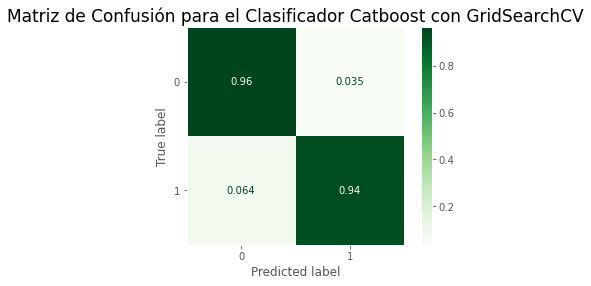

__________________________________________________________________


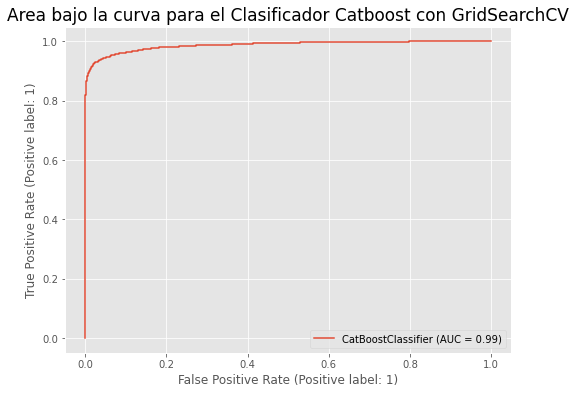

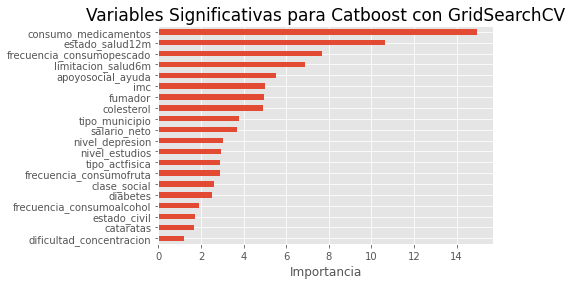

In [90]:
# Evaluación del modelo
pf.evaluate_model(cat_gridmodel, X_train, X_test, y_test, 
               title='Catboost con GridSearchCV', tree=True)

### 6.- Minería de Datos

Una vez ejecutados los 9 algoritmos de clasificación en su versión por defecto, y analizando su rendimiento con una parrilla de estimados, se debe escoger que estrategia tomar para la selección de un modelo definitivo que nos permita buscar patrones de predicción en la ansiedad y la depresión.

Para ello seleccionaremos los tres modelos que mejor rendimiento han ofrecido, tomando en cuenta los siguientes supuestos:

* __Mayor precisión__ en los valores del conjunto de datos correctamente clasificados…
* __Sensibilidad (recall)__ en la clasificación de cada clase; es importante tener en cuenta que un falso negativo puede ocasionar que un individuo presenta la enfermedad (1), pero que el modelo indique que no (0). Por ello este ratio debe ser el mas bajo posible.
* __Ratio alto en el AUC__, para asegurar que el modelo predice mas verdaderos positivos, que falsos positivos.

#### 6.1- Comparación de métricas

In [91]:
clasificador = {"Regresión Logística":logreg_clf,
                "Regresión Logística Grid":logreg_grid2,
                "Arbol de Decisión": tree_clf,
                "Arbol de Decisión Grid ": tree_grid2,
                "Random Forest": forest_clf,
                "Random Forest Grid": forest_grid2,
                "SVM": svm_clf,
                "SVM Grid": svm_grid2,
                "Naive Bayes": gnb_clf,
                "Naive Bayes Grid": nb_grid2,
                "Xgboost": xgb_clf,
                "Xgboost Grid": xgb_grid2,
                "CatBoost": cat_clf,
                "CatBoost Grid": cat_grid2,
                "Extra Trees": extratrees_clf,
                "Extra Trees Grid": extratrees_grid2,
                "SGD": sgd_clf,
                "SGD Grid": sgd_grid2
               }

In [92]:
#Precisión
from sklearn.metrics import accuracy_score

for nombre,clasf in clasificador.items():
    accuracy_clf= accuracy_score(y_true = y_test,
                                 y_pred = clasf.predict(X_test)
                                )

    acc_test = round(accuracy_clf,3)
    print("La precisión para el Modelo - %s" % nombre, "es: %s" %acc_test)

La precisión para el Modelo - Regresión Logística es: 0.799
La precisión para el Modelo - Regresión Logística Grid es: 0.799
La precisión para el Modelo - Arbol de Decisión es: 0.921
La precisión para el Modelo - Arbol de Decisión Grid  es: 0.844
La precisión para el Modelo - Random Forest es: 0.959
La precisión para el Modelo - Random Forest Grid es: 0.959
La precisión para el Modelo - SVM es: 0.822
La precisión para el Modelo - SVM Grid es: 0.964
La precisión para el Modelo - Naive Bayes es: 0.767
La precisión para el Modelo - Naive Bayes Grid es: 0.767
La precisión para el Modelo - Xgboost es: 0.948
La precisión para el Modelo - Xgboost Grid es: 0.955
La precisión para el Modelo - CatBoost es: 0.956
La precisión para el Modelo - CatBoost Grid es: 0.95
La precisión para el Modelo - Extra Trees es: 0.975
La precisión para el Modelo - Extra Trees Grid es: 0.962
La precisión para el Modelo - SGD es: 0.796
La precisión para el Modelo - SGD Grid es: 0.801


In [93]:
#Recall
from sklearn.metrics import recall_score

for nombre,clasf in clasificador.items():
    recall_clf = recall_score(y_true = y_test,
                              y_pred = clasf.predict(X_test),
                              average = None
                             )
    clase0 = round(recall_clf[0],3)
    clase1 = round(recall_clf[1],3)
    
    print("El recall para el Modelo - %s" % nombre, "es:", "[0] %s" % clase0, "[1] %s" % clase1)

El recall para el Modelo - Regresión Logística es: [0] 0.818 [1] 0.78
El recall para el Modelo - Regresión Logística Grid es: [0] 0.818 [1] 0.78
El recall para el Modelo - Arbol de Decisión es: [0] 0.915 [1] 0.926
El recall para el Modelo - Arbol de Decisión Grid  es: [0] 0.823 [1] 0.866
El recall para el Modelo - Random Forest es: [0] 0.969 [1] 0.948
El recall para el Modelo - Random Forest Grid es: [0] 0.969 [1] 0.948
El recall para el Modelo - SVM es: [0] 0.853 [1] 0.791
El recall para el Modelo - SVM Grid es: [0] 0.937 [1] 0.991
El recall para el Modelo - Naive Bayes es: [0] 0.79 [1] 0.744
El recall para el Modelo - Naive Bayes Grid es: [0] 0.79 [1] 0.744
El recall para el Modelo - Xgboost es: [0] 0.963 [1] 0.933
El recall para el Modelo - Xgboost Grid es: [0] 0.975 [1] 0.934
El recall para el Modelo - CatBoost es: [0] 0.979 [1] 0.932
El recall para el Modelo - CatBoost Grid es: [0] 0.965 [1] 0.936
El recall para el Modelo - Extra Trees es: [0] 0.959 [1] 0.99
El recall para el Mode

#### 6.2- Evaluación del modelo final

Como se puede observar en las gráficas y valores anteriores, hay cuatro modelos que no aportan la precisión ni la sensibilidad adecuada para la detección de este tipo de enfermedades; ellos son: Regresión Logística, Arboles de Decisión, Naive Bayes y SGD.

Pero por otro lado los algoritmos basados en conjunto de modelos (ensembles) y Support Vector Machine, si ofrecen unas métricas adecuadas al objetivo del estudio.

De hecho, los algoritmos SVM y XgBoost mejoran notablemente con la selección adecuada de estimadores.

De todos estos, el que mejor rendimiento presentó fue el clasificador Extra Tree. Por lo que para tomar una desición final; vamos a construir un stack de clasificadores con Random Forest, SVM y Xgboost y comparamos si en conjunto mejoran las métricas del Extra Tree.


In [94]:
estimators_grid = [
                    ('forest', forest_gridmodel),
                    ('svm', svm_gridmodel),
                    ('xgboost', xgb_gridmodel),  
                  ]
estimators_grid

[('forest', RandomForestClassifier(random_state=123)),
 ('svm', NuSVC(nu=0.125, random_state=123)),
 ('xgboost',
  XGBClassifier(max_depth=10, n_jobs=-1, random_state=123, subsample=0.3))]

In [95]:
# Cración del clasificador stack
stack_grid = StackingClassifier(estimators=estimators_grid, 
                                n_jobs=-1, 
                                passthrough=True,
                                final_estimator=LogisticRegression(random_state=rmst, n_jobs=-1))
stack_grid

StackingClassifier(estimators=[('forest',
                                RandomForestClassifier(random_state=123)),
                               ('svm', NuSVC(nu=0.125, random_state=123)),
                               ('xgboost',
                                XGBClassifier(max_depth=10, n_jobs=-1,
                                              random_state=123,
                                              subsample=0.3))],
                   final_estimator=LogisticRegression(n_jobs=-1,
                                                      random_state=123),
                   n_jobs=-1, passthrough=True)

In [96]:
# Entrenamiento del modelo stack
stackgrid_model = stack_grid.fit(X_train, y_train)

__________________________________________________________________
Reporte para el Clasificador: 
	Stacked Model
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.97      0.98      0.98      3992
           1       0.98      0.97      0.98      3991

    accuracy                           0.98      7983
   macro avg       0.98      0.98      0.98      7983
weighted avg       0.98      0.98      0.98      7983

__________________________________________________________________


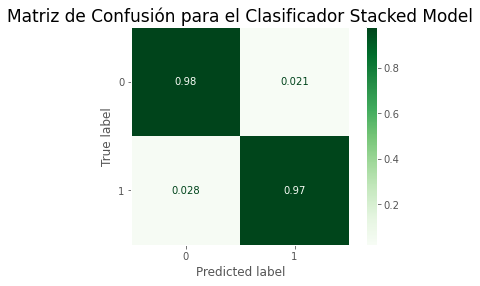

__________________________________________________________________


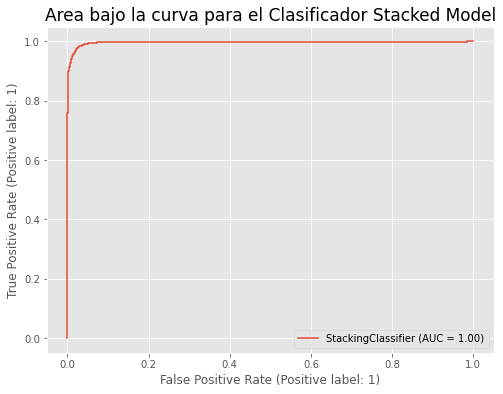

In [97]:
# Evaluación del modelo stack
pf.evaluate_model(stackgrid_model, X_train, X_test, y_test, 
               title='Stacked Model')

In [98]:
#Matriz de confusión del Stack
y_pred = extratrees_gridmodel.predict(X_test)
conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred)
print('Confusion matrix:\n', conf_mat)

Confusion matrix:
 [[3746  246]
 [  54 3937]]


In [99]:
#Matriz de confusión del Stack
y_pred = stackgrid_model.predict(X_test)
conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred)
print('Confusion matrix:\n', conf_mat)

Confusion matrix:
 [[3907   85]
 [ 110 3881]]


Como se puede observar el rendimiento y resultado de las métricas entre el Stack Classifier y el Extra Tree Classifier son mínimas, por lo que podemos considerar que ambas aproximaciones son correctas.

Pero si ilustramos el número de casos que se han clasificado como falsos negativos, un dato muy sensible a la valoración de enfermedades, nos decantamos por usar el __Modelo Simple con Clasificador Extra Tree__.

A nivel de velocidad de convergencia, el Extra Tree de por sí es un método más rápido que el usar estimadores en stack, algo a considerar en trabajos futuros si se añaden conjunto de datos con mayor número de instancias.

Dicho esto, esta es la evaluación del modelo escogido:

__________________________________________________________________
Reporte para el Clasificador: 
	Extra Trees con GridSearch CV
__________________________________________________________________


              precision    recall  f1-score   support

           0       0.99      0.94      0.96      3992
           1       0.94      0.99      0.96      3991

    accuracy                           0.96      7983
   macro avg       0.96      0.96      0.96      7983
weighted avg       0.96      0.96      0.96      7983

__________________________________________________________________


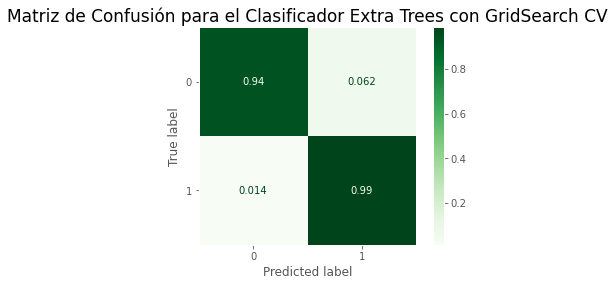

__________________________________________________________________


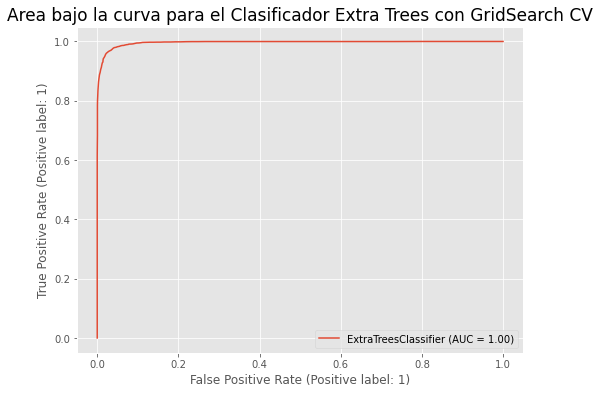

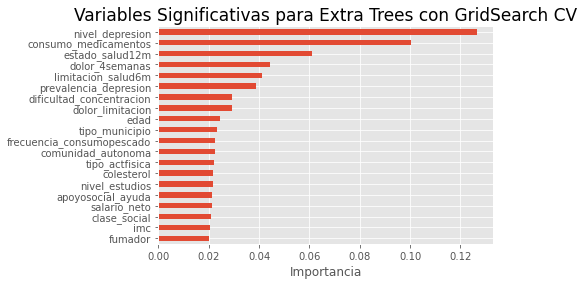

In [100]:
# Evaluación del modelo
pf.evaluate_model(extratrees_gridmodel, X_train, X_test, y_test, 
               tree=True, title='Extra Trees con GridSearch CV')

Con el uso de la herramienta PowerBI, se ilustrarán las tendencias de la variables significativas del modelo y su relación con la ansiedad y al depresión.

In [101]:
fin = datetime.now()
print("Fecha y hora de inicio =", inicio)
print("Fecha y hora de finalización =", fin)

Fecha y hora de inicio = 2022-09-03 00:58:15.497625
Fecha y hora de finalización = 2022-09-03 05:29:00.292373
29:	learn: 0.4565896	total: 12.3s	remaining: 28.6s
30:	learn: 0.4508175	total: 12.8s	remaining: 28.4s
31:	learn: 0.4456263	total: 13.3s	remaining: 28.2s
32:	learn: 0.4400336	total: 13.8s	remaining: 28s
33:	learn: 0.4352143	total: 14.3s	remaining: 27.7s
34:	learn: 0.4312083	total: 14.7s	remaining: 27.3s
35:	learn: 0.4266462	total: 15.1s	remaining: 26.8s
36:	learn: 0.4217051	total: 15.5s	remaining: 26.4s
37:	learn: 0.4176675	total: 16s	remaining: 26.1s
38:	learn: 0.4132050	total: 16.3s	remaining: 25.6s
39:	learn: 0.4085446	total: 16.7s	remaining: 25.1s
40:	learn: 0.4040592	total: 17.1s	remaining: 24.7s
41:	learn: 0.4002719	total: 17.4s	remaining: 24.1s
42:	learn: 0.3954684	total: 17.8s	remaining: 23.6s
43:	learn: 0.3915020	total: 18.2s	remaining: 23.2s
44:	learn: 0.3880041	total: 18.6s	remaining: 22.7s
45:	learn: 0.3839738	total: 19.1s	remaining: 22.4s
46:	learn: 0.3807438	total:

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been d

8:	learn: 0.4761698	total: 4.15s	remaining: 37.3s
9:	learn: 0.4618981	total: 4.56s	remaining: 36.5s
10:	learn: 0.4491070	total: 4.86s	remaining: 34.9s
11:	learn: 0.4322668	total: 5.21s	remaining: 33.9s
12:	learn: 0.4188076	total: 5.67s	remaining: 33.6s
13:	learn: 0.4058994	total: 6.03s	remaining: 32.7s
14:	learn: 0.3938455	total: 6.57s	remaining: 32.8s
15:	learn: 0.3819906	total: 7.03s	remaining: 32.5s
16:	learn: 0.3710830	total: 7.62s	remaining: 32.7s
17:	learn: 0.3631927	total: 8.11s	remaining: 32.4s
18:	learn: 0.3521711	total: 8.51s	remaining: 31.8s
19:	learn: 0.3429171	total: 9.06s	remaining: 31.7s
20:	learn: 0.3361710	total: 9.49s	remaining: 31.2s
21:	learn: 0.3272625	total: 9.93s	remaining: 30.7s
22:	learn: 0.3191649	total: 10.4s	remaining: 30.4s
23:	learn: 0.3127487	total: 10.9s	remaining: 30s
24:	learn: 0.3055333	total: 11.5s	remaining: 29.8s
25:	learn: 0.3003242	total: 11.9s	remaining: 29.3s
26:	learn: 0.2939250	total: 12.3s	remaining: 28.8s
27:	learn: 0.2877585	total: 12.7s	r

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been d

35:	learn: 0.2487709	total: 14.4s	remaining: 21.6s
36:	learn: 0.2445841	total: 14.8s	remaining: 21.2s
37:	learn: 0.2410897	total: 15.1s	remaining: 20.7s
38:	learn: 0.2375348	total: 15.4s	remaining: 20.2s
39:	learn: 0.2341982	total: 15.8s	remaining: 19.8s
40:	learn: 0.2319428	total: 16.2s	remaining: 19.3s
41:	learn: 0.2283626	total: 16.5s	remaining: 18.8s
42:	learn: 0.2247215	total: 16.9s	remaining: 18.4s
43:	learn: 0.2223539	total: 17.2s	remaining: 18s
44:	learn: 0.2196753	total: 17.5s	remaining: 17.5s
45:	learn: 0.2175172	total: 17.7s	remaining: 16.9s
46:	learn: 0.2153733	total: 18.1s	remaining: 16.5s
47:	learn: 0.2130565	total: 18.5s	remaining: 16.2s
48:	learn: 0.2099124	total: 18.8s	remaining: 15.7s
49:	learn: 0.2069421	total: 19.5s	remaining: 15.6s
50:	learn: 0.2042205	total: 19.8s	remaining: 15.2s
51:	learn: 0.2021629	total: 20.3s	remaining: 14.8s
52:	learn: 0.2006615	total: 20.7s	remaining: 14.4s
53:	learn: 0.1982185	total: 21s	remaining: 14s
54:	learn: 0.1958142	total: 21.4s	rem

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been d

30:	learn: 0.4558840	total: 13.4s	remaining: 25.5s
31:	learn: 0.4506770	total: 13.8s	remaining: 24.9s
32:	learn: 0.4451312	total: 14s	remaining: 24.3s
33:	learn: 0.4404807	total: 14.5s	remaining: 23.8s
34:	learn: 0.4359578	total: 14.9s	remaining: 23.4s
35:	learn: 0.4316942	total: 15.2s	remaining: 22.8s
36:	learn: 0.4267362	total: 15.6s	remaining: 22.3s
37:	learn: 0.4230108	total: 15.9s	remaining: 21.8s
38:	learn: 0.4183690	total: 16.2s	remaining: 21.2s
39:	learn: 0.4135893	total: 16.6s	remaining: 20.8s
40:	learn: 0.4087781	total: 17s	remaining: 20.4s
41:	learn: 0.4052162	total: 17.4s	remaining: 19.8s
42:	learn: 0.4012705	total: 17.8s	remaining: 19.5s
43:	learn: 0.3975453	total: 18.4s	remaining: 19.3s
44:	learn: 0.3939219	total: 18.8s	remaining: 18.8s
45:	learn: 0.3903007	total: 19.2s	remaining: 18.4s
46:	learn: 0.3864769	total: 19.5s	remaining: 17.9s
47:	learn: 0.3836603	total: 20s	remaining: 17.5s
48:	learn: 0.3794823	total: 20.6s	remaining: 17.2s
49:	learn: 0.3754786	total: 21s	remai

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been d

98:	learn: 0.2593086	total: 36.9s	remaining: 373ms
99:	learn: 0.2575681	total: 37.1s	remaining: 0us
0:	learn: 0.6599145	total: 279ms	remaining: 27.6s
1:	learn: 0.6267381	total: 763ms	remaining: 37.4s
2:	learn: 0.5983617	total: 974ms	remaining: 31.5s
3:	learn: 0.5738710	total: 1.39s	remaining: 33.4s
4:	learn: 0.5494130	total: 1.91s	remaining: 36.3s
5:	learn: 0.5275106	total: 2.28s	remaining: 35.7s
6:	learn: 0.5074837	total: 2.79s	remaining: 37s
7:	learn: 0.4905383	total: 3.19s	remaining: 36.6s
8:	learn: 0.4719418	total: 3.41s	remaining: 34.5s
9:	learn: 0.4534081	total: 3.77s	remaining: 33.9s
10:	learn: 0.4392815	total: 4.19s	remaining: 33.9s
11:	learn: 0.4229773	total: 4.56s	remaining: 33.4s
12:	learn: 0.4097059	total: 4.92s	remaining: 32.9s
13:	learn: 0.3970237	total: 5.2s	remaining: 31.9s
14:	learn: 0.3849479	total: 5.5s	remaining: 31.1s
15:	learn: 0.3726499	total: 5.84s	remaining: 30.6s
16:	learn: 0.3608185	total: 6.12s	remaining: 29.9s
17:	learn: 0.3535616	total: 6.41s	remaining: 29

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been d

80:	learn: 0.2895550	total: 34.6s	remaining: 3.84s
81:	learn: 0.2870161	total: 34.8s	remaining: 3.4s
82:	learn: 0.2853865	total: 35.2s	remaining: 2.97s
83:	learn: 0.2836942	total: 35.6s	remaining: 2.54s
84:	learn: 0.2818777	total: 35.9s	remaining: 2.11s
85:	learn: 0.2802890	total: 36.3s	remaining: 1.69s
86:	learn: 0.2789729	total: 36.6s	remaining: 1.26s
87:	learn: 0.2772044	total: 37s	remaining: 842ms
88:	learn: 0.2749722	total: 37.4s	remaining: 420ms
89:	learn: 0.2732407	total: 37.7s	remaining: 0us
0:	learn: 0.6736006	total: 487ms	remaining: 43.4s
1:	learn: 0.6521658	total: 881ms	remaining: 38.8s
2:	learn: 0.6326936	total: 1.4s	remaining: 40.6s
3:	learn: 0.6142070	total: 1.78s	remaining: 38.2s
4:	learn: 0.5962130	total: 2.21s	remaining: 37.6s
5:	learn: 0.5775212	total: 2.64s	remaining: 37s
6:	learn: 0.5607810	total: 3.07s	remaining: 36.4s
7:	learn: 0.5450047	total: 3.5s	remaining: 35.8s
8:	learn: 0.5305124	total: 4.13s	remaining: 37.2s
9:	learn: 0.5178114	total: 4.51s	remaining: 36.1s

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1153: UserWarning: 'n_jobs' > 1 does not 

18:	learn: 0.4214602	total: 7.44s	remaining: 31.7s
19:	learn: 0.4135304	total: 7.82s	remaining: 31.3s
20:	learn: 0.4055637	total: 8.17s	remaining: 30.7s
21:	learn: 0.3965772	total: 8.6s	remaining: 30.5s
22:	learn: 0.3894016	total: 8.99s	remaining: 30.1s
23:	learn: 0.3830414	total: 9.43s	remaining: 29.9s
24:	learn: 0.3754523	total: 9.76s	remaining: 29.3s
25:	learn: 0.3686607	total: 10.3s	remaining: 29.2s
26:	learn: 0.3617296	total: 10.7s	remaining: 28.9s
27:	learn: 0.3543954	total: 11.3s	remaining: 29s
28:	learn: 0.3457083	total: 11.8s	remaining: 28.8s
29:	learn: 0.3407622	total: 12.2s	remaining: 28.4s
30:	learn: 0.3360565	total: 12.6s	remaining: 28s
31:	learn: 0.3302000	total: 13s	remaining: 27.6s
32:	learn: 0.3242303	total: 13.5s	remaining: 27.4s
33:	learn: 0.3191755	total: 13.8s	remaining: 26.8s
34:	learn: 0.3151373	total: 14.2s	remaining: 26.3s
35:	learn: 0.3107866	total: 14.5s	remaining: 25.8s
36:	learn: 0.3060290	total: 14.9s	remaining: 25.3s
37:	learn: 0.3026594	total: 15.3s	rema

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been d

50:	learn: 0.2580870	total: 22.9s	remaining: 17.5s
51:	learn: 0.2551025	total: 23.4s	remaining: 17.1s
52:	learn: 0.2526569	total: 23.8s	remaining: 16.6s
53:	learn: 0.2495853	total: 24.3s	remaining: 16.2s
54:	learn: 0.2467743	total: 24.8s	remaining: 15.8s
55:	learn: 0.2441529	total: 25.3s	remaining: 15.4s
56:	learn: 0.2416705	total: 25.8s	remaining: 14.9s
57:	learn: 0.2390193	total: 26.2s	remaining: 14.5s
58:	learn: 0.2372950	total: 26.7s	remaining: 14s
59:	learn: 0.2347535	total: 27s	remaining: 13.5s
60:	learn: 0.2325887	total: 27.3s	remaining: 13s
61:	learn: 0.2296142	total: 27.7s	remaining: 12.5s
62:	learn: 0.2279793	total: 28.1s	remaining: 12s
63:	learn: 0.2263801	total: 28.4s	remaining: 11.5s
64:	learn: 0.2239078	total: 28.9s	remaining: 11.1s
65:	learn: 0.2221903	total: 29.2s	remaining: 10.6s
66:	learn: 0.2206351	total: 29.6s	remaining: 10.2s
67:	learn: 0.2190291	total: 30s	remaining: 9.71s
68:	learn: 0.2175485	total: 30.4s	remaining: 9.25s
69:	learn: 0.2164788	total: 30.7s	remaini

/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/env_1/lib/python3.8/site-packages/sklearn/tree/_classes.py:298: FutureWarning: `max_features='auto'` has been d